In [2]:
# Importing Pandas library for saving data in a dataframe and exporting it in csv file
import pandas as pd

# Importing requests, it's a Python HTTP library for making HTTP requests
import requests

# Importing JSON library to save retrieved data in json format
import json

In [3]:
api_key =''
video_Id= 'K26_sDKnvMU'
url = f"https://www.googleapis.com/youtube/v3/videos?part=statistics,snippet&key={api_key}&id={video_Id}"
data = json.loads(requests.get(url).text)
print(data)

{'kind': 'youtube#videoListResponse', 'etag': '1SxmkJxDkICRIp9T8oi28FHmR2Q', 'items': [{'kind': 'youtube#video', 'etag': 'lx36eEdoAujuHHcvXD2Zf15V2IY', 'id': 'K26_sDKnvMU', 'snippet': {'publishedAt': '2015-05-26T17:11:42Z', 'channelId': 'UC1o_r-f-ZG-x6U9c6MfUfHQ', 'title': 'Toy Story (1995) Trailer 2 (VHS Capture)', 'description': 'Trailer for Toy Story (1995) captured from the The Santa Clause (1994) VHS tape. This tape is labeled 3633 and released in (1994).', 'thumbnails': {'default': {'url': 'https://i.ytimg.com/vi/K26_sDKnvMU/default.jpg', 'width': 120, 'height': 90}, 'medium': {'url': 'https://i.ytimg.com/vi/K26_sDKnvMU/mqdefault.jpg', 'width': 320, 'height': 180}, 'high': {'url': 'https://i.ytimg.com/vi/K26_sDKnvMU/hqdefault.jpg', 'width': 480, 'height': 360}, 'standard': {'url': 'https://i.ytimg.com/vi/K26_sDKnvMU/sddefault.jpg', 'width': 640, 'height': 480}}, 'channelTitle': 'retro VHS trailers', 'tags': ['1995', 'Capture', 'promo', 'preview', 'teaser', 'trailer', 'vhs', 'vcr'

In [3]:
#Trial using one video_Id
video_Id= 'K26_sDKnvMU'
url = f"https://www.googleapis.com/youtube/v3/videos?part=statistics,snippet&key={api_key}&id={video_Id}"
data = json.loads(requests.get(url).text)
print(data)
#channel_id = data['items'][0]['snippet']['channelId']      
published_date = data['items'][0]['snippet']['publishedAt']    
video_title =  data['items'][0]['snippet']['title']     
video_description = data['items'][0]['snippet']['description']
if "likeCount" in data["items"][0]["statistics"]:
    likes =  data["items"][0]["statistics"]["likeCount"]
else:
    likes='NA'
print("The number of likes=",likes)
dislikes = data["items"][0]["statistics"]["dislikeCount"]
print("The number of dislikes=",dislikes)
views = data["items"][0]["statistics"]["viewCount"]
print("The number of views=",views)
comment_count = data["items"][0]["statistics"]['commentCount']
print("The number of comments=",comment_count)
favoriteCount = data["items"][0]["statistics"]["favoriteCount"]
print("favoriteCount=",favoriteCount)

{'kind': 'youtube#videoListResponse', 'etag': '0cx0CtmqKxvxlKGX3b4Awj5pAOY', 'items': [{'kind': 'youtube#video', 'etag': 'SGy8DOw0N535Du8ioA-muEKoz-k', 'id': 'K26_sDKnvMU', 'snippet': {'publishedAt': '2015-05-26T17:11:42Z', 'channelId': 'UC1o_r-f-ZG-x6U9c6MfUfHQ', 'title': 'Toy Story (1995) Trailer 2 (VHS Capture)', 'description': 'Trailer for Toy Story (1995) captured from the The Santa Clause (1994) VHS tape. This tape is labeled 3633 and released in (1994).', 'thumbnails': {'default': {'url': 'https://i.ytimg.com/vi/K26_sDKnvMU/default.jpg', 'width': 120, 'height': 90}, 'medium': {'url': 'https://i.ytimg.com/vi/K26_sDKnvMU/mqdefault.jpg', 'width': 320, 'height': 180}, 'high': {'url': 'https://i.ytimg.com/vi/K26_sDKnvMU/hqdefault.jpg', 'width': 480, 'height': 360}, 'standard': {'url': 'https://i.ytimg.com/vi/K26_sDKnvMU/sddefault.jpg', 'width': 640, 'height': 480}}, 'channelTitle': 'retro VHS trailers', 'tags': ['1995', 'Capture', 'promo', 'preview', 'teaser', 'trailer', 'vhs', 'vcr'

In [4]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Importing the videolinks


In [5]:
videolinks_data=pd.read_csv("vdoLinks.csv")
videolinks_data.head(5)

,youtubeId,movieId,title
0,K26_sDKnvMU,1,Toy Story (1995)
1,3LPANjHlPxo,2,Jumanji (1995)
2,rEnOoWs3FuA,3,Grumpier Old Men (1995)
3,j9xml1CxgXI,4,Waiting to Exhale (1995)
4,ltwvKLnj1B4,5,Father of the Bride Part II (1995)


In [6]:
videolinks_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25623 entries, 0 to 25622
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   youtubeId  25623 non-null  object
 1   movieId    25623 non-null  int64 
 2   title      25623 non-null  object
dtypes: int64(1), object(2)
memory usage: 600.7+ KB


In [8]:
# checking for missing values
videolinks_data.isnull().sum()

youtubeId    0
movieId      0
title        0
dtype: int64

In [7]:
videolinks_data.shape

(25623, 3)

In [31]:
from pandas_profiling import ProfileReport
profile = ProfileReport(videolinks_data, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/16 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Extraction of Youtube videos and Exploratory Analysis 

In [8]:
!pip install python-youtube

In [9]:

import csv
import json
import time
from pyyoutube import Api
apiKey =''
api = Api(api_key=apiKey)
with open(r'C:\\Users\\rinuj\\vdoLinks.csv', encoding='utf-8') as csv_file:
    with open(r'youtube_video.csv', 'a', encoding='utf-8',errors='ignore') as outfile:
        writer = csv.writer(outfile)
        csv_reader = csv.reader(csv_file, delimiter=',')
        next(csv_reader, None)  
        for row in csv_reader:
            if int(row[1]) > 1134:
                print(row)
                video_by_id = api.get_video_by_id(video_id=row[0])
                new_row=[]
                
                new_row.append(row[0])
                try:
                    video_by_id=json.loads(video_by_id.to_json())["items"][0]
                    print(row[0])
                    new_row=[]
                    #empty_row.append(row[0])
                    #new_row.append(empty_row)
                    new_row.append(video_by_id['snippet']['title']) 
                    new_row.append(video_by_id["snippet"]["description"])
                    new_row.append(video_by_id["statistics"]["viewCount"])
                    new_row.append(video_by_id["statistics"]["likeCount"])
                    new_row.append(video_by_id["statistics"]["dislikeCount"])
                    new_row.append(video_by_id["statistics"]["commentCount"])
                    new_row.append(video_by_id["statistics"]["favoriteCount"])
                    new_row.append(video_by_id["contentDetails"]["duration"])
                except Exception as e:
                    print(f"error at {row[0]}")
                writer.writerow(new_row)
               

            
            

['co-VZiZNHfU', '1135', 'Private Benjamin (1980)']
co-VZiZNHfU
error at co-VZiZNHfU
['RDM75-oXGmQ', '1136', 'Monty Python and the Holy Grail (1975)']
RDM75-oXGmQ
error at RDM75-oXGmQ
['_ZsZTZh981Q', '1137', 'Hustler White (1996)']
_ZsZTZh981Q
error at _ZsZTZh981Q
['#NAME?', '1138', 'Dadetown (1995)']
error at #NAME?
['7jkK6KzNMss', '1139', 'Everything Relative (1996)']
error at 7jkK6KzNMss
['vblgJ-8eY9o', '1140', 'Entertaining Angels: The Dorothy Day Story (1996)']
vblgJ-8eY9o
error at vblgJ-8eY9o
['XWSkNhObf_U', '1142', 'Get Over It (1996)']
XWSkNhObf_U
error at XWSkNhObf_U
['SNa5nxKE-Ek', '1144', 'Line King: The Al Hirschfeld Story, The (1996)']
error at SNa5nxKE-Ek
['6ZDA6hCrJro', '1145', 'Snowriders (1996)']
6ZDA6hCrJro
error at 6ZDA6hCrJro
['3PKdL1doie8', '1146', "Curtis's Charm (1995)"]
error at 3PKdL1doie8
['IfUHYUpmTFs', '1147', 'When We Were Kings (1996)']
error at IfUHYUpmTFs
['17Q2qtozj8U', '1148', 'Wallace & Gromit: The Wrong Trousers (1993)']
error at 17Q2qtozj8U
['OdgNq09

C:\Users\rinuj\anaconda3\lib\site-packages\dataclasses_json\core.py:171: RuntimeWarning: `NoneType` object value of non-optional type allowed detected when decoding RegionRestriction.
  warnings.warn(f"`NoneType` object {warning}.", RuntimeWarning)


OobLM9z3PLQ
error at OobLM9z3PLQ
['BTPZn-T3wZE', '1161', 'Tin Drum, The (Blechtrommel, Die) (1979)']
BTPZn-T3wZE
error at BTPZn-T3wZE
['hvBsk_jJ7j0', '1162', 'Ruling Class, The (1972)']
hvBsk_jJ7j0
error at hvBsk_jJ7j0
['NpY2QcnH5D8', '1163', 'Mina Tannenbaum (1994)']
NpY2QcnH5D8
error at NpY2QcnH5D8
['e4LWwhFJoUw', '1164', "2 ou 3 choses que je sais d'elle (2 or 3 Things I Know About Her) (1967)"]
error at e4LWwhFJoUw
['0vInmqLEoWA', '1165', 'Bloody Child, The (1996)']
0vInmqLEoWA
error at 0vInmqLEoWA
['dpRcsptevo8', '1166', 'Farmer & Chase (1997)']
error at dpRcsptevo8
['FF6ACpmRYc8', '1167', 'Dear God (1996)']
error at FF6ACpmRYc8
['R8mK-_EPxdk', '1168', 'Bad Moon (1996)']
R8mK-_EPxdk
error at R8mK-_EPxdk
['iIeZ0Xh_aMk', '1169', 'American Dream (1990)']
error at iIeZ0Xh_aMk
['6JJJpQbudp8', '1170', 'Best of the Best 3: No Turning Back (1995)']
error at 6JJJpQbudp8
['yRpWaJRyVQo', '1171', 'Bob Roberts (1992)']
yRpWaJRyVQo
error at yRpWaJRyVQo
['C2-GX0Tltgw', '1172', 'Cinema Paradiso (

KCzXJWYB2-g
error at KCzXJWYB2-g
['r9Q_WESQUVw', '1262', 'Great Escape, The (1963)']
r9Q_WESQUVw
error at r9Q_WESQUVw
['SKHZ5-JThFE', '1263', 'Deer Hunter, The (1978)']
SKHZ5-JThFE
error at SKHZ5-JThFE
['Lugx0xX2G54', '1264', 'Diva (1981)']
Lugx0xX2G54
error at Lugx0xX2G54
['tSVeDx9fk60', '1265', 'Groundhog Day (1993)']
tSVeDx9fk60
error at tSVeDx9fk60
['yGQm50DTOVk', '1266', 'Unforgiven (1992)']
yGQm50DTOVk
error at yGQm50DTOVk
['tgCyowLRfvA', '1267', 'Manchurian Candidate, The (1962)']
tgCyowLRfvA
error at tgCyowLRfvA
['MuhHPQxS2nQ', '1268', 'Pump Up the Volume (1990)']
MuhHPQxS2nQ
error at MuhHPQxS2nQ
['GCWBDwkhGN0', '1269', 'Arsenic and Old Lace (1944)']
GCWBDwkhGN0
error at GCWBDwkhGN0
['AM28GvL8oCM', '1270', 'Back to the Future (1985)']
AM28GvL8oCM
error at AM28GvL8oCM
['o5hb5mc-dfI', '1271', 'Fried Green Tomatoes (1991)']
o5hb5mc-dfI
error at o5hb5mc-dfI
['g-0dTpzNzwo', '1272', 'Patton (1970)']
g-0dTpzNzwo
error at g-0dTpzNzwo
['fS6Id_TJc6E', '1273', 'Down by Law (1986)']
fS6Id_

XBJD-lxh078
error at XBJD-lxh078
['MMcBEOvxXj4', '1369', "I Can't Sleep (J'ai pas sommeil) (1994)"]
MMcBEOvxXj4
error at MMcBEOvxXj4
['RbcRO1uosiI', '1370', 'Die Hard 2 (1990)']
RbcRO1uosiI
error at RbcRO1uosiI
['g0-7Z2lYII8', '1371', 'Star Trek: The Motion Picture (1979)']
g0-7Z2lYII8
error at g0-7Z2lYII8
['Apv2Bc3bt6w', '1372', 'Star Trek VI: The Undiscovered Country (1991)']
Apv2Bc3bt6w
error at Apv2Bc3bt6w
['8TB5J_sbCbE', '1373', 'Star Trek V: The Final Frontier (1989)']
8TB5J_sbCbE
error at 8TB5J_sbCbE
['vOIYaRb6XpQ', '1374', 'Star Trek II: The Wrath of Khan (1982)']
vOIYaRb6XpQ
error at vOIYaRb6XpQ
['iTJs0Ballqs', '1375', 'Star Trek III: The Search for Spock (1984)']
iTJs0Ballqs
error at iTJs0Ballqs
['x0R9gC6v_h8', '1376', 'Star Trek IV: The Voyage Home (1986)']
x0R9gC6v_h8
error at x0R9gC6v_h8
['YlTfanv7vE0', '1377', 'Batman Returns (1992)']
error at YlTfanv7vE0
['yp8hqVS6nq4', '1378', 'Young Guns (1988)']
error at yp8hqVS6nq4
['r-FmfxLy7fo', '1379', 'Young Guns II (1990)']
r-Fm

xNMoQ_Cqt4E
error at xNMoQ_Cqt4E
['F4JOxijD1ts', '1479', 'Saint, The (1997)']
F4JOxijD1ts
error at F4JOxijD1ts
['62bq98cZNUc', '1480', "Smilla's Sense of Snow (1997)"]
62bq98cZNUc
error at 62bq98cZNUc
['1DYgWYYHZQ8', '1482', 'Van, The (1996)']
error at 1DYgWYYHZQ8
['vZTYkmAcsvk', '1483', 'Crash (1996)']
vZTYkmAcsvk
error at vZTYkmAcsvk
['oK7YDkwSud8', '1484', 'Daytrippers, The (1996)']
oK7YDkwSud8
error at oK7YDkwSud8
['C1no75lpOiw', '1485', 'Liar Liar (1997)']
C1no75lpOiw
error at C1no75lpOiw
['5w8l3lLXLGU', '1486', 'Quiet Room, The (1996)']
error at 5w8l3lLXLGU
['14gyU53hMJk', '1487', 'Selena (1997)']
14gyU53hMJk
error at 14gyU53hMJk
['RozG2ejdeh8', '1488', "Devil's Own, The (1997)"]
RozG2ejdeh8
error at RozG2ejdeh8
['J4SLVwTzjGI', '1489', "Cats Don't Dance (1997)"]
J4SLVwTzjGI
error at J4SLVwTzjGI
['cHPpnwYVV8s', '1490', 'B*A*P*S (1997)']
cHPpnwYVV8s
error at cHPpnwYVV8s
['BScnohmeLBY', '1493', 'Love and Other Catastrophes (1996)']
BScnohmeLBY
error at BScnohmeLBY
['NA8LYE7afBM', '1

C:\Users\rinuj\anaconda3\lib\site-packages\dataclasses_json\core.py:171: RuntimeWarning: `NoneType` object value of non-optional type blocked detected when decoding RegionRestriction.
  warnings.warn(f"`NoneType` object {warning}.", RuntimeWarning)


yL7okbGR5Uw
error at yL7okbGR5Uw
['h8T9ng5sZ08', '1531', 'Losing Chase (1996)']
h8T9ng5sZ08
error at h8T9ng5sZ08
['E9nUpeIX7Do', '1532', 'Sprung (1997)']
E9nUpeIX7Do
error at E9nUpeIX7Do
['OsOi17HJZ5k', '1533', 'Promise, The (La promesse) (1996)']
OsOi17HJZ5k
error at OsOi17HJZ5k
['feXArfGm6C8', '1534', 'Bonheur, Le (1965)']
feXArfGm6C8
error at feXArfGm6C8
['VBZ_z7rYBkk', '1535', 'Love! Valour! Compassion! (1997)']
VBZ_z7rYBkk
error at VBZ_z7rYBkk
['9rcecBuySJ4', '1537', 'Shall We Dance? (Shall We Dansu?) (1996)']
9rcecBuySJ4
error at 9rcecBuySJ4
['1VsOzczrWFY', '1538', 'Second Jungle Book: Mowgli & Baloo, The (1997)']
1VsOzczrWFY
error at 1VsOzczrWFY
['FYBY3t8rixw', '1539', 'Twin Town (1997)']
FYBY3t8rixw
error at FYBY3t8rixw
['cGqJY4hyRfo', '1541', 'Addicted to Love (1997)']
cGqJY4hyRfo
error at cGqJY4hyRfo
['FxU9qEltkYk', '1542', 'Brassed Off (1996)']
FxU9qEltkYk
error at FxU9qEltkYk
['xNGza3wmn28', '1543', 'Designated Mourner, The (1997)']
error at xNGza3wmn28
['CIkOdrJGNy0', '154

zXWlTD6eiuk
error at zXWlTD6eiuk
['DsnOyuU2o6A', '1643', 'Mrs. Brown (a.k.a. Her Majesty, Mrs. Brown) (1997)']
DsnOyuU2o6A
error at DsnOyuU2o6A
['EcWK0M4VMjA', '1644', 'I Know What You Did Last Summer (1997)']
EcWK0M4VMjA
error at EcWK0M4VMjA
['40hHA9n4C2o', '1645', "Devil's Advocate, The (1997)"]
40hHA9n4C2o
error at 40hHA9n4C2o
['CJWolzZRQx4', '1646', 'RocketMan (a.k.a. Rocket Man) (1997)']
CJWolzZRQx4
error at CJWolzZRQx4
['9hcA29wQKDc', '1647', 'Playing God (1997)']
error at 9hcA29wQKDc
['86PmGVKzSv0', '1648', 'House of Yes, The (1997)']
86PmGVKzSv0
error at 86PmGVKzSv0
['wFukiQOvDYs', '1649', 'Fast, Cheap & Out of Control (1997)']
wFukiQOvDYs
error at wFukiQOvDYs
['rA8LQfyEJeg', '1650', 'Washington Square (1997)']
rA8LQfyEJeg
error at rA8LQfyEJeg
['XhrT0SD69EQ', '1651', 'Telling Lies in America (1997)']
XhrT0SD69EQ
error at XhrT0SD69EQ
['CoJicHPkPa8', '1652', 'Year of the Horse (1997)']
CoJicHPkPa8
error at CoJicHPkPa8
['hWjlUj7Czlk', '1653', 'Gattaca (1997)']
hWjlUj7Czlk
error at

error at r8CYpb7zrjs
['OpQs5FEi8og', '1764', 'Tainted (1998)']
error at OpQs5FEi8og
['QvxNcXXtGw8', '1765', 'Letter From Death Row, A (1998)']
QvxNcXXtGw8
error at QvxNcXXtGw8
['ZP12lveblKo', '1767', 'Music From Another Room (1998)']
ZP12lveblKo
error at ZP12lveblKo
['pV3LfJntGR4', '1768', 'Mother and Son (Mat i syn) (1997)']
pV3LfJntGR4
error at pV3LfJntGR4
['LHFDWd8VMkM', '1769', 'Replacement Killers, The (1998)']
LHFDWd8VMkM
error at LHFDWd8VMkM
['SLfl0RiOvEM', '1770', 'B. Monkey (1998)']
SLfl0RiOvEM
error at SLfl0RiOvEM
['Do6BqbQRIv8', '1771', 'Night Flier (1997)']
Do6BqbQRIv8
error at Do6BqbQRIv8
['_ESdH-CRUAE', '1772', 'Blues Brothers 2000 (1998)']
error at _ESdH-CRUAE
['r1n6MHgP8r4', '1773', 'Tokyo Fist (Tokyo ken) (1995)']
r1n6MHgP8r4
error at r1n6MHgP8r4
['E4tSRe5gpxo', '1776', 'Ride (1998)']
error at E4tSRe5gpxo
['_bhU3NsCIDs', '1777', 'Wedding Singer, The (1998)']
error at _bhU3NsCIDs
['G0hBmpHOO5I', '1779', 'Sphere (1998)']
G0hBmpHOO5I
error at G0hBmpHOO5I
['3q_WjlpjP_Y', '

pt6bMHUoE6I
error at pt6bMHUoE6I
['PWca7MI-RBs', '1883', 'Bulworth (1998)']
PWca7MI-RBs
error at PWca7MI-RBs
['Zm7r491n-8o', '1884', 'Fear and Loathing in Las Vegas (1998)']
Zm7r491n-8o
error at Zm7r491n-8o
['R4ZzqLPvagc', '1885', 'Opposite of Sex, The (1998)']
R4ZzqLPvagc
error at R4ZzqLPvagc
['UszoOqj9N_c', '1886', 'I Got the Hook Up (1998)']
error at UszoOqj9N_c
['NgHm7-S82SI', '1887', 'Almost Heroes (1998)']
NgHm7-S82SI
error at NgHm7-S82SI
['nNVbi6tGhrg', '1888', 'Hope Floats (1998)']
nNVbi6tGhrg
error at nNVbi6tGhrg
['PrtP4KuLvMQ', '1889', 'Insomnia (1997)']
PrtP4KuLvMQ
error at PrtP4KuLvMQ
['OKOJl2fAi5o', '1890', 'Little Boy Blue (1997)']
OKOJl2fAi5o
error at OKOJl2fAi5o
['Rx8Z-tPer9s', '1891', 'Ugly, The (1997)']
Rx8Z-tPer9s
error at Rx8Z-tPer9s
['K8X6yTa92VY', '1892', 'Perfect Murder, A (1998)']
K8X6yTa92VY
error at K8X6yTa92VY
['HPCfsEjWA_A', '1893', 'Beyond Silence (Jenseits der Stille) (1996)']
HPCfsEjWA_A
error at HPCfsEjWA_A
['n64H3WXoEs8', '1894', 'Six Days Seven Nights 

tFueYFS9rB4
error at tFueYFS9rB4
['w5fc43O3ynE', '1981', 'Friday the 13th Part VIII: Jason Takes Manhattan (1989)']
w5fc43O3ynE
error at w5fc43O3ynE
['xHuOtLTQ_1I', '1982', 'Halloween (1978)']
xHuOtLTQ_1I
error at xHuOtLTQ_1I
['kEo5m2VEprI', '1983', 'Halloween II (1981)']
kEo5m2VEprI
error at kEo5m2VEprI
['oCNSJO24dvE', '1984', 'Halloween III: Season of the Witch (1982)']
oCNSJO24dvE
error at oCNSJO24dvE
['1SpDZ1eErzM', '1985', 'Halloween 4: The Return of Michael Myers (1988)']
1SpDZ1eErzM
error at 1SpDZ1eErzM
['wNA-zQobo5o', '1986', 'Halloween 5: The Revenge of Michael Myers (1989)']
error at wNA-zQobo5o
['j5pRzHJp_pM', '1987', 'Prom Night (1980)']
j5pRzHJp_pM
error at j5pRzHJp_pM
['cxKUQENmcsg', '1988', 'Hello Mary Lou: Prom Night II (1987)']
cxKUQENmcsg
error at cxKUQENmcsg
['2pRvaN0yUe0', '1989', 'Prom Night III: The Last Kiss (1989)']
2pRvaN0yUe0
error at 2pRvaN0yUe0
['aebIiQ8qAl8', '1990', 'Prom Night IV: Deliver Us From Evil (1992)']
aebIiQ8qAl8
error at aebIiQ8qAl8
['G8cLLrpkn-

ker49kN5Agk
error at ker49kN5Agk
['VB5duZY_ihA', '2079', 'Kidnapped (1960)']
VB5duZY_ihA
error at VB5duZY_ihA
['5_bh4-fIAOg', '2080', 'Lady and the Tramp (1955)']
error at 5_bh4-fIAOg
['fUTpYsXKJHI', '2081', 'Little Mermaid, The (1989)']
error at fUTpYsXKJHI
['PK0SizOkbF4', '2082', 'Mighty Ducks, The (1992)']
PK0SizOkbF4
error at PK0SizOkbF4
['KAk5KQABLuE', '2083', 'Muppet Christmas Carol, The (1992)']
KAk5KQABLuE
error at KAk5KQABLuE
['lqPuGMgT6yw', '2084', 'Newsies (1992)']
lqPuGMgT6yw
error at lqPuGMgT6yw
['__b9Su1kubg', '2085', '101 Dalmatians (One Hundred and One Dalmatians) (1961)']
error at __b9Su1kubg
['7KtqpP6sG8I', '2086', 'One Magic Christmas (1985)']
7KtqpP6sG8I
error at 7KtqpP6sG8I
['4GVdbBpVVoc', '2087', 'Peter Pan (1953)']
4GVdbBpVVoc
error at 4GVdbBpVVoc
['#NAME?', '2088', 'Popeye (1980)']
error at #NAME?
['x5Jown0os74', '2089', 'Rescuers Down Under, The (1990)']
x5Jown0os74
error at x5Jown0os74
['KA9iYT0NdZ8', '2090', 'Rescuers, The (1977)']
error at KA9iYT0NdZ8
['WJ4T

W3WfnJV9Xl8
error at W3WfnJV9Xl8
['0gWjZpkkkIs', '2178', 'Frenzy (1972)']
0gWjZpkkkIs
error at 0gWjZpkkkIs
['ZZ_Y2NbC-Dk', '2179', 'Topaz (1969)']
ZZ_Y2NbC-Dk
error at ZZ_Y2NbC-Dk
['YKp2cqrEIsc', '2180', 'Torn Curtain (1966)']
YKp2cqrEIsc
error at YKp2cqrEIsc
['QV_2-v_dsAU', '2181', 'Marnie (1964)']
QV_2-v_dsAU
error at QV_2-v_dsAU
['5NQ_9OYmovo', '2182', 'Wrong Man, The (1956)']
5NQ_9OYmovo
error at 5NQ_9OYmovo
['eBjZ84THVCg', '2183', 'Man Who Knew Too Much, The (1956)']
eBjZ84THVCg
error at eBjZ84THVCg
['Y8FH4eKZJ4s', '2184', 'Trouble with Harry, The (1955)']
Y8FH4eKZJ4s
error at Y8FH4eKZJ4s
['0H43IqD7mEg', '2185', 'I Confess (1953)']
0H43IqD7mEg
error at 0H43IqD7mEg
['YojNaEJf_1k', '2186', 'Strangers on a Train (1951)']
YojNaEJf_1k
error at YojNaEJf_1k
['dAQPzF1mphs', '2187', 'Stage Fright (1950)']
dAQPzF1mphs
error at dAQPzF1mphs
['O0qGZJheBAo', '2188', '54 (1998)']
O0qGZJheBAo
error at O0qGZJheBAo
['nHtisFwaoLg', '2189', 'I Married A Strange Person! (1997)']
nHtisFwaoLg
error at n

Vb8cRenDMOg
error at Vb8cRenDMOg
['X_68miSOU78', '2285', 'If.... (1968)']
X_68miSOU78
error at X_68miSOU78
['dIy37fEVnwo', '2286', 'Fiendish Plot of Dr. Fu Manchu, The (1980)']
dIy37fEVnwo
error at dIy37fEVnwo
['2oRE2p_OHC8', '2287', 'Them! (1954)']
2oRE2p_OHC8
error at 2oRE2p_OHC8
['DBvv2_0EV54', '2288', 'Thing, The (1982)']
DBvv2_0EV54
error at DBvv2_0EV54
['HpDDTS08wPs', '2289', 'Player, The (1992)']
HpDDTS08wPs
error at HpDDTS08wPs
['wGpTIi2OxNY', '2290', 'Stardust Memories (1980)']
wGpTIi2OxNY
error at wGpTIi2OxNY
['M94yyfWy-KI', '2291', 'Edward Scissorhands (1990)']
M94yyfWy-KI
error at M94yyfWy-KI
['i-MBOAE7Nls', '2292', 'Overnight Delivery (1998)']
i-MBOAE7Nls
error at i-MBOAE7Nls
['NuG4c-6EsAA', '2293', 'Shadrach (1998)']
error at NuG4c-6EsAA
['6kqGO1c70ak', '2294', 'Antz (1998)']
6kqGO1c70ak
error at 6kqGO1c70ak
['yCzM-6o9fXw', '2295', 'Impostors, The (1998)']
yCzM-6o9fXw
error at yCzM-6o9fXw
['Xvl3qJe9L9g', '2296', 'Night at the Roxbury, A (1998)']
Xvl3qJe9L9g
error at Xvl3q

iW3d8tRH2aA
error at iW3d8tRH2aA
['CP3eJq-93ws', '2385', 'Home Fries (1998)']
CP3eJq-93ws
error at CP3eJq-93ws
['bK_25NimbqU', '2386', 'Jerry Springer: Ringmaster (1998)']
bK_25NimbqU
error at bK_25NimbqU
['ObsivKt_XzA', '2387', 'Very Bad Things (1998)']
error at ObsivKt_XzA
['x9JzZVuhPlA', '2388', 'Steam: The Turkish Bath (Hamam) (1997)']
x9JzZVuhPlA
error at x9JzZVuhPlA
['Z1qVzqMG4VQ', '2389', 'Psycho (1998)']
Z1qVzqMG4VQ
error at Z1qVzqMG4VQ
['AqTaIbDTNnE', '2390', 'Little Voice (1998)']
AqTaIbDTNnE
error at AqTaIbDTNnE
['wfJtnfG6EMI', '2391', 'Simple Plan, A (1998)']
wfJtnfG6EMI
error at wfJtnfG6EMI
['ZFoWiUqrhoE', '2392', 'Jack Frost (1998)']
ZFoWiUqrhoE
error at ZFoWiUqrhoE
['N1XmtdMZdL8', '2393', 'Star Trek: Insurrection (1998)']
N1XmtdMZdL8
error at N1XmtdMZdL8
['pir9WJrzW8A', '2394', 'Prince of Egypt, The (1998)']
pir9WJrzW8A
error at pir9WJrzW8A
['4i6N09QIiFs', '2395', 'Rushmore (1998)']
4i6N09QIiFs
error at 4i6N09QIiFs
['_CxNF4eA6yw', '2396', 'Shakespeare in Love (1998)']
_C

error at aSh6LSRGQLE
['rpDFEFXQE7M', '2486', '24 Hour Woman, The (1998)']
rpDFEFXQE7M
error at rpDFEFXQE7M
['263lRPYsejs', '2487', 'Blood, Guts, Bullets and Octane (1998)']
error at 263lRPYsejs
['cd59DT2nPWQ', '2488', 'Peeping Tom (1960)']
cd59DT2nPWQ
error at cd59DT2nPWQ
['xerCjpiL2qM', '2489', 'Spanish Fly (1998)']
xerCjpiL2qM
error at xerCjpiL2qM
['n_aXrHNqQro', '2490', 'Payback (1999)']
n_aXrHNqQro
error at n_aXrHNqQro
['MqV-bMYRZMw', '2491', 'Simply Irresistible (1999)']
MqV-bMYRZMw
error at MqV-bMYRZMw
['mSYRStcl1uo', '2492', '20 Dates (1998)']
mSYRStcl1uo
error at mSYRStcl1uo
['DHiodq2Zwps', '2493', 'Harmonists, The (1997)']
DHiodq2Zwps
error at DHiodq2Zwps
['9UlBo3GFgWY', '2494', 'Last Days, The (1998)']
error at 9UlBo3GFgWY
['gUNhMHchNQE', '2495', 'Fantastic Planet, The (Planète sauvage, La) (1973)']
gUNhMHchNQE
error at gUNhMHchNQE
['AhMQOb0tEmI', '2496', 'Blast from the Past (1999)']
AhMQOb0tEmI
error at AhMQOb0tEmI
['0wCokmQ3wAA', '2497', 'Message in a Bottle (1999)']
error

QfejI2Ojkqk
error at QfejI2Ojkqk
['rSd0L-L-GWQ', '2585', 'Lovers of the Arctic Circle, The (Los Amantes del Círculo Polar) (1998)']
rSd0L-L-GWQ
error at rSd0L-L-GWQ
['uTSG2qdbCzI', '2586', 'Goodbye Lover (1999)']
uTSG2qdbCzI
error at uTSG2qdbCzI
['_0LkiWPmnns', '2587', 'Life (1999)']
_0LkiWPmnns
error at _0LkiWPmnns
['RbPKyuqQON8', '2589', 'Friends & Lovers (1999)']
RbPKyuqQON8
error at RbPKyuqQON8
['Qm7DpTAsMLQ', '2590', 'Hideous Kinky (1998)']
Qm7DpTAsMLQ
error at Qm7DpTAsMLQ
['fxABEhINQDo', '2592', 'Joyriders, The (1999)']
fxABEhINQDo
error at fxABEhINQDo
['2pN-bg3RtDw', '2593', 'Monster, The (Mostro, Il) (1994)']
2pN-bg3RtDw
error at 2pN-bg3RtDw
['PBtnPuB0x3U', '2594', 'Open Your Eyes (Abre los ojos) (1997)']
PBtnPuB0x3U
error at PBtnPuB0x3U
['QvUdffAhFH4', '2595', 'Photographer (Fotoamator) (1998)']
QvUdffAhFH4
error at QvUdffAhFH4
['MsZziQvRWCg', '2596', 'SLC Punk! (1998)']
MsZziQvRWCg
error at MsZziQvRWCg
['HUNgL4jTPeQ', '2597', 'Lost & Found (1999)']
HUNgL4jTPeQ
error at HUNgL4

DhqgV4flGdE
error at DhqgV4flGdE
['r4sLIGy9gcU', '2687', 'Tarzan (1999)']
r4sLIGy9gcU
error at r4sLIGy9gcU
['k1MQqkCA484', '2688', "General's Daughter, The (1999)"]
k1MQqkCA484
error at k1MQqkCA484
['RucrRm8d0Aw', '2689', 'Get Bruce (1999)']
error at RucrRm8d0Aw
['ST4ne1nVK0w', '2690', 'Ideal Husband, An (1999)']
ST4ne1nVK0w
error at ST4ne1nVK0w
['2uf-LDlZMFE', '2691', "Legend of 1900, The (a.k.a. The Legend of the Pianist on the Ocean) (Leggenda del pianista sull'oceano) (1998)"]
2uf-LDlZMFE
error at 2uf-LDlZMFE
['3ea0mG4ahRk', '2692', 'Run Lola Run (Lola rennt) (1998)']
error at 3ea0mG4ahRk
['T3STZ1aLRO0', '2693', 'Trekkies (1997)']
T3STZ1aLRO0
error at T3STZ1aLRO0
['leEo3cXOyko', '2694', 'Big Daddy (1999)']
leEo3cXOyko
error at leEo3cXOyko
['_SaYWSKoncg', '2695', 'Boys, The (1998)']
_SaYWSKoncg
error at _SaYWSKoncg
['4KazXRcB3uU', '2696', 'Dinner Game, The (Dîner de cons, Le) (1998)']
error at 4KazXRcB3uU
['qq45uHvNvD0', '2697', 'My Son the Fanatic (1997)']
qq45uHvNvD0
error at qq45

IDtepG8EvHE
error at IDtepG8EvHE
['qI8QHvwtUDQ', '2789', 'Damien: Omen II (1978)']
qI8QHvwtUDQ
error at qI8QHvwtUDQ
['ZqrUy6S2O68', '2790', 'Final Conflict, The (a.k.a. Omen III: The Final Conflict) (1981)']
ZqrUy6S2O68
error at ZqrUy6S2O68
['si3E43eaRac', '2791', 'Airplane! (1980)']
si3E43eaRac
error at si3E43eaRac
['#NAME?', '2792', 'Airplane II: The Sequel (1982)']
error at #NAME?
['xmoKnjj7Y38', '2793', 'American Werewolf in Paris, An (1997)']
xmoKnjj7Y38
error at xmoKnjj7Y38
['KoyUkNGWtNA', '2794', "European Vacation (aka National Lampoon's European Vacation) (1985)"]
error at KoyUkNGWtNA
['SAXU--BJWYY', '2795', "National Lampoon's Vacation (1983)"]
SAXU--BJWYY
error at SAXU--BJWYY
['l4iw_hfBQqM', '2796', 'Funny Farm (1988)']
error at l4iw_hfBQqM
['J62jciQ1PbY', '2797', 'Big (1988)']
J62jciQ1PbY
error at J62jciQ1PbY
['cxFT8zYZ3dU', '2798', 'Problem Child (1990)']
cxFT8zYZ3dU
error at cxFT8zYZ3dU
['Qcrl2r3g5cY', '2799', 'Problem Child 2 (1991)']
Qcrl2r3g5cY
error at Qcrl2r3g5cY
['B

WKmiiF1aOrs
error at WKmiiF1aOrs
['fphxoLT24Q4', '2892', 'New Rose Hotel (1998)']
fphxoLT24Q4
error at fphxoLT24Q4
['MH_QY6vFCDE', '2893', 'Plunkett & MaCleane (1999)']
MH_QY6vFCDE
error at MH_QY6vFCDE
['JuVKhJ8kjOo', '2894', 'Romance (1999)']
JuVKhJ8kjOo
error at JuVKhJ8kjOo
['It-uJdZVvFo', '2895', 'Napoleon and Samantha (1972)']
It-uJdZVvFo
error at It-uJdZVvFo
['SIKoqWeuVg0', '2896', 'Alvarez Kelly (1966)']
error at SIKoqWeuVg0
['STXjXv_ID3A', '2897', 'And the Ship Sails On (E la nave va) (1983)']
error at STXjXv_ID3A
['5y_PwZIV7GQ', '2898', 'Dark Half, The (1993)']
5y_PwZIV7GQ
error at 5y_PwZIV7GQ
['on47JhotRbA', '2899', "Gulliver's Travels (1939)"]
error at on47JhotRbA
['rpG4R3Sjf4Y', '2900', 'Monkey Shines (1988)']
rpG4R3Sjf4Y
error at rpG4R3Sjf4Y
['SBD6-Od1RQI', '2901', 'Phantasm (1979)']
SBD6-Od1RQI
error at SBD6-Od1RQI
['FIwR9d9SuDM', '2902', 'Psycho II (1983)']
FIwR9d9SuDM
error at FIwR9d9SuDM
['tjs89heVYEU', '2903', 'Psycho III (1986)']
tjs89heVYEU
error at tjs89heVYEU
['9nG

sINW75t3g_U
error at sINW75t3g_U
['IbaymID3RaI', '2994', 'City, The (Ciudad, La) (1998)']
error at IbaymID3RaI
['cRPVgujgaw4', '2995', 'House on Haunted Hill (1999)']
cRPVgujgaw4
error at cRPVgujgaw4
['NWb5RkZeV4k', '2996', 'Music of the Heart (1999)']
NWb5RkZeV4k
error at NWb5RkZeV4k
['d2gtr4DsEWI', '2997', 'Being John Malkovich (1999)']
d2gtr4DsEWI
error at d2gtr4DsEWI
['ls5GxyWTp1M', '2998', 'Dreaming of Joseph Lees (1999)']
error at ls5GxyWTp1M
['_GGCVNoGs0M', '2999', 'Man of the Century (1999)']
error at _GGCVNoGs0M
['4OiMOHRDs14', '3000', 'Princess Mononoke (Mononoke-hime) (1997)']
4OiMOHRDs14
error at 4OiMOHRDs14
['zyjSfUtDnU4', '3001', 'Suburbans, The (1999)']
zyjSfUtDnU4
error at zyjSfUtDnU4
['4hG8dd5Vsnc', '3002', 'My Best Fiend (Mein liebster Feind) (1999)']
error at 4hG8dd5Vsnc
['t4esViss83M', '3003', 'Train of Life (Train de vie) (1998)']
t4esViss83M
error at t4esViss83M
['IyHSFcwsCAg', '3004', 'Bachelor, The (1999)']
error at IyHSFcwsCAg
['krU7HZgCxsI', '3005', 'Bone Coll

5ayi81QMuak
error at 5ayi81QMuak
['moYyyHMdOdw', '3096', 'My Man Godfrey (1957)']
moYyyHMdOdw
error at moYyyHMdOdw
['1pJLZ6mhKp4', '3097', 'Shop Around the Corner, The (1940)']
1pJLZ6mhKp4
error at 1pJLZ6mhKp4
['6U7D7_LPoCk', '3098', 'Natural, The (1984)']
6U7D7_LPoCk
error at 6U7D7_LPoCk
['bmma2EfdXA8', '3099', 'Shampoo (1975)']
error at bmma2EfdXA8
['5Z7yeXtBQMU', '3100', 'River Runs Through It, A (1992)']
5Z7yeXtBQMU
error at 5Z7yeXtBQMU
['3ZhGDxEhA6w', '3101', 'Fatal Attraction (1987)']
3ZhGDxEhA6w
error at 3ZhGDxEhA6w
['ZnQa0AI10ic', '3102', 'Jagged Edge (1985)']
ZnQa0AI10ic
error at ZnQa0AI10ic
['bPL0nvEuDWY', '3103', 'Stanley & Iris (1990)']
bPL0nvEuDWY
error at bPL0nvEuDWY
['B1_N28DA3gY', '3104', 'Midnight Run (1988)']
B1_N28DA3gY
error at B1_N28DA3gY
['JAz-prw_W2A', '3105', 'Awakenings (1990)']
JAz-prw_W2A
error at JAz-prw_W2A
['pBxqOy937j0', '3106', 'Come See the Paradise (1990)']
pBxqOy937j0
error at pBxqOy937j0
['2MLP3kJYt-U', '3107', 'Backdraft (1991)']
error at 2MLP3kJYt-

error at 2szs0h-LzNM
['renmTEWSrHQ', '3199', 'Pal Joey (1957)']
renmTEWSrHQ
error at renmTEWSrHQ
['6ZUfuN2DNJ0', '3200', 'Last Detail, The (1973)']
6ZUfuN2DNJ0
error at 6ZUfuN2DNJ0
['PIYMRqq7cJA', '3201', 'Five Easy Pieces (1970)']
PIYMRqq7cJA
error at PIYMRqq7cJA
['Yu8L1J9GvOU', '3202', 'Even Dwarfs Started Small (Auch Zwerge haben klein angefangen) (1971)']
Yu8L1J9GvOU
error at Yu8L1J9GvOU
['SkqZd3h3f2U', '3203', 'Dead Calm (1989)']
SkqZd3h3f2U
error at SkqZd3h3f2U
['FTiIxo3cHTk', '3204', 'Boys from Brazil, The (1978)']
FTiIxo3cHTk
error at FTiIxo3cHTk
['1Q5nV12AgVc', '3205', 'Black Sunday (La maschera del demonio) (1960)']
error at 1Q5nV12AgVc
['7SvYYPHyuAI', '3206', 'Against All Odds (1984)']
7SvYYPHyuAI
error at 7SvYYPHyuAI
['VfB3uvtk2O8', '3207', 'Snows of Kilimanjaro, The (1952)']
VfB3uvtk2O8
error at VfB3uvtk2O8
['Xtz0Zw0eSkA', '3208', "Loaded Weapon 1 (National Lampoon's Loaded Weapon 1) (1993)"]
Xtz0Zw0eSkA
error at Xtz0Zw0eSkA
['RmFequ02XuI', '3209', 'Loves of Carmen, The (1

['6UTZTKoZmM8', '3302', 'Beautiful People (1999)']
6UTZTKoZmM8
error at 6UTZTKoZmM8
['#NAME?', '3303', 'Black Tar Heroin: The Dark End of the Street (2000)']
error at #NAME?
['P1zuIEjgfzI', '3304', 'Blue Collar (1978)']
P1zuIEjgfzI
error at P1zuIEjgfzI
['CEUqD5RdaLk', '3305', 'Bluebeard (1944)']
CEUqD5RdaLk
error at CEUqD5RdaLk
['YEIzkT1eFgc', '3306', 'Circus, The (1928)']
YEIzkT1eFgc
error at YEIzkT1eFgc
['X_W1tOngo-w', '3307', 'City Lights (1931)']
X_W1tOngo-w
error at X_W1tOngo-w
['Kf6kjsSgd38', '3308', 'Flamingo Kid, The (1984)']
Kf6kjsSgd38
error at Kf6kjsSgd38
['txSJDmt4u6Q', '3309', "Dog's Life, A (1918)"]
txSJDmt4u6Q
error at txSJDmt4u6Q
['3TIIFxoY5os', '3310', 'Kid, The (1921)']
3TIIFxoY5os
error at 3TIIFxoY5os
['aQXZ8LYrmT4', '3311', 'Man from Laramie, The (1955)']
aQXZ8LYrmT4
error at aQXZ8LYrmT4
['Q-q_jgPKV38', '3312', 'McCullochs, The (1975)']
Q-q_jgPKV38
error at Q-q_jgPKV38
['rx7q0rh6dPo', '3313', 'Class Reunion (1982)']
rx7q0rh6dPo
error at rx7q0rh6dPo
['iM-64OX8fo8', '

error at OJ5jA-E5SRQ
['dQ7MAigAhas', '3404', 'Titanic (1953)']
dQ7MAigAhas
error at dQ7MAigAhas
['pj-1b1Yvep8', '3405', 'Night to Remember, A (1958)']
error at pj-1b1Yvep8
['s2l0p-fg4lU', '3406', 'Captain Horatio Hornblower R.N. (1951)']
s2l0p-fg4lU
error at s2l0p-fg4lU
['Mo3jjj6ZTFs', '3407', 'Carriers Are Waiting, The (Convoyeurs attendent, Les) (1999)']
error at Mo3jjj6ZTFs
['keZXGaDvK2s', '3408', 'Erin Brockovich (2000)']
keZXGaDvK2s
error at keZXGaDvK2s
['pna8QJDfJUE', '3409', 'Final Destination (2000)']
pna8QJDfJUE
error at pna8QJDfJUE
['HXmeWeV07CA', '3410', 'Soft Fruit (1999)']
error at HXmeWeV07CA
['hB6Pjkl3WRg', '3411', 'Babymother (1998)']
error at hB6Pjkl3WRg
['z8_m1H0YpkQ', '3412', "Bear, The (Ours, L') (1988)"]
error at z8_m1H0YpkQ
['q4cw25jdsCA', '3413', 'Impact (1949)']
q4cw25jdsCA
error at q4cw25jdsCA
['JQWhy6qgZcM', '3414', 'Love Is a Many-Splendored Thing (1955)']
error at JQWhy6qgZcM
['uXYfRkuA3cM', '3415', 'Mirror, The (Zerkalo) (1975)']
uXYfRkuA3cM
error at uXYfRk

error at #NAME?
['WEszqunyV0M', '3506', 'North Dallas Forty (1979)']
WEszqunyV0M
error at WEszqunyV0M
['A58OtN9h918', '3507', 'Odd Couple, The (1968)']
A58OtN9h918
error at A58OtN9h918
['en9rfsUGDkc', '3508', 'Outlaw Josey Wales, The (1976)']
en9rfsUGDkc
error at en9rfsUGDkc
['heLsk6jv_hk', '3509', 'Black and White (1999)']
heLsk6jv_hk
error at heLsk6jv_hk
['i6VQxn6HK_c', '3510', 'Frequency (2000)']
i6VQxn6HK_c
error at i6VQxn6HK_c
['AfTvmbizNyQ', '3511', 'Ready to Rumble (2000)']
AfTvmbizNyQ
error at AfTvmbizNyQ
['oFD8ZE0Muf0', '3512', 'Return to Me (2000)']
oFD8ZE0Muf0
error at oFD8ZE0Muf0
['usKVcBTxkfk', '3513', 'Rules of Engagement (2000)']
usKVcBTxkfk
error at usKVcBTxkfk
['9BOZDi9pijQ', '3515', 'Me Myself I (2000)']
9BOZDi9pijQ
error at 9BOZDi9pijQ
['nDBbmP2TctE', '3516', 'Bell, Book and Candle (1958)']
nDBbmP2TctE
error at nDBbmP2TctE
['LCjVCYsJPlE', '3517', 'Bells, The (1926)']
LCjVCYsJPlE
error at LCjVCYsJPlE
['Z69j6OTT5Vk', '3518', 'End of Violence, The (1997)']
Z69j6OTT5Vk
e

jIXL5ilQZaY
error at jIXL5ilQZaY
['MbrZBvSUMkM', '3614', 'Honeymoon in Vegas (1992)']
MbrZBvSUMkM
error at MbrZBvSUMkM
['JuEeYemi-74', '3615', 'Dinosaur (2000)']
error at JuEeYemi-74
['kSALPinwy3U', '3616', 'Loser (2000)']
kSALPinwy3U
error at kSALPinwy3U
['RXmANh0-2Bg', '3617', 'Road Trip (2000)']
RXmANh0-2Bg
error at RXmANh0-2Bg
['cZApuwXxJd8', '3618', 'Small Time Crooks (2000)']
cZApuwXxJd8
error at cZApuwXxJd8
['PmVPGOWoNxo', '3619', 'Hollywood Knights, The (1980)']
PmVPGOWoNxo
error at PmVPGOWoNxo
['NRzz9DOm1G0', '3620', 'Myth of Fingerprints, The (1997)']
NRzz9DOm1G0
error at NRzz9DOm1G0
['40R0ccBfYpM', '3621', 'Possession (1981)']
40R0ccBfYpM
error at 40R0ccBfYpM
['Wt1lHyuTDWE', '3622', 'Twelve Chairs, The (1970)']
Wt1lHyuTDWE
error at Wt1lHyuTDWE
['vIpqpRuGrq4', '3623', 'Mission: Impossible II (2000)']
vIpqpRuGrq4
error at vIpqpRuGrq4
['264HTOFbamk', '3624', 'Shanghai Noon (2000)']
error at 264HTOFbamk
['XUfOi0c5czM', '3625', 'Better Living Through Circuitry (1999)']
XUfOi0c5cz

zs4mg5EmoHk
error at zs4mg5EmoHk
['7MDUbjbTZos', '3709', 'Sleepwalkers (1992)']
7MDUbjbTZos
error at 7MDUbjbTZos
['vTtdtESSpPM', '3710', 'Action Jackson (1988)']
vTtdtESSpPM
error at vTtdtESSpPM
['3k7PMumIay0', '3711', 'Sarafina! (1992)']
error at 3k7PMumIay0
['0PLnF8EZu7s', '3712', 'Soapdish (1991)']
0PLnF8EZu7s
error at 0PLnF8EZu7s
['J-YwJKIqyOE', '3713', 'Long Walk Home, The (1990)']
J-YwJKIqyOE
error at J-YwJKIqyOE
['4fYg2S6c84s', '3714', "Clara's Heart (1988)"]
4fYg2S6c84s
error at 4fYg2S6c84s
['DWK1l8STTgw', '3715', 'Burglar (1987)']
DWK1l8STTgw
error at DWK1l8STTgw
['cnXBw1C1VmA', '3716', 'Fatal Beauty (1987)']
error at cnXBw1C1VmA
['cxCE9gDm1vo', '3717', 'Gone in 60 Seconds (2000)']
cxCE9gDm1vo
error at cxCE9gDm1vo
['71GLMQWYKXo', '3718', 'American Pimp (1999)']
error at 71GLMQWYKXo
['ba-RKUsqRRo', '3719', "Love's Labour's Lost (2000)"]
error at ba-RKUsqRRo
['fdJXlNgnQTk', '3720', 'Sunshine (1999)']
fdJXlNgnQTk
error at fdJXlNgnQTk
['xXaNjvZ9Va4', '3721', 'Trixie (2000)']
xXaNj

uDANCwhxAYw
error at uDANCwhxAYw
['q-AKnXMEqhg', '3811', 'Breaker Morant (1980)']
q-AKnXMEqhg
error at q-AKnXMEqhg
['uinn26P2c6M', '3812', 'Everything You Always Wanted to Know About Sex * But Were Afraid to Ask (1972)']
uinn26P2c6M
error at uinn26P2c6M
['lhphrzgPpaE', '3813', 'Interiors (1978)']
lhphrzgPpaE
error at lhphrzgPpaE
['ESMIOnDD3Gg', '3814', 'Love and Death (1975)']
ESMIOnDD3Gg
error at ESMIOnDD3Gg
['IY8P0UzpNKE', '3816', 'Official Story, The (La historia oficial) (1985)']
error at IY8P0UzpNKE
['3B1qMailIvY', '3818', "Pot O' Gold (1941)"]
error at 3B1qMailIvY
['W_KctoG0bAE', '3819', 'Tampopo (1985)']
error at W_KctoG0bAE
['5Ypa4IIgEjU', '3820', 'Thomas and the Magic Railroad (2000)']
5Ypa4IIgEjU
error at 5Ypa4IIgEjU
['oXsSEoGFC2s', '3821', 'Nutty Professor II: The Klumps (2000)']
error at oXsSEoGFC2s
['5Tsg_dVhNi4', '3822', 'Girl on the Bridge, The (Fille sur le pont, La) (1999)']
5Tsg_dVhNi4
error at 5Tsg_dVhNi4
['OuXCatJa9ys', '3823', 'Wonderland (1999)']
OuXCatJa9ys
error

QRaWJy3NmFg
error at QRaWJy3NmFg
['XeQM3-g_aRY', '3915', 'Girlfight (2000)']
XeQM3-g_aRY
error at XeQM3-g_aRY
['nPhu9XsRl4M', '3916', 'Remember the Titans (2000)']
nPhu9XsRl4M
error at nPhu9XsRl4M
['P7TWm3Akw-s', '3917', 'Hellraiser (1987)']
P7TWm3Akw-s
error at P7TWm3Akw-s
['XsIH9ms4h3k', '3918', 'Hellbound: Hellraiser II (1988)']
error at XsIH9ms4h3k
['gmPRdknRfUU', '3919', 'Hellraiser III: Hell on Earth (1992)']
gmPRdknRfUU
error at gmPRdknRfUU
['8-kAhp0pruM', '3920', 'Faraway, So Close (In weiter Ferne, so nah!) (1993)']
8-kAhp0pruM
error at 8-kAhp0pruM
['nkhGmZPJIHY', '3921', 'Beach Party (1963)']
error at nkhGmZPJIHY
['lL0zQklrDL0', '3922', 'Bikini Beach (1964)']
error at lL0zQklrDL0
['Zri0vfCwoS0', '3923', 'Return of the Fly (1959)']
Zri0vfCwoS0
error at Zri0vfCwoS0
['jZmsiLU5YOw', '3924', 'Pajama Party (1964)']
error at jZmsiLU5YOw
['MwefGellnhk', '3925', 'Stranger Than Paradise (1984)']
MwefGellnhk
error at MwefGellnhk
['tSnJ_z5m2mY', '3926', 'Voyage to the Bottom of the Sea (

d1wuijgeaaY
error at d1wuijgeaaY
['zefYX6e1g3Y', '4016', "Emperor's New Groove, The (2000)"]
zefYX6e1g3Y
error at zefYX6e1g3Y
['z0xiovbDML0', '4017', 'Pollock (2000)']
z0xiovbDML0
error at z0xiovbDML0
['VFwHs7fEUNs', '4018', 'What Women Want (2000)']
VFwHs7fEUNs
error at VFwHs7fEUNs
['ziT9MlQjDjM', '4019', 'Finding Forrester (2000)']
ziT9MlQjDjM
error at ziT9MlQjDjM
['SDuGEp-O-Uk', '4020', 'Gift, The (2000)']
error at SDuGEp-O-Uk
['ljcLwaXvwNM', '4021', 'Before Night Falls (2000)']
ljcLwaXvwNM
error at ljcLwaXvwNM
['4olwbrY2kwE', '4022', 'Cast Away (2000)']
4olwbrY2kwE
error at 4olwbrY2kwE
['OnouJoQs52c', '4023', 'Family Man, The (2000)']
OnouJoQs52c
error at OnouJoQs52c
['Gj_f7P6V-5c', '4024', 'House of Mirth, The (2000)']
error at Gj_f7P6V-5c
['8emJD-rR9Cs', '4025', 'Miss Congeniality (2000)']
8emJD-rR9Cs
error at 8emJD-rR9Cs
['k0FHWj1vO2Y', '4026', 'Nowhere to Hide (Injeong sajeong bol geot eobtda) (1999)']
error at k0FHWj1vO2Y
['I1C2gCXo4Gs', '4027', 'O Brother, Where Art Thou? (20

w_0TJ6GtaLM
error at w_0TJ6GtaLM
['8KdQ7Gig770', '4123', 'Ishtar (1987)']
error at 8KdQ7Gig770
['WQDXfB1nBnk', '4124', 'Jaws: The Revenge (1987)']
WQDXfB1nBnk
error at WQDXfB1nBnk
['AD4bk776a-0', '4125', 'Leonard Part 6 (1987)']
AD4bk776a-0
error at AD4bk776a-0
['y3_iP1-shW8', '4126', 'Less Than Zero (1987)']
y3_iP1-shW8
error at y3_iP1-shW8
['gIYb0Efl4Ig', '4127', 'Like Father, Like Son (1987)']
error at gIYb0Efl4Ig
['hsv_NQFbQzo', '4128', 'Lost Boys, The (1987)']
hsv_NQFbQzo
error at hsv_NQFbQzo
['JGLu15SJ1no', '4129', 'Made in Heaven (1987)']
JGLu15SJ1no
error at JGLu15SJ1no
['OuPWK_antUI', '4130', 'Maid to Order (1987)']
OuPWK_antUI
error at OuPWK_antUI
['wCfI3zgG0Jc', '4131', 'Making Mr. Right (1987)']
wCfI3zgG0Jc
error at wCfI3zgG0Jc
['N6gpndlepiM', '4132', 'Mannequin (1987)']
error at N6gpndlepiM
['CF20B8p4F08', '4133', 'Masters of the Universe (1987)']
CF20B8p4F08
error at CF20B8p4F08
['LTNY8yFsE5Q', '4134', 'Million Dollar Mystery (1987)']
error at LTNY8yFsE5Q
['6q6p3KwyWTk', 

ZYvSK-xBAMU
error at ZYvSK-xBAMU
['Tc4MSie-P0k', '4225', 'Dish, The (2001)']
Tc4MSie-P0k
error at Tc4MSie-P0k
['Rq9eM4ZXRgs', '4226', 'Memento (2000)']
Rq9eM4ZXRgs
error at Rq9eM4ZXRgs
['MhMJgq2selU', '4227', 'Brothers, The (2001)']
MhMJgq2selU
error at MhMJgq2selU
['oKsVdfKyxN4', '4228', 'Heartbreakers (2001)']
oKsVdfKyxN4
error at oKsVdfKyxN4
['MUNSzbk8Duw', '4229', "Say It Isn't So (2001)"]
MUNSzbk8Duw
error at MUNSzbk8Duw
['3qFynd7Pa6A', '4231', 'Someone Like You (2001)']
3qFynd7Pa6A
error at 3qFynd7Pa6A
['3l6gfHuBd1U', '4232', 'Spy Kids (2001)']
error at 3l6gfHuBd1U
['NEzAYcGxZp4', '4233', 'Tomcats (2001)']
NEzAYcGxZp4
error at NEzAYcGxZp4
['GfFAPmtf8sk', '4234', 'Tailor of Panama, The (2001)']
GfFAPmtf8sk
error at GfFAPmtf8sk
['XToRtfQbeHg', '4235', "Amores Perros (Love's a Bitch) (2000)"]
XToRtfQbeHg
error at XToRtfQbeHg
['JFv2y7PUBDU', '4236', 'Keep the River on Your Right: A Modern Cannibal Tale (2000)']
error at JFv2y7PUBDU
['mLFXxZnXb28', '4237', 'Gleaners & I, The (Les glan

WPO12ZzGS84
error at WPO12ZzGS84
['ianG96s_QSM', '4330', 'Scarlet Empress, The (1934)']
ianG96s_QSM
error at ianG96s_QSM
['swpLgkq4gUM', '4331', 'Semi-Tough (1978)']
swpLgkq4gUM
error at swpLgkq4gUM
['HE86y72xsr4', '4332', 'Suspect (1987)']
HE86y72xsr4
error at HE86y72xsr4
['XHyRyDx75Ck', '4333', 'Throw Momma from the Train (1987)']
XHyRyDx75Ck
error at XHyRyDx75Ck
['EbwNZGrRfF8', '4334', 'Yi Yi (2000)']
EbwNZGrRfF8
error at EbwNZGrRfF8
['gLusAy-aOJY', '4335', 'Midnight Madness (1980)']
gLusAy-aOJY
error at gLusAy-aOJY
['2PPs4kubU04', '4336', 'Nightwatch (Nattevagten) (1994)']
2PPs4kubU04
error at 2PPs4kubU04
['sHrQlMBdc8o', '4337', 'Sand Pebbles, The (1966)']
sHrQlMBdc8o
error at sHrQlMBdc8o
['8w4sQ5OLNd4', '4338', "Twelve O'Clock High (1949)"]
error at 8w4sQ5OLNd4
['k-umWzR3Z3M', '4339', "Von Ryan's Express (1965)"]
k-umWzR3Z3M
error at k-umWzR3Z3M
['fthivtL8dlM', '4340', 'Animal, The (2001)']
error at fthivtL8dlM
['_V-98mcrejg', '4341', "What's the Worst That Could Happen? (2001)"]


qCuhR_SyH8k
error at qCuhR_SyH8k
['5cVwBjwRGgg', '4427', 'Lion in Winter, The (1968)']
5cVwBjwRGgg
error at 5cVwBjwRGgg
['b5-MItlmjxI', '4428', 'Misfits, The (1961)']
error at b5-MItlmjxI
['a7dSTdHziMs', '4429', 'Moby Dick (1956)']
a7dSTdHziMs
error at a7dSTdHziMs
['6kJFcSb7-u0', '4430', 'Popcorn (1991)']
6kJFcSb7-u0
error at 6kJFcSb7-u0
['VRYaJD-RUYs', '4431', 'Rembrandt (1936)']
VRYaJD-RUYs
error at VRYaJD-RUYs
['gBbPlyHxj8c', '4432', 'Sweet Smell of Success (1957)']
gBbPlyHxj8c
error at gBbPlyHxj8c
['862Yc-cwQEY', '4433', 'Written on the Wind (1956)']
862Yc-cwQEY
error at 862Yc-cwQEY
['JBVaKY2EW4g', '4434', '10th Victim, The (La decima vittima) (1965)']
JBVaKY2EW4g
error at JBVaKY2EW4g
['cptK74rNkzs', '4435', 'Colonel Redl (Oberst Redl) (1985)']
error at cptK74rNkzs
['nBG3C-qCBdE', '4436', 'Obsession (1976)']
nBG3C-qCBdE
error at nBG3C-qCBdE
['8HDrmdveRE0', '4437', 'Suspiria (1977)']
error at 8HDrmdveRE0
['uWeT0ja7Icw', '4438', 'Fist of Fury (Chinese Connection, The) (Jing wu men) (

qfX8yIgpgaI
error at qfX8yIgpgaI
['nsl3lNY1sJc', '4527', 'Night in the Life of Jimmy Reardon, A (1988)']
nsl3lNY1sJc
error at nsl3lNY1sJc
['57JBJq4fAKo', '4528', 'Off Limits (1988)']
57JBJq4fAKo
error at 57JBJq4fAKo
['et3JU_5DY0c', '4529', 'Bagdad Cafe (Out of Rosenheim) (1987)']
et3JU_5DY0c
error at et3JU_5DY0c
['ym6bPQuPg8Q', '4530', 'Permanent Record (1988)']
ym6bPQuPg8Q
error at ym6bPQuPg8Q
['h-q2o-qO0vY', '4531', 'Red Heat (1988)']
h-q2o-qO0vY
error at h-q2o-qO0vY
['jwPSfShiIA4', '4532', 'Return of the Living Dead Part II (1988)']
jwPSfShiIA4
error at jwPSfShiIA4
['GkhCAV3wmIU', '4533', 'Return of the Living Dead, The (1985)']
GkhCAV3wmIU
error at GkhCAV3wmIU
['iCedlgs53kg', '4534', 'Return to Snowy River (a.k.a. The Man From Snowy River II) (1988)']
error at iCedlgs53kg
['08rdCBgP-GY', '4535', 'Man from Snowy River, The (1982)']
08rdCBgP-GY
error at 08rdCBgP-GY
['YY0bqQhVoHM', '4536', 'Rocket Gibraltar (1988)']
YY0bqQhVoHM
error at YY0bqQhVoHM
['P7N0pRBPpg0', '4537', 'Running on 

J_0MEABvCKE
error at J_0MEABvCKE
['r0MtQ1s_A_4', '4628', 'New York Stories (1989)']
r0MtQ1s_A_4
error at r0MtQ1s_A_4
['hHWC5Kvl3-c', '4629', 'Next of Kin (1989)']
hHWC5Kvl3-c
error at hHWC5Kvl3-c
['IscRSHmx92Y', '4630', 'No Holds Barred (1989)']
error at IscRSHmx92Y
['YMT3r2yDfqU', '4631', 'Old Gringo (1989)']
error at YMT3r2yDfqU
['MX5nUmkY-eg', '4632', 'Package, The (1989)']
MX5nUmkY-eg
error at MX5nUmkY-eg
['67KhqYRUVVg', '4633', 'Parents (1989)']
67KhqYRUVVg
error at 67KhqYRUVVg
['2Kx5Ex3848k', '4634', 'Penn & Teller Get Killed (1989)']
2Kx5Ex3848k
error at 2Kx5Ex3848k
['I5P2UWe-c1I', '4635', 'Pink Cadillac (1989)']
I5P2UWe-c1I
error at I5P2UWe-c1I
['WvcieGlrp68', '4636', 'Punisher, The (1989)']
WvcieGlrp68
error at WvcieGlrp68
['bzXTG5cLs0g', '4637', 'Red Scorpion (1989)']
bzXTG5cLs0g
error at bzXTG5cLs0g
['eFe0tEB7Svg', '4638', 'Jurassic Park III (2001)']
error at eFe0tEB7Svg
['cAQ88a5P5-8', '4639', "America's Sweethearts (2001)"]
error at cAQ88a5P5-8
['pa7JMGWOnp8', '4640', 'Bro

NJ7a9lMSwL8
error at NJ7a9lMSwL8
['DhDTgPfMINo', '4733', 'Curse of the Jade Scorpion, The (2001)']
DhDTgPfMINo
error at DhDTgPfMINo
['HjDSFna_LXQ', '4734', 'Jay and Silent Bob Strike Back (2001)']
HjDSFna_LXQ
error at HjDSFna_LXQ
['3V_dFw4mxeI', '4735', 'Ghosts of Mars (2001)']
error at 3V_dFw4mxeI
['dub5wacnpDU', '4736', 'Summer Catch (2001)']
dub5wacnpDU
error at dub5wacnpDU
['zSjL3pJP4Wg', '4737', 'American Rhapsody, An (2001)']
zSjL3pJP4Wg
error at zSjL3pJP4Wg
['Ew0ALiiBmlg', '4738', 'Happy Accidents (2000)']
Ew0ALiiBmlg
error at Ew0ALiiBmlg
['3LAjd6AxKPs', '4739', 'Lisa Picard is Famous (a.k.a. Famous) (2000)']
3LAjd6AxKPs
error at 3LAjd6AxKPs
['l4huMPlG87I', '4740', 'Maybe Baby (2000)']
error at l4huMPlG87I
['tD7Wv1q-S18', '4741', 'Together (Tillsammans) (2000)']
tD7Wv1q-S18
error at tD7Wv1q-S18
['3dLmEXfcZuo', '4742', 'Punks (2000)']
error at 3dLmEXfcZuo
['wWYj8gVdgZU', '4743', 'Tortilla Soup (2001)']
wWYj8gVdgZU
error at wWYj8gVdgZU
['akFUWf5xe6k', '4744', 'Jeepers Creepers (20

Pivm4oMEDRs
error at Pivm4oMEDRs
['xRo17th3osE', '4836', 'Competition, The (1980)']
xRo17th3osE
error at xRo17th3osE
['bn31G2SHkVE', '4837', 'Cruising (1980)']
bn31G2SHkVE
error at bn31G2SHkVE
['q2CbNRVHPM0', '4838', 'D.O.A. (1980)']
q2CbNRVHPM0
error at q2CbNRVHPM0
['_F70V4w9m3I', '4839', 'Death Ship (1980)']
_F70V4w9m3I
error at _F70V4w9m3I
['0N2BfFD1QTo', '4840', 'Last Metro, The (Dernier métro, Le) (1980)']
0N2BfFD1QTo
error at 0N2BfFD1QTo
['EKyl-a2O7zw', '4841', 'Divine Madness! (1980)']
EKyl-a2O7zw
error at EKyl-a2O7zw
['0W5vW9t2rLI', '4842', 'Dogs of War, The (1980)']
error at 0W5vW9t2rLI
['X3ICsIQD1Ko', '4843', 'Learning Curve, The (1999)']
error at X3ICsIQD1Ko
['A9kCb0E4O3g', '4844', 'Bandits (2001)']
A9kCb0E4O3g
error at A9kCb0E4O3g
['HJaJtcpjzMI', '4845', 'Corky Romano (2001)']
error at HJaJtcpjzMI
['jj-MbKZliwo', '4846', 'Iron Monkey (Siu nin Wong Fei-hung ji: Tit Ma Lau) (1993)']
jj-MbKZliwo
error at jj-MbKZliwo
['Yn-LdwSWsr8', '4847', 'Fat Girl (À ma soeur!) (2001)']
erro

min2ohR8j3U
error at min2ohR8j3U
['qEjd9ysyiX4', '4940', 'First Deadly Sin, The (1980)']
qEjd9ysyiX4
error at qEjd9ysyiX4
['SG_3tABvcp4', '4941', 'Flash Gordon (1980)']
SG_3tABvcp4
error at SG_3tABvcp4
['sKTUFg-QLRk', '4942', 'Angry Red Planet, The (1959)']
sKTUFg-QLRk
error at sKTUFg-QLRk
['sbmtCBhPkyg', '4943', "At the Earth's Core (1976)"]
sbmtCBhPkyg
error at sbmtCBhPkyg
['jTGQ3INfDnM', '4944', 'Empire of the Ants (1977)']
jTGQ3INfDnM
error at jTGQ3INfDnM
['X5xneHDWa8c', '4945', 'Enforcer, The (1976)']
X5xneHDWa8c
error at X5xneHDWa8c
['SWl_U0IAHTo', '4946', 'Eye for an Eye, An (1981)']
SWl_U0IAHTo
error at SWl_U0IAHTo
['ALtkgzVknHk', '4947', 'Gauntlet, The (1977)']
ALtkgzVknHk
error at ALtkgzVknHk
['ULX2ADlX38g', '4948', 'I Bury the Living (1958)']
ULX2ADlX38g
error at ULX2ADlX38g
['c2CsxlXx7y0', '4949', 'Invasion U.S.A. (1985)']
c2CsxlXx7y0
error at c2CsxlXx7y0
['vSkLXFS75ds', '4950', 'Lone Wolf McQuade (1983)']
vSkLXFS75ds
error at vSkLXFS75ds
['QnCn2VTzY90', '4951', 'Lord of th

error at IjN4Ysdc69w
['DDOCHy_BLEc', '5043', 'Formula, The (1980)']
DDOCHy_BLEc
error at DDOCHy_BLEc
['7J2G8OMZrrA', '5044', 'Foxes (1980)']
7J2G8OMZrrA
error at 7J2G8OMZrrA
['j9yt40bIAe8', '5045', 'Galaxina (1980)']
j9yt40bIAe8
error at j9yt40bIAe8
['Vh6xFG7l8ss', '5046', 'Impostor (2002)']
Vh6xFG7l8ss
error at Vh6xFG7l8ss
['GXrAYdSeWY8', '5047', 'Kung Pow: Enter the Fist (2002)']
GXrAYdSeWY8
error at GXrAYdSeWY8
['Qjkpap_gMpM', '5048', 'Snow Dogs (2002)']
error at Qjkpap_gMpM
['24XiqMIC6q8', '5049', '48 Hrs. (1982)']
24XiqMIC6q8
error at 24XiqMIC6q8
['_IM7T3-Upuk', '5051', 'Italian for Beginners (Italiensk for begyndere) (2000)']
error at _IM7T3-Upuk
['Ldn4GnUarM8', '5052', 'Time of Favor (Ha-Hesder) (2000)']
Ldn4GnUarM8
error at Ldn4GnUarM8
['uLRVHZtlQzQ', '5053', 'Blankman (1994)']
error at uLRVHZtlQzQ
['NNiZP2G-nEM', '5054', 'Brainstorm (1983)']
NNiZP2G-nEM
error at NNiZP2G-nEM
['gceI4ery1N4', '5055', 'Dragon: The Bruce Lee Story (1993)']
gceI4ery1N4
error at gceI4ery1N4
['tzxreLU

fs_j7y_QyM8
error at fs_j7y_QyM8
['Ww0q4XhxPAA', '5148', 'Black Like Me (1964)']
error at Ww0q4XhxPAA
['y97sbiJhN3A', '5149', 'Cattle Queen of Montana (1954)']
error at y97sbiJhN3A
['0w8sScb8pu4', '5150', 'Under the Skin (1997)']
0w8sScb8pu4
error at 0w8sScb8pu4
['oMDXmDOyWE8', '5151', '40 Days and 40 Nights (2002)']
oMDXmDOyWE8
error at oMDXmDOyWE8
['VfGSCaSmKTM', '5152', 'We Were Soldiers (2002)']
VfGSCaSmKTM
error at VfGSCaSmKTM
['x5ziYV4AvUs', '5153', 'Trouble Every Day (2001)']
x5ziYV4AvUs
error at x5ziYV4AvUs
['nc9G2PbjlNQ', '5154', 'Arena, The (a.k.a. Naked Warriors) (1974)']
error at nc9G2PbjlNQ
['mrMiG5FCwD8', '5155', 'Big Bird Cage, The (1972)']
error at mrMiG5FCwD8
['FKGEFnBTbNM', '5156', 'Big Doll House, The (1971)']
FKGEFnBTbNM
error at FKGEFnBTbNM
['wRtChy1RBKo', '5157', 'Church, The (Chiesa, La) (1989)']
wRtChy1RBKo
error at wRtChy1RBKo
['BcDo0abih_w', '5158', 'Cross Creek (1983)']
error at BcDo0abih_w
['pBczHcahPOE', '5159', 'Ferngully: The Last Rainforest (1992)']
pBcz

LOj5wptt-BU
error at LOj5wptt-BU
['RdCUque5H2M', '5246', 'Smokey and the Bandit II (1980)']
RdCUque5H2M
error at RdCUque5H2M
['IzMpOvKxXdM', '5247', 'Smokey and the Bandit (1977)']
IzMpOvKxXdM
error at IzMpOvKxXdM
['Tu4Ht2opvqY', '5248', 'Smokey and the Bandit III (1983)']
Tu4Ht2opvqY
error at Tu4Ht2opvqY
['t4e9vW8wzJE', '5249', 'Spetters (1980)']
error at t4e9vW8wzJE
['9e6vetAZB1s', '5250', 'Stir Crazy (1980)']
9e6vetAZB1s
error at 9e6vetAZB1s
['crWAnnKYU68', '5253', 'Cousins in Love (a.k.a. Tender Cousins) (Tendres Cousines) (1980)']
crWAnnKYU68
error at crWAnnKYU68
['fcCQ7xk8zzM', '5254', 'Blade II (2002)']
fcCQ7xk8zzM
error at fcCQ7xk8zzM
['1EX1nLDlBJM', '5255', 'Sorority Boys (2002)']
1EX1nLDlBJM
error at 1EX1nLDlBJM
['yVczH1FHttc', '5256', 'Stolen Summer (2002)']
error at yVczH1FHttc
['HQuoZbiFy3o', '5257', 'In the Winter Dark (1998)']
HQuoZbiFy3o
error at HQuoZbiFy3o
['shVmpGH-YxA', '5258', 'George Washington (2000)']
shVmpGH-YxA
error at shVmpGH-YxA
['fgvuHEFCC-w', '5259', 'Hom

KiZOSoDCZ_8
error at KiZOSoDCZ_8
['udI8ATZyvIU', '5353', 'Butterflies Are Free (1972)']
error at udI8ATZyvIU
['jTOT1UnY8eY', '5354', 'Cactus Flower (1969)']
jTOT1UnY8eY
error at jTOT1UnY8eY
['oI0yW4m9aaE', '5355', 'Cassandra Crossing, The (1976)']
error at oI0yW4m9aaE
['vN17QnxHcKs', '5356', 'Giant Spider Invasion, The (1975)']
error at vN17QnxHcKs
['1qO_6MsAWXI', '5357', 'Iron Will (1994)']
1qO_6MsAWXI
error at 1qO_6MsAWXI
['9ETq5HUeG1A', '5358', 'Mountains of the Moon (1990)']
9ETq5HUeG1A
error at 9ETq5HUeG1A
['zdrYIRk3Hi0', '5359', 'Rambling Rose (1991)']
zdrYIRk3Hi0
error at zdrYIRk3Hi0
['NasAAMMfcQk', '5360', 'Survivors, The (1983)']
NasAAMMfcQk
error at NasAAMMfcQk
['fEZc3R77zsM', '5361', 'White Fang (1991)']
error at fEZc3R77zsM
['miZqfo6Hn-k', '5362', 'White Fang 2: Myth of the White Wolf (1994)']
miZqfo6Hn-k
error at miZqfo6Hn-k
['XMm-o3GaU9g', '5363', 'New Guy, The (2002)']
XMm-o3GaU9g
error at XMm-o3GaU9g
['j-V12tL78Mc', '5364', 'Unfaithful (2002)']
j-V12tL78Mc
error at j-V1

error at DYa7_OBEO0U
['NvhzaFRYO2w', '5451', 'Pumpkin (2002)']
NvhzaFRYO2w
error at NvhzaFRYO2w
['S-oJ1D5aZcM', '5452', "Look Who's Talking Now (1993)"]
S-oJ1D5aZcM
error at S-oJ1D5aZcM
['fTMHwe2kCOk', '5453', 'Lost in Yonkers (1993)']
error at fTMHwe2kCOk
['Y2_aNbKtWJg', '5454', "Mo' Money (1992)"]
Y2_aNbKtWJg
error at Y2_aNbKtWJg
['SzHOBTbU1Xg', '5455', 'Object of Beauty, The (1991)']
SzHOBTbU1Xg
error at SzHOBTbU1Xg
['PfabKcoGFmE', '5456', 'Wagons East (1994)']
PfabKcoGFmE
error at PfabKcoGFmE
['Hxgv3t77PpM', '5457', 'Zebrahead (1992)']
error at Hxgv3t77PpM
['HTHJyw1UsLM', '5458', 'Like Mike (2002)']
HTHJyw1UsLM
error at HTHJyw1UsLM
['p4NJHqoojOU', '5459', 'Men in Black II (a.k.a. MIIB) (a.k.a. MIB 2) (2002)']
p4NJHqoojOU
error at p4NJHqoojOU
['oVZMHp-BaRs', '5460', 'Powerpuff Girls, The (2002)']
oVZMHp-BaRs
error at oVZMHp-BaRs
['Jk14XBjbiLg', '5461', 'Me Without You (2001)']
Jk14XBjbiLg
error at Jk14XBjbiLg
['KQkO1OkjfYg', '5462', 'Crocodile Hunter: Collision Course, The (2002)']


3Qa0_fHctpE
error at 3Qa0_fHctpE
['Da_7eHNcYEA', '5558', 'Love and a Bullet (2002)']
Da_7eHNcYEA
error at Da_7eHNcYEA
['1CyTrCy2sm0', '5559', 'Mad Love (Juana la Loca) (2001)']
error at 1CyTrCy2sm0
['6PZkEo6xnGc', '5560', 'À nous la liberté (Freedom for Us) (1931)']
6PZkEo6xnGc
error at 6PZkEo6xnGc
['vyH9mR2zEAo', '5561', 'True Colors (1991)']
error at vyH9mR2zEAo
['w5aO6qC6l4I', '5562', 'Snipes (2001)']
error at w5aO6qC6l4I
['ssQu16utnR8', '5563', 'City by the Sea (2002)']
ssQu16utnR8
error at ssQu16utnR8
['W-RGVruG7Y0', '5564', 'Swimfan (2002)']
W-RGVruG7Y0
error at W-RGVruG7Y0
['HxLKsEihI6M', '5565', 'Dogwalker, The (2002)']
HxLKsEihI6M
error at HxLKsEihI6M
['gQlxhUNE3zM', '5567', 'Incubus, The (1981)']
error at gQlxhUNE3zM
['_WEPlSPwWu8', '5568', 'Johnny Dangerously (1984)']
_WEPlSPwWu8
error at _WEPlSPwWu8
['pc0aVmrxRT8', '5569', 'Last House on the Left, The (1972)']
error at pc0aVmrxRT8
['DIrrXbhIuzI', '5570', 'Thesis (Tesis) (1996)']
DIrrXbhIuzI
error at DIrrXbhIuzI
['6GczRi5CzU

gnxpGcdcERE
error at gnxpGcdcERE
['Fab89eIgswc', '5662', 'Wrong Guy, The (1997)']
Fab89eIgswc
error at Fab89eIgswc
['WHs1wxDeqQc', '5663', 'Below (2002)']
WHs1wxDeqQc
error at WHs1wxDeqQc
['1cMkcfL8w5k', '5664', 'Brown Sugar (2002)']
1cMkcfL8w5k
error at 1cMkcfL8w5k
['kEouMYi-uzc', '5665', 'Knockaround Guys (2002)']
error at kEouMYi-uzc
['0SAch9eFwPI', '5666', 'Rules of Attraction, The (2002)']
0SAch9eFwPI
error at 0SAch9eFwPI
['yQMOqnDZqe4', '5667', 'Tuck Everlasting (2002)']
error at yQMOqnDZqe4
['Qxq5P_t4uF8', '5668', 'White Oleander (2002)']
Qxq5P_t4uF8
error at Qxq5P_t4uF8
['EUSpszWfu_w', '5669', 'Bowling for Columbine (2002)']
EUSpszWfu_w
error at EUSpszWfu_w
['S292TElZmd8', '5670', 'Comedian (2002)']
error at S292TElZmd8
['palDZGIOz18', '5671', 'On Guard (Bossu, Le) (1997)']
palDZGIOz18
error at palDZGIOz18
['x9MJ_PvrISE', '5672', 'Pokemon 4 Ever (a.k.a. Pokémon 4: The Movie) (2002)']
error at x9MJ_PvrISE
['VNeZi1y_v88', '5673', 'Punch-Drunk Love (2002)']
VNeZi1y_v88
error at VN

iD8eThzIGqk
error at iD8eThzIGqk
['EbymV9kqSrw', '5763', 'Lola (1981)']
EbymV9kqSrw
error at EbymV9kqSrw
['ZESoSAlhezw', '5764', 'Looker (1981)']
error at ZESoSAlhezw
['z5KN9m6MOw8', '5765', 'Looney, Looney, Looney Bugs Bunny Movie, The (1981)']
z5KN9m6MOw8
error at z5KN9m6MOw8
['oCRBWxFpfQ4', '5766', 'Madman (1981)']
error at oCRBWxFpfQ4
['qITg7sI4P0I', '5767', 'Teddy Bear (Mis) (1981)']
error at qITg7sI4P0I
['YeK3jIoPuhY', '5768', 'Modern Problems (1981)']
YeK3jIoPuhY
error at YeK3jIoPuhY
['XuUkdVtFLlQ', '5769', 'Modern Romance (1981)']
error at XuUkdVtFLlQ
['vjnmZrIC1KU', '5770', 'Ms. 45 (a.k.a. Angel of Vengeance) (1981)']
vjnmZrIC1KU
error at vjnmZrIC1KU
['jmLv9HpUhJU', '5771', 'My Bloody Valentine (1981)']
jmLv9HpUhJU
error at jmLv9HpUhJU
['xC_WucXQHIs', '5772', 'My Dinner with André (1981)']
xC_WucXQHIs
error at xC_WucXQHIs
['NyuVKvGoANY', '5773', 'Neighbors (1981)']
error at NyuVKvGoANY
['vhDu_2NIeQ0', '5774', 'Night of the Zombies (a.k.a. Batallion of the Living Dead) (1981)']

eBa1nudbYds
error at eBa1nudbYds
['WaN5JAofop4', '5860', 'Sphinx (1981)']
WaN5JAofop4
error at WaN5JAofop4
['B_ABOQv1i2Q', '5861', 'Tales of Ordinary Madness (Storie di Ordinaria Follia) (1981)']
B_ABOQv1i2Q
error at B_ABOQv1i2Q
['YM-gFnlnO-o', '5862', 'Student Bodies (1981)']
YM-gFnlnO-o
error at YM-gFnlnO-o
['P2r2QJiXQhU', '5863', 'Take This Job and Shove It (1981)']
P2r2QJiXQhU
error at P2r2QJiXQhU
['PCx531siQKE', '5864', 'Tarzan, the Ape Man (1981)']
PCx531siQKE
error at PCx531siQKE
['cL3eGUJB8kM', '5865', 'Tattoo (1981)']
cL3eGUJB8kM
error at cL3eGUJB8kM
['h2M9SLlHzzA', '5866', 'They All Laughed (1981)']
h2M9SLlHzzA
error at h2M9SLlHzzA
['keET6waBJHk', '5867', 'Thief (1981)']
keET6waBJHk
error at keET6waBJHk
['w4XdWJMTXqI', '5868', 'This Is Elvis (1981)']
w4XdWJMTXqI
error at w4XdWJMTXqI
['APv2vYpfn28', '5869', 'True Confessions (1981)']
APv2vYpfn28
error at APv2vYpfn28
['Ew8QF0nqzLc', '5870', 'Revolution #9 (2001)']
error at Ew8QF0nqzLc
['JurKSf8vj9Y', '5872', 'Die Another Day (2

eHOp6K4HYGw
error at eHOp6K4HYGw
['acoHkvqnaYQ', '5960', 'Bad Influence (1990)']
acoHkvqnaYQ
error at acoHkvqnaYQ
['aJTOmShc9E0', '5961', 'Blue Steel (1990)']
aJTOmShc9E0
error at aJTOmShc9E0
['WJfPgjR_czA', '5962', 'Body of Evidence (1993)']
WJfPgjR_czA
error at WJfPgjR_czA
['Gx5vW3fpESU', '5963', "Children's Hour, The (1961)"]
Gx5vW3fpESU
error at Gx5vW3fpESU
['edtz57za-40', '5964', 'Company Business (1991)']
edtz57za-40
error at edtz57za-40
['ChuhXe0G5lY', '5965', 'Duellists, The (1977)']
ChuhXe0G5lY
error at ChuhXe0G5lY
['95IWP5U_cmw', '5966', 'Kiss Before Dying, A (1956)']
95IWP5U_cmw
error at 95IWP5U_cmw
['KjHFymb0aNU', '5967', 'Legend of the Lost (1957)']
KjHFymb0aNU
error at KjHFymb0aNU
['yFHYdfEq43U', '5968', 'Miami Blues (1990)']
yFHYdfEq43U
error at yFHYdfEq43U
['w3gVq6WXMpg', '5969', 'My Girl 2 (1994)']
w3gVq6WXMpg
error at w3gVq6WXMpg
['GreDP22A-0k', '5970', 'My Girl (1991)']
GreDP22A-0k
error at GreDP22A-0k
['TuLX50_5UAI', '5971', 'My Neighbor Totoro (Tonari no Totoro) (1

7a-qRnkGmDM
error at 7a-qRnkGmDM
['IIVbRyiqROM', '6066', 'Murder by Decree (1979)']
IIVbRyiqROM
error at IIVbRyiqROM
['#NAME?', '6067', 'Ordinary Decent Criminal (2000)']
error at #NAME?
['ZLwXlar1K_0', '6068', 'Pursued (1947)']
ZLwXlar1K_0
error at ZLwXlar1K_0
['9_VBBvciVVU', '6069', 'Big Time Operators (Smallest Show on Earth, The) (1957)']
9_VBBvciVVU
error at 9_VBBvciVVU
['UPqHQclvEns', '6070', 'Tokyo Decadence (Topâzu) (1992)']
UPqHQclvEns
error at UPqHQclvEns
['irnfVwdYv1Q', '6071', 'Two-Way Stretch (1960)']
irnfVwdYv1Q
error at irnfVwdYv1Q
['1i8pwnruZcw', '6072', 'Unfaithful Wife, The (Femme infidèle, La) (1969)']
1i8pwnruZcw
error at 1i8pwnruZcw
['NPXjIySzzC8', '6073', 'Victim (1961)']
error at NPXjIySzzC8
['y1gQK60geH4', '6074', 'Endangered Species (1982)']
y1gQK60geH4
error at y1gQK60geH4
['XLPjKW_1chE', '6076', 'Enigma (1983)']
XLPjKW_1chE
error at XLPjKW_1chE
['v8hXEARTGWs', '6077', 'Evil Under the Sun (1982)']
error at v8hXEARTGWs
['59kcEzkRzFI', '6078', 'Firefox (1982)']


uftJNUrgOZc
error at uftJNUrgOZc
['QsmeKIE6XAY', '6170', 'Black Stallion, The (1979)']
QsmeKIE6XAY
error at QsmeKIE6XAY
['iqx5A93JfuI', '6172', 'Countess from Hong Kong, A (1967)']
iqx5A93JfuI
error at iqx5A93JfuI
['MmkI1_KRy98', '6173', 'Into the West (1992)']
MmkI1_KRy98
error at MmkI1_KRy98
['#NAME?', '6174', 'Kinjite: Forbidden Subjects (1989)']
error at #NAME?
['MXGNvlA82mM', '6175', 'Messenger of Death (1988)']
MXGNvlA82mM
error at MXGNvlA82mM
['HdqQnkrNy7s', '6176', 'Mr. Majestyk (1974)']
HdqQnkrNy7s
error at HdqQnkrNy7s
['FkeyKGbN86k', '6177', "Murphy's Law (1986)"]
FkeyKGbN86k
error at FkeyKGbN86k
['2f64hh6k8jc', '6178', 'Patch of Blue, A (1965)']
2f64hh6k8jc
error at 2f64hh6k8jc
['VJrzXlss82Q', '6179', 'Prayer for the Dying, A (1987)']
VJrzXlss82Q
error at VJrzXlss82Q
['zJylEoxPHSQ', '6180', 'Q & A (1990)']
zJylEoxPHSQ
error at zJylEoxPHSQ
['2-pRE8mgufI', '6181', 'Red Badge of Courage, The (1951)']
2-pRE8mgufI
error at 2-pRE8mgufI
['40KqQt6j5_c', '6182', 'Thrill of It All, Th

RZEJqRfmudo
error at RZEJqRfmudo
['70vi19LiKR8', '6272', 'Eye of God (1997)']
70vi19LiKR8
error at 70vi19LiKR8
['Fu8E3LooDZo', '6273', 'In a Lonely Place (1950)']
Fu8E3LooDZo
error at Fu8E3LooDZo
['0ivTqdkDNwA', '6274', 'Physical Evidence (1989)']
0ivTqdkDNwA
error at 0ivTqdkDNwA
['1iF3lcJuXsY', '6275', 'Square Dance (1987)']
error at 1iF3lcJuXsY
['ZCQOfuF-JLw', '6276', 'Wake of the Red Witch (1948)']
error at ZCQOfuF-JLw
['wV8_L1J2KlE', '6277', 'Winter Kills (1979)']
error at wV8_L1J2KlE
['LYnwrJX5flk', '6279', 'Good Thief, The (2002)']
LYnwrJX5flk
error at LYnwrJX5flk
['Nxv0VLPy2_o', '6280', 'Man Apart, A (2003)']
Nxv0VLPy2_o
error at Nxv0VLPy2_o
['p07lBCfC2q8', '6281', 'Phone Booth (2002)']
p07lBCfC2q8
error at p07lBCfC2q8
['Au1AO1xaEts', '6283', 'Cowboy Bebop: The Movie (Cowboy Bebop: Tengoku no Tobira) (2001)']
Au1AO1xaEts
error at Au1AO1xaEts
['RKkNHkC4pWk', '6284', 'DysFunktional Family (2003)']
error at RKkNHkC4pWk
['6G-rz1Wmocw', '6285', 'Levity (2003)']
error at 6G-rz1Wmocw
[

F_VIM03DXWI
error at F_VIM03DXWI
['KR4llbJnK_Q', '6384', 'Love the Hard Way (2001)']
KR4llbJnK_Q
error at KR4llbJnK_Q
['1AUi_VM-EqE', '6385', 'Whale Rider (2002)']
1AUi_VM-EqE
error at 1AUi_VM-EqE
['rYNOw7iiZLE', '6386', 'Nevada Smith (1966)']
rYNOw7iiZLE
error at rYNOw7iiZLE
['44n_MN8wxZQ', '6387', 'Once a Thief (Zong heng si hai) (1991)']
44n_MN8wxZQ
error at 44n_MN8wxZQ
['JA5l4JRdh4Y', '6388', 'Regeneration (1997)']
JA5l4JRdh4Y
error at JA5l4JRdh4Y
['cAh_zFo3Dkk', '6390', 'Silk Stockings (1957)']
error at cAh_zFo3Dkk
['75v6vTU7gDY', '6391', 'Snowball Express (1972)']
75v6vTU7gDY
error at 75v6vTU7gDY
['5nvDJI6g4u8', '6392', 'Man Called Horse, A (1970)']
error at 5nvDJI6g4u8
['rR2dKzkkP-w', '6394', 'Big Jake (1971)']
error at rR2dKzkkP-w
['Qr8roCldgPY', '6395', 'Crazies, The (a.k.a. Code Name: Trixie) (1973)']
Qr8roCldgPY
error at Qr8roCldgPY
['Jq6b0_3_HDY', '6396', 'Dementia 13 (1963)']
Jq6b0_3_HDY
error at Jq6b0_3_HDY
['PAGIHHy21Tk', '6398', 'Le Mans (1971)']
error at PAGIHHy21Tk
['

7k9Mmo99Ytk
error at 7k9Mmo99Ytk
['cMEvxaFvxps', '6493', 'Alex and Emma (2003)']
cMEvxaFvxps
error at cMEvxaFvxps
['ojmIKBaqr2c', '6494', 'On_Line (a.k.a. On Line) (2002)']
ojmIKBaqr2c
error at ojmIKBaqr2c
['PxRzqyb36BY', '6495', 'Experiment in Terror (1962)']
PxRzqyb36BY
error at PxRzqyb36BY
['fKOy9GRqqVE', '6498', "Murphy's War (1971)"]
error at fKOy9GRqqVE
['wDSBEqabQdA', '6499', 'Orphans of the Storm (1921)']
wDSBEqabQdA
error at wDSBEqabQdA
['eMAgmFScQvU', '6500', 'Satanic Rites of Dracula, The (1974)']
eMAgmFScQvU
error at eMAgmFScQvU
['6zmqum_Rx2A', '6501', 'Strange Planet (1999)']
6zmqum_Rx2A
error at 6zmqum_Rx2A
['_H-T7RPvt2k', '6502', '28 Days Later (2002)']
_H-T7RPvt2k
error at _H-T7RPvt2k
['RA3Yw7NxKcY', '6503', "Charlie's Angels: Full Throttle (2003)"]
RA3Yw7NxKcY
error at RA3Yw7NxKcY
['FQVBKDgLRqQ', '6504', 'Gasoline (Benzina) (2001)']
error at FQVBKDgLRqQ
['NDInVx5A5FM', '6505', 'Ed and His Dead Mother (1993)']
error at NDInVx5A5FM
['VhPv8Zu1OVs', '6506', 'Fulltime Kille

N_s6lS1azJs
error at N_s6lS1azJs
['0OcrkHPKKDE', '6597', 'Princess Blade, The (Shura Yukihime) (2001)']
error at 0OcrkHPKKDE
['Iu2QTV2k4ow', '6598', 'Step Into Liquid (2002)']
Iu2QTV2k4ow
error at Iu2QTV2k4ow
['4ZZX4G_iTNg', '6599', 'Accattone (1961)']
4ZZX4G_iTNg
error at 4ZZX4G_iTNg
['iQ2RL517dC0', '6600', '...And God Spoke (1993)']
iQ2RL517dC0
error at iQ2RL517dC0
['fOcPOv9TokA', '6601', 'Big Trouble (1986)']
fOcPOv9TokA
error at fOcPOv9TokA
['Y6uBO0Jrz98', '6602', 'Brain Damage (1988)']
error at Y6uBO0Jrz98
['Yk0QGgHnMlQ', '6603', 'Double Life, A (1947)']
Yk0QGgHnMlQ
error at Yk0QGgHnMlQ
['RUxizZJ-UAk', '6604', 'Hawks and Sparrows (Uccellacci e Uccellini) (1966)']
error at RUxizZJ-UAk
['lt3FNoPqPWw', '6605', 'Man in the Glass Booth, The (1975)']
lt3FNoPqPWw
error at lt3FNoPqPWw
['tIa1jIDCvS4', '6606', 'Purpose (2002)']
tIa1jIDCvS4
error at tIa1jIDCvS4
['4VZeQ05sg9k', '6607', 'Red Pony, The (1949)']
4VZeQ05sg9k
error at 4VZeQ05sg9k
['6uJYvKcsCOw', '6608', 'Sex & the Other Man (1996)

js3N8e8InnY
error at js3N8e8InnY
['8LFcNao5HmY', '6697', 'Civil Brand (2002)']
8LFcNao5HmY
error at 8LFcNao5HmY
['wYbwuR_w4YM', '6698', 'Nola (2002)']
wYbwuR_w4YM
error at wYbwuR_w4YM
['cW-OZw3NX0w', '6699', 'Once Upon a Time in the Midlands (2002)']
cW-OZw3NX0w
error at cW-OZw3NX0w
['3LYvBIOvgh4', '6700', 'Other Side of the Bed, The (Otro lado de la cama, El) (2002)']
3LYvBIOvgh4
error at 3LYvBIOvgh4
['TPBXhyyRvQQ', '6701', 'Zero Day (2002)']
TPBXhyyRvQQ
error at TPBXhyyRvQQ
['u51-0sIYINU', '6702', 'Dickie Roberts: Former Child Star (2003)']
u51-0sIYINU
error at u51-0sIYINU
['yHi8YN0sz6I', '6703', 'Order, The (2003)']
yHi8YN0sz6I
error at yHi8YN0sz6I
['hsUnjD4ERak', '6704', 'Home Room (2002)']
hsUnjD4ERak
error at hsUnjD4ERak
['qV7MND4r0mY', '6705', 'Party Monster (2003)']
qV7MND4r0mY
error at qV7MND4r0mY
['SfURytVFKB0', '6706', 'Taking Sides (2001)']
SfURytVFKB0
error at SfURytVFKB0
['yvaqm76Q4fY', '6707', 'Cabin Fever (2002)']
yvaqm76Q4fY
error at yvaqm76Q4fY
['zDoOdd00nHM', '6708',

MVDl7k_xkpo
error at MVDl7k_xkpo
['Bs296PVx01E', '6797', 'Bugsy (1991)']
Bs296PVx01E
error at Bs296PVx01E
['NOrgDbldcA4', '6798', 'Bugsy Malone (1976)']
NOrgDbldcA4
error at NOrgDbldcA4
['RCcFSsnp8OQ', '6799', 'By the Sword (1991)']
error at RCcFSsnp8OQ
['ObUuFsYgyGE', '6800', 'Cobra (1986)']
ObUuFsYgyGE
error at ObUuFsYgyGE
['xxogD57zp8E', '6801', 'Common Wealth (Comunidad, La) (2000)']
xxogD57zp8E
error at xxogD57zp8E
['lGSNeZ1mRGY', '6802', 'Consenting Adults (1992)']
error at lGSNeZ1mRGY
['Tt93yZUgJNQ', '6803', 'Phenomena (a.k.a. Creepers) (1985)']
Tt93yZUgJNQ
error at Tt93yZUgJNQ
['W5UXIn-vfiE', '6804', 'Crimewave (1985)']
W5UXIn-vfiE
error at W5UXIn-vfiE
['p48T1DwvB-Y', '6805', 'Crying Freeman (1995)']
p48T1DwvB-Y
error at p48T1DwvB-Y
['Wxk2PPOdw8o', '6806', 'Time and Tide (Seunlau Ngaklau) (2000)']
Wxk2PPOdw8o
error at Wxk2PPOdw8o
['54ulXNk-bmo', '6807', "Monty Python's The Meaning of Life (1983)"]
54ulXNk-bmo
error at 54ulXNk-bmo
['b-_P-DoBe6E', '6808', 'Where Eagles Dare (1968

xknWZIAzBCc
error at xknWZIAzBCc
['sQOq53-CaX8', '6901', 'Men of Respect (1991)']
sQOq53-CaX8
error at sQOq53-CaX8
['fLSBfpI6cig', '6902', 'Interstate 60 (2002)']
fLSBfpI6cig
error at fLSBfpI6cig
['WIvS4eKabDY', '6903', 'Lipstick (1976)']
error at WIvS4eKabDY
['T-Ez5I3AX5Q', '6905', 'Storyville (1992)']
T-Ez5I3AX5Q
error at T-Ez5I3AX5Q
['ZDH72P28xsQ', '6906', 'That Was Then... This Is Now (1985)']
ZDH72P28xsQ
error at ZDH72P28xsQ
['C5zqWcuaVBc', '6907', 'Holy Matrimony (1994)']
error at C5zqWcuaVBc
['uE6NlpC-nvQ', '6908', 'Black Scorpion, The (1957)']
uE6NlpC-nvQ
error at uE6NlpC-nvQ
['NuSO-_XiToI', '6909', 'Eye, The (Gin gwai) (Jian gui) (2002)']
NuSO-_XiToI
error at NuSO-_XiToI
['lcv-KNAK7vI', '6910', 'Kronos (a.k.a. Captain Kronos: Vampire Hunter) (1973)']
error at lcv-KNAK7vI
['pT6MTISlHMY', '6911', 'Jolson Story, The (1946)']
error at pT6MTISlHMY
['cVVRCxbsT7k', '6912', "You'll Never Get Rich (1941)"]
error at cVVRCxbsT7k
['0ofXRRd2r-8', '6913', 'Frankenstein and the Monster from 

error at Zh2sY57azXM
['UbASN5yCgAI', '7007', 'Last Boy Scout, The (1991)']
UbASN5yCgAI
error at UbASN5yCgAI
['3x4UOsLC0OE', '7008', 'Last Tango in Paris (Ultimo tango a Parigi) (1972)']
3x4UOsLC0OE
error at 3x4UOsLC0OE
['CxkylRxJxh8', '7009', "Lorenzo's Oil (1992)"]
CxkylRxJxh8
error at CxkylRxJxh8
['MR7pdm5cuQE', '7010', "Lover, The (Amant, L') (1992)"]
error at MR7pdm5cuQE
['COs428sa3dI', '7011', 'Bullfighter, The (Matador) (1986)']
COs428sa3dI
error at COs428sa3dI
['U8E2QhBqpr0', '7012', 'Mr. Destiny (1990)']
U8E2QhBqpr0
error at U8E2QhBqpr0
['e5AKK_om1VU', '7013', 'Night of the Hunter, The (1955)']
error at e5AKK_om1VU
['5Zy5JXQUvUM', '7014', 'Nowhere to Run (1993)']
5Zy5JXQUvUM
error at 5Zy5JXQUvUM
['o-ti18c-FE8', '7015', 'Only the Lonely (1991)']
o-ti18c-FE8
error at o-ti18c-FE8
['y4STEEm-84Y', '7016', 'Over the Top (1987)']
y4STEEm-84Y
error at y4STEEm-84Y
['kOphble2gZg', '7017', 'Passenger 57 (1992)']
kOphble2gZg
error at kOphble2gZg
['DzITUC1lJQ0', '7018', 'Presumed Innocent (

error at LZMJYeAV0IY
['ikscr9N49fY', '7104', '1941 (1979)']
ikscr9N49fY
error at ikscr9N49fY
['97ax8T7RPMs', '7105', 'Shot at Glory, A (2000)']
97ax8T7RPMs
error at 97ax8T7RPMs
['Tg5n5Rn79_4', '7106', 'Black and White in Color (Noirs et blancs en couleur) (1976)']
error at Tg5n5Rn79_4
['elHoRhGrTiE', '7107', 'Foul Play (1978)']
error at elHoRhGrTiE
['IkS1wWkMXjU', '7108', 'Crime Story (Zhong an zu) (1993)']
IkS1wWkMXjU
error at IkS1wWkMXjU
['uJBN0awboIE', '7109', 'Beyond the Clouds (Al di là delle nuvole) (1996)']
uJBN0awboIE
error at uJBN0awboIE
['oAegWeTVoq8', '7110', 'Blind Beast (Môjuu) (1969)']
error at oAegWeTVoq8
['T0qXgUvQo2s', '7111', "Ryan's Daughter (1970)"]
T0qXgUvQo2s
error at T0qXgUvQo2s
['aFAowLwslHU', '7112', 'Accident (1967)']
error at aFAowLwslHU
['zPgLMeG9QOg', '7113', 'Cabeza de Vaca (1991)']
error at zPgLMeG9QOg
['oUjh5zRTiwc', '7114', 'Collector, The (1965)']
error at oUjh5zRTiwc
['62YqwaSMN4E', '7115', 'Deep Red (Profondo rosso) (1975)']
62YqwaSMN4E
error at 62Yq

vqVpQ6S0BDA
error at vqVpQ6S0BDA
['tKyZKNNWngo', '7207', 'Where the Boys Are (1960)']
tKyZKNNWngo
error at tKyZKNNWngo
['NsJ4yPuzTiQ', '7208', 'Dr. Jekyll and Mr. Hyde (1941)']
NsJ4yPuzTiQ
error at NsJ4yPuzTiQ
['_92Cm8gl7Ls', '7209', "M. Hulot’s Holiday (Mr. Hulot's Holiday) (Vacances de Monsieur Hulot, Les) (1953)"]
error at _92Cm8gl7Ls
['9K8aLxXSyVY', '7210', 'My Darling Clementine (1946)']
9K8aLxXSyVY
error at 9K8aLxXSyVY
['TvLNaV-ja4E', '7211', 'People Will Talk (1951)']
TvLNaV-ja4E
error at TvLNaV-ja4E
['Z_7L-sWWG1Q', '7212', 'I Was a Male War Bride (1949)']
Z_7L-sWWG1Q
error at Z_7L-sWWG1Q
['VYvZpikpljg', '7213', 'Divorce American Style (1967)']
VYvZpikpljg
error at VYvZpikpljg
['g9oKZY8Ev6U', '7214', 'Kiss Them for Me (1957)']
g9oKZY8Ev6U
error at g9oKZY8Ev6U
['EBM5Bte4ltg', '7215', 'To Have and Have Not (1944)']
EBM5Bte4ltg
error at EBM5Bte4ltg
['TrHArGouvZY', '7216', 'High Sierra (1941)']
TrHArGouvZY
error at TrHArGouvZY
['DaeoGJGTNGg', '7217', 'Dark Passage (1947)']
DaeoGJGTN

Qx7Ylt-Bwwc
error at Qx7Ylt-Bwwc
['3djxsIb9KHc', '7307', 'Flesh & Blood (1985)']
3djxsIb9KHc
error at 3djxsIb9KHc
['LI4xsKHBx8c', '7308', "King Solomon's Mines (1985)"]
LI4xsKHBx8c
error at LI4xsKHBx8c
['yWY4_6emHz8', '7309', 'Black Pirate, The (1926)']
yWY4_6emHz8
error at yWY4_6emHz8
['Sr1PSyCxb7g', '7310', 'Raw Deal (1986)']
Sr1PSyCxb7g
error at Sr1PSyCxb7g
['3lk8Th5SAkE', '7311', 'Goodbye, Mr. Chips (1939)']
3lk8Th5SAkE
error at 3lk8Th5SAkE
['fGiwHfQeVOM', '7312', 'Follow Me, Boys! (1966)']
fGiwHfQeVOM
error at fGiwHfQeVOM
['G85RB3NIfMA', '7313', 'Fire Birds (1990)']
error at G85RB3NIfMA
['dq01A2QkYxA', '7314', 'Robot Stories (2003)']
error at dq01A2QkYxA
['HxLg-j3O3Vk', '7315', 'Against the Ropes (2004)']
HxLg-j3O3Vk
error at HxLg-j3O3Vk
['OjdHGTBYDsc', '7316', 'Confessions of a Teenage Drama Queen (2004)']
OjdHGTBYDsc
error at OjdHGTBYDsc
['f2scviLDc1A', '7317', 'EuroTrip (2004)']
f2scviLDc1A
error at f2scviLDc1A
['4Aif1qEB_JU', '7318', 'Passion of the Christ, The (2004)']
4Aif1q

DxMft223FUA
error at DxMft223FUA
['cEpuQyaano8', '7406', 'Flying Deuces, The (1939)']
cEpuQyaano8
error at cEpuQyaano8
['jEpaGrdM1DA', '7407', 'Africa Screams (1949)']
jEpaGrdM1DA
error at jEpaGrdM1DA
['g9ymIOf7654', '7408', 'Jack and the Beanstalk (1952)']
g9ymIOf7654
error at g9ymIOf7654
['#NAME?', '7409', 'High Risk (1981)']
error at #NAME?
['W_a7MudMsvM', '7410', 'Osterman Weekend, The (1983)']
W_a7MudMsvM
error at W_a7MudMsvM
['81GVAvw0YJ8', '7411', 'Munchies (1987)']
error at 81GVAvw0YJ8
['NSvfNZtR8ds', '7412', 'Cat and the Canary, The (1978)']
NSvfNZtR8ds
error at NSvfNZtR8ds
['Kwf58St064Q', '7413', "Hangman's Curse (2003)"]
error at Kwf58St064Q
['D96Ww7RXQ9g', '7414', 'Going in Style (1979)']
D96Ww7RXQ9g
error at D96Ww7RXQ9g
['BlVf6HZAbJg', '7415', 'Late Show, The (1977)']
error at BlVf6HZAbJg
['aZmljfPQ2tg', '7416', 'Sunshine Boys, The (1975)']
aZmljfPQ2tg
error at aZmljfPQ2tg
['tKhyDMhb48o', '7417', 'Jersey Girl (1992)']
tKhyDMhb48o
error at tKhyDMhb48o
['k5v03a_zCSM', '7418'

dGPozwT30FA
error at dGPozwT30FA
['e1B4kCJaPBo', '7638', 'Buck Privates (1941)']
e1B4kCJaPBo
error at e1B4kCJaPBo
['O3gQHyVb6xI', '7639', 'Nice Guys Sleep Alone (1999)']
error at O3gQHyVb6xI
['BBm8GqMNwXU', '7644', 'Divorce Iranian Style (1998)']
BBm8GqMNwXU
error at BBm8GqMNwXU
['QNfdAkVNCNY', '7645', 'Iron & Silk (1990)']
QNfdAkVNCNY
error at QNfdAkVNCNY
['7vZlrlTbudw', '7646', 'Rose Red (2002)']
7vZlrlTbudw
error at 7vZlrlTbudw
['n2fO6dzwZB0', '7647', 'Noises Off... (1992)']
error at n2fO6dzwZB0
['y1VVXrUdO2s', '7648', 'Wildflowers (1999)']
y1VVXrUdO2s
error at y1VVXrUdO2s
['IwTut8XZ1b0', '7649', 'Babylon 5: In the Beginning (1998)']
IwTut8XZ1b0
error at IwTut8XZ1b0
['98gzk6VSzfU', '7650', 'Witchfinder General (Conquerer Worm, The) (1968)']
98gzk6VSzfU
error at 98gzk6VSzfU
['MAAv7cF7svs', '7657', 'Versus (2000)']
error at MAAv7cF7svs
['RjB9rRHLH70', '7669', 'Pride and Prejudice (1995)']
error at RjB9rRHLH70
['hORCVMb7F5o', '7675', 'Canterville Ghost, The (1944)']
hORCVMb7F5o
error a

uNDcs6d7yaA
error at uNDcs6d7yaA
['LgJWmyZdBjo', '7833', 'Shadow of the Thin Man (1941)']
LgJWmyZdBjo
error at LgJWmyZdBjo
['sZuTCnxTXcI', '7834', 'After the Thin Man (1936)']
sZuTCnxTXcI
error at sZuTCnxTXcI
['kfAasyNfu1k', '7835', 'Song of the Thin Man (1947)']
error at kfAasyNfu1k
['unCumOu1a8w', '7836', 'Woodstock (1970)']
unCumOu1a8w
error at unCumOu1a8w
['F5-jmdu3KDU', '7837', '36 fillette (1988)']
F5-jmdu3KDU
error at F5-jmdu3KDU
['5-ylSExgmyA', '7838', 'Internecine Project, The (1974)']
5-ylSExgmyA
error at 5-ylSExgmyA
['iBhQSv7_pmY', '7839', 'Love Crazy (1941)']
iBhQSv7_pmY
error at iBhQSv7_pmY
['rEynYH-FNy8', '7840', 'Gunga Din (1939)']
rEynYH-FNy8
error at rEynYH-FNy8
['_wtvr_vM7oY', '7841', 'Children of Dune (2003)']
error at _wtvr_vM7oY
['xYWJn2GolrI', '7842', 'Dune (2000)']
xYWJn2GolrI
error at xYWJn2GolrI
['9aSjKzNzc8I', '7843', 'Lammbock (2001)']
9aSjKzNzc8I
error at 9aSjKzNzc8I
['hegIdmchaV8', '7844', 'Legend, The (Legend of Fong Sai-Yuk, The) (Fong Sai Yuk) (1993)']
e

VQOqLOErhZA
error at VQOqLOErhZA
['9SnL3xz4pqY', '7989', 'Not of This Earth (1988)']
9SnL3xz4pqY
error at 9SnL3xz4pqY
['qYUzYGRHEo4', '7990', "Rock 'N' Roll High School (1979)"]
qYUzYGRHEo4
error at qYUzYGRHEo4
['HEsiw4biJ8U', '7991', 'Death Race 2000 (1975)']
error at HEsiw4biJ8U
['iYhNO1GnrHU', '7992', 'Cockfighter (1974)']
iYhNO1GnrHU
error at iYhNO1GnrHU
['GYvNy5jHeSQ', '7993', 'Bucket Of Blood, A (1959)']
error at GYvNy5jHeSQ
['S9UWVwi2vDg', '7994', 'Premature Burial, The (1962)']
S9UWVwi2vDg
error at S9UWVwi2vDg
['L0ORCMAIzic', '7995', 'Wild Angels, The (1966)']
L0ORCMAIzic
error at L0ORCMAIzic
['LUGb8YA0J7U', '8003', 'Bedlam (1946)']
LUGb8YA0J7U
error at LUGb8YA0J7U
['n8vfoXo6OmI', '8004', 'Planet of the Vampires (Terrore nello spazio) (1965)']
error at n8vfoXo6OmI
['ImbNqSoqGqA', '8007', 'Pure Country (1992)']
ImbNqSoqGqA
error at ImbNqSoqGqA
['8QMXGQeTiJ0', '8008', 'Brigadoon (1954)']
8QMXGQeTiJ0
error at 8QMXGQeTiJ0
['DwrPWkTbcT8', '8009', 'Marjorie Morningstar (1958)']
DwrPW

lQdYPtm2u2k
error at lQdYPtm2u2k
['dqYPxtmHX74', '8208', "Razor's Edge, The (1946)"]
dqYPxtmHX74
error at dqYPxtmHX74
['MkCDF-OEjYY', '8220', 'Walking Dead, The (1936)']
error at MkCDF-OEjYY
['5vMMMpkOv5M', '8221', 'War of the Buttons (1994)']
5vMMMpkOv5M
error at 5vMMMpkOv5M
['HMmMqWkudgA', '8222', 'Other, The (1972)']
error at HMmMqWkudgA
['r0r7L8tS2L0', '8225', 'Night of the Living Dead (1990)']
r0r7L8tS2L0
error at r0r7L8tS2L0
['R0CtSFCjs2Y', '8227', 'Drums Along the Mohawk (1939)']
R0CtSFCjs2Y
error at R0CtSFCjs2Y
['Bgjq7ox6-e4', '8228', 'Maltese Falcon, The (a.k.a. Dangerous Female) (1931)']
Bgjq7ox6-e4
error at Bgjq7ox6-e4
['KCDM8bXA-rw', '8232', 'I Love You Again (1940)']
KCDM8bXA-rw
error at KCDM8bXA-rw
['QEcTjhUN_7U', '8235', 'Safety Last! (1923)']
QEcTjhUN_7U
error at QEcTjhUN_7U
['HhYaRnstjhs', '8236', 'While the City Sleeps (1956)']
HhYaRnstjhs
error at HhYaRnstjhs
['XSdeNGCG-Aw', '8237', 'Way Ahead, The (a.k.a. The Immortal Battalion) (1944)']
XSdeNGCG-Aw
error at XSdeNGC

error at gmdBs412qYw
['DXk6VXs6jh4', '8405', 'Hour of the Wolf (Vargtimmen) (1968)']
DXk6VXs6jh4
error at DXk6VXs6jh4
['0_XZzA1-24k', '8407', 'Molly Maguires, The (1970)']
0_XZzA1-24k
error at 0_XZzA1-24k
['p9w8dhjwwJc', '8410', 'Suddenly (1954)']
error at p9w8dhjwwJc
['5jDaiQ7hLuI', '8411', 'Urban Ghost Story (1998)']
error at 5jDaiQ7hLuI
['2e2_A4JQRrU', '8420', 'Possessed (1947)']
2e2_A4JQRrU
error at 2e2_A4JQRrU
['dXeIr470Y-M', '8422', 'Kings Row (1942)']
dXeIr470Y-M
error at dXeIr470Y-M
['WoEiSop465A', '8423', 'Kid Brother, The (1927)']
WoEiSop465A
error at WoEiSop465A
['84nIautTL6o', '8424', 'Divorcee, The (1930)']
84nIautTL6o
error at 84nIautTL6o
['FxnEX3PfYow', '8425', 'Meet the Applegates (1991)']
FxnEX3PfYow
error at FxnEX3PfYow
['1bd1bDw3Yaw', '8427', 'Americathon (1979)']
error at 1bd1bDw3Yaw
['0s6VlcpQQSY', '8444', 'Chipmunk Adventure, The (1987)']
error at 0s6VlcpQQSY
['pSAhMDp0zw4', '8446', 'Sands of Iwo Jima (1949)']
pSAhMDp0zw4
error at pSAhMDp0zw4
['6hAuhVFf5nA', '8447

27cVqvP9QmQ
error at 27cVqvP9QmQ
['YWdx-WBkVJM', '8585', 'Rapa Nui (1994)']
YWdx-WBkVJM
error at YWdx-WBkVJM
['Myq6hg2gcWw', '8586', 'Roxie Hart (1942)']
Myq6hg2gcWw
error at Myq6hg2gcWw
['_EDp2oHQaRI', '8587', 'Mayor of the Sunset Strip (2003)']
_EDp2oHQaRI
error at _EDp2oHQaRI
['RLUffv4c6rw', '8588', 'Killing Me Softly (2002)']
RLUffv4c6rw
error at RLUffv4c6rw
['7ELfMprEbrI', '8589', 'Winter War (Talvisota) (1989)']
error at 7ELfMprEbrI
['PT7Ex0DSsXQ', '8591', 'Philadelphia Experiment, The (1984)']
error at PT7Ex0DSsXQ
['f2RYoujWrSA', '8592', 'Wheeler Dealers, The (1963)']
f2RYoujWrSA
error at f2RYoujWrSA
['ECi021J_j18', '8593', 'Juice (1992)']
ECi021J_j18
error at ECi021J_j18
['mM2tnNB-JAM', '8594', 'Secret Life of Girls, The (1999)']
error at mM2tnNB-JAM
['aTMrUZ1c8b4', '8595', 'Flim-Flam Man, The (1967)']
aTMrUZ1c8b4
error at aTMrUZ1c8b4
['yK0tg2orcjo', '8596', 'Revenge of the Pink Panther (1978)']
error at yK0tg2orcjo
['u9JD75FD2G4', '8597', 'Riders (2002)']
error at u9JD75FD2G4


JXlQdT1bF00
error at JXlQdT1bF00
['ftAHpNsMwRk', '8690', 'Slaughterhouse-Five (1972)']
ftAHpNsMwRk
error at ftAHpNsMwRk
['P5IVCkB-GPk', '8691', 'His Brother (Son frère) (2003)']
P5IVCkB-GPk
error at P5IVCkB-GPk
['GTJBo7I02Eo', '8692', 'Wake Island (1942)']
GTJBo7I02Eo
error at GTJBo7I02Eo
['5LBdhqanKZA', '8693', 'What Price Glory (1952)']
error at 5LBdhqanKZA
['PcyqCTCrpgQ', '8694', 'You Were Never Lovelier (1942)']
PcyqCTCrpgQ
error at PcyqCTCrpgQ
['suIG0pVI33I', '8695', 'Bachelor and the Bobby-Soxer, The (1947)']
suIG0pVI33I
error at suIG0pVI33I
['38zpqhU_GcM', '8696', 'Breezy (1973)']
38zpqhU_GcM
error at 38zpqhU_GcM
['FuIJmJ6x_ZM', '8697', 'City of No Limits, The (la ciudad sin límites, En) (2002)']
FuIJmJ6x_ZM
error at FuIJmJ6x_ZM
['3WGTZqYL6RY', '8698', 'Comfort of Strangers, The (1990)']
3WGTZqYL6RY
error at 3WGTZqYL6RY
['nI1mbUEssF0', '8699', 'Dancing in September (2000)']
error at nI1mbUEssF0
['zhkoqzAWGy8', '8700', 'Destination Tokyo (1943)']
zhkoqzAWGy8
error at zhkoqzAWGy8


uJMqvAkjqhQ
error at uJMqvAkjqhQ
['V-G_wveLsqY', '8792', 'Octane (2003)']
error at V-G_wveLsqY
['8rhzvY-wlSI', '8793', 'PTU (2003)']
8rhzvY-wlSI
error at 8rhzvY-wlSI
['C7Vg1HcgL8U', '8795', 'Musa the Warrior (Musa) (2001)']
C7Vg1HcgL8U
error at C7Vg1HcgL8U
['H3PB8IGiCZo', '8796', 'Funny Thing Happened on the Way to the Forum, A (1966)']
H3PB8IGiCZo
error at H3PB8IGiCZo
['FJIqZ9OLbRY', '8797', 'Salesman (1969)']
error at FJIqZ9OLbRY
['J_oVvQJJ1r4', '8798', 'Collateral (2004)']
J_oVvQJJ1r4
error at J_oVvQJJ1r4
['7UgZDDOMMlE', '8799', 'Little Black Book (2004)']
7UgZDDOMMlE
error at 7UgZDDOMMlE
['#NAME?', '8800', 'Code 46 (2003)']
error at #NAME?
['fkE5jfZg_k0', '8801', 'In the Soup (1992)']
fkE5jfZg_k0
error at fkE5jfZg_k0
['rGskUITA15o', '8802', 'They Came to Cordura (1959)']
rGskUITA15o
error at rGskUITA15o
['OrqbFWHiElY', '8803', 'Blue Spring (Aoi haru) (2001)']
OrqbFWHiElY
error at OrqbFWHiElY
['lyUi4u541ro', '8804', 'Story of Women (Affaire de femmes, Une) (1988)']
lyUi4u541ro
error

error at ht0brOTboVc
['9_BUdrajW2k', '8892', 'Basket Case 3: The Progeny (1992)']
9_BUdrajW2k
error at 9_BUdrajW2k
['#NAME?', '8893', 'Basket Case 2 (1990)']
error at #NAME?
['Tfuzkg2RwsU', '8894', 'Orca: The Killer Whale (1977)']
Tfuzkg2RwsU
error at Tfuzkg2RwsU
['FriWgzGgicU', '8895', 'AKA (2002)']
FriWgzGgicU
error at FriWgzGgicU
['gOGLDZIvI9Y', '8896', 'I Married a Monster from Outer Space (1958)']
gOGLDZIvI9Y
error at gOGLDZIvI9Y
['v9sAriamSpU', '8897', 'Trojan Women, The (1971)']
v9sAriamSpU
error at v9sAriamSpU
['f195WWXMt-A', '8898', 'Robinson Crusoe (Adventures of Robinson Crusoe, The) (1954)']
f195WWXMt-A
error at f195WWXMt-A
['5yU61GtjFN8', '8899', 'Hardcore (1979)']
5yU61GtjFN8
error at 5yU61GtjFN8
['cC_rYYnD05s', '8900', 'Watermelon Man (1970)']
cC_rYYnD05s
error at cC_rYYnD05s
['guXGZ1bcbsc', '8901', 'Flashpoint (1984)']
guXGZ1bcbsc
error at guXGZ1bcbsc
['i0OnDYxdilk', '8902', 'Bug (1975)']
error at i0OnDYxdilk
['N2YRo6dskac', '8903', 'Terror, The (1963)']
N2YRo6dskac
err

rjVuoaHbfzQ
error at rjVuoaHbfzQ
['8uQDU364YGk', '8995', 'Patsy, The (1964)']
8uQDU364YGk
error at 8uQDU364YGk
['#NAME?', '8996', 'Stateside (2004)']
error at #NAME?
['tsMM3n-zVoI', '8997', 'Stooge, The (1953)']
tsMM3n-zVoI
error at tsMM3n-zVoI
['t7Gvc4fNKK0', '8998', "That's Entertainment (1974)"]
error at t7Gvc4fNKK0
['KspAGeIKqoY', '8999', "That's Entertainment, Part II (1976)"]
KspAGeIKqoY
error at KspAGeIKqoY
['tDcvstelTmk', '9000', "That's Entertainment! III (1994)"]
tDcvstelTmk
error at tDcvstelTmk
['Qb1a3JiqlcE', '9001', 'Wackiest Ship in the Army, The (1960)']
Qb1a3JiqlcE
error at Qb1a3JiqlcE
['IuEYgMPqwA4', '9002', 'Alexander the Great (1956)']
IuEYgMPqwA4
error at IuEYgMPqwA4
['BC_8spHzFNI', '9003', 'Conquest of Space (1955)']
error at BC_8spHzFNI
['v6ziA2n1OT0', '9004', 'D.A.R.Y.L. (1985)']
v6ziA2n1OT0
error at v6ziA2n1OT0
['VdFDH8RBH9I', '9005', 'Fire in the Sky (1993)']
VdFDH8RBH9I
error at VdFDH8RBH9I
['Oj0kXhZijwo', '9006', 'Garden of Allah, The (1936)']
Oj0kXhZijwo
err

Y5owzfuvE2k
error at Y5owzfuvE2k
['Ps8eDcwPN_I', '25831', 'These Three (1936)']
Ps8eDcwPN_I
error at Ps8eDcwPN_I
['6QotiVKXfUU', '25832', 'Wife vs. Secretary (1936)']
6QotiVKXfUU
error at 6QotiVKXfUU
['wSshWjTKd6Y', '25833', 'Camille (1936)']
wSshWjTKd6Y
error at wSshWjTKd6Y
['AYDS1uRUouU', '25834', 'Captains Courageous (1937)']
AYDS1uRUouU
error at AYDS1uRUouU
['_MrEyLB7qQM', '25835', 'Dead End (1937)']
_MrEyLB7qQM
error at _MrEyLB7qQM
['8Prjqi4wOzw', '25837', 'Double Wedding (1937)']
8Prjqi4wOzw
error at 8Prjqi4wOzw
['Iadla-EwaLU', '25839', 'Nothing Sacred (1937)']
error at Iadla-EwaLU
['9eJK5XXxLQU', '25840', 'Prisoner of Zenda, The (1937)']
error at 9eJK5XXxLQU
['flax6E338y4', '25841', 'Stage Door (1937)']
flax6E338y4
error at flax6E338y4
['qt1UDSilFxg', '25842', 'Topper (1937)']
qt1UDSilFxg
error at qt1UDSilFxg
['wvoutG-89M8', '25843', 'Big Broadcast of 1938, The (1938)']
error at wvoutG-89M8
['RGQYpP60J70', '25846', 'Dawn Patrol, The (1938)']
RGQYpP60J70
error at RGQYpP60J70
['Wb

HYngmLjmFtA
error at HYngmLjmFtA
['_hEEl9unTNE', '25956', 'Secret Garden, The (1949)']
_hEEl9unTNE
error at _hEEl9unTNE
['4QApjcJDTqI', '25957', 'Story of Seabiscuit, The (1949)']
4QApjcJDTqI
error at 4QApjcJDTqI
['BCgTBlOyY7s', '25959', 'Annie Get Your Gun (1950)']
BCgTBlOyY7s
error at BCgTBlOyY7s
['ODjg6h28E-Y', '25960', 'Terrible Kids (Enfants terribles, Les) (Strange Ones, The) (1950)']
error at ODjg6h28E-Y
['jV0uPiAswSc', '25961', 'Gunfighter, The (1950)']
jV0uPiAswSc
error at jV0uPiAswSc
['MaPF0Ul5WzQ', '25962', "King Solomon's Mines (1950)"]
MaPF0Ul5WzQ
error at MaPF0Ul5WzQ
['hr1h1acceRs', '25963', 'Young and the Damned, The (Olvidados, Los) (1950)']
hr1h1acceRs
error at hr1h1acceRs
['Z7Xa9uevF0A', '25965', 'Summer Stock (1950)']
Z7Xa9uevF0A
error at Z7Xa9uevF0A
['ke_rMbccnmc', '25970', 'Carbine Williams (1952)']
ke_rMbccnmc
error at ke_rMbccnmc
['3Ot4xWjDCHI', '25971', 'Carrie (1952)']
error at 3Ot4xWjDCHI
['GDjkrXkVVZI', '25972', 'Clash by Night (1952)']
GDjkrXkVVZI
error at G

yH1EOGR3DlI
error at yH1EOGR3DlI
['Eh-p2kJsiNc', '26100', 'Love with the Proper Stranger (1963)']
Eh-p2kJsiNc
error at Eh-p2kJsiNc
['8Cbh2UqXk-s', '26101', 'McLintock! (1963)']
8Cbh2UqXk-s
error at 8Cbh2UqXk-s
['tiGUPaGyqxE', '26104', 'Murder at the Gallop (1963)']
tiGUPaGyqxE
error at tiGUPaGyqxE
['3GTL_86uOho', '26106', 'New Kind of Love, A (1963)']
3GTL_86uOho
error at 3GTL_86uOho
['LZ4TVr_FVTg', '26107', 'Prize, The (1963)']
LZ4TVr_FVTg
error at LZ4TVr_FVTg
['AF98rueDDVQ', '26108', 'Sunday in New York (1963)']
AF98rueDDVQ
error at AF98rueDDVQ
['8yXFu7p5b8k', '26109', 'Crooks in Clover (a.k.a. Monsieur Gangster) (Les tontons flingueurs) (1963)']
8yXFu7p5b8k
error at 8yXFu7p5b8k
['EEieLn-gUyQ', '26110', '36 Hours (1965)']
EEieLn-gUyQ
error at EEieLn-gUyQ
['ArLJHj4WKYA', '26111', 'Becket (1964)']
ArLJHj4WKYA
error at ArLJHj4WKYA
['gf7JRO9Ha1o', '26112', 'Behold a Pale Horse (1964)']
gf7JRO9Ha1o
error at gf7JRO9Ha1o
['MjUbfK1jvTY', '26113', 'Best Man, The (1964)']
MjUbfK1jvTY
error at 

error at m2MRWRnSzs4
['erABk3zHSFY', '26236', 'White Sun of the Desert, The (Beloe solntse pustyni) (1970)']
erABk3zHSFY
error at erABk3zHSFY
['w25VNoHhwPo', '26237', 'Zabriskie Point (1970)']
error at w25VNoHhwPo
['n47_BZ2pj5U', '26240', 'Beguiled, The (1971)']
n47_BZ2pj5U
error at n47_BZ2pj5U
['ZHEe_iIt2WI', '26241', 'Devils, The (1971)']
error at ZHEe_iIt2WI
['IyGqTZju2dA', '26242', 'Duel (1971)']
IyGqTZju2dA
error at IyGqTZju2dA
['UB2AXmIALQg', '26243', 'Evil Roy Slade (1972)']
error at UB2AXmIALQg
['VH4KWS4CYkA', '26245', 'Go-Between, The (1970)']
VH4KWS4CYkA
error at VH4KWS4CYkA
['K7AFmXc0wK0', '26246', 'Johnny Got His Gun (1971)']
K7AFmXc0wK0
error at K7AFmXc0wK0
['UKJ0R2H7VO4', '26247', 'Lawman (1971)']
UKJ0R2H7VO4
error at UKJ0R2H7VO4
['e310gD8HyOY', '26248', "Let's Scare Jessica to Death (1971)"]
error at e310gD8HyOY
['pzNTQ-a_bUE', '26249', 'They Call Me Trinity (1971)']
pzNTQ-a_bUE
error at pzNTQ-a_bUE
['Q5y6v3YAjlQ', '26251', 'Mon Oncle Antoine (1971)']
error at Q5y6v3YAjl

REDvyCr3ZhY
error at REDvyCr3ZhY
['YcG3SKQ6gOA', '26372', 'Slave of Love, A (Raba lyubvi) (1976)']
error at YcG3SKQ6gOA
['4cyhBroQsNA', '26375', 'Silver Streak (1976)']
4cyhBroQsNA
error at 4cyhBroQsNA
['RYqeGn6rO2Y', '26377', 'Up! (1976)']
error at RYqeGn6rO2Y
['SoZs9d0qt_k', '26378', 'Who Can Kill a Child? (a.k.a. Island of the Damned) (¿Quién puede matar a un niño?) (1976)']
error at SoZs9d0qt_k
['BrA9rYb732g', '26379', 'Jesus of Nazareth (1977)']
BrA9rYb732g
error at BrA9rYb732g
['x3NZSXHwGtg', '26380', 'ABBA: The Movie (1977)']
error at x3NZSXHwGtg
['5HxNQJq6YRM', '26383', 'Demon Seed (1977)']
error at 5HxNQJq6YRM
['k-YgTlyt8Ek', '26386', 'High Anxiety (1977)']
k-YgTlyt8Ek
error at k-YgTlyt8Ek
['_0-UwlKeRxM', '26387', "Man Who Loved Women, The (Homme qui aimait les femmes, L') (1977)"]
error at _0-UwlKeRxM
['GAqhTZ08Gqg', '26388', 'Hound of the Baskervilles, The (1978)']
GAqhTZ08Gqg
error at GAqhTZ08Gqg
['spKekOaHa4k', '26391', 'New York, New York (1977)']
spKekOaHa4k
error at spK

kDzme60CB-I
error at kDzme60CB-I
['tJC9kDxCCsU', '26538', 'Creator (1985)']
tJC9kDxCCsU
error at tJC9kDxCCsU
['zsJhonpcetk', '26539', 'Death of a Salesman (1985)']
zsJhonpcetk
error at zsJhonpcetk
['ZT7jOmxqBQI', '26540', 'Demons (Dèmoni) (1985)']
error at ZT7jOmxqBQI
['rI8-FZqz9pk', '26542', 'Ewoks: The Battle for Endor (1985)']
error at rI8-FZqz9pk
['dIrtQAibsNA', '26544', 'Heaven Help Us (1985)']
dIrtQAibsNA
error at dIrtQAibsNA
['aqFCTofqh1o', '26546', 'Mr. Vampire (Geung si sin sang) (1985)']
aqFCTofqh1o
error at aqFCTofqh1o
['dnNDftMUm_U', '26547', 'Police Story (Ging chaat goo si) (1985)']
dnNDftMUm_U
error at dnNDftMUm_U
['K7lbn6tFyeo', '26550', 'Mishima: A Life in Four Chapters (1985)']
error at K7lbn6tFyeo
['EH096uGZg58', '26551', 'Nine Deaths of the Ninja (1985)']
EH096uGZg58
error at EH096uGZg58
['QdHoYtBzdX0', '26554', 'Quiet Earth, The (1985)']
QdHoYtBzdX0
error at QdHoYtBzdX0
['OlfeVnKpmH4', '26555', 'Spies Like Us (1985)']
OlfeVnKpmH4
error at OlfeVnKpmH4
['bqII5fTtYJg'

error at Weu6uon9oew
['z1XnOxfE5lg', '26728', 'Guilty by Suspicion (1991)']
z1XnOxfE5lg
error at z1XnOxfE5lg
['0fYy36b0URI', '26729', 'Hearts of Darkness: A Filmmakers Apocalypse (1991)']
0fYy36b0URI
error at 0fYy36b0URI
['HdXEXFw4GIM', '26730', 'High Strung (1991)']
HdXEXFw4GIM
error at HdXEXFw4GIM
['P9-Q0ZRFk7g', '26731', 'Homicide (1991)']
P9-Q0ZRFk7g
error at P9-Q0ZRFk7g
['x-J6XyNHM3I', '26732', 'Johnny Stecchino (1991)']
x-J6XyNHM3I
error at x-J6XyNHM3I
['t8FCeoScs4g', '26734', 'Kiss Before Dying, A (1991)']
t8FCeoScs4g
error at t8FCeoScs4g
['OyXohnrEXVA', '26736', 'Riki-Oh: The Story of Ricky (Lik Wong) (1991)']
error at OyXohnrEXVA
['YeCwVvBvVcs', '26737', 'Light Sleeper (1992)']
YeCwVvBvVcs
error at YeCwVvBvVcs
['HdYePArbF3o', '26738', 'Linguini Incident, The (1991)']
HdYePArbF3o
error at HdYePArbF3o
['J1oy_TQ9tyE', '26741', 'Mannequin 2: On the Move (1991)']
J1oy_TQ9tyE
error at J1oy_TQ9tyE
['XYm7IT_K5eo', '26743', 'Only Yesterday (Omohide poro poro) (1991)']
error at XYm7IT_K

error at cHjP1fZwx3U
['tyOyJC_K3vE', '26913', 'Street Fighter II: The Animated Movie (Sutorîto Faitâ II gekijô-ban) (1994)']
tyOyJC_K3vE
error at tyOyJC_K3vE
['oQMnC7AM7jc', '26914', 'Trinity and Beyond (1995)']
oQMnC7AM7jc
error at oQMnC7AM7jc
['r5M5v4d3b8s', '26915', 'Tromeo and Juliet (1996)']
error at r5M5v4d3b8s
['8GszhYsV3MM', '26925', 'Cannibal! The Musical (a.k.a. Alferd Packer: The Musical) (1996)']
8GszhYsV3MM
error at 8GszhYsV3MM
['ZiaMpW1OVyA', '26928', "Summer's Tale, A (Conte d'été) (1996)"]
ZiaMpW1OVyA
error at ZiaMpW1OVyA
['vuLDpo7J8HU', '26933', 'Fetishes (1996)']
error at vuLDpo7J8HU
['b-bsPK7mlEE', '26934', 'God of Cookery (Sik san) (1996)']
b-bsPK7mlEE
error at b-bsPK7mlEE
['zQhsIngXfTI', '26937', 'Jack Frost (1997)']
zQhsIngXfTI
error at zQhsIngXfTI
['YaAh-bkWmi4', '26938', 'Hunters, The (Jägarna) (1996)']
YaAh-bkWmi4
error at YaAh-bkWmi4
['oP2y3mW25C4', '26939', 'Drifting Clouds (Kauas pilvet karkaavat) (1996)']
oP2y3mW25C4
error at oP2y3mW25C4
['0j3E_9gXrko', '26

47aEME-QFg0
error at 47aEME-QFg0
['#NAME?', '27156', 'Neon Genesis Evangelion: The End of Evangelion (Shin seiki Evangelion Gekijô-ban: Air/Magokoro wo, kimi ni) (1997)']
error at #NAME?
['42Q7obO1-aE', '27162', 'He Died With a Felafel in His Hand (2001)']
42Q7obO1-aE
error at 42Q7obO1-aE
['gfbQvm7Qsj8', '27163', 'Something Is Happening (Kuch Kuch Hota Hai) (1998)']
error at gfbQvm7Qsj8
['_lB-j_8Zfmo', '27164', 'Document of the Dead (1985)']
error at _lB-j_8Zfmo
['hkkFUQ7GUuw', '27170', 'Cherry Falls (2000)']
hkkFUQ7GUuw
error at hkkFUQ7GUuw
['3P76YOFXQYo', '27171', 'Freeway II: Confessions of a Trickbaby (1999)']
error at 3P76YOFXQYo
['9xbqzyqPeDw', '27172', 'Joseph and the Amazing Technicolor Dreamcoat (1999)']
9xbqzyqPeDw
error at 9xbqzyqPeDw
['K5DBB1PNew0', '27176', 'Style Wars (1983)']
K5DBB1PNew0
error at K5DBB1PNew0
['Mr7WImqnKBM', '27178', 'In July (Im Juli) (2000)']
Mr7WImqnKBM
error at Mr7WImqnKBM
['6w0hUwBbtpc', '27180', 'Joan of Arc (1999)']
6w0hUwBbtpc
error at 6w0hUwBbtpc

FNLcjGamf8U
error at FNLcjGamf8U
['#NAME?', '27402', 'Dagon (2001)']
error at #NAME?
['AxaIV897PkQ', '27408', "Ripley's Game (2002)"]
error at AxaIV897PkQ
['vWLvq0jC-c0', '27410', 'Conspiracy (2001)']
vWLvq0jC-c0
error at vWLvq0jC-c0
['3KmF4xiu2PI', '27411', 'Freeze Me (2000)']
3KmF4xiu2PI
error at 3KmF4xiu2PI
['EAtEzQYlf8s', '27416', 'Jalla! Jalla! (2000)']
EAtEzQYlf8s
error at EAtEzQYlf8s
['g-LcGB5y-hg', '27420', 'Teknolust (2002)']
g-LcGB5y-hg
error at g-LcGB5y-hg
['XPuMu_ENzlg', '27423', "O Auto da Compadecida (Dog's Will, A) (2000)"]
XPuMu_ENzlg
error at XPuMu_ENzlg
['ozFwfBtZSzU', '27426', 'Accidental Spy, The (Dak miu mai shing) (2001)']
ozFwfBtZSzU
error at ozFwfBtZSzU
['5zCdQiW1hrg', '27431', "Adversary, The (L'adversaire) (2002)"]
5zCdQiW1hrg
error at 5zCdQiW1hrg
['Ka2Tgjp_0d0', '27432', 'Beautiful Country, The (2004)']
error at Ka2Tgjp_0d0
['lltOrcviQ4I', '27434', 'Darkness (2002)']
lltOrcviQ4I
error at lltOrcviQ4I
['4ssBwY_xfLI', '27436', "Mockingbird Don't Sing (2001)"]
er

error at r2CbouQn338
['Z7TfoHSXmPM', '27685', 'Bring It On Again (2004)']
Z7TfoHSXmPM
error at Z7TfoHSXmPM
['G6yfozOFykU', '27689', "Crimson Rivers 2: Angels of the Apocalypse (Rivières pourpres II - Les anges de l'apocalypse, Les) (2004)"]
error at G6yfozOFykU
['NrITr94NIeI', '27692', 'And Starring Pancho Villa as Himself (2003)']
error at NrITr94NIeI
['7BfgRVqmBnU', '27695', 'Nicotina (2003)']
7BfgRVqmBnU
error at 7BfgRVqmBnU
['kKZ2siXjijA', '27699', 'Iron Jawed Angels (2004)']
error at kKZ2siXjijA
['3tCFvaJo9aE', '27700', 'Evil (Ondskan) (2003)']
3tCFvaJo9aE
error at 3tCFvaJo9aE
['pbIXViyOl4M', '27702', 'Sniper 2 (2002)']
error at pbIXViyOl4M
['X3FbfBevHBs', '27703', 'High Roller: The Stu Ungar Story (2003)']
error at X3FbfBevHBs
['pSSzmolgvmY', '27704', 'Battle Royale 2: Requiem (Batoru rowaiaru II: Chinkonka) (2003)']
error at pSSzmolgvmY
['yQ139icQk6E', '27705', 'In Hell (2003)']
yQ139icQk6E
error at yQ139icQk6E
['XWB1HGnA3tA', '27706', "Lemony Snicket's A Series of Unfortunate E

error at 9Nxp_W0wC04
['M6mnrzwTxVU', '27838', 'Mean Creek (2004)']
M6mnrzwTxVU
error at M6mnrzwTxVU
['apyfeNwsTu4', '27839', 'Ring Two, The (2005)']
apyfeNwsTu4
error at apyfeNwsTu4
['cYJcfhxMkrQ', '27840', 'Day Without a Mexican, A (2004)']
cYJcfhxMkrQ
error at cYJcfhxMkrQ
['DNszCgdm9yM', '27841', 'Gospel of John, The (2003)']
error at DNszCgdm9yM
['5N_XKFA1RLg', '27843', 'Machuca (2004)']
5N_XKFA1RLg
error at 5N_XKFA1RLg
['2MMx53V8M8s', '27846', 'Corporation, The (2003)']
2MMx53V8M8s
error at 2MMx53V8M8s
['gDe-uHsEMn8', '27847', 'Game Over: Kasparov and the Machine (2003)']
gDe-uHsEMn8
error at gDe-uHsEMn8
['jkZj2zdac2U', '27849', 'Vibrator (2003)']
jkZj2zdac2U
error at jkZj2zdac2U
['M3ar1tBj_Zk', '27850', 'Yes Men, The (2003)']
M3ar1tBj_Zk
error at M3ar1tBj_Zk
['Y2YNgMqXh4I', '27851', 'Fond Kiss, A (Ae Fond Kiss...) (2004)']
Y2YNgMqXh4I
error at Y2YNgMqXh4I
['_a52MHaQXY8', '27856', 'Bummer (Bumer) (2003)']
_a52MHaQXY8
error at _a52MHaQXY8
['yGjoFBLri68', '27857', 'As it is in Heaven

5i2aDAoLhsc
error at 5i2aDAoLhsc
['ieOJoAEsb_0', '30981', 'Wetherby (1985)']
ieOJoAEsb_0
error at ieOJoAEsb_0
['MltkpOjafhA', '30991', 'Powwow Highway (1989)']
error at MltkpOjafhA
['_Cl2bbaQ0-w', '30994', 'Little Miss Marker (1980)']
_Cl2bbaQ0-w
error at _Cl2bbaQ0-w
['9vSlA--GbgY', '30996', 'Little Miss Marker (1934)']
9vSlA--GbgY
error at 9vSlA--GbgY
['DsH_rZjkP3A', '31000', 'Sweet Liberty (1986)']
DsH_rZjkP3A
error at DsH_rZjkP3A
['IevOgR1ftSc', '31011', "It's All True (1993)"]
IevOgR1ftSc
error at IevOgR1ftSc
['WMPlkaqBNSo', '31026', 'Phantom of the Opera, The (1989)']
WMPlkaqBNSo
error at WMPlkaqBNSo
['z_GptutzTOQ', '31030', 'I Remember Mama (1948)']
z_GptutzTOQ
error at z_GptutzTOQ
['llpcBnUOQhk', '31032', 'Last Horror Movie, The (2003)']
llpcBnUOQhk
error at llpcBnUOQhk
['CQJy1465NSU', '31035', 'Testament (1983)']
CQJy1465NSU
error at CQJy1465NSU
['vQoGRvDvSlA', '31038', 'Smooth Talk (1985)']
vQoGRvDvSlA
error at vQoGRvDvSlA
['OwMVHp23CWU', '31040', 'Distant Thunder (1988)']
OwM

error at x5w4Pzx4rLU
['eq0w_XsEAAU', '31524', 'Bitter Tears of Petra von Kant, The (bitteren Tränen der Petra von Kant, Die) (1972)']
eq0w_XsEAAU
error at eq0w_XsEAAU
['6Tsnrb9mE0k', '31528', 'Beau Geste (1939)']
6Tsnrb9mE0k
error at 6Tsnrb9mE0k
['TmHtddUV6Vw', '31535', "At Sword's Point (1952)"]
error at TmHtddUV6Vw
['jc2GYck0jEA', '31539', 'Overnight (2003)']
jc2GYck0jEA
error at jc2GYck0jEA
['DtetfUYMWlM', '31545', 'Trou, Le (Hole, The) (Night Watch, The) (1960)']
error at DtetfUYMWlM
['vMIM-ma2juo', '31547', 'Lessons of Darkness (Lektionen in Finsternis) (1992)']
vMIM-ma2juo
error at vMIM-ma2juo
['ckNMT0gQMdc', '31549', 'Fata Morgana (1971)']
ckNMT0gQMdc
error at ckNMT0gQMdc
['3z1a7GlGCAs', '31553', 'Double Dragon (1994)']
3z1a7GlGCAs
error at 3z1a7GlGCAs
['vNjACYfQlbI', '31555', 'Mac and Me (1988)']
vNjACYfQlbI
error at vNjACYfQlbI
['6a26UKpZbVE', '31577', 'Scorchers (1991)']
6a26UKpZbVE
error at 6a26UKpZbVE
['F3MKAgK1Vlo', '31584', 'Rosenstrasse (2003)']
F3MKAgK1Vlo
error at F3MK

Ep22slhuyZM
error at Ep22slhuyZM
['YZUa6M-3dBQ', '32058', 'Class Action (1991)']
YZUa6M-3dBQ
error at YZUa6M-3dBQ
['FPote7D273U', '32060', 'Cat and the Canary, The (1927)']
FPote7D273U
error at FPote7D273U
['vo2acPtk-Os', '32062', 'Courage Mountain (1990)']
vo2acPtk-Os
error at vo2acPtk-Os
['adgcP0yRhE4', '32074', 'Kiss the Bride (2002)']
adgcP0yRhE4
error at adgcP0yRhE4
['KZHKDE4FjpY', '32076', 'Godzilla vs. The Sea Monster (Gojira-Ebira-Mosura: Nankai no daiketto) (1966)']
KZHKDE4FjpY
error at KZHKDE4FjpY
['t39A8iBjFtI', '32078', 'Godzilla vs. Mechagodzilla II (Gojira VS Mekagojira) (1993)']
t39A8iBjFtI
error at t39A8iBjFtI
['eriOCqFTaig', '32082', 'That Championship Season (1982)']
eriOCqFTaig
error at eriOCqFTaig
['VfbW3WQ_cAI', '32084', 'Crush (1992)']
VfbW3WQ_cAI
error at VfbW3WQ_cAI
['42LWD25z9bI', '32088', 'DNA (1997)']
42LWD25z9bI
error at 42LWD25z9bI
['kCOJXfx3TeA', '32090', 'Low Life, The (1995)']
kCOJXfx3TeA
error at kCOJXfx3TeA
['tk8yMT4ioWk', '32109', 'Rendez-vous (1985)'

cxLDAd0LnZw
error at cxLDAd0LnZw
['Luq7cU8WsNc', '32518', 'Zu: Warriors from the Magic Mountain (Xin shu shan jian ke) (1983)']
error at Luq7cU8WsNc
['UDO6giXRoOI', '32520', 'Whistle Down the Wind (1961)']
error at UDO6giXRoOI
['oumV7GgPyfE', '32525', 'Earrings of Madame de..., The (Madame de...) (1953)']
oumV7GgPyfE
error at oumV7GgPyfE
['lDVVUvOU8Xw', '32535', 'No One Writes to the Colonel (El coronel no tiene quien le escriba) (1999)']
lDVVUvOU8Xw
error at lDVVUvOU8Xw
['a-oh8XH5V48', '32551', 'Speedy (1928)']
a-oh8XH5V48
error at a-oh8XH5V48
['NTyRMfdDfc8', '32554', 'Memories (Memorîzu) (1995)']
NTyRMfdDfc8
error at NTyRMfdDfc8
['9oPX2eiaucE', '32562', 'Harvie Krumpet (2003)']
error at 9oPX2eiaucE
['BxPcVXCP05M', '32567', 'Investigating Sex (a.k.a. Intimate Affairs) (2001)']
BxPcVXCP05M
error at BxPcVXCP05M
['BvWYhAGxfW8', '32582', 'Wild Parrots of Telegraph Hill, The (2003)']
BvWYhAGxfW8
error at BvWYhAGxfW8
['J4NhD8BFaPg', '32584', 'Ballad of Jack and Rose, The (2005)']
J4NhD8BFaP

RKRwX739AWU
error at RKRwX739AWU
['JFTsYgtGcwA', '33081', 'Love Comes Softly (2003)']
JFTsYgtGcwA
error at JFTsYgtGcwA
['2K2btthxp74', '33085', 'Amityville Horror, The (2005)']
2K2btthxp74
error at 2K2btthxp74
['xpQ5EgXtosc', '33090', 'Mutant Aliens (2001)']
error at xpQ5EgXtosc
['IzyfKlxuM-c', '33092', 'Acts of Worship (2001) ']
IzyfKlxuM-c
error at IzyfKlxuM-c
['ywJThdPz3g8', '33098', 'Ike: Countdown to D-Day (2004)']
error at ywJThdPz3g8
['U0yA2bHa8lc', '33102', 'Cry of the Banshee (1970)']
U0yA2bHa8lc
error at U0yA2bHa8lc
['iH5ZPIsI6-M', '33110', 'Phantom Lady (1944)']
iH5ZPIsI6-M
error at iH5ZPIsI6-M
['i0oZACCHDB8', '33113', 'Act of Violence (1948)']
error at i0oZACCHDB8
['zEY41Gp0KOY', '33117', 'Rouge (Yin ji kau) (1988)']
zEY41Gp0KOY
error at zEY41Gp0KOY
['8sLlu25hCvk', '33119', 'Miracle in Milan (Miracolo a Milano) (1951)']
8sLlu25hCvk
error at 8sLlu25hCvk
['aBcPXnLR6Oc', '33124', 'Before the Fall (NaPolA - Elite für den Führer) (2004)']
aBcPXnLR6Oc
error at aBcPXnLR6Oc
['q9EyS

IDNFZSFZ__E
error at IDNFZSFZ__E
['I1r_Q2HAstA', '33610', 'Bataan (1943)']
I1r_Q2HAstA
error at I1r_Q2HAstA
['adPvbscBK_8', '33615', 'Madagascar (2005)']
adPvbscBK_8
error at adPvbscBK_8
['fU0zHux5kHc', '33621', 'Somersault (2004)']
fU0zHux5kHc
error at fU0zHux5kHc
['1wTxk6KLrDs', '33624', '11 Harrowhouse (1974)']
1wTxk6KLrDs
error at 1wTxk6KLrDs
['tRDypmo85uQ', '33629', 'Airborne (1993)']
error at tRDypmo85uQ
['F5wEb_3S2VM', '33639', 'Mad Hot Ballroom (2005)']
F5wEb_3S2VM
error at F5wEb_3S2VM
['EziCFeE7O9g', '33641', 'Tell Them Who You Are (2004)']
EziCFeE7O9g
error at EziCFeE7O9g
['5HAZtloPE3I', '33644', 'Dominion: Prequel to the Exorcist (2005)']
5HAZtloPE3I
error at 5HAZtloPE3I
['COSHyRpfU0s', '33646', 'Longest Yard, The (2005)']
error at COSHyRpfU0s
['m76qAslk0y0', '33649', 'Saving Face (2004)']
m76qAslk0y0
error at m76qAslk0y0
['qS9hlUSUPoU', '33655', 'Most Wanted (1997)']
error at qS9hlUSUPoU
['DlbHzcH4VJY', '33660', 'Cinderella Man (2005)']
DlbHzcH4VJY
error at DlbHzcH4VJY
['Ys

error at 27dZ5mJBnBY
['1W1JxmHxR2w', '34153', 'Murderball (2005)']
error at 1W1JxmHxR2w
['N2hyg4FyUcM', '34155', 'Saraband (2003)']
N2hyg4FyUcM
error at N2hyg4FyUcM
['7IZNFCy8qhk', '34158', 'Julie Johnson (2001)']
7IZNFCy8qhk
error at 7IZNFCy8qhk
['VYrEQbtV2V4', '34162', 'Wedding Crashers (2005)']
VYrEQbtV2V4
error at VYrEQbtV2V4
['z-rgRTsjaG4', '34164', 'Happy Endings (2005)']
z-rgRTsjaG4
error at z-rgRTsjaG4
['yDKNZmwm6hI', '34170', 'C.H.O.M.P.S. (1979)']
error at yDKNZmwm6hI
['KJBKLIi1XLM', '34177', 'Hindenburg, The (1975)']
KJBKLIi1XLM
error at KJBKLIi1XLM
['iZpKdCrAzuc', '34185', 'Staying Together (1989)']
iZpKdCrAzuc
error at iZpKdCrAzuc
['woAdByxoMYc', '34189', 'Twin Sitters (1994)']
woAdByxoMYc
error at woAdByxoMYc
['ivLMWhwLY0Q', '34193', 'Conflict (1945)']
ivLMWhwLY0Q
error at ivLMWhwLY0Q
['Nu8F2EL1l-I', '34198', 'Russian Dolls (Les poupées russes) (2005)']
Nu8F2EL1l-I
error at Nu8F2EL1l-I
['DnSu54ChfPg', '34206', 'Crippled Masters (Tian can di que) (1979)']
error at DnSu54Ch

error at X41ODChkWkU
['EnFiYd9We9E', '35826', 'Do Fish Do It? (Fickende Fische) (2002)']
error at EnFiYd9We9E
['Smd_xZHCCzI', '35828', 'Black (2005)']
error at Smd_xZHCCzI
['YnDeJn-BX5Q', '35836', '40-Year-Old Virgin, The (2005)']
YnDeJn-BX5Q
error at YnDeJn-BX5Q
['e1wxiN98grQ', '35843', 'Who Killed Bambi? (Qui a tué Bambi?) (2003)']
error at e1wxiN98grQ
['6hWV6cOHOyA', '35853', 'Blackout (Contraband) (1940)']
6hWV6cOHOyA
error at 6hWV6cOHOyA
['_7SRE9Pw-ts', '35906', 'Toolbox Murders (2004)']
_7SRE9Pw-ts
error at _7SRE9Pw-ts
['GMMGg_idxqE', '35957', 'Red Eye (2005)']
GMMGg_idxqE
error at GMMGg_idxqE
['uTfbEQsnJSk', '36046', 'Lightning Bug (2004)']
uTfbEQsnJSk
error at uTfbEQsnJSk
['ODwt-fjh0nw', '36056', 'Man of the West (1958)']
ODwt-fjh0nw
error at ODwt-fjh0nw
['7fRLWoyLFBk', '36083', 'Main Hoon Na (2004)']
7fRLWoyLFBk
error at 7fRLWoyLFBk
['c25GKl5VNeY', '36086', 'Dilwale Dulhania Le Jayenge (1995)']
c25GKl5VNeY
error at c25GKl5VNeY
['o8JvMdfNOrg', '36152', 'Dreamchild (1985)']
o8Jv

error at V05v-8MnNw0
['smxrLqTZziY', '37957', '4 (2005)']
smxrLqTZziY
error at smxrLqTZziY
['#NAME?', '37960', 'Book of Love (2004)']
error at #NAME?
['O1igHb3j6_Y', '37967', 'American Yakuza (1993)']
error at O1igHb3j6_Y
['pzDn8BVUGZU', '37976', 'Flowers of St. Francis (Francesco, giullare di Dio) (1950)']
pzDn8BVUGZU
error at pzDn8BVUGZU
['aYWrcU0Lqa8', '37982', 'Madhouse (2004)']
aYWrcU0Lqa8
error at aYWrcU0Lqa8
['7A1tgc0jZJ4', '38001', 'Man to Man (2005)']
7A1tgc0jZJ4
error at 7A1tgc0jZJ4
['TOweL84vCnY', '38036', 'Medea (1988)']
TOweL84vCnY
error at TOweL84vCnY
['wrqRv0s5McU', '38038', 'Wallace & Gromit in The Curse of the Were-Rabbit (2005)']
wrqRv0s5McU
error at wrqRv0s5McU
['NB9O3BfHX4w', '38046', 'Seven Swords (Chat gim) (2005)']
NB9O3BfHX4w
error at NB9O3BfHX4w
['K1xsTRG-O04', '38061', 'Kiss Kiss Bang Bang (2005)']
K1xsTRG-O04
error at K1xsTRG-O04
['2eTQ60rH3y8', '38086', 'Wishing Stairs (Yeogo goedam 3: Yeowoo gyedan) (2003)']
error at 2eTQ60rH3y8
['0P4YG73KHHo', '38095', 'Bi

VPbwn_p-_X4
error at VPbwn_p-_X4
['3q3UMrboHz0', '39824', 'Mahogany (1975)']
error at 3q3UMrboHz0
['nJIRAutRYDo', '39857', 'Nordkraft (2005)']
nJIRAutRYDo
error at nJIRAutRYDo
['vFk2Vy1bWHQ', '39869', 'Manderlay (2005)']
vFk2Vy1bWHQ
error at vFk2Vy1bWHQ
['qS2S5YCsy4Q', '39876', 'Week-End in Havana (1941)']
error at qS2S5YCsy4Q
['V5tYjoIagn8', '39886', 'Nine Lives (2005)']
V5tYjoIagn8
error at V5tYjoIagn8
['ZEPS0ZNGVkk', '39896', 'South Central (1992)']
ZEPS0ZNGVkk
error at ZEPS0ZNGVkk
['wVe7p5N62ug', '39931', 'Damnation Alley (1977)']
wVe7p5N62ug
error at wVe7p5N62ug
['lF-SC-9b7tc', '39934', 'Bridges at Toko-Ri, The (1954)']
lF-SC-9b7tc
error at lF-SC-9b7tc
['#NAME?', '39941', "Love on the Run (Amour en fuite, L') (1979)"]
error at #NAME?
['#NAME?', '40010', 'Duck Season (Temporada de patos) (2004)']
error at #NAME?
['DjGvnZeG2Tk', '40015', 'Aprile (1998)']
DjGvnZeG2Tk
error at DjGvnZeG2Tk
['25SP4ftxklg', '40033', 'Adventures of Prince Achmed, The (Abenteuer des Prinzen Achmed, Die) (1

dwupnjCojfM
error at dwupnjCojfM
['6r9W7Jz_11Q', '41596', 'Where Were You When the Lights Went Out? (1968)']
6r9W7Jz_11Q
error at 6r9W7Jz_11Q
['rjQIUmTRoO0', '41602', 'Balseros (Cuban Rafters) (2002)']
error at rjQIUmTRoO0
['pVy-sO3KHH0', '41617', 'Havoc (2005)']
pVy-sO3KHH0
error at pVy-sO3KHH0
['RxPTLUZFRq4', '41627', 'Samurai Rebellion (Jôi-uchi: Hairyô tsuma shimatsu) (1967)']
RxPTLUZFRq4
error at RxPTLUZFRq4
['O1MayIGq9Ko', '41644', 'Dog Nail Clipper (Koirankynnenleikkaaja) (2004)']
error at O1MayIGq9Ko
['Vv032qeQvN0', '41650', 'Mother India (1957)']
Vv032qeQvN0
error at Vv032qeQvN0
['coFiFXaCueI', '41688', 'Cowards Bend the Knee (a.k.a. The Blue Hands) (2003)']
error at coFiFXaCueI
['nVedEkQIXLU', '41691', 'Generation, A (Pokolenie) (1955)']
error at nVedEkQIXLU
['Xe3ddwy1iME', '41699', 'Ivan the Terrible, Part Two (Ivan Groznyy II: Boyarsky zagovor) (1958)']
error at Xe3ddwy1iME
['fVaPS5zl9VM', '41704', 'Shaft, The (a.k.a. Down) (2001)']
fVaPS5zl9VM
error at fVaPS5zl9VM
['TB8YDl

rk0aW2aLABc
error at rk0aW2aLABc
['hbaZw_g9ZF8', '42705', 'Penelope (1966)']
hbaZw_g9ZF8
error at hbaZw_g9ZF8
['9tJAW9fpkWU', '42710', 'Ted Bundy (2002)']
9tJAW9fpkWU
error at 9tJAW9fpkWU
['Mcmkx1klOpE', '42718', 'District 13 (Banlieue 13) (2004)']
Mcmkx1klOpE
error at Mcmkx1klOpE
['F_dmvG9QM8U', '42721', 'BloodRayne (2005)']
error at F_dmvG9QM8U
['4d5_lrn9v-g', '42723', 'Hostel (2005)']
4d5_lrn9v-g
error at 4d5_lrn9v-g
['sEA_g1UK64k', '42725', "Grandma's Boy (2006)"]
sEA_g1UK64k
error at sEA_g1UK64k
['LAJJay0Uv4M', '42728', 'Tristan & Isolde (2006)']
LAJJay0Uv4M
error at LAJJay0Uv4M
['uEd69QSBI0s', '42730', 'Glory Road (2006)']
uEd69QSBI0s
error at uEd69QSBI0s
['YJMQBqsiN3k', '42732', 'Last Holiday (2006)']
YJMQBqsiN3k
error at YJMQBqsiN3k
['RGV-cTSr6zg', '42734', 'Hoodwinked! (2005)']
RGV-cTSr6zg
error at RGV-cTSr6zg
['yLOyNMO0vRs', '42736', "April's Shower (2003)"]
yLOyNMO0vRs
error at yLOyNMO0vRs
['7jHxESgl9qA', '42738', 'Underworld: Evolution (2006)']
7jHxESgl9qA
error at 7jHxESgl

Yj3_7teTMHE
error at Yj3_7teTMHE
['xFxmelljiyg', '43904', 'When a Stranger Calls (2006)']
xFxmelljiyg
error at xFxmelljiyg
['wqHVEUIfNQw', '43906', 'Tamara (2005)']
error at wqHVEUIfNQw
['e8iSE9Cl694', '43908', 'London (2005)']
e8iSE9Cl694
error at e8iSE9Cl694
['JhqnFRoHiY8', '43910', 'Neil Young: Heart of Gold (2006)']
JhqnFRoHiY8
error at JhqnFRoHiY8
['aCy6_bgJ6-k', '43912', 'Freedomland (2006)']
aCy6_bgJ6-k
error at aCy6_bgJ6-k
['wdoBsupUi7w', '43914', 'Winter Passing (2005)']
error at wdoBsupUi7w
['NXkoGlxVbLY', '43917', 'Eight Below (2006)']
error at NXkoGlxVbLY
['23QoNhfK_qg', '43919', 'Date Movie (2006)']
23QoNhfK_qg
error at 23QoNhfK_qg
['U6XgFh8yRwk', '43921', 'Running Scared (2006)']
error at U6XgFh8yRwk
['YHE5gxmvEQ8', '43923', "Tyler Perry's Madea's Family Reunion (2006)"]
YHE5gxmvEQ8
error at YHE5gxmvEQ8
['KQnMcqiuTJU', '43926', 'Doogal (2006)']
KQnMcqiuTJU
error at KQnMcqiuTJU
['AKM8U0Ja7aw', '43928', 'Ultraviolet (2006)']
AKM8U0Ja7aw
error at AKM8U0Ja7aw
['ZnR2KrXcovM', 

45wLLhUaMgA
error at 45wLLhUaMgA
['w9ihF6eqzcY', '44782', 'Dark Hours, The (2005)']
w9ihF6eqzcY
error at w9ihF6eqzcY
['UTL3XMDwY0c', '44788', 'This Film Is Not Yet Rated (2006)']
UTL3XMDwY0c
error at UTL3XMDwY0c
['Ux2TQ3hMEO0', '44800', 'Fragile (2005)']
Ux2TQ3hMEO0
error at Ux2TQ3hMEO0
['jHi9GK7fvkE', '44815', 'ATL (2006)']
jHi9GK7fvkE
error at jHi9GK7fvkE
['3UMMPmUbAQw', '44825', 'Brotherhood of Justice, The (1986)']
3UMMPmUbAQw
error at 3UMMPmUbAQw
['b0LiSIJIDgU', '44828', 'Slither (2006)']
b0LiSIJIDgU
error at b0LiSIJIDgU
['bhZxNtEnWU8', '44840', 'Benchwarmers, The (2006)']
bhZxNtEnWU8
error at bhZxNtEnWU8
['HUDgfj2EkZo', '44844', 'Phat Girlz (2006)']
error at HUDgfj2EkZo
['oh7s32XRScQ', '44849', 'Renaissance (2006)']
oh7s32XRScQ
error at oh7s32XRScQ
['9hZ8a4McwQY', '44851', 'Go for Zucker! (Alles auf Zucker!) (2004)']
9hZ8a4McwQY
error at 9hZ8a4McwQY
['Kbc-iBIGlSA', '44856', 'Curse of the Werewolf, The (1961)']
error at Kbc-iBIGlSA
['n2AoSUsQlTk', '44861', 'Dead Fish (2004)']
n2Ao

qYx_NUMxIYo
error at qYx_NUMxIYo
['6UKWEZ1LnhM', '45662', 'Omen, The (2006)']
6UKWEZ1LnhM
error at 6UKWEZ1LnhM
['k-eXblj0wQo', '45664', 'King, The (2005)']
error at k-eXblj0wQo
['btfjTl7sEIg', '45666', 'Nacho Libre (2006)']
btfjTl7sEIg
error at btfjTl7sEIg
['V02lqEpbk2Y', '45668', 'Lake House, The (2006)']
V02lqEpbk2Y
error at V02lqEpbk2Y
['APUqyhgtCfk', '45672', 'Click (2006)']
APUqyhgtCfk
error at APUqyhgtCfk
['P9H7rUJi7NQ', '45679', 'Seventh Victim, The (1943)']
P9H7rUJi7NQ
error at P9H7rUJi7NQ
['dtLhmm1rg9Q', '45689', 'Bleak Moments (1972)']
dtLhmm1rg9Q
error at dtLhmm1rg9Q
['yCh_WFVNRvk', '45691', 'Edvard Munch (1974)']
error at yCh_WFVNRvk
['XWR599OGAJE', '45707', 'Ace of Hearts, The (1921)']
error at XWR599OGAJE
['XTDSwAxlNhc', '45720', 'Devil Wears Prada, The (2006)']
error at XTDSwAxlNhc
['elqO-GNfStM', '45722', "Pirates of the Caribbean: Dead Man's Chest (2006)"]
elqO-GNfStM
error at elqO-GNfStM
['TXOrXVbbFSY', '45726', 'You, Me and Dupree (2006)']
error at TXOrXVbbFSY
['JeAg

YAx_6Tbfheo
error at YAx_6Tbfheo
['a-GCvPh3nQQ', '46848', 'Gumball Rally, The (1976)']
error at a-GCvPh3nQQ
['XThGpaAI2XU', '46850', 'Wordplay (2006)']
XThGpaAI2XU
error at XThGpaAI2XU
['on38oTESbHU', '46855', "Army of Shadows (L'armée des ombres) (1969)"]
on38oTESbHU
error at on38oTESbHU
['4N2LTAOBmZA', '46862', "Orchestra Rehearsal (Prova d'orchestra) (1978)"]
4N2LTAOBmZA
error at 4N2LTAOBmZA
['x9STUnqrE_c', '46865', 'Little Man (2006)']
x9STUnqrE_c
error at x9STUnqrE_c
['r53lQ1SwCRU', '46869', 'Dames (1934)']
r53lQ1SwCRU
error at r53lQ1SwCRU
['ehdyRdR8GaM', '46880', 'Dancing Lady (1933)']
ehdyRdR8GaM
error at ehdyRdR8GaM
['BjOmbJK_4-k', '46901', 'Purple Plain, The (1954)']
BjOmbJK_4-k
error at BjOmbJK_4-k
['jr8ZUBGZkkU', '46910', 'Coonskin (1975)']
error at jr8ZUBGZkkU
['M-ZftDauDUE', '46912', 'Memento Mori (Yeogo goedam II) (1999)']
M-ZftDauDUE
error at M-ZftDauDUE
['qsDQMnLR5Dc', '46915', 'End Game (2006)']
qsDQMnLR5Dc
error at qsDQMnLR5Dc
['JeEF_3J0ZY0', '46919', 'End of the Spea

5TC8q5lSkp0
error at 5TC8q5lSkp0
['cJxffqbnJNo', '47601', '7 Men from Now (Seven Men from Now) (1956)']
error at cJxffqbnJNo
['l7mhrXCXwoc', '47606', 'Captain January (1936)']
l7mhrXCXwoc
error at l7mhrXCXwoc
['M7nH9QI9LmU', '47610', 'Illusionist, The (2006)']
M7nH9QI9LmU
error at M7nH9QI9LmU
['nUBnN2Uk8MI', '47615', 'Adventures of Don Juan (1948)']
error at nUBnN2Uk8MI
['GoPGvoL8LNU', '47619', 'State of the Union (1948)']
GoPGvoL8LNU
error at GoPGvoL8LNU
['Bo5JAba5fOI', '47626', 'San Quentin (1937)']
Bo5JAba5fOI
error at Bo5JAba5fOI
['BIvESE9A_gc', '47629', 'Queen, The (2006)']
BIvESE9A_gc
error at BIvESE9A_gc
['jPx0PQpR82s', '47634', '36 Quai des Orfèvres (Department 36) (2004)']
error at jPx0PQpR82s
['4ZBJxhjqUgs', '47640', 'Beerfest (2006)']
4ZBJxhjqUgs
error at 4ZBJxhjqUgs
['9a0F82VJTsE', '47642', 'How to Eat Fried Worms (2006)']
9a0F82VJTsE
error at 9a0F82VJTsE
['Aux_hRJYED8', '47644', 'Invincible (2006)']
Aux_hRJYED8
error at Aux_hRJYED8
['4_nx2TmkyMM', '47646', 'Idlewild (2006)

error at q2Z8OOH9exg
['Xf53HPH1Nsw', '48381', 'Assault, The (Aanslag, De) (1986)']
Xf53HPH1Nsw
error at Xf53HPH1Nsw
['vlnUa_dNsRQ', '48385', 'Borat: Cultural Learnings of America for Make Benefit Glorious Nation of Kazakhstan (2006)']
vlnUa_dNsRQ
error at vlnUa_dNsRQ
['I7S8TRIyDjs', '48389', 'Iraq for Sale: The War Profiteers (2006)']
error at I7S8TRIyDjs
['gPkMx_pfJ5w', '48394', "Pan's Labyrinth (Laberinto del fauno, El) (2006)"]
error at gPkMx_pfJ5w
['Lq1K0Y-I6vg', '48407', 'Conqueror, The (1956)']
error at Lq1K0Y-I6vg
['xnih2FX3y_4', '48412', 'Guardian, The (2006)']
xnih2FX3y_4
error at xnih2FX3y_4
['33hCrQCWfmw', '48414', 'Open Season (2006)']
error at 33hCrQCWfmw
['Jh-nQKB8fwg', '48416', 'School for Scoundrels (2006)']
Jh-nQKB8fwg
error at Jh-nQKB8fwg
['CYzW8paM9gE', '48427', 'Romy and Michele: In the Beginning (2005)']
CYzW8paM9gE
error at CYzW8paM9gE
['Hjvo_rH9iE4', '48458', "Sidewalks of London (St. Martin's Lane) (1938)"]
Hjvo_rH9iE4
error at Hjvo_rH9iE4
['BLG0RyjwTJ4', '48501

PyYouTubeException: YouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)

# Display extracted data in a dataframe

In [6]:
youtube_stats_df = pd.read_csv("C:\\Users\\rinuj\youtube_video.csv",names= [ 'youtubeId','description', 'viewCount',
       'likeCount', 'dislikeCount','commentCount','Duration'])
#youtube_stats_df.head()
youtube_stats_df.shape

(23420, 7)

In [18]:
#youtube_data_df=pd.merge(youtube_stats_df, videolinks_data)
#new_df=videolinks_data.merge(youtube_stats_df, how='right')
youtube_stats_df=pd.merge(youtube_stats_df, videolinks_data, on='youtubeId')
youtube_stats_df.head()

,youtubeId,description,viewCount,likeCount,dislikeCount,commentCount,Duration,movieId,title
0,K26_sDKnvMU,Trailer for Toy Story (1995) captured from the...,99938.0,95.0,10.0,12.0,PT1M31S,1,Toy Story (1995)
1,3LPANjHlPxo,Jumanji Trailer 1995\nDirector: Joe Johnston\n...,169247.0,238.0,29.0,NaN,PT2M48S,2,Jumanji (1995)
2,rEnOoWs3FuA,"The more things change, the more they stay the...",160651.0,217.0,8.0,12.0,PT1M51S,3,Grumpier Old Men (1995)
3,j9xml1CxgXI,Whitney Houston and Angela Bassett star in thi...,362352.0,NaN,NaN,NaN,PT2M39S,4,Waiting to Exhale (1995)
4,ltwvKLnj1B4,NaN,NaN,NaN,NaN,NaN,NaN,5,Father of the Bride Part II (1995)


# Deleting duplicate youtubeid rows 

In [19]:
df=youtube_stats_df.drop_duplicates(subset=['youtubeId'])
#df.head()

# Top 10 most viewed videos from the dataset

In [20]:
youtube_stats_df.sort_values(by=['viewCount'],ascending=False).head(10)

,youtubeId,description,viewCount,likeCount,dislikeCount,commentCount,Duration,movieId,title
90163,450p7goxZqg,Official music video for “All of Me” by John L...,1.942853e+09,10578497.0,320435.0,230499.0,PT5M8S,111226,All of Me (2013)
73475,j-V12tL78Mc,Unfaithful movie clips: http://j.mp/1ixkUnl\nB...,1.213799e+08,64458.0,32381.0,4955.0,PT2M43S,5364,Unfaithful (2002)
88450,NVcSNnqRD0c,Britney Spears' official music video for 'Ooh ...,1.177835e+08,739630.0,52992.0,59086.0,PT4M21S,104076,"Smurfs 2, The (2013)"
90983,ISovsVvX8Bg,Trailer for ILO ILO 爸媽不在家\n\nOfficial Website:...,8.786617e+07,76938.0,28034.0,NaN,PT1M49S,114933,Ilo Ilo (2013)
82714,SvGcGjIc16I,"Here is the trailer for Growth, the latest fil...",6.404396e+07,27577.0,15120.0,30.0,PT2M6S,76189,Growth (2009)
84783,3H8bnKdf654,Subscribe! http://YouTube.com/ClevverTV\n\nWat...,5.311235e+07,108781.0,6126.0,22724.0,PT2M28S,87520,Transformers: Dark of the Moon (2011)
81544,_9rOTAT6RAM,"Don is a dangerous, cunning and fearless crimi...",4.753402e+07,149006.0,44359.0,5516.0,PT2H46M26S,69136,Don (1978)
90317,9ItBvH5J6ss,The Fault In Our Stars | Official Trailer: Haz...,4.596660e+07,578980.0,7264.0,40307.0,PT2M30S,111921,The Fault in Our Stars (2014)
87357,zFosUj6A22c,R. Kelly's official music video for 'Trapped I...,4.588508e+07,228812.0,13349.0,16543.0,PT3M39S,99644,Trapped in the Closet: Chapters 1-12 (2005)
88202,pdbI0Fn4COQ,"""Arrestingly Supenseful"" (Variety) ""Nothing sh...",4.330909e+07,54856.0,7227.0,3547.0,PT2M6S,103203,Eden (2012)


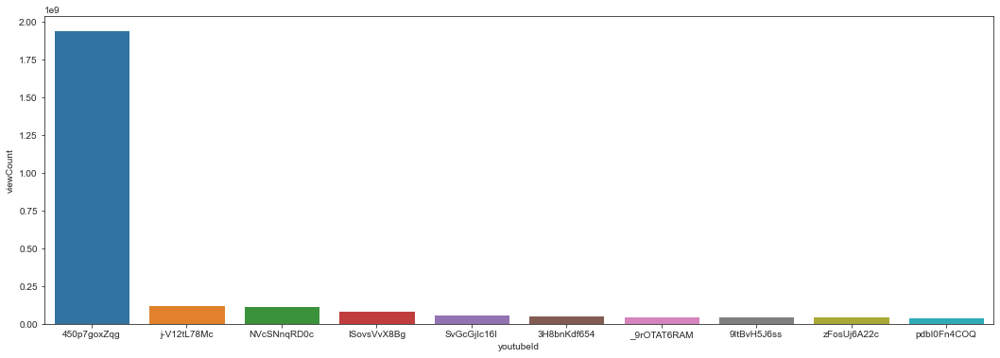

In [21]:
import seaborn as sns

fig_dims = (18, 6)
fig, ax = plt.subplots(figsize=fig_dims)
ax = sns.barplot(x="youtubeId", y="viewCount", data=youtube_stats_df
                 .sort_values(by=['viewCount'],ascending=False).head(10))

# Top 10 least viewed videos

In [22]:
#if (youtube_stats_df['viewCount'] > 0):
#youtube_stats_df['viewCount'].apply(lambda youtube_stats_df.sort_values(by=['viewCount'],ascending=True).head(10) if youtube_stats_df['viewCount']>0 else None)
import numpy as np
#youtube_stats_df['viewCount']=youtube_stats_df['viewCount'].replace(0, np.nan, inplace=True)
#youtube_stats_df
youtube_stats_df.sort_values(by=['viewCount'],ascending=True).head(10) 
youtube_stats_df

,youtubeId,description,viewCount,likeCount,dislikeCount,commentCount,Duration,movieId,title
0,K26_sDKnvMU,Trailer for Toy Story (1995) captured from the...,99938.0,95.0,10.0,12.0,PT1M31S,1,Toy Story (1995)
1,3LPANjHlPxo,Jumanji Trailer 1995\nDirector: Joe Johnston\n...,169247.0,238.0,29.0,NaN,PT2M48S,2,Jumanji (1995)
2,rEnOoWs3FuA,"The more things change, the more they stay the...",160651.0,217.0,8.0,12.0,PT1M51S,3,Grumpier Old Men (1995)
3,j9xml1CxgXI,Whitney Houston and Angela Bassett star in thi...,362352.0,NaN,NaN,NaN,PT2M39S,4,Waiting to Exhale (1995)
4,ltwvKLnj1B4,NaN,NaN,NaN,NaN,NaN,NaN,5,Father of the Bride Part II (1995)
...,...,...,...,...,...,...,...,...,...
91761,DL4aU8duqFA,"Ephraim Kishon, Igrani film, Izrael, 1964, 110...",62935.0,89.0,3.0,10.0,PT5M23S,118460,Sallah (1964)
91762,i4nqUFa9eWg,Sequart and Respect! Films are prodcuing a doc...,13544.0,32.0,0.0,20.0,PT1M32S,118462,Grant Morrison: Talking with Gods (2010)
91763,m3nbbGFEG2s,Documentario ''THe Universe of Keith Haring''\...,108218.0,261.0,6.0,15.0,PT2M11S,118464,The Universe of Keith Haring (2008)
91764,z5IM2IwA7FU,http://www.animationsfilme.ch - Regisseurin Ma...,49261.0,459.0,6.0,33.0,PT7M,118466,The Kingdom of Dreams and Madness (2013)


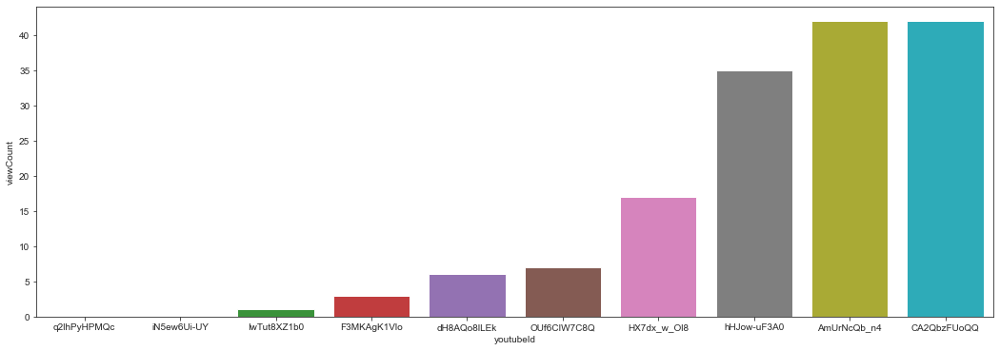

In [23]:
fig_dims = (18,6)
fig, ax = plt.subplots(figsize=fig_dims)
sns.set_style('ticks')
sns.barplot(x="youtubeId", y="viewCount", data=youtube_stats_df.sort_values(by=['viewCount'],ascending=True).head(10),ax=ax)

# Most liked video

In [24]:
youtube_stats_df.sort_values(by=['likeCount'],ascending=False).head(1)
#print("The title of the video which has highest number of likes is ", most_liked['title'])

,youtubeId,description,viewCount,likeCount,dislikeCount,commentCount,Duration,movieId,title
90163,450p7goxZqg,Official music video for “All of Me” by John L...,1.942853e+09,10578497.0,320435.0,230499.0,PT5M8S,111226,All of Me (2013)


# Least liked video

In [25]:
youtube_stats_df.sort_values(by=['likeCount'],ascending=True).head(1)

,youtubeId,description,viewCount,likeCount,dislikeCount,commentCount,Duration,movieId,title
90649,dO8zYv8qNdk,So Much So Fast is a documentary written and d...,418.0,0.0,0.0,0.0,PT2M8S,113432,So Much So Fast (2006)


# The  video that has the most likes

In [26]:
youtube_stats_df.sort_values(by=['viewCount'],ascending=False).head(1)["title"]
#youtube_stats_df.sort_values(by=['viewCount'],ascending=False).head(1)

90163    All of Me (2013)
Name: title, dtype: object


# The video that has the least likes

In [27]:
#youtube_stats_df.sort_values(by=['viewCount'],ascending=True).head(1)
youtube_stats_df.sort_values(by=['viewCount'],ascending=True).head(1)["title"]

69643    Hear My Song (1991)
Name: title, dtype: object

# The video with the highest duration

In [28]:
# Convert Duration column to seconds 
!pip install isodate
import isodate
import math
import numpy as np
def Str_duration_to_seconds(x):
    
    if str(x["Duration"]) != "nan":
        return isodate.parse_duration(x["Duration"]).total_seconds()
        

youtube_stats_df["Duration in seconds"]=youtube_stats_df.apply(Str_duration_to_seconds, axis=1)

In [29]:
youtube_stats_df

,youtubeId,description,viewCount,likeCount,dislikeCount,commentCount,Duration,movieId,title,Duration in seconds
0,K26_sDKnvMU,Trailer for Toy Story (1995) captured from the...,99938.0,95.0,10.0,12.0,PT1M31S,1,Toy Story (1995),91.0
1,3LPANjHlPxo,Jumanji Trailer 1995\nDirector: Joe Johnston\n...,169247.0,238.0,29.0,NaN,PT2M48S,2,Jumanji (1995),168.0
2,rEnOoWs3FuA,"The more things change, the more they stay the...",160651.0,217.0,8.0,12.0,PT1M51S,3,Grumpier Old Men (1995),111.0
3,j9xml1CxgXI,Whitney Houston and Angela Bassett star in thi...,362352.0,NaN,NaN,NaN,PT2M39S,4,Waiting to Exhale (1995),159.0
4,ltwvKLnj1B4,NaN,NaN,NaN,NaN,NaN,NaN,5,Father of the Bride Part II (1995),NaN
...,...,...,...,...,...,...,...,...,...,...
91761,DL4aU8duqFA,"Ephraim Kishon, Igrani film, Izrael, 1964, 110...",62935.0,89.0,3.0,10.0,PT5M23S,118460,Sallah (1964),323.0
91762,i4nqUFa9eWg,Sequart and Respect! Films are prodcuing a doc...,13544.0,32.0,0.0,20.0,PT1M32S,118462,Grant Morrison: Talking with Gods (2010),92.0
91763,m3nbbGFEG2s,Documentario ''THe Universe of Keith Haring''\...,108218.0,261.0,6.0,15.0,PT2M11S,118464,The Universe of Keith Haring (2008),131.0
91764,z5IM2IwA7FU,http://www.animationsfilme.ch - Regisseurin Ma...,49261.0,459.0,6.0,33.0,PT7M,118466,The Kingdom of Dreams and Madness (2013),420.0


In [30]:
youtube_stats_df.sort_values(by='Duration in seconds',ascending=False).head(1)

,youtubeId,description,viewCount,likeCount,dislikeCount,commentCount,Duration,movieId,title,Duration in seconds
85615,RBB_6gpUE-Q,"Trailer for the independent film ""Getting to K...",3772.0,2.0,3.0,0.0,PT12H49M24S,91444,Getting to Know You (1999),46164.0


# Extracting Comments using the Videoids

In [69]:

from pyyoutube import Api
import json
apiKey =''
api = Api(api_key=apiKey)
import csv
import json
import time
with open(r'C:\\Users\\rinuj\\vdoLinks.csv',encoding='utf-8') as csv_file:
    with open(r'videocomments.csv', 'a',encoding='utf-8') as outputfile:
        writer = csv.writer(outputfile)
        csv_reader = csv.reader(csv_file, delimiter=',')
        next(csv_reader, None)  
        for row in csv_reader:
            if int(row[1]) > 20 :
                #print(row[0])
                new_row=[]
                #empty_row.append(row[0])
                new_row.append(row[0])
                new_row.append(row[1])
                #print(new_row)
                try:
                    comment_by_video = api.get_comment_threads(video_id=row[0], count=100)
                    #print(comment_by_video)
                except Exception as e:
                    print(f"video disabled comments{e}")
                    new_row.append(f"video disabled comments {e}")
                    writer.writerow(new_row)
                    continue
                no_of_cmnts= json.loads(comment_by_video.to_json())["items"]
                #print(no_of_cmnts)
                try:
                    cmnts=[]
                    empty_row=[]
                    for i in no_of_cmnts:
                        cmnts.append(i["snippet"]["topLevelComment"]["snippet"]["textDisplay"])  
                    new_row.append(cmnts)
                    print(new_row)
                except Exception as e:
                    print(f"error at {row[0]}")
                
                writer.writerow(new_row)
                if csv_reader.line_num % 100 == 0:
                           print(row[1] )
                           print(f"sleeping till {time.ctime(time.time()+5)}")
                           time.sleep(5)


['yNLaTtpovys', '21', ['Heyyy It&#39;s me, DANNY devito, baby!', 'Na who&#39;s the copy cat .... 😂 I KNOW now. 👩\u200d✈️ 👩🏻\u200d💻 The interviews helped a lot to experience the lie.', 'Hi WSB!!!!', 'Very underated', 'ha this is like silly Tarantino. they made the most random movies in the 90s', 'turns 25 today!<br>Barry Sonnenfeld actually loathed the movie when it was originally finished. But it caught on to industry professionals and made over $115 million.<br>Based on the book by Elmore Leonard which was pretty much his way of getting back at Hollywood but in a funny way. A black comedy but also a satire on the movie industry with commentary about power and creativity in Tinseltown. <br>There&#39;s a lot of talking but it&#39;s a very smart gangster movie.', 'what trash with the trash man :D', 'A Great film 🙂', 'Odd, I see most people commenting that they just found out Be Cool was a sequel. I just found out Be Cool was even a movie. Did not do Get Shorty justice.', '🔥🔥🔥🔥 <br> I fee

['OOTTvrb4JZI', '23', ['Diffusez et téléchargez des films sur \r<br>Stream &amp; Download movies at the link \r<br>Streamen und laden Sie Filme über den Link herunter \r<br><a href="http://desty.page/film12">desty.page/film12</a>', 'Very underrated film. One of Stallone&#39;s best that wasn&#39;t Rocky or Rambo, and Antonio Banderas was AWESOME!', 'como se llama la cancion del trailer ????????', 'I think this film had the wrong cast, its ok but the actors just felt like they didn&#39;t suite the part, total miscast, like they tried to make julianne moore into a sharon stone type', '2020 of January', 'This is different version?', '<a href="https://www.youtube.com/watch?v=OOTTvrb4JZI&amp;t=0m50s">0:50</a> i don&#39;t see this moment in normal version of this film', 'Just imagine a movie where Miguel Bain has the contract for Bruce Willis character in the Jackal', 'Awful movie.  Whatever the scriptwriter(s) was/were paid it was way too much.', '&quot;A woman. It is not the same as killing

['RQLVzTtt2Ws', '27', ['Missing my childhood', 'RIP, Ashleigh Aston Moore 🕊', 'The way Christina Ricci owned the 90s 🖤', 'Ten Bucks', 'Rosie O&#39;Donnell I Don&#39;t Wanna Be Told To Grow Up Simple Plan', 'This movie is when I really started liking Christina, but 2 things bug me still...<br><br>1. they spend so much time making the point of friends helping each other through tough times and then end the &quot;Then&quot; part by saying oops the treehouse brought them &quot;independence from each other&quot; and the &quot;Now&quot; versions of them don&#39;t even care about meeting up hardly ever.<br><br>2. In all these years STILL they haven&#39;t done a release with the carnival scenes and any other deleted scenes. And not even a blu ray release either. I&#39;d like to have a release with tons of new scenes because I like the whole setting of the movie and it&#39;s pretty short and no sequel, so such a small amount of time to see them in that setting. Also, personally, I&#39;d hope fo

['lYSHAyODiGs', '28', ['Forget the clownish trailer. The only clownish thing about the film that keeps it from being a complete masterpiece is the weird circus parade right near the end.', 'I very much enjoyed this movie, but I also like the earlier movie as well. I think the depth of feeling shows better in the earlier version than this one. I do not think the trailer quite describes the movie as it was.  There are feelings hard to put in a movie. Anyway, I did love this movie and  also the other version, which I think is from 1971.', 'Haha! If I hadn’t seen  this movie before I would totally be fooled by the trailer it makes it sound like an exciting passionate love fest🤔 In reality it is a beautifully acted and perfectly made adaptation of my favourite book. Remember seeing it on BBC 2 when first released and even went to see it when it was released in the cinema.  Now treasure it on DVD. Ciaran Hinds was so handsome as Wentworth and Amanda Root was brilliant as Anne.😉', 'one film t

['15s4Y9ffW_o', '32', ['Releasing a deadly virus... More prescient wisdom from Terry Gilliam.', 'Watched this in high school and it’s definitely one of my favorite movies, now that we’re living in the times of covid it’s become quite ironic.', 'i had to watch this movie 4 times to get it  lol', 'This is definitely a movie that should’ve been in the. TOP 10 MOVIES that predicted the Future list:', 'Strange times we live in now.', 'Movie seemed interesting, but became too long &amp; confusing.', 'This film had so many plot holes literally all over the place.', 'It’s somehow nice to see Pitt cast/listed third.', 'Have you guys noticed that every movie has romance', 'This movie along with Donnie Darko are more than just a movie to me. These are pure emotions.', 'That sound effect sounds like naruto cloning jutsu sfx lmao', '2021: 12 Bats<br>cuz China cant eat like normal people.', 'no worries.. not like multiple rich families are moving out of the US and openly talking about their undergro

['pg-GMqPHIPQ', '36', ['<a href="https://www.youtube.com/watch?v=pg-GMqPHIPQ&amp;t=1m48s">1:48</a>', 'Sean is an amaZing actor.', 'Brilliant movie, amazing acting. I didn&#39;t see it as liberal agenda. Both &#39;sides&#39;, if you will, were represented. I met the real Sister Prejean while I was a Criminology major, the year this movie was released.  The scene at the end (where the boy and his girlfriend were brutally murdered) in the woods, confirmed my unwavering approval of the death penalty.', 'I don&#39;t know if it ever has been, but this script would make a very good stage play', 'I&#39;m writing to 3 people on deathrow very realistic', 'people keep doing spoilers. Not good', 'Susan Sara my love', 'very bad movie of all time', 'This movie requires a lot of empathy for both the killer and\xa0his victim&#39;s families\xa0to be truly appreciated. If you see life in black and white this is a good film to challenge how you look at the world. He\xa0had no sympathy\xa0when he helped k

['6PKq7YSpO6c', '38', ['Plot twist, Alyssa&#39;s mom is also Amanda&#39;s mom, as she was dying birthing Alyssa she was whisked away to try to save her and that&#39;s when she birthed Amanda and a nurse put her aside to try to save the mom and Amanda was lost and thought to be an abandoned child and sent to the orphanage after she was cleared. Now Roger Callaway finds all this out because he investigated as to why Amanda looks so much like Alyssa, the people at camp and the orphanage find out about them, the switch, many doubts are cleared up, the Butkiss&#39; are sent to jail, all the kids are returned to the orphanage, the Butkiss biological son is sent to therapy and to live with his granny, and they all lived happily ever after. Roger has also settled a multi-million dollar lawsuit on the hospital the girls were born and has invested a lot for Amanda as well as Alyssa. Now after six months Roger married Diane, has now twin biological daughters, the media has had a field day ever si

video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['OXc0-EME0C8', '41', ['There&#39;s an Amazing Australian film like this of MacBeth from 2006<br>They are a Scottish Mob family in Melbourne, the Horsemen are Biker Gang Members, the Witches are Gothic School Girls and the sword fights are Shootouts in the city and tunnels and bushland', 'Okay this is confusing and completely inaccurate Richard the third lived in 1400', 'Magneto<br>Iron Man <br>Professor McGonagall <br>Professor Horace Slughorn <br>Mar-Vel Captain Marvel former boss and enemy', 'For anyone looking for the music that starts at <a href="https://www.youtube.com/watch?v=OXc0-EME0C8&amp;t=1m52s">1:52</a>, it&#39;s Belshazzar&#39;s Feast &#39;Then Sing Aloud to God&#39;. (The version in the trailer is edited a bit, though.)', 'Robert hahahah perfect', 'A cheesy commercial for

['JHIfHL5UgFs', '44', ['best CGI of all time!', 'P cari orang indo', 'Still better than the new one...plus they are in  the actual game for a reason. Thank you Mk11', 'The movie that made my movie', 'We need more from Bridgette Wilson!', 'If you were there for this initial trailer, you&#39;re a real one.', 'Still better than the remake.', 'This was and still is better than new MK', '4 kano 333-333-333', 'Like phrases', 'Love this one better u can’t run from me I don’t need to run', 'There world is ours', 'You can’t run from me I don’t need to run scorpion sub cero your soul is mine', 'Awesome.', 'I want to learn that awesome MOVE where Subzero appears to be doing a back handspring layout but holds it mid-air.', 'Fun fact: besides that this movie came out in 1995 the game Tekken came out as well and 15 years later the actor who played Shang Tsung also played in the Tekken movie.', 'this is just Mortal Kombat in name only. the more I rewatch this one, the more I&#39;ve decided to declare

['Y1uPXA1ceNo', '45', ['6/20🍆🥕🍓🍊', 'Nicole Kidman was robbed of an Oscar nomination for this brilliant performance.  This is pretty much the Pamela Smart story.  Nicole did NOT deserve an Oscar for The Hours.  That was bull.', 'Nicole Kidman won a golden globe for her performance in To Die For why was she nominated for an oscar? She finally won an oscar in the hours in 2003 she was overdue for one anyways! She was great in this flim since it was based on the Pamela Smart case*<b>*</b>', 'Joaquin Phoenix 2 years after his bro death starting to show us how talented actor is, like his late bro River...! Good movie with great actors.', 'Would&#39;ve been fitting justice, if 3 other lives hadn&#39;t been destroyed in the process', 'now sound on this video.', 'I agree, that she should have won an Oscar, this was a great movie and I love the way she played her role, its was fantastic. she was so hot, without getting totally nude. Just her expression was what made it work.', 'this was her best

['DSf_pVG8QZM', '48', ['<a href="https://www.youtube.com/watch?v=DSf_pVG8QZM&amp;t=0m25s">0:25</a>-<a href="https://www.youtube.com/watch?v=DSf_pVG8QZM&amp;t=0m41s">0:41</a> Does anybody know what show or film was this piece of music comes from?', '26 years of a young native American princess.', 'Why did Pocahontas turn out to be the daughter of Chief Powhatan?', '- Pocahontas (1995) f&#39;u&quot;l&#39;l M&#39;o&#39;V&#39;i&quot;E<br>𝐖𝐚𝐭𝐜𝐡 𝐇𝐞𝐫𝐞 ➽ <a href="https://bit.ly/3reT989">https://bit.ly/3reT989</a><br><br><br><br><br><br><br><br><br>Stream Now ➣ <br>download : <br>-All Subtitle Available<br>ライブ配信の再編ありがとうです！この日のライブ配信は、かならりやばかったですね！１万人を超える人が見ていたもんね（笑）やっぱり人参最高！まさかのカメラ切り忘れでやら1かしたのもドキドキでした！今後は気を付けないとね. .<br><br>! 💖🖤 ❤️<a href="http://www.youtube.com/results?search_query=%23%E4%BB%8A%E5%BE%8C%E3%81%AF%E6%B0%97%E3%82%92%E3%83%A9%E3%82%A4%E3%83%96%E9%85%8D%E4%BF%A1%E3%81%AE%E5%86%8D%E7%B7%A8%E3%81%82%E3%82%8A">#今後は気をライブ配信の再編あり</a><br> がとうです！<a href="http://www.youtube.com/results?search

['J5mszOh_Qis', '49', ['É bom gente?', 'I just finished watching the movie it was Amazing', 'Why am I only finding out about this movie now..<br><br>Just watched it and I am impressed and satisfied. <br>A welcome addition to my fav Lez movies list.', 'WHAT A FUCKIN CORNY ASS MOVIE! This was so cliche even for a gay film made in the &#39;90s.', 'I just watched it  ,it&#39;s worth it❤', 'This is one of the best Canadian films I&#39;ve ever seen, and best LGBTQ romance/dramas. So powerful for any audience.', 'I watched it yesterday, what an amazing film!', 'I just watched this film. It&#39;s amazing! ❤️', 'Nice memories when movies could still move me', 'Saw this movie I give it a 7/10', 'i own this on dvd! Very hard to find!', 'I bet plenty of men watched this', 'This movie is awesome 💖❤', 'En el uk en el mercado y la verdad no se ha convertido en el que r de las tres de los Simpson por lo tanto no hay resultados de la misma que fue la primera etapa de desarrollo de los Angeles y', 'Bom 

['3Fd6ZlgOFqs', '53', ['Erico lo Verso e  Michele Placido sono i Arbëreshi.......Albanesi.pero niente non hano fatto per la terra di origine.<br>Che stronzzi.', 'trailer and teaser trailer ;)']]
video disabled commentsYouTubeException(status_code=403,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter has disabled comments.)
video disabled commentsYouTubeException(status_code=403,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter has disabled comments.)
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['ThH8WocPRM0', '57', ['Check out this great photo of the beautiful Jodie Foster from 1995:<br><a href="https://upload.wikimedia.org/wikipedia/commons/d/dd/Jodie_Foster_1995.jpg">https://upl

['JAAhQwcJ20U', '63', ['“From the creators of Scary Movie”<br>But Scary Movie was made in the 2000s', 'Wait they had DVD’s in 1996', 'You know people always ask me what’s the best movie ever made and I instantly point to this one...Don’t Be A Menace', 'This trailer is trash but the movie is a classic', 'Yooo some clips are stolen from boys in the hood', 'Needs 4k release + rerelease in theaters', '2021 e ainda e o melhor filme❤', 'in movies when you spill a coffee on a guy he always falls in love with you?  I spilled a coffee on a guy once, he gave me a dirty look and walked out lol!', 'Jackie chan screaming <a href="https://www.youtube.com/watch?v=JAAhQwcJ20U&amp;t=1m17s">1:17</a>-<a href="https://www.youtube.com/watch?v=JAAhQwcJ20U&amp;t=1m18s">1:18</a>', 'Migos - Need It', 'lol this is the one movie where my white friends mostly watched and put me on', 'They deliberately hired the whitest narrator they could find.', 'Gta san andreas in a nutshell', '<a href="https://www.youtube.com/

['GJ6-ymSjShg', '74', ['This is such an underrated romantic film.  I never hear it being mentioned when people talk about the romances from the 90s.  I remember seeing a trailer for it when I was a teen and finally watched it on cable tv a couple years later.  It was a lovely film and now that I own it, I&#39;ll definitely watch it more often.  It&#39;s a shame they don&#39;t make movies like this anymore.<br><br>Also, who would love to have a great friend like Kim in their life?  She&#39;s very encouraging &amp; supportive and truly cares about Lisa enough to tell her when she&#39;s being ridiculous. lol', 'Anyone knows exactly where did the shooting of this flim take place ?', 'I love this movie.', 'Bed of roses, Some kind of Wonderful, True romance Heathers and thing with Christian Slater.👍', 'My mom took me to see this when I was 12. I only remember the song. Definitely need to revisit this movie.', 'I really liked this movie as a 90s tween. I thought it was really romantic in my i

['1AeAvE3FxQ8', '76', ['not a bad idea, could use a bit better writting']]
['xjPZbigB4NA', '77', ['John Cale.', '<a href="http://www.youtube.com/results?search_query=%23radiostayrock">#radiostayrock</a>', '`...every junkie`s like a setting sun...` N Young.']]
['kDdwRURSEzI', '78', ['Sean Penn is a genius, I didn&#39;t know he wrote the story.', 'Please add &quot;Written and directed by Sean Penn&quot; to the description', 'Man, what a great film. That final scene at the graveyard.', 'Anjelica Huston is the greatest 🤍', 'he turned into the person he hates and now he works at the local school ... as a crossing guard.', 'Jack Nicholson is awesome... I liked this movie !!!', 'Such a great performance by Jack', 'Great performance from Nicholson', 'this is masterpiece', 'I don’t get why this movie flopped', '👍👍👍👍👍👍👍👍👍👍', 'This is a great movie. I literally was on the edge of my seat until the ending.']]
['Awng-jZnkoY', '79', ['I will watch it only for our dear James Gandolfini', 'Before the 

['UwkAOHd8WRU', '83', ['Uncle Phil james avery&#39;s voice', 'En español no la encuentro...ayudarme por favor', 'This movie must be hella good, cause the DVD cost $114 on Amazon. I don&#39;t think I want to see it that bad.']]
['FmYKCjilWAs', '84', ['🔥🔥 <br> A good film should deepen one’s experience <br> <a href="https://www.youtube.com/watch?v=FmYKCjilWAs&amp;t=1m56s">1:56</a> 💟💓 <br>  👇 👇 👇💯', 'This movie was boring as hell. Esp the actress at <a href="http://www.youtube.com/watch?v=FmYKCjilWAs&amp;t=0m51s">0:51</a> - her character went NOWHERE!  And her doing that cougar/cat exercise outside with that guy coming onto her was stupid. The old lady was a bore. What a pretentious family spending time together during a pretentious summer in the pretentious Hamptons.  Leave pretentious films to the pretentious king - WOODY ALLEN.  No one even comes close.', 'this movie is kickass.']]
['bdqnz-FtIog', '85', ['My father knew the parents of Kristin Scott Thomas, at least he participated in t

video disabled commentsYouTubeException(status_code=403,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter has disabled comments.)
['OlCO01s1upA', '100', ['<a href="http://www.youtube.com/results?search_query=%23treeringsmixtape">#TreeRingsMixtape</a> EP', 'Superb drama-solid cast and rather underrated-see it!', '- Love Al Pacino in these type of movies.  Great actor.', 'Good movie<br>']]
100
sleeping till Wed Oct 13 14:34:50 2021
['hspUSez-rYY', '101', ['still trying to find the bottle rocket in the film', 'No actual bottle rockets were harmed in the making of BOTTLE ROCKET.  Wes didn&#39;t know what they were.', 'Que terrible película. Terrible.', 'When I first saw Owen Wilson, I thought it was a blonde Trent Reznor, I flipped out. Anyway, this movie reminds me of some nerd burglars I knew in high school.', '💘', 'I bet that grand piano&#39;s worth ten grand.', 'Vincent Vega??', 'that nose of owen wilson wasn&#

['Up-oN4NtvbM', '105', ['Can anyone tell me where can I get the movie?????pls', 'Such a corny trailer for a classic film.', 'Cheat&#39;s on her husband after he takes her out of a hell hole. Only  Hollywood could romantices that. Like the old lady said on the titanic. A women&#39;s heart is full of a thousand Secrets. What is your wife hiding from  You.', 'October 2021 ~ I cried so much today watching this .... TWICE 😍 I thought there were no others to touch The Notebook but Goodness Gracious, this beyond beautiful movie has everything in it that would fill my heart and soul to the brim ... and probably spilleth over too 🌟 What a totally fabulous movie 💫', 'Love this movie could watch over again again love it', 'Does anyone know a good Doomed Romance movies? Kind of sensual, real, intimate atmosphere - like this one, Call me by your name or Before sunrise.', 'Adultery beautification. If you don&#39;t love your husband then leave.', '<b>Meredith Palmer’s desert island movies brought me 

video disabled commentsYouTubeException(status_code=403,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter has disabled comments.)
['foBVdhrrOJ8', '108', ['Great docu! 👍❤️!', 'The song playing at the end is ,Malcolm McLaren - Deep In Vogue ( With Willie Ninja )', 'As melhores modelos', 'How come people in this video only talk of supermodels but make no mention of the great Gianni Versace?? RIP Gianni, models come and go but creativity matters more than walking', 'prettiest girl in the room', 'Versace klasa!!!!', 'O jeny jak ja nie lubie tej turlinghton', 'CARLA BRUNIII', 'Gianni😍', 'Can you please please upload about face: supermodels then and now. Please. It came out in hbo.', 'Ah, those were the days...<br>RIP Gianni - you are  missed<br>Thank You, Christy for having the foresight to document this time in the fashion world', 'Kate is such a midget compared to the other girls.', 'Francois Nars and his terribly 

['cujiHDeqnHY', '111', ['Trailer looks intresting looking for the movie&#39;s Cannes. Premiere', 'Reminds me of when the Feds, came for me.....100% disabled Army veteran....PTSD.....', 'I don&#39;t think Travis&#39; narrative at <a href="https://www.youtube.com/watch?v=cujiHDeqnHY&amp;t=0m53s">0:53</a> - <a href="https://www.youtube.com/watch?v=cujiHDeqnHY&amp;t=1m06s">1:06</a> was actually in the movie. After watching this masterpiece countless times, it&#39;s incredible to hear this part for the first time.', 'Oh how gorgeous Robert de niro', 'It’s so weird to me that De Niro was in godfather part two before this', '<b>&quot;I like Jodie Foster characters street name  &quot;EASY&quot; Bangkok-Johnnie. BTW  Martin Scorsese stole the song &quot;Be My Baby&quot;  in his first movie &quot;Mean Streets&quot;. No permission from Phil Spector. Later  Scorsese had to pay back in millions USD</b>  <a href="https://youtu.be/1vsMiFlNK7E">https://youtu.be/1vsMiFlNK7E</a>', 'Great film, legit und

['q7vg8uGzLts', '112', ['does anyone know  the name of the song played in the dance club scene? some techno stuff', 'Extraordinary', 'I wouldn&#39;t be Surprised if there was a Model figure of THAT LAMBO With Paint Messed up And Jackie Chan Figure Inside of it With the Saw sticking out !<br><br>It&#39;s Pop Culture Man !!!', 'YES Mortal Kombat Fever !<br><br>Yeah one of my Earliest movies of Jackie Chan', 'The illest action movie trailer of all time period.', 'I came here for that instrumental. This is the same instrumental in Mortal Kombat back in the 90s lol<br>What an EPIC trailer 🔥', '“Are you ok?”  ... “No!” … and he runs towards the fight anyway.', 'HAPPY 25th ANNIVERSARY to the US release of RUMBLE IN THE BRONX!!! 🙂', 'Jackie Chan is as much legend as Bruce lee', 'If there was a rumble in the Bronx reboot tony ja would be the perfect guy for the movie', 'Ok but wtf is the movie about exactly? Worst trailer ever.', 'This his best film ever made  and armor of the god part 1,2 r ne

['HFMnh-n7U7w', '116', ['I’m almost 35 and Anne Frank’s diary continues to inspire me. Her life and legacy will live on in her writing and she’s gonna be a continuous legend to anyone who is going through adversity. RIP Ms. Frank (1929-1945)', 'Wow miep gies survived the war she died on 2010 that was where I was born!', 'I have loved this book since childhood, it was my mother’s favorite, hoping I’ll pass my book down my grandchildren and that they will love Anne as we do!', 'I look exactly like Anne Frank oh my God', 'Oh, how I love this documentary! &lt;3', 'htt p://polskaweb.eu/index2.php?option=com_content&amp;do_pdf=1&amp;id=3793', 'i think...her tragic life and her precious writings will inspire us forever ...she was before Vincent van gogh...and after the holocaust.human dignity must never be forgotten! God knows everything!..tony amore off the BBC one documentary its A MAD WORLD..filmed in england in 2007', 'Anne&#39;s my inspiration for wanting to be a writer. And those people

['b0nE4KWZ4Io', '125', ['<a href="https://www.youtube.com/watch?v=b0nE4KWZ4Io&amp;t=0m50s">0:50</a>', 'omg, did Mary Tyler Moore just almost flash?? She&#39;s awesome.', 'R.I.P. George Segal and Mary Tyler Moore', 'Anyone know the song from <a href="https://www.youtube.com/watch?v=b0nE4KWZ4Io&amp;t=1m45s">1:45</a>', 'One of the single shittiest trailers, for one of the greatest comedies of the modern era. No wonder this movie flopped. It’s brilliant though.', '<a href="https://www.youtube.com/watch?v=b0nE4KWZ4Io&amp;t=0m55s">0:55</a><br><b>IS NO ONE GOING TO TALK ABOUT THIS SCENE?</b>', 'Great funny and classic saw it in the theatre when it first came out.', 'I saw this movie yesterday', '🔥🔥🔥🔥 <br> Love this movie. LOVE THIS MOVIE. <br> <a href="https://www.youtube.com/watch?v=b0nE4KWZ4Io&amp;t=0m33s">0:33</a> ❤💗🔥 <br>  👇👇👇', '🔥🔥🔥🔥 <br> This movie is awesome. <br> <a href="https://www.youtube.com/watch?v=b0nE4KWZ4Io&amp;t=1m34s">1:34</a> 💛💓🔥 <br>  👇👇🖤', 'I am not a Ben Stiller fan  How

['KbjTJRZkt5Q', '139', ['Tulsa philippines', 'Shoted in Philippines', 'I wish this was still on Netflix! I love this movie!', 'eyes a ticket ova show iss wen yer texting cunts pretending to be a bird hehehe strange and weird hehe']]
['RiRUHeUhM3U', '140', ['For all that have no idea- this movie is actually based on a true story, and have some compation for Gods name.\xa0', 'This really was a silly film.', 'When a man loves a woman and up close and personal are great examples of co-dependent relationships', 'Song Name, Please.', 'you  put SPOILER first you clever boy... now you spoiled the whole movie... happy?', 'Rossi!\nGood movie, wish he wouldn&#39;t have *Spoiler Alert*...  died in the end.']]
['83kTQ6chG4o', '141', ['Nonsense', 'this is a remake of an old french movie,   la cage aux folles,     look it up if you dont beleive me', 'Robin Williams was shear perfection.  Damn what a loss to this world.', 'The original voice of Genie from Disney&#39;s Aladdin and Timon from Disney&#39

['HPBkA3GuvcY', '148', ['I&#39;m weirdly obsessed with this movie.', 'is just me or... is the history of snape, james potter y lili :O', 'R.I.P Alan', 'According to the sources I read, she pretended to be 17 yr old and dyed her hair red for the role. The casting people said she looked to experienced and want a more innocient girl or something. She was 19 when she was in the film.', 'THE TRAILER MAKES IT LOOK LIKE THE CUTEST MOST ADORABLE ROMANTIC COMING OF AGE FILM EVER!!!! But I know what really happens... I&#39;m watching the movie tonight though but yeah', 'Will watch for Alan Rickman...', 'I do that with just about everything hes in. ', 'Alan Rickman is a good enough reason for me to watch it, just saying! Haha', '1:19 I don&#39;t love you just a bit. I LOVE YOU WITH MY LIFE ALAN RICKMAN!!!', '3.Meredith took a PJ revenge talking to Stella&#39;s uncle;4.PJ and Stella were really in love, and Meredith,used to being the&quot;first woman&quot;,had noticed it: when he starred in Captai

['w0-2kzujLA8', '151', ['October 2020 - I was here...and old :D', 'here after aftab iqbal mention', 'And I ask this since win95 - which OST starts at <a href="https://www.youtube.com/watch?v=w0-2kzujLA8&amp;t=1m09s">1:09</a>?!<br>I wait for the answer since 20 years!', 'My CD didn´t have rob roy !!', 'Great movie and actors along with the story. Have to find it on dvd.', 'Ouch...those &#39;Scottish accent&#39;. Cringe etc.', 'I have a compaq presario 2240 pc.', 'I love the intense, dramatic voiceover, &quot;He was willing to give his LIFE!&quot; haha, incredible.', 'Always think John Hurt&#39;s performance on this film.  RIP :(', 'This is moral and a fine tribute to love.\xa0 Love watching this...........', 'ok', 'anyone remember this in windows 95?', 'It&#39;s Qui-Gon Jinn doing Braveheart.', 'i&#39;m here because of windows 95', 'loved it!!&lt;3', 'Lol. Seems like every other person on here is a descendant of Rob Roy.', 'The song in the trailer which everyone seems to be asking about

['b_KllgySsPo', '153', ['To those who aren&#39;t fans of the theatrical cut, then here is the petition that someone created for a director&#39;s cut to be released for its 25th anniversary. You are all welcome to sign it, and spread the word out: <a href="https://www.change.org/p/warner-bros-to-warner-bros-release-the-director-s-cut-of-batman-forever-for-its-25th-anniversary">https://www.change.org/p/warner-bros-to-warner-bros-release-the-director-s-cut-of-batman-forever-for-its-25th-anniversary</a>. Thank you.', 'No wonder people got suckered. With this movie. Yeah Keaton was gone but everybody assumed Burton was producing so might have some control and the Danny Elfman music score in the trailer. Then you watch the movie. After ten minutes shoot me.', 'We deserve a 4k version of this timeless movie.', 'This was the TV teaser trailer for The WB network.  It was during one of their most popular shows at the time and advertised to catch the trailer doing the show', 'Chris O&#39;Donnell:

['BBEB9OSfeCA', '158', ['We never got a third Addams Family movie with Christina Ricci as Wednesday Addams, but at least we got this film...', 'My childhood, I’m 25 now and I loved this as a kid', 'How have we not made this movie a memefest yet?', 'here,s my question about casper that he lives with his  uncles where are his mom and dad reply if you see my comment', 'Casper (1995) f&#39;u&quot;l&#39;l M&#39;o&#39;V&#39;i&quot;E<br>𝐖𝐚𝐭𝐜𝐡 𝐇𝐞𝐫𝐞 ➽ <a href="https://bit.ly/3ya701K">https://bit.ly/3ya701K</a><br><br><br><br><br><br><br><br><br>-All Subtitle Available<br>Stream Now ➣ <a href="https://is.gd/tspjk2">https://is.gd/tspjk2</a><br>download : <a href="https://is.gd/tspjk2">https://is.gd/tspjk2</a><br><br><br>!💖🖤❤️今後は気をライブ配信の再編ありがとうです！この日のライブ配信は、かならりやばかったですね！１万人を超える人が見ていたもん（笑）やっぱり人参最高！まさかのカメラ切り忘れでやら1かしたのもドキドキでした,.<br> 💖🖤在整個人類歷史上，強者，富人和具有狡猾特質的人捕食部落，氏族，城鎮，城市和鄉村中的弱者，無`&#39;守和貧窮成員。然而，人類的生存意願迫使那些被拒絕，被剝奪或摧毀的基本需求的人們找到了一種生活方式，並繼續將其DNA融入不斷發展的人類社會。.<br> 說到食物，不要以為那些被拒絕的人只吃垃圾。相反，他們學會了在被忽視的肉類和蔬菜中尋找

['icu59hembVk', '160', ['<a href="https://www.youtube.com/watch?v=icu59hembVk&amp;t=1m11s">1:11</a>/<a href="https://www.youtube.com/watch?v=icu59hembVk&amp;t=2m26s">2:26</a>  The destroyed Airplane from Jurassic Park III on ISLA SORNA.', 'book was 10 million times better, but I love this campy piece of crap', 'What is the name of the song Dylan Walsh sings to Amy then the whole crew starts singing so she could go to sleep before they got on the river', 'You know I remember seen summer movies in 1995 I seen Congo Mighty Morphin power rangers the movie Batman Forever Waterworld Judge dredd &amp; Toy story!', 'STOP EATING MY SESAME CAKE!!!', 'This movie was a huge pile of shit. Why the hell did the filmmakers feel the need to change so much of the novel? What a bunch of arrogant assholes to think they could tell the story better than Crichton. \n\nTim Curry&#39;s accent was ridiculous, btw.', 'I thought Congo was okay. The book is way better. Right now I&#39;m reading THE ICE GORILLA, an

['gcsk7C7FfQM', '165', ['<b>On a good day, he&#39;s a great cop. On a bad day, he&#39;s the best there is.</b>', 'Hello, I would like to FILM and be IN: Die Hard 7...<br>The IDEA is of for the REVOLUTION of HEAVEN COUNTRY... As HEAVEN has started a UPRISING!!!<br>It FEATURES all the STARS you could possibly want...<br>The STAR MUSICAL...<br>And I would like to film THIS during SCARY the MOVIE...<br>And Batman C...<br>And Star Wars 10: A Lost Jedi...<br>PERHAPS, Simon could be in the movie as well...', 'Love this trailer', 'good']]
video disabled commentsYouTubeException(status_code=403,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter has disabled comments.)
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
video disabled commentsYouTubeException(status_code=40

['Ql1uLyuWra8', '170', ['ready player zero (cool)', 'Angelina the nerd', '2020 ?', 'i dislike it because hacking scenes are not realistic.', 'Did anyone see Shaggy in this film', 'Hackers really looks 90s. I&#39;m a 90s kid but I haven&#39;t seen Hackers yet.', '“LAUNCH”', 'Upstairs.<br>What&#39;s going on? What&#39;s the matter?<br>Who are you?<br>Hey!<br>Dade! Dade!<br>Knock it down.', '2018?', 'This is a movie recommendation from the DEFCON website so it is totally real.', 'lol', 'uh MY NAME IS &quot;THE PLAGUE&quot;, MOM', 'Press Hack to launch hack, press Cancel to cancel the attack (with picture of a dude with long hair in the background).<br>Where can i download that program? i want to hack the world', 'This is vaporwave in its proto-essence', 'Damn if watchdogs would have played in the 90s It wouldn&#39;t have been so annoying. This movie is awesome!', 'IT&#39;S JOKE', 'best hacker here ;)', 'The trailer pretty much showed the whole film!  But non the less still my personal fav

['dhOHvdiLaDI', '171', ['lmao this movie is so funny.', 'That guy in the  grey shorts red tank top on the stair😍master', 'This made me want to see it back in 1995.', 'That&#39;s not a trailer. Great movie. though', 'Yes Michael does play a lot of  gay roles..??..XD', 'god, michael t weiss was sexy even with a bad haircut.  he still looks good today.', 'This is not a trailer.😌', 'Love this movie.', 'This is so bad, and not only that, they are pushing propaganda that being HIV+ shouldn&#39;t carry any stigma. Oh well, sorry, but it does.', 'OH! I recognize that dude. He plays the bad guy in iZombie! Huh, he has a more varied background than I realized, lol.', 'Jeff Fleming...', 'Love the movie and definitely the spots where r they now', 'lol! I love Steven Weber', 'This is so...gay xD', 'Silly Fun!', 'hahhaa..!! JEFF..!', 'That akward moment when I realized my name is Jeffrey and my brother&#39;s name is Steve...\n', 'hahahahhaah xDD\ni&#39;m going to watch this movie!! &gt;u&lt;', 'It&#

['43-BefmjMFg', '173', ['I loved the trailers back in those days!', '2012 is better', '<i>Slap your lip, so you talk sideways ... like Sly Stallone...</i><br><br>Got to be honest, this has not aged well.', 'who&#39;s here in 2019?', 'Even though I&#39;m a Dredd fan, I have a soft spot for this film.', 'The biggest problem with this movie was Fergie. Either remove the character or cast a better actor !', 'We are the Kids of the 90&#39;s☠', 'I still like this movie even though it&#39;s not a good Dredd Comic-Book Adaptation. I love how they showed Mega City One. I love the new Dredd movie but the only the city design was the only flaw for me. Hope they will make a sequel with the design like in this movie!', 'Music by Jerry Goldsmith: not used in the movie.', 'HDTGM?', 'Too many spoilers in this trailer. :/', '2017 federal indictments!!!!', 'That trailer was the shortest movie I&#39;ve ever seen.<br><br>Also, who knew Rob Schneider does a good Stallone impression?  (<a href="https://www.

['U9a5tZSKDOU', '175', ['I tried watching kids with my family to prove why me gaming all day make sense', 'This should have a future 4K re-release, maybe with A24 acquiring the rights', 'Until someone taught us right from wrong, we were all born sinners, and even then, we had to ween ourselves from our true nature.. Im no exception.', 'Growing up in the &#39;90&#39;s, this movie was fairly accurate even outside of the inner cities.  Living in a small town, there was literally nothing to do except get drunk, party and cause trouble.  We got away with it too because parents weren&#39;t helicopter parents like they are today and you had to find a payphone somewhere to even let them know (and lie) about where you were.  Ahh, the days before caller ID.  It&#39;s crazy how much the world has changed in just a few years.  This was a point of time that likely will never happen again with social media and cell phones.  Looking back, we all did some stupid things but that was just part of growin

['_eVo7aBze1w', '180', ['I couldn’t make five minutes', 'The flannel shirt tied around the waist.  A fashion fad I&#39;m happy that it died.', '<a href="https://www.youtube.com/watch?v=_eVo7aBze1w&amp;t=0m58s">0:58</a> actually it&#39;s not a sailboat, it&#39;s an abstract image, consisting in various shapes arranged in horizontal lines, mainly intersecting circles.<br><br><br>Yes, the image still works through a low res video capture of a trailer for a movie where the picture is recorded from a distance, not framed properly, a bit shaky and not exactly in focus.<br>These pictures are awesome!', 'I actually kinda feel sorry for Willam (Ethan Suplee) when he&#39;s always trying to see the sailboat in the 3D painting (if you pause the movie in one certain scene you actually can see the sailboat)', 'An article about dead malls brought me here.', 'Does anyone know the song at <a href="http://www.youtube.com/watch?v=_eVo7aBze1w&amp;t=0m19s">0:19</a>? Seen this movie a million times an that&

['3L5f9EXKE5I', '184', ['massive attack de olmasa ne olurmuş bu filmin hali', 'Que ganas de ver la pelicula']]
['46qKHq7REI4', '185', ['I could be losing it, but I would swear that the brand of the GPS in the light plane that gets hacked was a Garmin in the original movie but in the Netflix version its some fake brand. Is it possible that Garmin had a change of heart on that product placement?', 'asking for the wifi password on the beach is way less cool these days.', 'Funny just found/watched this in 2021.  I thought that it was new (2020) but themed in the 90&#39;s... lol.  lol .... I remember the dial up sound hahahahan... the sound.... oh the sound...', 'Surprised 🙄🙄🙄', 'Lol this movie is like the typical Amazon customer.', 'On Netflix right now', 'Great movie, just wish they did a little less of the &quot;he&#39;s coming to get you&quot; scenes.  Enemy of the State was another fun view into Big Brother is watching you.', 'i heard the dipset music in there', '“That movie with the g

['dVmOU8HPf_E', '186', ['RIP Robin Williams I laughed at this movie so hard and remember you so clearly in it.', 'my favorite of all of Robin William&#39;s roles…. RIP', 'RIP Dr. Kosevich.', 'never get a kid', 'Ahh..Hugh Grant!!!!!\xa0', 'He&#39;s still perfect.', 'He kinda has a unibrow in this. Awksss', 'ooh, this movie looks SO good!', 'That&#39;s why you shouldn&#39;t quit your day job.', 'Does anyone know what song Julianne Moore is dancing on about 1:15&quot; ?\n', 'Perhaps the number of weeks in gestation.', 'der film is so cool :D', 'she was counting the number of days her menstrual cycle is, her cycle must be 28 days as she is ten days late, therefore thats what the 38 is indicating  ', 'This movie was so damn funny', 'Yep that&#39;s why women have the baby and not men hahaha', 'One of my favorite movies :)', 'Julianne Moore &lt;3', 'Kermode :)', 'just before rebecca (julianne moore) tells him she&#39;s pregnant, she&#39;s counting (32, 34, 38 etc). What did she mean by that?'

['2UHm2ASOpXA', '192', ['Do dat shit...ya know what I&#39;m sayin&#39;...', '<a href="https://www.youtube.com/watch?v=2UHm2ASOpXA&amp;t=3m18s">3:18</a>', 'I wanna be an artist and make music cause it dope but first I wanna learn the history of hip hop', 'I love this more than I did back then', '<a href="https://www.youtube.com/watch?v=2UHm2ASOpXA&amp;t=1h13m55s">1:13:55</a> is hilarious...all the rappers Melle Mel was referring to are saying the same thing about today’s mumble rappers 😂', '😭I finally found it 🍻', 'Rip big', '&quot;BOOM!  ...it&#39;s either dis or dat!&quot;', 'Wish pac was on this but he was locked up in Danemora during the filming', 'Man Biggie Smalls is truely miss!!', 'that warren g was being fd in the A!   taken for every last dollar! hairdresser ffs!', 'I feel like everybody who wants to be a rapper should watch this first and learn.', 'Russell Simmons BEEN a grimey nigga lmao', 'My favorite group is Bone Thugs N Harmony and my favorite song from them is on this s

['gszDLDFwcLk', '193', ['&quot;We take the cash, We cash the check, We show them what they wanna see&quot;<br><br>I honestly liked this movie and everyone involved', 'The karate kicks in the revenge scene are my favorite!!!!', 'Showgirls (1995) f&#39;u&quot;l&#39;l M&#39;o&#39;V&#39;i&quot;E<br>☑ <a href="http://playmovieoncinemax.blogspot.com/tt0114436/plyon">playmovieoncinemax.blogspot.com/tt0114436/plyon</a><br><br>-All Subtitle<br><br><br><br>❤️今後は気をライブ配信の再編ありがとうです！この日のライブ配信は、かならりやばかったですね！１万人を超える人が見ていたもん（笑）やっぱり人参最高！まさかのカメラ切り忘れでやら1かしたのもドキドキでした,.<br> 💖🖤在整個人類歷史上，強者，富人和具有狡猾特質的人捕食部落，氏族，城鎮，城市和鄉村中的弱者，無`&#39;守和貧窮成員。然而，人類的生存意願迫使那些被拒絕，被剝奪或摧毀的基本需求的人們找到了一種生活方式，並繼續將其DNA融入不斷發展的人類社會。.<br> 說到食物，不要以為那些被拒絕的人只吃垃圾。相反，他們學會了在被忽視的肉類和蔬菜中尋找營養。他們學會了清潔，切塊，調味和慢燉慢燉的野菜和肉類，在食品<br> √™ Lorsqu&#39;une pilule qui donne aux utilisateurs cinq minutes de super pouvoirs inattendus arrive dans les rues de la Nouvelle-Orléans, un adolescent marchand et un policier local doivent faire équipe avec un ancien soldat pour fair

['yxbLkx8A1WI', '195', ['Solo pasan los trailes. Ver pelicula', 'Let&#39;s have Kyra kick all the guys in the balls.', 'I don&#39;t think he should&#39;ve cheated', 'Kyra and Julia really looked like sisters.', 'I thought it was cute and fun back in 95 and now i&#39;m cringing. Let&#39;s work out your adultery and gaslighing on the dance floor!', 'Something to Talk About', 'pffff', 'Julia was what 26-27 when she filmed this why does she look 40+? I think it’s her hair and styling it’s weird', 'Bunch of bitter ass people in this comment section. It&#39;s just a MOVIE.', 'The music is from little women in the beginning of the trailer', 'who plays the blond woman that dennis quaid fooled around with in this film?', 'Sometimes I look back to the 90s and realize how backwards we still were. Her father literally tells his daughter, &quot;Look I&#39;m not saying he didn&#39;t do anything wrong, but he&#39;s a good father and a good provider and that&#39;s hard to find.&quot;<br>Like seriously

['Cb5iVFq7qlQ', '199', ['Nos idos de 1959, ao retornar da guerra Guy está ferido, passa por uma internação hospitalar e, em convalescência, fica desanimado, mas com os cuidados de Madeleine (Ellen Farner) que cuida da tia, há vários anos, passa a gostar dela e os ânimos voltam a florescer. Chegam a se casar. [PURA CHANCE da obra ESPETACULAR, de Fernando Pinheiro]', 'A French masterpiece, Michel.Legrand&#39;s Great music¡&quot; La La La&quot; got its inspiration from it: style, aesthetics,colours, music etc', '늘 마지막 장면이 잊히질 않네요.눈이 펑펑 오던 주유소의 재회장면.....', 'Superlative! Great narrative against Stéphane Grapelli&#39;s combo artistry with telling clips that do not give away what matters.<br>Am insatiable: have seen this movie - no exaggeration - perhaps 3 dozen times, first as of its first run at an art movie theater in N. Orleáns in Oct. 1965, followed at the Varsity Theatre with my then future wife on Tiger Town at LSU (she later had &quot;You will always be my Guy&quot; inscribed inside m

['8eZpsPixVuU', '202', ['The film is symbolic and is making a stereotype out of logical fallacies. This is the unnatural egotistical wins and a metro craving that leaves one in ruin', 'Master a deception that shows nothing of the nature of poets and art This is the story of a scammer and psychopath that tries to tame and exploit someone If your wife ran off with a stranger than trying to kill you ran off with a stranger and then trying to kill you he would say that was wrong. If your husband made a new friend and then tried to kill you would say mine to kill you he would say that was wrong. Within the glorifiness it&#39;s disgusting This is more likely the story and the guy who was possessed by the devil and needed to write his book', 'This is jacks life after he was thawed', 'Pacing is poor and character motivations seem neurotic at times. I know they’re french but nothing anyone does makes sense.', 'Great movie👍', '90s Leo is so pretty and gorgeous', 'I watched the whole Harry Potter

['OhPOPHR67-U', '204', ['👍', '🐓🌱🌱كولت', '“The cook from Under Siege is back!”  There had to be a much better way to reintroduce the character than that terrible line.', 'At the Skyline Drive in Theater in Brooklyn New York $55.00 per a car 🚗 or RV even when the Strait Guys Documenty Movie 🍿 Takes Effect on Streaming Media Worldwide plus on Demand on making the President Lincoln Bering Tunnel a Reality between America and Russia as a Whole plus it will take effect on the Big screen at the Skyline Drive in Theater in Brooklyn New York', 'This trailer counts everything of the film', 'I’m sorry but this was way too good not to do a part 3. Idk why Seagal never made it, considering under siege 1 and 2 are the only good movies he ever made in my opinion.', 'I&#39;m not a Steven Seagal fan but Under Siege 2 was a good film. So was the first.', '<a href="https://www.youtube.com/watch?v=OhPOPHR67-U&amp;t=6m29s">6:29</a>9', 'Ahhh Seagal 90&#39;s movies... amazing!', 'People shitting on this movi

['oEp382HIisE', '208', ['This is such a terrible trailer', '2021: Blue and green planet<br>2500: Blue planet', 'It amazes me that with soo many problems with production the movie was still made. LOL', '2021.... Opened the original packaging of &quot;Waterworld&quot; in VHS form and popped it into my extremely dated VCR player... Watched it.... And am so blown away by how ridiculous this was 🤣🤣🤦', 'This was on the previews on Street Fighter VHS', 'There&#39;s a ridiculously funny review of this stupid movie on the FART PARTY youtube channel!', 'Year 2050 or 2100', 'Moonlight Graham!', 'This was one of, if not the LAST practically shot summer blockbusters. Minimal use of CGI as back then it was super expensive and looked like shit. If they made this today, it would just be a shirtless Chris Hemsworth infront of a green screen and it would look like a video game.<br><br>Give me practical effects, any day of the week.', 'Reality in ten years.<br>Maybe.', 'Global warming and corona virus br

['37U_vQOKooE', '209', ['Predictive programming.', 'This is how maga/fox news people see our current world.', 'This could never be remade cuz it shows know everyone is ready the same, that&#39;s point of movie and only movies ever made about whites and racism is when whites are fo blame and at fault. So ya are crazy this never be made agan cuz the media keep the cycle of making angry blacks and guilt ridden whites.. everyone the same, everyone should be treat as an individual and MLK preached that And tomorrow is His Holiday and he be disappointed how the country is Nd especially cuZ we just had black president.   If that doesn&#39;t show progress then nothibg ever will and let&#39;s go to war then and destroy everyone and everything', 'That horseshit movie was hilarious. John was so jive ass in that shit flick. Al Jolson would’ve been proud, lol!', 'This movie needs a reboot  for today 💯', 'Fall 2020 - &quot;Cracka&quot; by Dale Resteghini', 'This was a funny comedy. I couldn&#39;t st

['wHBQ4VsQaic', '214', ['the greatest film about the unending circularity of violence since pulp fiction. as ebert pointed out, this film not winning an oscar was a true robbery.', 'Google translate (Chinese into English) says: &quot;Ten years later, (i) still think of the movie.&quot;', 'What kind of thoughts hovers over your mind? I am just curious. Thank you.', '十年後，依然會想起的電影。 Before The Rain', 'هههههههههه', 'i fell in love with this. great work\n', 'nice', 'İ studying cinema tv.. i from Turkey. Very Good movie:(', 'excellent movie! one of the  best!\n']]
['jGvcbSabADM', '215', ['Before Sunrise (1995) √ Fúll M-ö-V-1-é √<br>➲ <a href="http://playonkudelmovienow.blogspot.com/tt0112471/kudel">playonkudelmovienow.blogspot.com/tt0112471/kudel</a><br>&#39;Subtitles Available&#39;&#39;<br><br><br><br>!💖🖤❤️今後は気をライブ配信の再編ありがとうです！この日のライブ配信は、かならりやばかったですね！１万人を超える人が見ていたもん（笑）やっぱり人参最高！まさかのカメラ切り忘れでやら1かしたのもドキドキでした,.<br> 💖🖤在整個人類歷史上，強者，富人和具有狡猾特質的人捕食部落，氏族，城鎮，城市和鄉村中的弱者，無`&#39;守和貧窮成員。然而，人類的生存意願迫使那些被拒絕，被剝奪或

['zr7YfmdIDjU', '218', ['February 3 1995']]
['sa1tVnGSbXs', '219', ['I cried a lot with this movie 🥺', 'This movie is beautiful but the end is the saddest thing you’ll ever watch', 'This is one of those films I found at the bottom of the unboxed VHS bin, one layer above the unlabeled ones my mom would be furious if I watched.', 'What a great movie! Brad was awesome actor!!!', 'Great movie! Cried when he gave his friend HIV.    One of my favorite gay romance films.', 'I Watched This Movie in P.E in 9th Grade', 'I remember watching this as a kid and weeping, some 15 years later no change', 'This movie was my introduction to my dads disease... my friends mom thought it would be right to show me at 7 years old. Wish I could watch it again. I remember so many tears', 'What&#39;s a safe distance 7 ft? Did you really predict covid', 'I remember watching this as a boy and it was a good movie.<br><br>Little did I know that years later that Joseph Mazzello would go on to play John Deacon in &quo

['Mlfn5n-E2WE', '223', ['This is my favorite movie of all time, watched five times now, and I don&#39;t really watch comedies at all', 'This movie is a must watch! This entire movie is in black and white because it’s happening as a dream to one of the two, Randall or Dante…Clerks two is in color because the reality is that both are subordinate to a corporation. Until, Randall or Dante manifest their dream into reality. Their own slice of their dream in technicolor, The Quick Stop.', 'Was this trailer on don&#39;t tell mom the babysitters dead?', '20Kdls...win3Million', '“We’re gonna need a bigger boat.” - Randall.<br><br>Whatever the Mandela Effect is, it changed the Jaws line “We’re gonna need a bigger boat.” to “You’re gonna need a bigger boat.”', 'My favourite film of all times. It still resonates with me lol', 'NO MATTER WHERE YOU WORK EVERYONE PAYS MINIMUM.  THEY HAVE SINCXE 1990,  Get used to it-i sure have.If you work at Plaid or the prestigious APPLE they all PAY MINIMUM-there 

['AteQZ7q6rtA', '224', ['I heard womens ending up pregnant right after watching this film 😉', 'Don Juan DeMarco: &quot;I am the world&#39;s greatest lover&quot;<br>Giacomo Casanova:  Am I a Joke To You? 😁', 'Oh brother! This guy is a pimp', '🇨🇱', 'I watched this and i did one of the best things I’ve done in my life. Great movie ♥️👏', 'Bonita la pelicula💞', 'I wish IMDb didn&#39;t credit this as being based on Byron&#39;s poem. The ponunciation of Juan is all wrong for that. Still, Depp is the ultimate Byronic actor, so I can&#39;t complain too much.', 'Rip to selena', 'Man that look boring. I fell asleep', 'Didn&#39;t Paco de Lucia play on this', 'I dont want a boyfriend I want <b>Don Juan De Marco</b>', 'Gracious Johnny smh where  is this movie lol', 'Filme ruim', 'Justice for johnny depp he is innocent, and an ángel, he is so perfect', 'I love this movie, it is a great movie, and johnny depp is so gorgeous and handsome and still is, i prefer millions of millions time to johnny depp t

['bpiMKiI1PUM', '226', ['Les Trailers flous, c&#39;est bien joli.........! Pas cher payé!!<br>Si Rarelust n&#39;existait pas on ne verrait pas beaucoup de films en entier en HD, gratuitement par surcroît!<br>Sponsorisé par Bing!!!', 'Can someone anyone please upload this film please..', 'Its on tv right now', 'This needs to be on here...its so sexy', 'Yummy', 'I want to buy this on dvd 📀 but I can&#39;t find it..😔 😢']]
['8s9nvB7Oc8s', '227', ['They used to do a lot of outside activities before we&#39;ve invented memes', 'In a world......', 'A Point Break knock-off (with Busey as the bad guy!), uneven tone and a very underwhelming ending. And I still couldn&#39;t keep myself from going out and watching it on a Sunday afternoon. What is it about action movies from back in the day?', 'One of Wesley Snipes Top 5 movies IMO! I alwayz thought skydiving looked fun I jus never had the guts to actually do it myself. But this movie did make me imagine a bit.', 'yeah man! It&#39;s weekend and I&#

video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
video disabled commentsYouTubeException(status_code=403,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter has disabled comments.)
['CawVaHxWvnA', '235', ['So should I watch this?', 'Here in 2021. Tim Burton had go before time.', 'This movie wasn&#39;t a big hit with mainstream audiences because they tend to get more into lowest common denominator sort of entertainment and this didn&#39;t have any of the action or violence associated with big blockbusters like Terminator 2 did back then. Plus it was filmed in black and white and set in 1950&#39;s. However this movie was a HUGE hit among cult movie fans and fans of independent low budget horror and science fiction films; (which was becoming more popular with audie

['G8ZHyJoKYnM', '237', ['I wish I was binge watching these types of romance films from the mid 90&#39;s during quarantine...', 'If you wondered what happened to Debra Winger, that&#39;s what happened to her', 'Oy vey!', 'Little Nicky brought me here.', 'You asked for it.<br>You got it.<br>Toyotaaaaaaaaa', '<a href="https://www.youtube.com/watch?v=G8ZHyJoKYnM&amp;t=0m43s">0:43</a>', '&quot;Vertically challenged?&quot;. Hahaha.... I want to watch this because Billy Crystal is talking non-stop.', 'This makes Terms of Endearment look like When Harry Met Sally....', 'I wish the trailer featured Gene Kelly&#39;s version of the song that was played in the movie.', 'Omg this is so underrated ... Brilliant Billy Crystal 😂', 'I stayed in the same hotel they filmed one of the scenes from this movie. I want to see this movie now.', '<a href="https://www.youtube.com/watch?v=G8ZHyJoKYnM&amp;t=0m43s">0:43</a> 🤣🤣🤣', 'You know Stephon went nuts when he saw Spud Webb..', 'I could get along with Billy Cr

['4iQp5RXzvwk', '241', ['Fluke (1995) f&#39;u&quot;l&#39;l M&#39;o&#39;V&#39;i&quot;E<br>——————————————————---<br>➥ <a href="https://bit.ly/3CANcYC">https://bit.ly/3CANcYC</a><br><br><br><br><br><br><br>Download Here &gt; Fluke (1995)<br><br><br><br><br><br><br>-All Subtitle<br><br>❤️今後は気をライブ配信の再編ありがとうです！この日のライブ配信は、かならりやばかったですね！１万人を超える人が見ていたもん（笑）やっぱり人参最高！まさかのカメラ切り忘れでやら1かしたのもドキドキでした,.<br><br> 💖🖤在整個人類歷史上，強者，富人和具有狡猾特質的人捕食部落，氏族，城鎮，城市和鄉村中的弱者，無`&#39;守和貧窮成員。然而，人類的生存意願迫使那些被拒絕，被剝奪或摧毀的基本需求的人們找到了一種生活方式，並繼續將其DNA融入不斷發展的人類社會。.<br><br> 說到食物，不要以為那些被拒絕的人只吃垃圾。相反，他們學會了在被忽視的肉類和蔬菜中尋找營養。他們學會了清潔，切塊，調味和慢燉慢燉的野菜和肉類，在食品<br><br> √™ Lorsqu&#39;une pilule qui donne aux utilisateurs cinq minutes de super pouvoirs inattendus arrive dans les rues de la Nouvelle-Orléans, un adolescent marchand et un policier local doivent faire équipe avec un ancien soldat pour faire tomber le groupe responsable de sa fabrication. √™ Когда таблетка, дающая пользователям пять минут неожиданных сверхспособностей, попадает на улицы Нового

video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['5xFAQHd_Ig0', '245', ['It turns 25 today! Just watched it <br>Another movie that looks into modern racism in America and the corruption of law enforcement. Ice Cube, Michael Boatman, Lori Petty. It definitely hurts that this applies to our real world still. So much corruption and coverups in the police department. Good movie but I did find the ending unsatisfying.']]
['AglLHi4_0MM', '246', ['I don&#39;t play basketball &amp; never REALLY like basketball before watching this doc (I still don&#39;t follow it as football/soccer in the UK that I always played &amp; 1st love), but this doc is the best I&#39;ve EVER seen &amp; it still stays with me. You couldn&#39;t have written it more dramatic etc Amazing!', 'one of the greatest documentaries of all time..... a must watch for any person'

['Jl7b3E4kbeY', '255', ['Anytime you call a mob guy tell them you go way back with Big Tony. In the mob there is always some Big Tony.', 'Mustang Sally, Big Pussy, Carmela&#39;s mom....it was a veritable Sopranos before the Sopranos.', 'Touchstone Pictures and Caravan Pictures.', '<a href="https://www.youtube.com/watch?v=Jl7b3E4kbeY&amp;t=0m09s">0:09</a> HEY! JERKY!!!!!', 'This was great! I love shitty movies!', 'A Tom Jones still eating off this endorsement check.', 'One of the best movies of all time!', 'I LOVE THE JERKY BOYS!!', 'Hilarious they would&#39;ve gotten shot a long time ago lol.', 'WOWOWWOW JAMES MELKONIAN!!!!', 'I have this movie on google plus.', 'Pretty surreal to see them do their characters in the flesh.', 'Man this looks horrible', 'Is That bill Clinton?', 'Come back to me...<br>&quot;The Jerky Boys&quot; was so funny<br>Remake this', 'What I think personally, The Jerky Boys: The Movie should&#39;ve been an animated film instead.', 'Destroy yournworld peael.I....', 

['yLtmLy1Vzkc', '258', ['I like how nobody caught how the voiceover dude calls him Kelvin Fuller.<br>I miss voiceover movie trailers so much, heck I miss the 90’s so much.', 'I vaguely remember watching this in 4th grade at school lol oddly nostalgic', 'Remember this movie, I was 13 years old.. oldies 😇', 'I grandi caratteristici rollerblade', 'Can you believe this movie is already 25 years old?<br>I rented it so much as a kid and forgot how terrible it was <br>Thank you Nostalgia Critic for taking me back and opening my eyes <br>Even by Disney standards this is lazy and historically inaccurate <br>Couldn’t believe Daniel Craig and Kate winslet signed on for this', '<a href="https://www.youtube.com/watch?v=yLtmLy1Vzkc&amp;t=0m07s">0:07</a> Strike 3 you’re out!', 'I remember this movie I have this movie 1995 good year I was ten', 'Spoiler alert:  Standard American English was not widely spoken in he UK in the 6th century.', 'I remember this movie was played multiple times in my elementa

['uKqi9edJVQY', '261', ['Little women is an all time favourite book for a large amount of people and those who don&#39;t get it are losing out.', 'Como esta version ninguna', 'Well they told a lot in <a href="https://www.youtube.com/watch?v=uKqi9edJVQY&amp;t=2m55s">2:55</a>', 'I prefer this version than 2019.', 'I came from the future from the 2019 trailer...', 'Wow they look just like how I pictured they would when I read the first book.', 'The new trailer looks good, but THIS is the music that they should have used. The new trailer falls flat.', 'The 2019 remake will NEVER top this version', 'I am here after watching the 2019 remake trailer.', 'Aww that was adorable ♥', 'I love that before this trailer there was ad for Cocaine Cartel on VH1..................................', 'There&#39;s a <b>very</b> special place in my heart for this movie. I am a child of the 90s. I grew up watching beautiful stories like this and consider myself so lucky that I came of age in a time when much mo

['LkGY1-IvSmU', '268', ['Such a good movie, such a wack trailer!', 'is that david vadim at <a href="https://www.youtube.com/watch?v=LkGY1-IvSmU&amp;t=1m13s">1:13</a>. he is so dreamy.', 'Max Schell !', 'Tim Roth ... great actor! :))', 'Edward Furlong is still one of my favorite actors, kind of wish he became more successful.', 'I&#39;m sorry but this movie was not only depressing but the acting and dialogue was bleh! I&#39;ve dealt with both Tim Roth and Eddy Furlong in person. Not the type of people you want to give the time of day. Haven&#39;t seen these guys on the silver screen in a long while and Furlong looks like a walking disaster due to his heavy smoking.', 'I love Movies about the Russian Mafia', 'The film is still fantastic but man this trailer has aged badly', 'The single best directorial debut (James Gray) of the 90&#39;s along with Tarantino&#39;s Reservoir Dogs!', 'Tim Roth and NYC go together like peanut butter and jelly!', 'sick ass movie', 'loyalty is undying', 'muy b

['dwBG2CXDXcc', '275', ['Been trying to figure out the name of this movie for several years now', 'Just watched this with my parents last night! It was a riot!', 'I love this movie and watch it every year.  It is now available for free on ROKU (December 2020).', 'Caller: &quot;May I speak with a woman?&quot;<br>Chris: (deep voice) : &quot;You&#39;re speaking with a woman.&quot;<br><br><br><br><br><br><br><br><br><br><br><br>That&#39;s so 2020....', 'You can tell when Steve Martin’s mere presence makes this film watchable.', 'Planning on watching this one this Christmas. Looks good to me.', 'C L A S S I C   😊😊😊😊😊', 'People didn’t dig this sort of comedy back then', 'The only movie I have ever walked out of in a theater. It was a horrible disappointment.', 'Steve Martin had a bunch of flops we&#39;d all like to forget, this is one of them. Everyone is over acting, every scene is set up for the actor to do their special schtick. Does anyone really need to see Sandler&#39;s canteen boy, op

['Cl7ff7hqAA0', '279', ['Man, it&#39;s like a who&#39;s who of Hispanic actors...what a cast.', 'A onde tem esse filme dublado ou legendado em português ?', 'Favourite!!!! 😁', 'So beautiful 😭❤️. With all that going on it makes me miss my family more', 'i like jenny gago!!', 'Great movie', 'how can I watch this?', 'Loved this movie so much', 'I want to cry already, I swear. I&#39;m high as fuck', 'one of my favorite movies']]
['oMbMwdPwnYE', '280', ['Kevin Bacon should won Oscar right here! A great movie with great actors', 'Wow those 90’s movie trailers can be so cringe lol', 'Hey Warner Bros. could you please make this Movie available on german streaming platforms?!! It would be great!', 'Kevin Bacon is an under-rated actor. He is great in this and Sleepers.', 'I cried through the whole movie. So heartbreaking', 'Excellent film based on a true story, a, is a harsh denunciation film that keeps an eye on the whole gamut of prison cinema.', 'This movie was to powerful at times Kevin baco

['6wEM9KYgMx4', '283', ['One of the best movies', 'Who still watching New Jersey Dive 2021?🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔫🛑🚧🚘☝️', 'Unrealistic but still a classic.', 'God said Terrell trisby exact like Derrick rose', 'Brilliant 90s movie. It’s up there with Menace ll Society.', 'This is a classical', 'I was certain this movie was called &#39;Newark&#39; in the UK', 'T to the muthafuckn K', 'Dude in the back seat of the police 🚔 when they stole it he&#39;s head chef at Chapel Hill hospital and he has a martial Arts school here in NC he&#39;s doing great in life off the cameras', '🎬  NEW JERSEY DRIVE 🎥<br>             ♨  trailer ⚫ good 💙', '🔥🔥🔥 <br> Just because someone’s wandering doesn’t mean he’s lost. <br> <a href="https://www.youtube.com/watch?v=6wEM9KYgMx4&amp;t=1m03s">1:03</a> 💕💗🎬 <br>  👇 👇 👇❣', '🔥🔥 <br> This is a wonderful little movie. <br> <a href="https://www.youtube.com/watch?v=6wEM9KYgMx4&amp;t=1m31s">1:31</a> 💟💖💕 <br>   👇 👇 👇 👇💙', 'They basically just copied You Me and Marley story for this fi

['zLrqyfkXt_A', '289', ['May ... May you live Happy ... I mean with &quot;Happy&quot; for ever', 'After seeing this<br>Peter Parker: WTF', 'Aunt may and tony stark', 'The time Tony Stark was Peter Parker’s father and Aunt May was not Peter Parker’s aunt. But the voice for this trailer is out of this world. Imagine if this voice was a voice over for endgame', 'Aunt May And Tony Stark in another Multiverse😂', 'how is it I only just now discovered there&#39;s a film with Iron Man and Aunt May?? 🤣🤣', '❤Adorable Movie 🎥I was Happy Faith found Mr. WRIGHT😉🌹💕', 'possible de le voir en VF ?? merci', 'この映画、胸キュン‼️love', 'Outstanding trailer and good romantic movie 🙄🙄🙄', 'What Tony stark hooked up with Aunt May. I think Tony stark is the uncle of Peter Parker.', 'Tony Stank was once a PLAYER!!!', 'Is this the Aunt May movie Sony was talking about?', 'This actress is already annoying the hell out of me, just from the trailer.', 'Turns out RDJ has always been hot', 'Robert downey jr before he became

['AgZ5goJibn0', '292', ['there&#39;s also <b>Andromeda Strain</b> if you&#39;re looking for virus related movies.', 'watching this in 2020 after 2 months of quarantene: amateurs', 'Cough cough', 'Predictive programming.  They knew to was coming. Covid 1984 was planned well in advance. Event 201', 'here because this movie is awesome not the stupid virus.', 'I am here just to see this trailer🙂', 'lol stupid movie.. unrealistic. it will never happen in this modern world with modern technology.', 'Well it&#39;s no longer a movie.', 'Scary movie rules', 'Coronavirus movie.', 'sounds like us', 'we need to find the host', 'I’m concerned about this even if I never seen the movie before.', 'It is more scary to watch the news and I live in Sweden.', 'Filmi 90larin sonunda izlemistim. Corona aklima getirti', 'OUT', 'Compare this with corona virus😳<br>👇👇👇👇👇👇👇👇👇👇👇👇', 'The cure in the background...', 'The coronavirus was planed on this movie', '@<a href="https://www.youtube.com/watch?v=AgZ5goJibn0&a

['aNQqoExfQsg', '293', ['This trailer does not do the film justice at all. Ignore this trailer and watch the film, you won&#39;t regret it.', 'Natalie Portman ny all time favourite actress ❤', 'If people really like the 3 Jon wick they need to erase their brain to watch this masterpiece of all time.', 'sciema', 'I hope they make a sequel for this , like the girl grows up and  becomes the assasin', 'a very honest trailer, unlike nolan&#39;s movies', '<a href="https://www.youtube.com/watch?v=aNQqoExfQsg&amp;t=1m37s">1:37</a> ↗️🎼', 'Honestly I saw one of the movie clip and I thought this was a fairly recent movie, never thought it was made in 1994 wow', 'natalie portman young so adorable', 'Class', 'Peliculon', 'watched it so many time s and always gets me entertained....... I love this calm little moment before the storm,', 'MASTERPEICE &amp; FAR TO CLOSE TO REALITY 😨😨😨😨STANSFIELD !!!! IS SATAN PERSONEFIED 😨😮DONT MESS  With an LOOPY ENGLISHMAN &amp; DONT CALL the A<br>COPS ??,?😨g', 'Hand

['4GJ9OTI4GSY', '298', ['Yes, it is the spirit that counts. Without it, what good does it do you? Did Ang Lee ever fail to impress?', 'Preciosa película de Ang Lee, su opera prima. <br>Pero el año está mal, no es 1995 sino de 1991.']]
['rqHsXSG6A0U', '299', ['I am an SSPX Traditionalist Roman Catholic, so I love Catholicism, but this film does have truths to it. I don&#39;t agree with all of it, but I do think that the Seal of sanctity of the Confessional is man made and allows evil to fester in the Church. And I think the Church needs to be more forgiving when gay priests break celibacy. Few priest have never fallen once, we are sexual beings it&#39;s hard. When it is a straight priest there is always forgiveness but not for gay priests (of course the sexual abuse of children is completely different, and those priests must be prosecuted and incriminated).', 'A lot of people are so quick to pass judgement on LGBT people, saying it&#39;s a choice, learned behavior and worst of all, sinf

['NfRrEUz62Lw', '303', ['Gene Hackman seems like the same character he played in Unforgiven', '@<a href="https://www.youtube.com/watch?v=NfRrEUz62Lw&amp;t=1m53s">1:53</a> <br><br>Is this scene in the movie?  I recall asking myself on February 11th, 1995 as I was leaving the theater, if this part of the trailer was actually in the movie.', 'I&#39;ve Deleted Scenes on my channel, Kid Mariage and more. Come on for watch this !', 'Top movie', 'My All time favorite movie wonderful superb great. Sharon Stone. Gene Hackman. Russell crow. Lance hanrickson. Leonardo di caprio', 'So no ones gonna talk about how cute leo looks 🥺🥺🤣', 'My God Sharon Stone was sexy in this movie.', '&lt;3', 'It seems all the characters in the movie are real people except the women whos fictionl😜', 'Gene Hackman is too good for this nonsense. He&#39;s the only reason I see this movie.', 'What’s this?!!! A strong female lead character in a western period piece??!!! Filmed in the 90’s?!!!', 'Laras-twin red dead redempt

['9wjcbC-xn9g', '307', ['Happy..', 'They are fkg reg', 'Transformation being to occur when the push the midface a certain number of centimeters', '3', 'Excelente tema musical,excelente obra maestra de Zegnier Presnier,excelente película, excelente interpretación de Juliette binoche,todo excelente,felicitaciones,una película para ver mil veces,es un canto a la vida!!!', '💙💙💙', 'ı miss you my love', '💖', 'lovely', 'nostalgık', 'brilliant!!!', '&lt;3....\n', 'Przepiękna muzyka...', 'Just watched the entire trilogy last week. All three powerful, but Blue is the most engaging and moving. Kieslowski had a powerful vision. I was blown away by these three films.', 'I loved the trilogy...\na Beautifull movie, and an amazing Juliette...', 'divin', 'yeah... coolsong gettafouttamesite eh!!\r\n', 'I know youre messing with me. be careful mate\r\n', 'il più bel film visto in vita', '@geramora how?', 'I&#39;ve just realized that the score is wrong :/', 'This is my favourite scene of all films. Great 

['mqTrjDsEg4g', '315', ['&quot;The Specialist (1994)&quot; Theatrical Trailer', 'This whole movie is just Family Guy references.', 'Watching this then bed early', 'Miss the deep voice overs in trailers', 'Face-to-face trailer done superb _ footage with <a href="http://www.youtube.com/results?search_query=%23warnerbros">#WarnerBros</a> distributing respectively', 'Imagine an actress younger than sharon stone having a sex scene with stallone in the shower, that would&#39;ve been hot af', 'I disagree. The motives of the main character were known. She had to work on two sides, because it was too dangerous to enter the jaws of the mafia for revenge. Revenge is blind and has no reason, it requires risk and danger. It is important to have a perfect man with whom you will achieve this. That perfect man who will get into that hellish game will be Sylvester Stallone. The main heroine who wants revenge will be Sharon Stone. The main villain for which the aforementioned perfect man will enter this

['WawU4ouldxU', '318', ['no', 'Thought that was the case aswell :D', 'Yeah lol I don&#39;t really mind now :D \nJust caught in the moment :P', 'I don&#39;t think he&#39;s intentionally plagiarizing, I think he actually thinks this is the official trailer, lol. Either way it needs to be removed. I really don&#39;t understand the point of taking a video off YouTube and re-uploading it yourself, be it a fan-made trailer or an official one.', 'This trailer is fan made, and is one of my previous trailers I Created! Please stop being plagiarist!', 'Excellent quality trailer.  Thanks for sharing.  ']]
['xKrfUAho5as', '319', ['This brings me back', 'Trailer starts great (except the matrix glitches). Gives too much away in the 2nd half though.', 'I don’t understand why they didn’t just take the money and let the cops deal with the body..', 'mind blowing movie', 'Made by the greatest director of all time', 'Boyle’s best film.  Bustles with energy.', 'Trainspotting prototype', 'I hope the blu-ray

['hrn2PzAk6iw', '330', ['<a href="https://www.youtube.com/watch?v=hrn2PzAk6iw&amp;t=0m51s">0:51</a>', '&quot;Chill or be chilled.&quot; That is so clever!', '◾ a BLACK Horror Classic ♠', 'Tales From The Hood Movie Is 24 Years Ago TBT']]
['YZyOxE04wnE', '331', ['Aunt May <br>Green Goblin <br> Mrs. Tweedy', '<a href="https://www.youtube.com/watch?v=YZyOxE04wnE&amp;t=0m24s">0:24</a> Green Goblin<br><a href="https://www.youtube.com/watch?v=YZyOxE04wnE&amp;t=1m04s">1:04</a> Aunt May<br><a href="https://www.youtube.com/watch?v=YZyOxE04wnE&amp;t=1m06s">1:06</a> Mr. Creedy from “V for Vendetta” (2006)', 'Moment when you realize we have Aunt May and Green Goblin from Sam Raimi&#39;s trilogy....', 'Willem Dafoe was an unexpected choice to play this role.  Then again, if he convinced me as Jesus Christ, I guess I could accept him as TS Eliot.', 'Unique, excellent movie!!!👍👏', 'Questa è l’appassionante e tormentata storia d’amore tra Thomas Stearns Eliot, il grande poeta americano naturalizzatosi 

video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['UoISioGH52Y', '336', ['Good Trailer!<br><br>Terribly made movie!<br><br>Could&#39;ve been great had it had a much bigger budget!', 'Allen Payne and his wife son scene', 'dude, that announcer voice.....', 'Hola baja la peli completa', 'Wait, where’s Rick?', 'Highly UNDERRATED war movie', 'I love that movie the walking dead my favorite Marine films of all time', 'Where are the zombies', 'A lot of flying vc huh', 'They should called this movie Men Who Went To War Over P*ssy watch the movie and the characters’ back stories and u will see what I mean. Guess Eddie Griffin was right about that joke he said in his late stand up', 'Damn I thought this might have zombies and the new show was a remake. lol', 'So uh... where&#39;s the zombies at?', 'where&#39;s the movie', 'I love this movie , i 

['KEDdaStz4kw', '338', ['Bagged it on BluRay!<br>&quot;Hey Parker!...This one&#39;s for you!&quot;', 'TODOS LOS SHAPESHIFTING ACTORES SATANICOS SYCOPATAS SE ACEN PASAR POR FALSOS ANGELES Y DIOSES PERO LA REAL VERDA ES QUE SE ALIMENTAN DE EL DOLOR Y SUFRIMIENTO DE LA HUMANIDA PERSONAS GENTE Y ANIMALES INOMINE PATRIS ET FILII ET SPIRITUS SANCTI AMEN AMEN AMEN!!!!...', 'Looks like a guilty pleasure trash ride.', 'This movie, not L.A. Confidential, made Russell Crowe a star.', 'Virtuosity (1995) f&#39;u&#39;l&#39;l M&#39;o&#39;V&#39;i&#39;E<br>➱ <a href="http://forfreemoviesnow.blogspot.com/tt0114857/lrmv">forfreemoviesnow.blogspot.com/tt0114857/lrmv</a><br>All Subtitle<br><br><br><br>在整個人類歷史上，強者，富人和具有狡猾特質的人捕食部落，氏族，城鎮，城市和鄉村中的弱者，無`&#39;守和貧窮成員。然而，人類的<br>生存意願迫使那些被拒絕，被剝奪或摧毀的基本需求的人們找到了一種生活方式，並繼續將其A融入不斷發展的人類社會。<br>說到食物，不要以為那些被拒絕的人只吃垃圾。相反，他們學會了在被忽視的肉類和蔬菜中尋找營養。他們學會了清潔，切塊，調味和<br>慢燉慢燉的野菜和肉類，在食品市場上被忽略的部分家用蔬菜和肉類，並且學會了使用芳香的木煙（如山核桃，山核桃和豆科灌木）來調味食物煮的時候:<br>√™ Lorsqu&#39;une pilule qui donne aux utilisateu

['d3RSYSsgz3w', '339', ['While You Were Sleeping (1995) f&#39;u&quot;l&#39;l M&#39;o&#39;V&#39;i&quot;E<br>𝐖𝐚𝐭𝐜𝐡 𝐇𝐞𝐫𝐞 ➽ <a href="https://bit.ly/3joQJBP">https://bit.ly/3joQJBP</a><br><br><br><br><br><br><br><br><br>-All Subtitle Available<br>Stream Now ➣ <a href="https://is.gd/tspjk2">https://is.gd/tspjk2</a><br>download : <a href="https://is.gd/tspjk2">https://is.gd/tspjk2</a><br><br><br>!💖🖤❤️今後は気をライブ配信の再編ありがとうです！この日のライブ配信は、かならりやばかったですね！１万人を超える人が見ていたもん（笑）やっぱり人参最高！まさかのカメラ切り忘れでやら1かしたのもドキドキでした,.<br> 💖🖤在整個人類歷史上，強者，富人和具有狡猾特質的人捕食部落，氏族，城鎮，城市和鄉村中的弱者，無`&#39;守和貧窮成員。然而，人類的生存意願迫使那些被拒絕，被剝奪或摧毀的基本需求的人們找到了一種生活方式，並繼續將其DNA融入不斷發展的人類社會。.<br> 說到食物，不要以為那些被拒絕的人只吃垃圾。相反，他們學會了在被忽視的肉類和蔬菜中尋找營養。他們學會了清潔，切塊，調味和慢燉慢燉的野菜和肉類，在食品:&quot;&quot;&quot;&quot;&quot;`<br>√™ Lorsqu&#39;une pilule qui donne aux utilisateurs cinq minutes de super pouvoirs inattendus arrive dans les rues de<br> la Nouvelle-Orléans, un adolescent marchand et un policier local doivent faire équipe avec un ancien soldat pour<br>√™ faire tomber le gro

video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
video disabled commentsYouTubeException(status_code=403,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter has disabled comments.)
video disabled commentsYouTubeException(status_code=403,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter has disabled comments.)
['JudjRVhIgns', '344', ['Snow flake is not a shark she is a dolphin 😏', 'I have Ace Ventura - Pet Detective on DVD!']]
['Jtz7jaBpSKk', '345', []]
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
video disabled commentsYouTubeExcept

['N5uPZ7ocsqA', '353', ['What I would like to know is why did the bad guy try to smoke someone&#39;s eyeball?', 'The one and only movie', 'I WISH I COULD OWNED A CROW AND RAVEN.', 'EMO JOKER', 'Wmo joker', 'It cant rain all the time &lt;3', 'Brandon Lee♡♡♡♡♡....', 'Sting from wcw?', 'Being very serious right now but if anyone who could act as the crow is sting himself', 'isnt it funny and ironic how he died in the film and in real life? anyone?', 'Who here bc of supreme collab?', 'One of the best comic book movies of the 1990s. Definitily graphic', 'R.i.P Brandon Lee and Bruce Lee the world of action, combat and anti-hero movies were completely robbed when you gentlemen were taken from us too soon, The Crow was such an awesome movie well ahead of its time cult classic!', 'This movie transcends time and will live forever. The only way to keep someone alive is to never stop loving them. Love never dies.', 'I saw it in theaters back then<br>I never forget this movie', 'What hidden will be

video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
video disabled commentsYouTubeException(status_code=403,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter has disabled comments.)
['ALRW0GR3DSg', '357', ['That angry man sitting next to Charles always make me laugh.']]
['_4KVCVX1MrQ', '358', ['Alguém tem o link deste filme completo', 'Nas hillmon/crib the god/lebron james', 'Its entertaining how the left has turned every American who isn&#39;t black into a Nazi. This movie should be an example of the disfunction of every side of this equation. The enemy isn&#39;t eachother, it&#39;s your fucked up cultures and victimology and the government who continues to divide you. Wake up people you&#39;re about to shit on the one nation on earth that frees every other nati

['mVzmH9toJp0', '359', ['Why didn&#39;t this awesomely talented actress not become bigger and more commercially successful?? Sick of seeing all female latino roles going to JHO. She is not all that talented or well respected in the industry at all.<br>If parents only knew, they wouldn&#39;t encourage their daughter&#39;s to idolize her.', 'This is definitely one of the most underrated movies of the 1990s. I ❤ the story.', 'Havent seen this in years good movie😄👍', '“I like it like that”, “Crooklyn” and “Do the right thing”, were my favorite movies.', 'Much*', 'I used 2 watch it PRETTY MICH DAILY, no actually, EVERY DAY! (;', 'I’m FROM DA VIEW IN DA BX SO I GET THIS FILM LIKE U WOULDNT EVEN BELIEVE!!!', 'On GOD, MY FAVORITE MOVE IUUVVVAAAA!', 'Cardi B should do the reboot', 'Was he better than me😢😢😢😢', 'The first movie me and papi watched on cable together. The year was 2000, I was 17, him 27!! Married in 2004 and still together😍😘', 'Carly b  anthem  I like it like that Classic movie 🍿 n

['aAMnjj6oU6s', '365', ['When it’s Buena Vista meaning that this is Disney we are talking about', 'Everyone involved in this film should be in jail', 'กราบสวัสดี พี่ๆทุกคนคะ ข้าพเจ้าขอกราบรบกวน ขออนุญาตอนุโมทนาบุญให้ประเทศต่างๆ ทุกประเทศในโลกใบนี้ให้หนีโควิด ขอกราบอภัยพี่ๆไว้ก่อนเลยถ้าทำให้พวกพี่ ลำบาก สมุทรสาคร อนุโมทนาสาธุสาธุสาธุสาธุเชียงราย\xa0อนุโมทนาสาธุเชียงใหม่\xa0อนุโมทนาสาธุ น่าน\xa0อนุโมทนาสาธุ พะเยา\xa0อนุโมทนาสาธุแพร่\xa0อนุโมทนาสาธุแม่ฮ่องสอน\xa0อนุโมทนาสาธุลำปาง\xa0อนุโมทนาสาธุลำพูนอนุโมทนาสาธุกาฬสินธุ์อนุโมทนาสาธุนครพนมอนุโมทนาสาธุบึงกาฬ\xa0อนุโมทนาสาธุ บุรีรัมย์อนุโมทนาสาธุมหาสารคาม\xa0อนุโมทนาสาธุมุกดาหาร\xa0อนุโมทนาสาธุยโสธร\xa0อนุโมทนาสาธุร้อยเอ็ด\xa0อนุโมทนาสาธุ สกลนคร\xa0อนุโมทนาสาธุสุรินทร์\xa0ศรีสะเกษ\xa0อนุโมทนาสาธุหนองคาย\xa0อนุโมทนาสาธุหนองบัวลำภู\xa0อนุโมทนาสาธุอำนาจเจริญ\xa0อนุโมทนาสาธุ พิษณุโลก อนุโมทนาสาธุ ลพบุรี\xa0อนุโมทนาสาธุ สิงห์บุรี\xa0อนุโมทนาสาธุ สุโขทัย\xa0อนุโมทนาสาธุ อุทัยธานี\xa0อนุโมทนาสาธุ จันทบุรี อนุโมทนาสาธุ ตราด อนุโมทนาสาธุ สระแก้วอนุโม

['lcjN7zkgELM', '367', ['when the trailers had a narrator', 'Oohh Somebody stop me <a href="https://www.youtube.com/watch?v=lcjN7zkgELM&amp;t=1m35s">1:35</a>', 'Smoking <a href="https://www.youtube.com/watch?v=lcjN7zkgELM&amp;t=0m51s">0:51</a>', 'Of course Jim Carrey was the man for the job', 'Who&#39;s watching in May 2020', 'Still quoting this movie .', 'Awesome movie 👌', '😂😂🤢🤢👏👏👏👏👍👍👍']]
['mQ69CVbCiow', '368', ['Thats awsome they put so much thought into that trailer and its amazing 😊', 'One of my favorite western movies.', 'nice film.thank you', 'Three six&#39;s...anyone else find that hand odd?', 'Love this movie', 'This movie was shitty , i watched it yesterday and i was bored within the first 28 minutes', 'if you look at :51 - :54 u can see vehicles in the back in that shot', 'One of that feel movies that you end watching with a big smile on your face.', 'BAKSAN TİC<br>BELDE PÖLÖ VE PİNÖKYA SİNDRELLA BİSİKLET<br>ZEKİ MÜREN SANAT GÜNESİ<br>SENÖL GÜNEŞ <br>GÜNEŞ ÖTELİ HALKAPINAR PH

['rqlGO7rYhwY', '373', ['I&#39;ve been looking for a clip of my late uncle. He plays the gas station guy&#39;  that&#39;l be five dollars&#39; in the early scene.', 'Back when movies were still movies.', 'John Dahl did a great job in Kill me Again, where the classic codes of B noir movies came back with toughness and elegance<br>He went further with this little classic. It has the essence of Peckinpah, Hill and Siegel cinema', 'John Dahl is sadly under appreciated', '🤘😎👍', 'Pissed that a great movie like this isn&#39;t streaming anywhere.', 'Such a great, underrated flick   ...<br>Good post  👍', 'We recently enjoyed this film as well. Dennis Hopper &quot;out-caged&quot; Nic Cage in this one, which was amusing. Also, as has been stated by other commenters, we enjoyed the moral ambiguity of the cast. It&#39;s nice to see a bit more depth in a character other than good/bad.', 'Man.. I love this movie so much (i&#39;m planning to rewatch it TONIGHT)', 'Underrated classic neo-noir masterpie

['PxZo3oM5k2E', '378', ['Alguien vino por Luís Miguel?', 'Beetlejuice &amp; Bárbara :v', 'Batman VS Superman 1994', 'Batman and Superman fighting over Samantha Caine.', 'the original batman vs superman', 'How the fk do you have bruce wayne an clark kent in the same movie and someone a writer, a producer not think of how cool it would be to have a SUPERMAN BATMAN MOVIE WITH THE 2 ACTORS IN THE SAME MOVIE LIKEE HOOOWWWW', 'i&#39;m here for gena', 'Superman batman and mrs little in one movie', 'Please please make this movie available to download on iTunes', 'Please please make this movie available on iTunes !!', 'Isn&#39;t that Admiral Cornwell?', 'where is this movie available to stream?', 'Anybody notice that geena and Michael were also in beetlejuice?', 'This movie is an anti-When Harry Met Sally', 'This movie had that &quot;Sleepless in Seattle&quot; feel to it. It was and still is a decently good movie. Geena Davis was good in and for this film, but Michael Keaton in my opinion (just

['JBwwLfog4Yo', '382', ['Este foarte realizat filmul', 'Anyone know the music in this trailer? Specifically at the end after the howl, loved it, :D<br><br>Also my favourite Werewolf film, &lt;3', 'This came out the same year as DeNiro&#39;s Frankenstein.', 'How did they get an A-list cast to star in a cheesy werewolf flick lol?', 'At the time jack Nicholson would of made a awesome older wolverine 😎👍', 'Just brilliant, excellent casting as well!!', 'Michelle and Jack awsome couple😍', 'Joker and Ultron<br>With Catwoman/wasp ... Is this a SUPERHERO movie ??', 'Very underrated werewolf film', 'Catwoman and joker whooppp whooopp Xd', 'one of them 2 hour films that go by so fast and never drags because it is so well made.', 'I want additional monies by tomorrow morning!', '...Suddenly Jack Reminds me of Trevor', 'I love this movie Jack Nicholson as a wolf! AWESOME! It reminded me of the good wolf, and the bad wolf and Will Randall was the good one and Stuart was the bad one!', 'nice', 'Did L

['soWVMrp250U', '385', ['Incredible movie......Albert Finney is amazing in it .', 'Ridiculous that such a great actor never won an Oscar.  RIP Albert Finney, one of the greatest of all time.', 'adore this movie. All my favorite actors in it.', 'A film of no importance.']]
['CLQ_dlkA6sU', '386', ['.', 'one of my favorite movies!! so underrated', 'I love this movie', ';', 'One of the greatest movie about fame and false attention .', 'Epic', 'Stephen and Reese Both Hot', 'This movie was so ahead of its time!!!', 'I was born into a lost generation', 'Live GWAR footage filmed at my wedding🤘', 'Everything matters!!!! REeeeeee', '“I’d like to live forever, but only for a while” - amazing quote', 'Great Acoustic version of Like Suicide by Chris Cornell in this film. I have the soundtrack somewhere', 'Odd flick.  I remember hating this movie when I was 11.   I’m 35 and I love it now.  The soundtrack alone makes it fun... but this movie is an eerie revenant of 90s angst.  You had to be there to 

video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['iVzAMmpMra8', '393', ['I also like the line the Chun Li actor says: Slave Labour<br><br>And then snaps her bonds. It&#39;s a pretty nice clip. :)', 'I know I&#39;m supposed to have shock at this scene but I can&#39;t help but laugh at it :)', 'So appropriate as “I couldn’t care less”', '<b>Ultron vs Thanos in What if? In a nutshell</b><br><br>Lmao', 'All this build up, all the hatred<br>crushed by Bison instantly.<br>It was another tuesday and nothing more.<br>Brilliant!', 'Gotta love that his fancy cocktail glasses has spikes on them.', 'KINO', 'Raul Julia. The legend never proceeds him as much as it should. They had a chance to oscar this great man on kiss of the spider woman and totally blew it.', 'This movie predicted character skins.', 'Imagine the whole movie being as good as hi

['LvftNKkVk2s', '394', ['Who farts at <a href="https://www.youtube.com/watch?v=LvftNKkVk2s&amp;t=0m11s">0:11</a>?', 'Completely underrated movie. Preistly is phenomenal in this.', 'A question was posted the other day. <br>What films do you know where the characters are autistic. I thought of  Jason&#39;s character in this. <br>I have asd and adhd.', 'Michael looks so good with glasses', 'I always wandered why did Gordon have them killed?', 'Wish I could find this movie', 'Underrated movie. Hysterical scene. I know some of the crew. They said they were working during Ojs Bronco chase.', '“ Bet they didn’t 👁 that coming!” Sinister but great movie 💖 it...... A LOT 🙂<a href="https://www.youtube.com/watch?v=LvftNKkVk2s&amp;t=2m22s">2:22</a>', 'This looks like a Tarantino film, but obviously it’s directed by someone else.', 'Coldblooded &gt; Pulp Fiction', 'Por favor que alguien me diga cómo ver esta película online', 'He is kind of like Todd from Breaking Bad', 'It’s criminal the full versi

['sEsCXWD7-Cc', '409', ['Me my family saw this on Easter 1994 in the movies', 'Op', 'R.I.P. Tupac Shakur David Bailey and Bernie Mac', 'California Love is still my favorite Tupac number. He recorded it less than a year before he died. I did like Above The Rim, however. It is unfortunate that a person has to die before we appreciate his greatness. Rest in peace Tupac. Sincerely, Tom Nigrelli.', 'man the 90s had the classics', 'CLASSIC', 'Michael Braddock Movie, The Satan Crew Was The Biggest Drug Crew In The Bronx,,,', 'I think it was the first film with 2Pac that I had seen. I was so excited :D. Charismatic, in 1 word, that what 2Pac was...', 'When on BluRay?', 'Classic movie 🎥 RIP Tupac!', 'How tupac do this meen <a href="https://www.youtube.com/watch?v=sEsCXWD7-Cc&amp;t=00m42s">00:42</a><br>What style is that', 'توباك 😔♥️♥️', 'That 2Pac intro iconic', '2Pac&#39;s music makes this a badass trailer despite the cliche 90s voicover 😂', 'ReaL HISTORY🔥🐅', 'perhaps', 'awesome trailer', 'Bet

['XjbqO2QhMMs', '412', ['Incrível este filme!!!', 'Daniel Day-Lewis is so gorgeous❤', 'interesting... I thought just todays trailers are revealing the whole film. No need to watch this one now I guess..']]
['AtIOup0nFhs', '413', ['Lemmy&#39;s god', 'Was the trailer shot in 21:9? no, they just cropped the tops of people&#39;s heads off', '90s trailers, telling the hole story and every joke so u don&#39;t need to watch the movie.', 'This movie is a genuine comedy classic, and it beats the fuck out of virtually any stupid comedy of the 2010s.', 'The &quot;man the demo&#39;s wasted!&quot; line has somehow been stuck in my head for 20 years. I watched the movie for this first time today and suddenly remembered being hugely irritated by the trailer in 1998 when that line came up. <b>shudder</b>', 'Gold.', 'I first seen this trailer, on Home Alone VHS when I was about 6. Still to this day haven&#39;t seen this film! I have alway thought about this film and one day will get to watch it.', 'Thi

['wyNbGkNQO70', '414', ['This film has always been amazing!!!!! GO WINABI!!!!', 'I wish Lebron James would visit and do an outdoor tournament there. I&#39;d like to see how Africa&#39;s street ballers hoop on the playground.', 'kraigfacts nigga !', 'I hope it comes to Amazon or Netflix <br>Would like to show it to the kids<br>Great, fun, family movie', 'Lmfao this movie has been deemed offensive today. I was just looking up reviews. People are actually complaining about this movie', 'This movie is actually awesome. Written off on Rotten Tomatoes by soulless critics. It’s so entertaining and fun. Don’t know how anyone could hate it.', 'Me encanto esa pelicula ,porque en netflix no la pasan', 'my grandpa wrote this movie lol', 'Loved how he fooled him', 'I am going buy this on DVD from Walmart.', 'I really loved this moview when I was a child. It somehow just popped into my head so I YouTubed it 😂😂👌👌', '240p? I&#39;d rather get shot by Hitler', 'I am here because the maasai morans won', 

['zOLyXi3uY84', '418', ['Can You Do The Gone With The Wind Trailer From The 1998 VHS Of Lost In Space', 'Can You Do The Pleasantville Trailer From The 1998 VHS Of Lost In Space', 'Can You Do The Terminator 2:Judgment Day Trailer From The 1991 VHS Of L.A. Story', 'Can You Do The Doors Trailer From The 1991 VHS Of L.A. Story', 'Can You Do The Queen&#39;s Logic Trailer From The 1991 VHS Of L.A. Story', 'Can You Do The Trailers From L.A. Story 1991 VHS?', 'R.I.P. Robin Williams']]
['zrfOOZWK49o', '419', ['Hmmm! Doesn&#39;t look bad at <b>all</b> . I mean, sure it probably won&#39;t be on par with <i>The</i> <i>Fugitive</i> , <i>The</i> <i>Addams</i> <i>Family</i> or <i>The</i> <i>Brady</i> <i>Bunch</i> <i>Movie</i> .........But it sure as Hell must be better than <i>The</i> <i>Avengers</i> or <i>Lost</i> <i>In</i> <i>Space</i> .', 'I loved this movie! ❤', 'Is this a true story about living in California in 2021? does there exist a full feature documentary?', 'The best casting r.i.p Jim Var

['QgsUUFYLSoQ', '427', ['Então tudo o que aconteceu no filme não passou de um sonho????', 'A teljes  filmet  szeretném  látni!!!', 'Ridiculous movie', 'what was the reason kim basinger  bowed out  of this movie', '', 'They used to make a shitty trailers once.', 'Haha...garbage.', 'Owned broken tool.', 'Lynch&#39;s daughter what do you expect', 'There is a soundtrack for this movie.', 'This is absolute crap !', 'I don&#39;t remember the scene with the brunette in the black lingerie being in the movie?', 'I think she did it on purpose because a dream gives a new meaning to the fantasy: if Helena dreamed about it too, it means the had a common fantasy. She still wanted him, she secretly wanted to be dominated and locked up, be desired by someone she dislikes on the surface. I should know, my name is Helena', 'Misfits (:', 'DAMMN I WANNA SEE DIS! ', 'great movie different this movie is where kim basinger got sued for not compleating it cost her millions ', 'spoiler,hell scroll just below t

['Ci-QG4w1Tz0', '430', ['&quot;I just wanna lay on top of you and see where it goes from there.&quot; --- Best line ever.', 'WOW! Old School! need this on Blu-Ray!', 'i found the torrent and downloading it now as we speak.', 'can anybody, ANYBODY, tell me the title of a song, a classic guitar instrumental/intro maybe, playing in one of the scenes. Like a roy orbison guitar solo...Think ive heard it on a couple of movies. I have checked out the calendar girl movie theme song by hans zimmer, CRY FOR YOU, and its not it.', 'man I can&#39;t find this movie anyone help...', 'Yes I have :) good film\n', 'i so much want this on dvd ! man Jason Presility was so smoking hot in this movie whoo!!!!', 'i love this movie!!!', 'Holy crap I forgot all about this movie!  Now I want to watch it, bad.', 'its on youtube free', 'Amazing film love it , havnt seen it in years', 'Great movie on the adoration of beautiful women by young men.', 'I&#39;ve seen it on cable and rented it on VHS in the past. I lov

['IydM8H49MuA', '434', ['immenso Stallone', 'Une des meilleures bandes annonces de tous les temps ! 😊', 'да приятно ... смотреть ... дайте сылку на фрагмент захвата самолёта ... когда девка говарит танго танго мы на траверсе :-)  изумительно', 'Hey...what type of trailer is this?  I thought it is supposed to give away every plot point of the film?<br><br><br>Great f-ing trailer...I miss Renny...he was banging Geena Davis when she was smoking..', 'So I never noticed before, but at the end when he makes the big jump, from the back you can totally see the wires, they are especially evident against the back of his head and black hair. <a href="http://www.youtube.com/watch?v=IydM8H49MuA&amp;t=1m44s">1:44</a>', 'Good trailer.  better action movies', 'one of the greatest trailers ever made. past, present, or future', 'Hard to believe this was directed by Renny Harlin because he usually comes up with garbage films.', 'This is my favorite action movie of the 90&#39;s. Amazing trailer.\xa0', 'Go

['D9P7si2oqG4', '436', ['وات ذا شيت', 'I think I love this movie', 'Miss the nineties', 'Jane March Jane March Jane March', 'One of my  favourite films!', 'Great movie . Unjustly savaged by critics on release . Stylish direction , some great\naction sequences , witty dialogue , top notch erotic scenes plus Ruben Blades in great\nform....OK , it does veer into  &quot; so bad it&#39;s good &quot; territory from time to time but hey !..\n....I defy you to switch off until it&#39;s over !  Will become a cult classic one day .', 'interesting..\n']]
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['hZPReKHCWDg', '439', ['Masterpiece']]
['PT

['Tm5jBa4LzxQ', '448', ['The dude and the jesus', 'One of the most criminally underrated films in existence...', 'Jesus and The Dude', 'Shaykh Hamza Yusuf Hanson refers to this film in his one of podcast episodes (interview with Haroon Michael Sugich) where he discusses his conversion to Islam.', 'What a great movie!', 'Incredible movie. Rest in Peace to legendary Hal Douglas who did hundreds of movie trailer narrations including this one. He had the perfect voice for movie trailers. I love watching trailers from movies in the 80&#39;s and 90s just to hear his voice narration.', 'I remember watching this movie in the theater.  I was totally blown away by Jeff Bridges performance.  The direction of Weir combined with Bridges performance brought out a sense or a &quot;feeling&quot; that is so well expressed through Jeff bridges non verbal communication - His eyes and or his &quot;being&quot;.  Its hard to explain.  This movie is just on a totally different level.  It is my favorite movie

['zqp-aSPqQYc', '449', ['I worked at a record store and I ordered this DVD. Super rare to have and I love it. I have always thought this was like the hip hop version of Spinal Tap.', 'so thaaaaats what that movie was about...thought it was supposed to be a comedy back then when i saw the cover at blockbuste', 'I used to watch this every day in the summer of 95!', 'NWH old skool', 'Classic 🔥<br>✌️💜🙏from Chicago', 'I gotta see this', 'Yassssss! This fucn rulz!', 'This was way funnier than CB4. So glad i got it on dvd 15 years ago. Rare find', 'The movie is brilliant. This trailer doesn&#39;t do it justice.', '“Cause see when you catch that bus, you get there” 😂 I remember seeing this when I was like 22 years old. I laughed at the title, then when these girls showed me the movie I was on the FLOOR crying with laughter. This movie was an instant classic and still funny as hell to watch today. So many funny quotes in this movie!', 'one of the finest movies ever made, end of!', 'booty juice'

['4sjEAX4iymo', '457', ['There&#39;s a willhelm scram in there', 'Brian Laundrie scene...', 'Leave a like if CinemaSins inspired you to look this up!', '<b>Captain America crashes plane in ocean</b><br><br>TLJ: Guy did a Peter Pan right here in this Arctic Ocean right here!', 'Mike Stoklasa ruined this scene for me.', 'I&#39;ve lived in Chicago my whole life, and this is when I discovered the city had mountains', 'I&#39;m surprised anyone could survive a jump like that. At that height, those currents.', 'Stinkmeaner', 'amazing how they made a Simpsons reference', 'Put that gun down!<br><br>PUT THAT GUN DOWN!!!!! 😄😅😆😆😂😂', 'But I didn’t do anything', 'Was that Ralphie Cifaretto at the end?', 'I love how he refers to it as a Peter Pan! 🤣', '<a href="https://www.youtube.com/watch?v=4sjEAX4iymo&amp;t=1m11s">1:11</a> And CinemaSins was born.', 'The movie should have ended here.', '<a href="https://www.youtube.com/watch?v=4sjEAX4iymo&amp;t=1m11s">1:11</a> my favourite part after the famous li

['3y3AdZBvURw', '459', ['This movie was fucking awesome and fun, why people didnt like it in 1994 its a crime. The best movie named Getaway. Really great action movie, so underrated', 'Underrated film for sure', 'Quero assistir em português', 'The Steve Mcqueen version is a better movie as a whole....but the Alec baldwin version is more entertaining.👏', 'The Steve Mcqueen version is a better movie as a whole....but the Alec baldwin version is more entertaining.👏', 'I love this movie....90’s awesomeness', 'I wonder who Rudy was talking to the 2nd time he told someone to put their head down.', 'Jennifer Tiily was such a fine little thing in this movie.', 'The most beautiful, the strongest and greatest action movie of all times. The crime movie of all crime movies which does not admit a getting off the movie screen, undoubtedly.', 'sono stata contenta di aver fatto tutti questi film con voi, grazie a mio padre. ora devo fare il funerale a Sara e Amin. non ne posso più di gente che viene p

video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['1UWT0dMrYOM', '468', ['Interesting, finally a movie worth of watching.', 'Watching The Englishman Who Went Up a Hill But Came Down a Mountain.<br><br>Hugh Grant appears on screen.<br><br>Me, whispering to my date: That&#39;s the Englishman who went up a hill but came down a mountain.', 'Half the comments are about veggietales', 'The fact that a Veggie tales segment has overtaken this movie in our cultural zeitgeist says a lot', 'Where can i watch this movie?', 'thats odd, i remember<br>the englishman who went up a hill and came down with all the bananas', '&quot;Let&#39;s make it 1000 feet&quot;. A welsh town that doesn&#39;t use the metric system.', 'Cute', 'The Englishman who went up the hill, and came down with all the bananas', 'I was watching this on TV and then it suddenly appea

['zLckjRbfUlE', '478', ['There&#39;s a big poster of Obama in a scene in the movie that takes place on jimmy&#39;s bench next to a bus stop. It&#39;s like they&#39;re putting their future plans right in your face.\xa0', 'i have to get this on DVD', 'Peschi has a little bit of a David Lee Roth look going on, doesn&#39;t he?']]
['G5p7wq2PcJM', '479', ['So Dope<br>To think it was almost 30 years old<br><br><a href="https://youtu.be/Q-r6RgxUlDw">https://youtu.be/Q-r6RgxUlDw</a>', '<a href="https://www.youtube.com/watch?v=G5p7wq2PcJM&amp;t=1m47s">1:47</a> LOL', 'I was 13 when this came out and I LOVED it!!!', 'Just thought of this movie out the blue', '🤣🤣🤣🤣 At <a href="https://www.youtube.com/watch?v=G5p7wq2PcJM&amp;t=1m40s">1:40</a> the way Donald Leroy LaFontaine  (voice of the narrator) says CooBa Gooding Jr! I saw this in a theater down in NJ as a kid... Loved the soundtrack-', '<a href="https://www.youtube.com/watch?v=qSE37VmrTbc&amp;t=13s">https://www.youtube.com/watch?v=qSE37VmrTbc&a

['QWBKEmWWL38', '480', ['Pure junk - MADE IN USA!', 'One of my favorites I love Jurassic Park so much..', 'Jurassic Park was made in 1933.', 'Jurassic Park is such a phenomenal movie. Such a perfect blend of fun, adventure, danger, and survival. The cast was great, the plot was good, and the special effects/CGI was also outstanding, even still to this day. Steven Spielberg is one of the best directors of all time and this is definitely one of his best works ever.💯👍✌️🤟', 'I went and seen this for mine or my brother&#39;s birthday. my eyes were hooked and I&#39;ve gone to see every Jurassic Park movie in the theater since.', '<a href="https://www.youtube.com/watch?v=QWBKEmWWL38&amp;t=0m52s">0:52</a> thats our teacher when she can&#39;t start a meeting online due to connectivity issues', 'Anyone from 2021 watching this?', 'So that’s where she got the leaf from!', 'Walcom the jurássic park', 'I swear the room just dropped 10-degrees when I watched this. Nearly 30 years later it&#39;s still

['MsjoXPA_fVA', '481', ['Brad Pitt makes such a great bad guy  I love it.', 'Putain film très bonne distribution acteurs', 'Before Fox Mulder was chasing aliens, he chased serial killers lol', '🔥🔥 <br> It was an honor having you with us. <br> <a href="https://www.youtube.com/watch?v=MsjoXPA_fVA&amp;t=1m07s">1:07</a> 🔥🎥🎬 <br>   👇 👇 👇 👇 👇❣', 'The south meets liberal Southern California.', '“Oh Early, you specialist”. Such a good, underrated, movie.', 'I love the look of the beautiful Michelle Forbes, in this movie ...', 'Best trailer. With mysterious music.', 'pity that this film is little known', 'Where are the whole movies?', 'Natural born killers', 'Trevor from GTA 5 in real life.', 'Long before ride sharing services like the Uber.', 'My god the actress (Michelle Forbes) that played Carrie is so so hot with that short black hair!', 'killerfornia', 'Brad Pitt is excellent in this movie.', 'Brad pitt&#39;s voice in this movie was so horrible.  hahaha.  but damn he&#39;s hot.', 'I want a

['Ulw7T8MXOLA', '488', ['Wow!', 'What a bummer....', 'Wait, what? David Cronenberg directed this? Wow']]
['dPPN93A3RRs', '489', ['Loved this movie. Omg. I feel soo old now 😕', 'Why is Jennifer Tilly always weird in all her movies?', 'I love this movie.', 'show de bola@@@', 'So many car salesmen in films in the 90s and early 2000s.', 'Nia Long&amp; Will Smith would&#39;ve been a beautiful couple 💑 damn life is unfair', 'It reminds me of Peter Griffin going to a sperm bank in Quahog', 'I remember going to see this at the movies as a teenager. Great movie might have to re watch it', 'Woah, Will Smith? Crazy 🤣', 'Sperm bank ... is the name of my band', 'Pure cringe.', 'that girl is not bi racial lol', 'Thank you masters  ✍🙏🙏💜💜👼👼🤶🎅🙆\u200d♂️🙆\u200d♂️💃💃💃🍃🍂🐝🌻💐💐🐝🐞🐢🐢🤳🤳👁💜💜', 'I totally forgot about this movie !! Last time I watched it was 16 years ago. Gonna watch it tonight !', 'I remember seeing this in the movies I love this movie', 'Wow. An African-American woman playing biracial. You only se

['CD2pjnGy8Fk', '493', ['There Are Some More Deleted Scenes, Which I Haven&#39;t Seen:. <br>An Extra Shot Of Bullets Leaving The Back Of The Man Samuel L. Jackson Killed.<br>An Extra Shot Of A Wax Holding The Gang Member, While He Shoots Him.<br>A Small Scene That Shows How Caine &amp; O Dog Break Into The Car In The Garage.<br>Two Extra Shots Of Bullet Wounds During The Final Scene.', '<a href="https://www.youtube.com/watch?v=CD2pjnGy8Fk&amp;t=1m01s">1:01</a>', '<a href="https://www.youtube.com/watch?v=CD2pjnGy8Fk&amp;t=1m02s">1:02</a>', 'Some people missed the point and its sad.', 'Other scenes were cut out, like at <a href="https://www.youtube.com/watch?v=CD2pjnGy8Fk&amp;t=0m30s">0:30</a> - <a href="https://www.youtube.com/watch?v=CD2pjnGy8Fk&amp;t=0m32s">0:32</a> top &amp; bottom view of the guns pointing out the drive by car.<br>Also at <a href="https://www.youtube.com/watch?v=CD2pjnGy8Fk&amp;t=0m53s">0:53</a> when Caine hugged Sharif', 'That’s crazy this “trailer “ made it seem l

video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['O97kuR4oRok', '496', ['So the trailer vs. the actual film couldn&#39;t be any more different. Guaranteed some studio head spiced up the trailer to get people to go and see it.', 'What a masterful editing job. Well done.', 'The guy from &quot;Manhunter&quot;, the killer.', 'Well played.']]
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['oc7XozMbR9A', '498', ['5.8 IMDB - so underrated if you ask me...', 'Beautiful', 'The thing is, that&#39;s only one bipolar, the one the media portrays, with the highs of mania. There is another one - bipolar 2 which depression and loneliness predominates - with no or rare highs. It&#39;s very debili

['ttq8JHdujCg', '501', ['The most ridiculously inappropriate trailer ever', 'The best film ever made. Right up there with Fight Club, The River (Tsai Ming Liang), Rebels of the Neon God (Tsai Ming Liang) and A City of Sadness (Hao Hsiao Hsien)', 'What is the name of this piece of music?', 'I only partly agree. The trailer is indeed ridiculous, but the film is comic in tone. Darkly comic, but comic never the less. ', 'The 90&#39;s.', 'Idiotic.', 'I guess they thought that this melody would add on to the darkness of the movie the same way this melody was used in A Clockwork Orange and made it even more disturbing. But here it just doesn&#39;t work and this trailer is horrible, and the cheesy narrator only makes it even more horrible. But in their defense, I don&#39;t think that any trailer would really work for this movie. You have to see this movie as a whole.', 'This light romantic comedy looks like a perfect date movie!', 'criterion is hilarious. seems like a poke at  the joke trailer

['UG1rMcZDQxA', '504', ['I want to watch this again, but can&#39;t find it anywhere.', 'Bad ass! 💯💎', 'Can’t find this streaming anywhere', 'We have to wait Just one more year', 'So ... it&#39;s Escape From LA (or NY), but not urban.  Even has Escape in the title.  Prolly better, too.  Snake Lipskin.  You just can&#39;t take &#39;em seriously!', 'Ray was always  one of my favorite  actors.  Those beautiful piercing  blue eyes can see right through anybody. I think he plays the bad guy superve  to a tee. And in Goodfellow he was my favorite besides Joe Peci. I&#39;ve  seen every single movie of  Ray&#39;s and loved  all of them.<br>Keep them coming Ray cause you&#39;re  definitely  one of  the 👍greats of yesterday and the future. We all love you and want more movies from you!!!! KEEP EM COMING', 'Citidel - You want it, come and get it.', '<a href="https://www.youtube.com/watch?v=UG1rMcZDQxA&amp;t=1m52s">1:52</a>', 'very  nice', 'Now THIS was the 90s.', 'this is where they should send al

['_Qm-UhA3b4g', '507', ['It&#39;s weird that this film is never talked about considering the 2 huge megastars(at the time) attached to it. I also liked this movie even though I haven&#39;t really seen the entire movie since it was released on video.', 'a movie that highlights the best qualities of being a human which is to be unbiased, selfless, &amp; above all a true friend to another. the ending wasn&#39;t sad at all it was glorious. 4.5*', 'My favourite movie!!', '1#', 'A small gem of a great master. Clint is terrific.', '♥<br> <a href="http://www.youtube.com/results?search_query=%23KevinCostner">#KevinCostner</a> \xa0is AWESOME in this movie!!', 'I cried when I was watching this movies T.T', 'Kevin Costner... Clint Eastwood.... in a new film by Academy award winning director... Clint Eastwood.', 'omg :DDDDDDD&lt;3', 'I miss this move', 'Bye Phil, it&#39;s been 1 hell of a ride .....', '&quot;you make me sick to my stomach&quot;', 'me too', 'ES UNA MIERDA, NO TIENE LINK\n', 'i watch

['cyTn4XIYH8M', '509', ['Dude,this is cool', '&quot;In a new world&quot;- said in a deep gravelly voice... sheesh trailers were awful in the 90s', 'Not really stunning  😔', 'Who&#39;s here after the 4k Criterion release announcement?', 'The violation of her consent would not be acceptable today…', 'I loved this movie💕', 'i&#39;,m here for anna', 'Loved the novel, screenplay, and film.', 'Didn’t watch it,but loved to do it!!!👏👏👌👌👌👌👌⭐️⭐️⭐️⭐️⭐️⭐️', '🥱🥱🥱🥱.........she beat out Angela Bassett? Yeah......ok 🙄😒', 'Angela Bassett  got robbed that year of an Oscar', 'The neverending cartwheel', '. pa que no se me olvide verla', 'Harvey Keitel (Baines) was 53 when they filmed this and still was a DILF ;-)<br>Fun fact: 24 year old Cliff Curtis (Travis of Fear the Walking Dead) was in this movie as Mana, a Maori.', 'Siempre un antes y después,  UN HORIZONTE. Ésta película lo reúne todo para mí. GRACIAS.❤', 'Beautiful movie..', 'This was the type of trailers in the 90s... id still say it’s forgivabl

['soyYhEDDzv4', '512', ['And u be hard pressed to find any of yhese actors today', 'Gory film of its time', 'Very super scary 😱!!!!!!!!!!!!!!!!!', 'Man im so bored becuase of this quarantine im watching all pupet master trailer.', 'Looks like one crazy scare film like Leaf Blower massacre 2', 'What a shitty movie.', 'Better than Child&#39;s Play. Fight me.', 'Oh my Lord, this movie STILL freaks me out. Tunneler is the scariest out of all of them, Mrs Leech is second.', 'When I was young this terrified me a lot that I couldn’t even finish the first movie let alone continue the series. I literally just got back into it now that I am a bit older because I think I have the balls to do it hahahah.', 'if they remaking chucky, why not this.....  this shit would scare the shit outta me.', 'They should remake this with today&#39;s technology', '666', 'Seen it long ago. Now I cannot find it anywhere on the internet.', 'Great movie', 'as a 7 year old kid ...this scared me 😅', 'puppet master is FU

video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['wQviGrzIKQY', '518', ['funny people in the movie dancing like supernatural bloopers hahahahahahahahahahaha😈', 'degenerate film', 'Funny movie. Dana Carvey<br>is  crazy funny.', 'One of my favorite films of all time. Can&#39;t watch it anywhere...😭', 'John Cusack was also in Woody Allen&#39;s Bullets Over Broadway. The same year he starred in that film. Also Dana Carvey was in Clean Slate when he did that film as well.']]
['yFsS1At-_m0', '519', ['I’d buy this for a dollar... and still be overcharged by eight bucks.', 'Nobody can beat the Classics. 😎👍', 'one of MY favorites movies', 'To this day no movie plot excites me more than one where the common people rise up against political, corporate, industrial and financially corrupt organizations like OCP in this movie. Robocop 3 might&#39;

['YXa-nAYdjrk', '522', ['not again', 'This ..is not your Country 👁', 'Tiger88', 'Disappointing film. It could&#39;ve been made so much better by exploring the characters. Instead it was a above a love triangle, betrayal and hoe--before-bro.', 'Skinheads gang !!!', 'LOVE LITUHEANIA', 'Yes my Melbourne', 'Now that is a fucking trailer. All the other ones were pretty awful.', 'This is not your country', 'God sent us .. that makes me laugh at that sentence with the neo Nazis symbology in the background.. <br>However after what I&#39;ve been through I can understand the desire to have white nations areas where I cannot be threatened for saying no to having sex with those I don&#39;t want to. This is my boundary line, don&#39;t cross it and there will be no issues at all. <br>Why not.. the indigenous are allowed to have their communities.<br>Why can&#39;t there be white communities for living without being called racist? <br>Indigenous are allowed to say must be of aboriginal or Torres strai

['eDKOlH0I0nQ', '524', ['one of the very best true story movies ever', 'Love Rudy! !', '🔥🔥🔥 <br> This is probably one of my favorite movie <br> <a href="https://www.youtube.com/watch?v=eDKOlH0I0nQ&amp;t=0m35s">0:35</a> 🖤🔥💜 <br>  👇 👇 👇💖', 'Just got this dude&#39;s signed Jersey.  Time to introduce my kids to 90s sports throwbacks.', 'I had too look this up, thanks random commenter under the SNL sketch &#39;Robbie&#39; :3', 'Dr squatch natural soap brought me here.', 'Rudy - Red - Edom?', 'Peliculas motivadoras<br><a href="http://enrisalinas.com/las-10-peliculas-mas-motivadoras-para-hacer-deporte/">http://enrisalinas.com/las-10-peliculas-mas-motivadoras-para-hacer-deporte/</a>', 'In my 2nd grade my friend said when he grows up he will be a professional football player in 3rd he losts his legs to an accident he still wanted to be a professional even though he was in a wheelchair his entire life unless he get a metal leg in 2002 in 2010 i was watching this movie and I heard cheering when i

['mItykW7dy4g', '525', ['WOW This movie kinda reminds me of the other movie THE PURSUIT OF HAPPINESS!!!.', 'My favourite movie of all time :)', 'São Miguel Quixeramobim Ceará', 'One  of the saddest movies I’ve ever watched', 'Great movie, well acted by all involved, plus Ving Rhames found his homeless brother who is a Vietnam Veteran.', 'Talk about an underrated movie. I can watch this movie over and over.', 'I been looking for this movie.  Wow finally I watched this when I was a kid .', 'I&#39;m gonna watch it if I can find it', 'I never saw this movie or heard of it', 'The greatest movie I&#39;ve ever seen in my entire life!!! This film is only for those people who have a soul and a warm heart!!!', 'Hermosa película !!! Muy emotiva  !!!', 'DÓNDE PUEDO ENCONTRAR LA PELÍCULA', 'Such an underrated movie...  I love this as much as The Shawshank Redemption.', 'Great movie, i saw it on tv in the 1990s, id never heard of it before.', 'I remember I saw this movie; very sad.']]
video disabled

['8LYIcXs4HV0', '533', ['Love this trailer, especially the laugh with it.']]
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['sTipAEA2hsM', '535', ['D&#39;après un livre de Raymond Carver, &quot;Neuf Histoires et un Poème&quot;, \net dans le droit-fil de l&#39;écrivain John Dos Passos, les destins croisés \nd&#39;Américains des classes moyennes, vivant à Los Angeles, dans les \nannées 90, à voir pour le plaisir d&#39;une distribution étincelante : Andie\nMacDowell,\xa0Julianne Moore, Frances McDormand, Jack Lemmon,\nMatthew Modine, Tim Robbins,\xa0Peter Gallagher et consorts. : )', 'My favorite film by the late great Robert Altman.  I love it!']]
['e7bD5BNqfwY', '536', ['Good movie 🎥 👌 Still have my old VHS 📼 copy, still plays well.', '5 bags of popcorn', 'You can find the full movie in good quality on youtube, just type in the titl

['4J7gg1V0oak', '539', ['meg sent me', 'Hermosa película. Pensé que uluzoy y kaya podrían tener un proyecto cómo está película. Casi gana un oscar❤️❤️💕💕💕', 'ooo lovely movie .best film', 'ooo lovely movie .best film', 'happy 25th anniversary to this movie', 'Always and forever, lara jean brought me here... 😁', 'I fucking love film trailers from the nineties. God damn it there&#39;s something so special about them.', 'Best movie made. Great team Tom and Meg.', '😍❤', 'after watching this movie as of last night for the first time, i now appreciate gas works park, pike place market, and alki beach a little bit more..', '<a href="http://www.youtube.com/watch?v=4J7gg1V0oak&amp;t=2m31s">2:31</a> shortest movie', 'My mother loves this movie :)', 'BRO I WAS IN SEATTLE AND SAW THE HOUSE OMG', '&#39;Bridesmaids&#39; Was on 2013,&#39;Love Actually&#39; on 2003, And This Crap was on 1993, Wonder what will be on 2023', '😂😂😂😂 the ending of this video', 'this score on this is from Big', 'I just found 

['O3TgDBN7wk4', '543', ['Despite the atrocious music &#39;supervision,&#39; I can honestly say that this is one of my favourite films.', 'One of my fav movies', 'Loved this film, but can&#39;t stand the trailer (it&#39;s so different to my experience of the film itself).', 'I started drinking coffee in middle school because of this film.  This was just before the Starbucks explosion - so I wasn&#39;t drinking those milkshakes disguised as coffee.', 'terrible movie.', 'This was the first PG-13 movie I ever saw, at a sleepover party at my friend&#39;s house. XD Must&#39;ve been 1996? Wild.', '... excellent movie !!!!!', 'This film was funny. <br>Very underrated film. <br>Lol night gallery reference.', 'This film was good. <br>Very funny .', 'Maybe fix the absolute trash description.', 'Why did the movie get extremely mixed reviews just asking', 'Allyson M. Gregg', 'Wayne Campbell from Wayne&#39;s W🌏rld! Party on! Excellent👍! NOT! Shwing! She&#39;s a babe! We&#39;re not worthy! We&#39;re 

video disabled commentsYouTubeException(status_code=403,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter has disabled comments.)
['vHLgob-PpIk', '551', ['QWEFGHJNMMMMMMMMMMWERTHHJJKNNMMMMMMMMMMMMMMMMMMMMMMMMMMMMMM WWERGHJJKKMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMMBKKKKLLLLLLLLLLLLLLLLLLLLLLLLLLLWERYJJJKKKKKKKKKKLKLKKKKKKRTTYHJKKKKKM QWERTYJJKMMMMMMMMMMMMMMMMMMMMMMMWERTYJKKMNMMMMNNNNNNNWEERTYUKLLLBNNNNNNNMNWERUKKLLBBNNNMMMNNNERTUKOLNMM QWERYJIKKKKMMMNNNNM', 'QWEERTHHJNNNNNNNNNNNNNNNNNBNNNNNNNN BBNNNNQWDGGBNNNNNNNNNNNNNNNNMNNNMMMMMMMMMMMMMMNNNNNNNNNMMMMMNNN QQWWERGHJBNNNNNNWERTYUJJNNMMMMMMMMNMMNMNNNNNKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKLLLLLLLLLLLLLLLLLLLLLLLLLMMMWERTYUKKMWEKKKK', 'QWERGGHBBNNNNNNWERTHJJJJKNBJBBBNNNNNNNNBBBBBBBBBBBBBBVVBBBBBBBBBBBBNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNN QQWWERYIKLMNMMMMMMMQWRTYJKNNNNNNNNNNNNNNNNNNNN

['XTWYKf5hXIg', '553', ['I remember seeing this trailer in the theater and as they named off the cast, I was like I have to see this. I like all these actors and they&#39;re all in the same movie. Awesome stuff. So many names in this film. Even the characters that aren&#39;t on screen much.', 'The narrator for this trailer is the voice of Winnie the Pooh and Tigger', 'Train sent me here', 'Bro, this guy&#39;s trailer voice is awesome.', 'Goes down as one of my favorite movies of all time. I’m not even that big of a western fan.', 'I like the music in this trailer, does anyone know what the name of the songs are?', 'This trailer is so cool.', 'Dumbass voice over in trailers. I’m glad that era is over', 'Finally, Found ya Arthur Morgan...', 'This movie was 100 times better than the trailer made it out to be.', '&quot;Justin...is coming, to Tombstone.&quot;', 'The trailer is awful', 'Val kilmer deserved an oscar', 'I still say Kurt Russell would&#39;ve made an ideal Han Solo.', 'Tombstone

['GV1M6qf0Fts', '555', ['My father said now that I should watch it<br>I&#39;ll give it a go this week!', 'I love this film.<br><br><br><a href="http://www.alluc.com/l/True-Romance-1993-480p-BRRip-XviD-AC3-Voltage/a4p4l9z.4b">http://www.alluc.com/l/True-Romance-1993-480p-BRRip-XviD-AC3-Voltage/a4p4l9z.4b</a>', 'Just watched this trailer for the first time since it was in theaters...Clarance wasn&#39;t a con man...he was a comic book man. Not so much the same thing. What a great movie though. \n', 'YIFY &lt;3', 'written by Quentin Tarantino ??? Thats all i need to know!', 'the best film ever']]
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be fo

['ubV1jwg9Ce0', '564', ['Erika Elaniak was the most beautiful woman in the world!', 'should release it again in full hd', 'This actress is cute', 'Who is 2020 from ?', 'Hilarious underrated movie!', 'Great film!', '<a href="https://www.youtube.com/watch?v=ubV1jwg9Ce0&amp;t=1m24s">1:24</a> For Those Who Are Wondering Yes Its A Real Golf Course In North Myrtle Beach SC And The Volcano Is Still There', 'I worked on this movie it was the first large set I had been on and met Dennis Hopper who was the Director, in Charelston, SC.', 'Two actors from Under Siege (Busey and Eleniak) in the same movie directed by Dennis Hopper. He must have enjoyed that movie.', 'A forgotten but good funny movie/gem', 'Very funny and underrated film.', '&quot;A film by Dennis Hopper&quot; never heard of this movie before and was not expecting to hear that in the trailer']]
['xFTJ2FqLmH8', '565', ['Song: Declamation by Chris Payne', 'Well, the trailer already reveals that Hellboy Pearlman dies in the end, jumpin

['MsV6r1nbSGk', '575', ['Where to watch this movie?', '<b>The Little Rascals (1994)</b> f&#39;u&quot;l&#39;l M&#39;o&#39;V&#39;i&quot;E<br>——————————————————---<br>Watch Here &gt; <a href="https://bit.ly/3g7i8Ww">https://bit.ly/3g7i8Ww</a><br><br><br><br><br><br><br>Download Here &gt; The Little Rascals (1994)<br><br><br><br><br><br><br>-All Subtitle<br><br>❤️今後は気をライブ配信の再編ありがとうです！この日のライブ配信は、かならりやばかったですね！１万人を超える人が見ていたもん（笑）やっぱり人参最高！まさかのカメラ切り忘れでやら1かしたのもドキドキでした,.<br><br> 💖🖤在整個人類歷史上，強者，富人和具有狡猾特質的人捕食部落，氏族，城鎮，城市和鄉村中的弱者，無`&#39;守和貧窮成員。然而，人類的生存意願迫使那些被拒絕，被剝奪或摧毀的基本需求的人們找到了一種生活方式，並繼續將其DNA融入不斷發展的人類社會。.<br><br> 說到食物，不要以為那些被拒絕的人只吃垃圾。相反，他們學會了在被忽視的肉類和蔬菜中尋找營養。他們學會了清潔，切塊，調味和慢燉慢燉的野菜和肉類，在食品<br><br> √™ Lorsqu&#39;une pilule qui donne aux utilisateurs cinq minutes de super pouvoirs inattendus arrive dans les rues de la Nouvelle-Orléans, un adolescent marchand et un policier local doivent faire équipe avec un ancien soldat pour faire tomber le groupe responsable de sa fabrication. √™ Когда таблетка, дающая пол

['FDgsQvDhwO0', '577', ['Andre: <b>raspberry</b> <br>Me and my mom: 😂😂😂', 'This movie, man 😭', 'I cry when Toni cries', 'Man these types of movies remind me of my lil tv that had a vhs player in it good days', 'I just got this movie from my mom and I can not wait to watch it. Now just to find a vcr player lol', 'Where the fuck is the sound', 'Where can i find the trailer for this movie where the audio hasn&#39;t been removed?', 'I remember this movie so cute', 'this is my name', 'childhood? is that you? :&#39;)', 'Andre &lt;3\n', 'Takes me back to when I was little.', 'My childhood &lt;3', 'Life Of Pi copied this - 1:15', 'Kinda gave away the whole plot there didn&#39;t they?\n', 'I choose movies still in Vhs to watch on my telecasting Tv.  Like Disney too.', 'Childhood right thurrr', 'is it out on disc', 'wow what a nice movie!!! its like waterhorse!!! ^_^ i do love movies with creatures', 'im just loockin for the movie of andrei the butcher.... :pokerface:', 'Hey look, Pedro, it&#39;

video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['IS9g53HOOU0', '584', []]
['2zCfNdv1ewk', '585', ['Best Marcia!', 'Lmao Marcia is such a cunt &quot;Jan, you don&#39;t have any friends&quot;', 'Mike&#39;s advice on character was epic!', 'skeeyulle', 'Jan&#39;s schadenfreude omfg roflmao!!', '<b>slap</b><br><br>Cut my hair?!!<br><br>Hahaha', 'Noreen being so happy about sleeping over kills me!! lol the finger snap lmaoo', 'It&#39;s amazing that we&#39;re now as removed from these movies as the movies were from the original show.', 'the idea that marsha is so self absorbed that she doesn&#39;t realise her best friend is madly in love with her is just 👌👌👌', 'SURE, JAM 😆', 'Lol jan smiling after Marcia said she should die 😂', 'Noreen was my favorite. She had me dying on the floor laughing.', 'Sicuramente le mie sorelle hanno un dialogo t

['oGrLLn4nooQ', '586', ['5 ene 1990', 'Home Alone (1990) f&#39;u&quot;l&#39;l M&#39;o&#39;V&#39;i&quot;E<br>𝐖𝐚𝐭𝐜𝐡 𝐇𝐞𝐫𝐞 ➽ <a href="https://bit.ly/2TDJdJ5">https://bit.ly/2TDJdJ5</a><br><br><br><br><br><br><br><br><br><br>-All Subtitle Available<br>Stream Now ➣ h<br>ライブ配信の再編ありがとうです！この日のライブ配信は、かならりやばかったですね！１万人を超える人が見ていたもんね（笑）やっぱり人参最高！まさかのカメラ切り忘れでやら1かしたのもドキドキでした！今後は気を付けないとね. .<br><br>! 💖🖤 ❤️<a href="http://www.youtube.com/results?search_query=%23%E4%BB%8A%E5%BE%8C%E3%81%AF%E6%B0%97%E3%82%92%E3%83%A9%E3%82%A4%E3%83%96%E9%85%8D%E4%BF%A1%E3%81%AE%E5%86%8D%E7%B7%A8%E3%81%82%E3%82%8A">#今後は気をライブ配信の再編あり</a><br> がとうです！<a href="http://www.youtube.com/results?search_query=%23%E3%81%93%E3%81%AE%E6%97%A5%E3%81%AE%E3%83%A9%E3%82%A4%E3%83%96%E9%85%8D%E4%BF%A1%E3%81%AF">#この日のライブ配信は</a>、<a href="http://www.youtube.com/results?search_query=%23%E3%81%8B%E3%81%AA%E3%82%89%E3%82%8A%E3%82%84%E3%81%B0%E3%81%8B%E3%81%A3%E3%81%9F%E3%81%A7%E3%81%99%E3%81%AD">#かならりやばかったですね</a>！<a href="http://www.youtube.com/result

video disabled commentsYouTubeException(status_code=403,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter has disabled comments.)
['F1os6UU6jhU', '589', ['I watched Terminator 2 Judgement day many times including delete scenes.', 'This movie is better than black panther Deadpool ready player one solo a Star Wars story', 'The best movie ever!!!', 'The only thing I didn’t like about T2 is John conners age just doesn’t add up. If he is was born 9 months later in 1984, he would been born in 84-85 making him 6-7 years of age in 1991. Wiki claims that Sarah conner is on the run with her 10yr old son, but instead we see a 13-14yr old John Conner. When realistically, we are supposed to see a 6-7yr old boy. They spend countless hours making it all look real, then over look the most important detail.', 'Greatest movies 🎥 ever ! This one and JFK.', 'Wow, it spoils the whole reveal of the T-1000 as the villain when they sp

video disabled commentsYouTubeException(status_code=403,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter has disabled comments.)
['lQKs169Sl0I', '593', ['It&#39;s still one of the best movies ever made. The chemistry between Anthony Hopkins and Jodie Foster is amazing. And the movie is over in less than two hours. How compact the old movies were!', 'The Silence of the Lambs (1991) ✧ 𝐅𝐮𝐥𝐥 𝐌𝐨𝐯𝐢𝐞 ✧<br>—————————————————————<br>WATCH HERE 👉 <a href="https://bit.ly/3CEVOwk">https://bit.ly/3CEVOwk</a><br>SUBTITLE aVAILABLE<br><br>👉 <a href="https://bit.ly/3u8GFAh">https://bit.ly/3u8GFAh</a><br><br><br><br><br><br><br><br>!💖🖤❤️<a href="http://www.youtube.com/results?search_query=%23%E4%BB%8A%E5%BE%8C%E3%81%AF%E6%B0%97%E3%82%92%E3%83%A9%E3%82%A4%E3%83%96%E9%85%8D%E4%BF%A1%E3%81%AE%E5%86%8D%E7%B7%A8%E3%81%82%E3%82%8A%E3%81%8C%E3%81%A8%E3%81%86%E3%81%A7%E3%81%99">#今後は気をライブ配信の再編ありがとうです</a>！<a href="http://www.youtube.com/

['O0FYU0DnfAc', '594', ['Snow White and the Seven Dwarfs (1937) √Fúll MöVlé√<br>➣ <a href="http://thebestmovieherenow.blogspot.com/tt0029583/">thebestmovieherenow.blogspot.com/tt0029583/</a><br>-All Subtitle Available<br><br><br><br>在整個人類歷史上，強者，富人和具有狡猾特質的人捕食部落，氏族，城鎮，城市和鄉村中的弱者，無`&#39;守和貧窮成員。然而，人類的<br>生存意願迫使那些被拒絕，被剝奪或摧毀的基本需求的人們找到了一種生活方式，並繼續將其A融入不斷發展的人類社會。<br>說到食物，不要以為那些被拒絕的人只吃垃圾。相反，他們學會了在被忽視的肉類和蔬菜中尋找營養。他們學會了清潔，切塊，調味和<br>慢燉慢燉的野菜和肉類，在食品市場上被忽略的部分家用蔬菜和肉類，並且學會了使用芳香的木煙（如山核桃，山核桃和豆科灌木）來調味食物煮的時候:&quot;&quot;&quot;&quot;&quot;`<br>√™ Lorsqu&#39;une pilule qui donne aux utilisateurs cinq minutes de super pouvoirs inattendus arrive dans les rues de<br> la Nouvelle-Orléans, un adolescent marchand et un policier local doivent faire équipe avec un ancien soldat pour<br>√™ faire tomber le groupe responsable de sa fabrication. √™ Когда таблетка, дающая пользователям пять минут<br> неожиданных сверхспособностей, попадает на улицы Нового Орлеана, торговец-подросток и местный полицейский<br> должны объедини

['S-fO805VDqI', '598', ['So a Russian movie commenting on the listlessness and newly deprived culturelessness of ex Soviets, viewing a country way past falling apart; is depicted here as a consumerist family romp.', 'wheres the full movie with subtitles, pls?', 'Where can I see this movie?']]
['jwE3TfJUB48', '599', ['Is there no ind-yuns in this?', 'dont mind me, looking for wild west movies after playing rdr2.', '&quot;He does most of his killin&#39; with a coffee cup&quot;-Regarding Edmund O&#39;Brien&#39;s character.  <br>&quot;You want Angel?  I give you Angel!&quot;<br>&quot;Let&#39;s go&quot;---&quot;Why not&quot;<br>Holden didn&#39;t care for his moustache but Peckinpah insisted. <br>This was Peckinpah&#39;s masterpiece. But because of the bridge collapse scene, the Humane Society started to oversee films.', 'Sam the man Peckinpah', 'classic movie  love it', 'The Grumpy Bunch', 'When they first introduced Colt 1911s in the Army. Cutting edge high tech stuff back then.', '.......

['mJ6-aLWthiI', '606', ['Danny - Quiroz', 'one and two are the best i could never watch it home alone lol', 'When her mother says &quot;We&#39;re not related to &#39;that monster&#39;&quot;, she basically saying &quot;No, we are not black&quot;....it could be read that way couldn&#39;t it?']]
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['h2tY82z3xXU', '608', ['💜', 'Geeez...!', 'Great movie yo☮', 'You’re darned tootin', 'Ah come&#39;on-Campbell&#39;s Condensed Tomato is great! good for &#39;sketti-good for chili...good for kids.', 'Such a boring Movie', 'Never seen this movie 1st time watching trailer. Don’t even know what’s really going on did nothing for me.', 'The best thing about watching a movie based on true events is thinking did this really happened and googling it', 'Прекрасный фильм, я уже 2 его раза посмотрела.', 'One o

['Xf0queXoB7c', '610', ['kids go to bed this mindnight metal theater', 'Wow a Rated R Cartoon for its Time', 'What&#39;s a Midnight Metal theater?', 'Totally Metal, yo.<br>Like, Stevie Nicks...so Metal you&#39;d piss your pants, you freakin&#39; gypsy!', 'I know right', 'Well, their both toon hotties so i like &#39;em both lol. But gotta love taarna  :)', 'yeah those are pretty cool too. I first discovered the movie, thanks to direct tv lol and I fell in love with and the music was fantstic, so I eventually got the dvd and the soundtrack later on. :-)', 'love it', 'Jesus!  I actually remember seeing this t.v. ad!  I was only 8 when the film came out and when I saw it was animated, I wanted to see it instantly.  So you can imagine my disappointment when I saw it was rated R.  The version I saw had a two part disclaimer at the end which stated that the film wasn&#39;t for kids due to adult situations and violence.', 'Didn&#39;t think they was a TV ad for this film because of the content.

['ajGpyRSKgKw', '618', ['|&lt;ray-©ray...', 'Tell the truth. It’s easier.', 'Oh I remember watching this on tv when I was a kid... ❤❤❤ Nostalgia 😔', 'Bart vs Art...<br><a href="https://www.youtube.com/watch?v=3Fhe0IZJf-Q">https://www.youtube.com/watch?v=3Fhe0IZJf-Q</a>', 'There was a Tales from the crypt episode with Joe Pesci that was like this. Not so much a happy ending for Pesci though.', 'I remember this movie like ridiculous funny', 'مـيــــن🥰 يـرحــــب🥰 بـــي🥰 يـــضـــغـــك لايـك🥰ويــــراســنـي خـــــاص واشـترك بقنـاتـــــــي<br>  الواتس**00212.621.575.697*💋💋💋', 'Promise I like this movie', 'Joan and Antonio the best ..', 'Now...this movie looks like it brings out the funny side of Banderas!', 'will you upload the movie?']]
['InqDF8ImCgU', '619', ['🔥🔥🔥🔥🔥 <br> you’ve inspired me so much in an hour! <br> <a href="https://www.youtube.com/watch?v=InqDF8ImCgU&amp;t=0m39s">0:39</a> 💓💛 <br>   👇 👇 👇 👇❣', '🔥🔥🔥 <br> you’ve inspired me so much in an hour! <br> <a href="https://www.youtube.

['RPHqAI3AxDk', '630', ['<a href="https://youtu.be/7XTylsYeXwU">https://youtu.be/7XTylsYeXwU</a>', 'Dennis Hopper was one. Bizzare fuck this movie was funny as hell!!!', 'too bad no volume for the movie, just a weird narration', 'This wasn&#39;t a love story remember this coming out when I was a young teenager this is about an old man boning and young girl in a barn.', 'what is the name of the songs from carried away trailer']]
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['VKCOkm5wA48', '632', ['Homage  to catalonia <br> A George Orwell Book', 'EMILIANO ZAPATA IS MY GREAT GREAT GREAT GRANDFATHER !!!!!!!!!!!!!!', 'Dejando mal al comunismo como siempre.', 'Pelicula trovskista', 'Soy militante del Movimiento Patriotico Manuel Rodriguez el Partido Comunista siempre han traicionado al pueblo siempre con acuerdos secretos siempre busca

['dY7gsUL9Xkk', '634', ['The View brought me here.<br>Today on the View, Whoopi mentioned this movie—I had never heard of it.', 'This is the universe where this happened......every eventually plays out eventually, we just happen to live in this universe.....still pretty fucked up tho 😂👍', 'This was my favorite movie as a kid until my dad killed himself after watching this movie 1,000 times, Theodore drove him crazy with rage and angst. LLD', 'I feel like I&#39;ve seen the whole movie.', '“Hey it’s my mom” WHOOPI', 'Berenstain universe.', 'The Coatumes Look Good', 'How did this get made? The answer is this was Executive Producer Stefano Ferrari&#39;s first foray into investing in filmmaking-- he is the heir to the European SPA Pharmaceutical fortune, and he sunk $14 million of his own money into making this. Why did Whoopi Goldberg star in this, at the height of her career? She &quot;verbally agreed&quot; to star in it, and when she tried to back out of that &quot;agreement&quot; the pr

video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['lnymWvGgVUw', '637', ['No wonder why they call me a Master Sergeant', 'so insulting', 'Take From Oliver &amp; Company 1996 AMC Theatres', 'As far as remakes go it was decent. I saw this before the Phil Silvers show and that blows the movie out the water but would&#39;ve been a good stand alone movie. Plus it has Steve Martin and Dan Aykroyd. And the ever, ever cute Debra Jo Rupp.', 'my movie for ever<br><br>r.i.p. Phil Silvers and Phil Hartman ', 'You can watch Sgt. Bilko (1996) Full Movie Here &gt;&gt;&gt; <a href="https://twitter.com/DenaRodriguez28/status/768077497124519936">https://twitter.com/DenaRodriguez28/status/768077497124519936</a>', 'Steve Martin is funny but he is not Phil Silvers Funny. There is only one Sgt Bilko and for me that is Phil Silvers.', 'CLASSIC AMERICAN IMBE

['Ac1GR0lO3hg', '650', ['Dies anybody know what this music is? I know it&#39;s not from the movie itself but it&#39;s really beautiful and I can&#39;t find it anywhere. ', 'Meu sonho é achar esse filme pra download + legenda em português!\xa0<br>Assisti quanto tinha uns 13 anos e nunca esqueci....', 'I preferred the tv series with Alex Kingston ;)', 'I have not seen this movie, but I have read the book, and, frankly, I&#39;m a little confused now. Even with the aid of Morgan friggin Freeman, this makes no sense.', 'I think this movie would&#39;ve been better and more riveting if made by a different director!\n', 'Love it!', 'Yes.  It was written by Daniel Defoe, the same author of &quot;Robinson Crusoe.&quot;', 'I don&#39;t get this thing Hollywood does where they take the name of an established character and slap it on a different character. They did that with the Aeon Flux movie, too. If you want to do a Cinderella/Pretty Woman type film about a prostitute with a good heart who falls

['p2AlffKozbg', '662', ['The brunette girl is the mom In insatiable right?', 'my favvv movie !', 'The remake of 1993 darr movie', 'Wst  the of it', 'It&#39;s actually a remake of a bollywood movie darr', 'This was one movie that was super scary me. And it&#39;s cool seeing two big actors when they first starting out. They acted so well!', 'Lol just watched this movie, good tho', 'Sorority movie lol', 'Although <br>As much as my mother and other adversaries would like to make out <br>I’m nothing like him', 'Marky mark is so hot 🥰', 'It is the remake of bollywood&#39;s king SRK &#39;s movie &quot;DARR&quot; 1993.  DARR also means fear . Watch that and you will find that real is real 🔥', 'D A R R', ':Adopted from bollywood movie Darr(meaning fear in hindi)...google results<br><br>I', 'Reese and Mark both are legends and extremely good looking actors with great acting skills 🥰❤️🥰 love from India ❤️', 'I&#39;m sorrry but the &quot;Nicole 4 Eva&quot; was hilarious🤣🤣🤣', 'Fear movie adapted fr

['yJQ4SWsCaWQ', '664', ['Faithful (1996) f&#39;u&quot;l&#39;l M&#39;o&#39;V&#39;i&quot;E\r<br>𝐖𝐚𝐭𝐜𝐡 𝐇𝐞𝐫𝐞 ➽ <a href="https://bit.ly/3yIzBeJ">https://bit.ly/3yIzBeJ\r</a><br>\r<br>\r<br>\r<br>\r<br>\r<br>\r<br>\r<br>-All Subtitle Available\r<br>ライブ配信の再編ありがとうです！この日のライブ配信は、かならりやばかったですね！１万人を超える人が見ていたもんね（笑）やっぱり人参最高！まさかのカメラ切り忘れでやら1かしたのもドキドキでした！今後は気を付けないとね. .\r<br>\r<br>! 💖🖤 ❤️<a href="http://www.youtube.com/results?search_query=%23%E4%BB%8A%E5%BE%8C%E3%81%AF%E6%B0%97%E3%82%92%E3%83%A9%E3%82%A4%E3%83%96%E9%85%8D%E4%BF%A1%E3%81%AE%E5%86%8D%E7%B7%A8%E3%81%82%E3%82%8A">#今後は気をライブ配信の再編あり</a>\r<br> がとうです！<a href="http://www.youtube.com/results?search_query=%23%E3%81%93%E3%81%AE%E6%97%A5%E3%81%AE%E3%83%A9%E3%82%A4%E3%83%96%E9%85%8D%E4%BF%A1%E3%81%AF">#この日のライブ配信は</a>、<a href="http://www.youtube.com/results?search_query=%23%E3%81%8B%E3%81%AA%E3%82%89%E3%82%8A%E3%82%84%E3%81%B0%E3%81%8B%E3%81%A3%E3%81%9F%E3%81%A7%E3%81%99%E3%81%AD">#かならりやばかったですね</a>！<a href="http://www.youtube.com/results?search_query=%

['iKdl5r7_ZPc', '665', ['I always recommend this movie When somebody ask me for a good movie 👌', 'tanrıların filmi eşi benzeri yok', '<a href="https://www.youtube.com/watch?v=iKdl5r7_ZPc&amp;t=0m19s">0:19</a> aah ok the underground!', 'what on earth brought me here', 'in general, Serbs are very easy going people.. NOT!', 'My parents were born in the former Yugoslavia. I loved this film', 'Weird.. !! 🤤✌', 'Serbian colture-Culture of Evrope!!!', 'Dónde la puedo ver online?', 'what the fuck di ´d i just watch?', 'Crap! 👎👎👎', 'Serbian colture in a nutshell.', 'I love this movie . Great music , humour , full of life', 'I love when he clean his shoes with a stray cat.', 'love this trailer, it does not spoil the movie plot/story.', 'I think it is disgusting :/', 'американци који серу могу да пуше курац са оним чамугама из африке', 'Serbian movies are among the best in Europe', 'Highly overrated.', 'The trailer looks like a crap yet IMDB says 8.2 rating. :\\', 'it took ages for me to watch it 

['do_9g3isO0c', '671', ['Man I loved this show. First saw it in 1990 on &quot;the comedy channel&quot; before they changed to Comedy Central. It one of the few shows played daily like sports monster and the Higgins boys and Gruber. It got a lot of Airplay. Does anyone remember the original frank with black hair? They gave the new tvs Frank grief over being the new guy and not know how to hit the button. Lost Interest when Joel left. &quot;Somebody must&#39;ve puked BIGTIME!!! I&#39;ll get extra sawdust!!!!&quot;', 'Sad they really rushed over Joel&#39;s part in the show, and didn&#39;t reveal the real reason he left.', '&quot;Whoa, weird reindeer!&quot;<br><br>Mike&#39;s face is nowhere NEAR as big as Z&#39;dar&#39;s face. I&#39;d say Z&#39;dar&#39;s is at least three Mike-faces wide.', 'A big roast of a face.', 'What was that first one they show', 'This show makes me proud to be Minnesotan!', 'Riding with Death.', 'big meaty roast of a face... so funny im gonna steal that one', '&quot

['nldNot-vEjc', '674', ['Why wasn&#39;t this mini doc on the DVD for Barbarella?', 'Maravilhosa fantástica linda bonita', 'So cool. Would love to see this clip with the color digitally corrected.', 'Love the 60’s bourgeois vibe. Hubby, strolling the estate grounds wearing a kaftan and smoking a cigarette.', 'Jane and Anita were stunning.', 'Simply one of the most beautiful actresses ever. Along with Grace Kelly and Vivienne Leigh', 'Jane Fonda', 'Ke buena historia ,ke  mujer fascinante ,', 'Those spherical flying craft they&#39;re shooting down are better looking than the things the special effects people wound up using in the movie.  I really love the SF films from this period.  &quot;Alphaville&quot;, &quot;Fahrenheit 451&quot;, &quot;the 10th Victim&quot;, &quot;2+5: Mission Hydra&quot;, &quot;the Green Slime&quot;, &quot;Moon Zero Two&quot;, &quot;Fantastic Voyage&quot;, &quot;Planet of the Apes&quot;, &quot;Robinson Crusoe on Mars&quot;, &quot;2001: A Space Odyssey&quot;, &quot;th

video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['fc57UJcDxDM', '685', ['I truly love this movie... Even today it would help', 'Life saying our hello&#39;s, Thank You&#39;s and goodbyes, we only have one life, live it. Happy 245th Birth

['mHd7O6YeHIU', '688', ['I loved this movie when I was a kid. I would like to see it again sometime.', 'Great movie.', 'My obsession with elephants got me to see this. I had no idea Dumbo Drop was real.', 'good underrated disney movie one of these movies that is sadly overlooked and isn&#39;t as well known as it should be it has a decent cast ray liotta is good in it but danny glover is the best in this film dennis learry is great doug e doug the dude from cool runnings funny guy james hong has a funny cameo as a blind man all the trouble they go through just to put an elephant to a villiage worth it cause the elephant is cute i love elephants overall i give this great family movie 9 out of 10', 'What!!! A True story.... that just blew my mind!!!', 'disney movie from vietnam war :D :D what the hell??! xD but so good movie LIKE', 'This movie was cool.']]
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThr

['Gg9c-WnK6sM', '698', ['👄👄👄😻😻♥️♥️', '🤘🔥🔥🔥😍😍', 'Love💋♥️♥️🤘🤘🔥😍', '♥️♥️♥️🤘🔥🔥', '♥️♥️♥️♥️♥️♥️♥️♥️♥️♥️♥️♥️🤘💋💋🍓', 'Amazing movie best screenplay acting 👌🔥', 'I want to see this film ❤', '🔥❤']]
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['YVf6y3kdyx0', '700', ['Made my own trailer for Angus - watch it here - <a href="https://www.youtube.com/watch?v=_K4fCzcthwQ">Angus (1995) - Fan trailer</a>', 'Wow, there are SO many scenes in this trailer that never made it into the final cut of the movie.', 'I was considering whether I should watch this movie, and them I&#39;m like &quot;did I leave the Goo Goo Dolls running somewhere in another tab?&quot;, no. Fuck, I am totally watching this.', 'I really like the song green day did. J.A.R. I think its fitting', 'At <a href="http://www.youtube.com/watch?v=YVf6y3kdyx0&amp;t=1m10s">1:10</a> it sounds

video disabled commentsYouTubeException(status_code=403,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter has disabled comments.)
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['6qv0rw36hMA', '708', ['One of my fave 90s romcoms.', 'I have both the movie &amp; the soundtrack album classics', 'Love this movie classic', 'So this movie is the first catfish movie ever ?', 'The early Jamie foxes have come home to sit in the parking lot til the future is ready just sitting just gonna die the pets they loved now everything bleeds for Scotland ?  For SCOTLAND!??!?? Times up gonna lay down and just die who is Jamie fox well the lord bless your heart amen', 'Hard to believe this was the number 1 movie at the box office', 'My favorite all time favorite movie classic', 

['0uijz9WWE3Q', '713', ['Hola... hace muchos años lei el libro. Quisiera  ver la pelicula. Pero la encontré  en inglés... algun link con la pelicula con subtítulos?.. gracias desde Chile.', 'Of Love and Shadows (1994) f&#39;u&quot;l&#39;l M&#39;o&#39;V&#39;i&quot;E<br>——————————————————<br>𝐖𝐚𝐭𝐜𝐡 𝐇𝐞𝐫𝐞➽ <a href="https://bit.ly/2X6j0El">https://bit.ly/2X6j0El</a><br><br><br><br><br><br><br><br>ライブ配信の再編ありがとうです！この日のライブ配信は、かならりやばかったですね！１万人を超える人が見ていたもんね（笑）やっぱり人参最高！まさかのカメラ切り忘れでやら1かしたのもドキドキでした！今後は気を付けないとね. .<br><br>! 💖🖤 ❤️<a href="http://www.youtube.com/results?search_query=%23%E4%BB%8A%E5%BE%8C%E3%81%AF%E6%B0%97%E3%82%92%E3%83%A9%E3%82%A4%E3%83%96%E9%85%8D%E4%BF%A1%E3%81%AE%E5%86%8D%E7%B7%A8%E3%81%82%E3%82%8A">#今後は気をライブ配信の再編あり</a><br> がとうです！<a href="http://www.youtube.com/results?search_query=%23%E3%81%93%E3%81%AE%E6%97%A5%E3%81%AE%E3%83%A9%E3%82%A4%E3%83%96%E9%85%8D%E4%BF%A1%E3%81%AF">#この日のライブ配信は</a>、<a href="http://www.youtube.com/results?search_query=%23%E3%81%8B%E3%81%AA%E3%82%89%E3%82%8A%

['nn2nQMfLqwg', '714', ['OMG,  I saw this movie at least  20 times. everything about this movie is A++++', 'Love the fact my tribe shows up in the movie at the end. Makes me always wonder IF they traveled to South East of Alaska, say from California during the iteration of the movie. By the way I&#39;m of the Tlingit Tribes in case you ask.', 'If anybody should ask me if I do drugs, I would answer: &quot;No, I don&#39;t have to. Whenever I want to feel like I&#39;m hallucinating, I watch Dead Man&quot;', 'Looks toss', 'the only draw in this trailer is Johnny depp and neil young', 'What a bad movie with a very bad music', 'The music here is a movie in itself. It is deep, disturbing and painful!!!!! Loved this movie!', 'Depp is so beautiful...', 'Great movie', 'Justice for my gorgeous ángel jd', 'A great film with a terrible hollywood trailer, wtf', 'I watched the movie before ever seeing this trailer and they basically summarized the movie for a trailer :/', 'Great film!', 'Also has Igg

['1neY_Zh5mIs', '720', ['Is that the cinema that got burnt down', 'Can you upload these old films of yours?', 'I needa da SPACE! arghhh i loved that :)', 'Keep these coming!', 'I love Aardman, they made the best Dreamworks movies!']]
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['DoM4OXQVCcE', '724', ['I remember when my mom showed me this movie as a kid', 'I took a picture with sarah', 'oh the nostalgia', 'Febrowary. 6th<br><br>Scary. Scary. Not. Frightening. Movie. Film<br><br>Alllll. Hot. Evil. Sexy. Delishess<br><br>When. Came. Out. This. Delish. evil. Wicked. Film<br><br>Tempteddddd<br><br>Me. N bunch. Ways !<br><br>First. Som

['WnyftZZ880s', '725', ['This movie is just a reflection on real life now with the Paul brothers but instead of it being a black boxer that knocks them out it would any pro boxer.', 'Kiss my big black bloated Rolls Royce driving <b>*ding*</b>', 'Holy hell this movie is damn relevant, especially in the aftermath of Mayweather vs *insert irrelevant Youtuber here*.  It just goes to show you how dumb, artificial, and pandering Sports can be.  And much like Jackson&#39;s character, the only people who win are the people who back big money behind shit like this, and sports icons like Mayweather are forced to degrade themselves.', 'Mayweather?', 'may weather vs Jake Paul', 'when someone says &quot;You look like you are pretty good at giving BJs&quot; and another answers  &quot;I guess I look like your mother&quot;: <a href="https://www.youtube.com/watch?v=WnyftZZ880s&amp;t=2m12s">2:12</a>', 'The Jamie fox was Floyd mayweather before Floyd Lol', 'Logan Paul V Floyd Mayweather Jr', 'Sam Jackson

['7AG6yN9JP5g', '730', ['Basement club - 90s - rock n roll baby']]
['hwuRDxzitek', '731', ['a cool movie like we dont do anymore now . THo Hatcher was young and pretty saggy ewww', 'Great Film, although it really did not capture the violence of the Burke series.', 'Best.', '<b>Back in the days when Teri Hatcher was smoking hot before she became another victim of the Hollywood slimming disease.</b>', 'Hard to find this movie on DVD', 'Need more Burke books to be made. I call Tim Olyphant as streak.', 'James L B. his novels must be made. I read everyone partner. If the crescent of the lone moon nor the rings of some far off place...well you get me.', '&quot;neo noir&quot; movie', 'I saw this movie back when it first came out, and liked it until it reached the end. <br>I must say the non-ending ending left me scratching my head. <br>What was the film trying to say exactly? <br>That doing the right thing means you will get the woman you love murdered? <br>What? <br>If someone has some thou

['7-b6Mb7vpwk', '742', ['Ill never understand the Steven King fandom, especially when it comes to the movies. Its basically &quot;horror&quot; movies for pre-teens, before they learn how corny and bad they are.', 'Happy Halloween Happy 25th Anniversary Edition, Stephen King’s Thinner By Paramount Network.', 'the idea is pretty bad, but the effects may have me curious', 'That&#39;s Jim Cummings doing the trailer voice.', 'from the Writer of Beetlejuice and Tales from the Darkside: the Movie and the Director of Child&#39;s Play.', 'This Movie was free yesterday, so many people wanted to watch it when I wanted to watch it now it&#39;s for sale darned!!!!', 'One of my favorite films of all time.', 'Evidently, this is the opposite of the curse that my wife got as soon as we got married.....', 'thinner is a grreek worrd', 'Thinnerrrrrr', 'King should write anime', '🔥🔥🔥 <br> A good film should deepen one’s experience <br> <a href="https://www.youtube.com/watch?v=7-b6Mb7vpwk&amp;t=1m37s">1:37<

['B-_cDuuTYxo', '751', ['THE CASUAL GIRL ARE <a href="http://kinglove.uno/">KINGLOVE.UNO</a><br><br>TREE IN ONE<br>YOUTUBE: THIS IS FINE <br>SOMONE: SAYS &quot;HELP&quot; <br>YOUTUBE: BE GONE <br>HISTORY : DELETED<br><a href="http://www.youtube.com/results?search_query=%23%D1%87%D0%BE">#Чо</a> <a href="http://www.youtube.com/results?search_query=%23%D1%8D%D1%82">#эт</a> <a href="http://www.youtube.com/results?search_query=%23%D0%B4%D0%B5%D0%BB%D0%B0%D0%B5%D1%82">#делает</a> <a href="http://www.youtube.com/results?search_query=%23%D0%BD%D0%B0">#на</a> #2 <a href="http://www.youtube.com/results?search_query=%23%D0%BC%D0%B5%D1%81%D1%82%D0%B5">#месте</a> <a href="http://www.youtube.com/results?search_query=%23%D0%B2">#в</a> <a href="http://www.youtube.com/results?search_query=%23%D1%82%D1%80%D0%B5%D0%BD%D0%B4%D0%B5">#тренде</a> <a href="http://www.youtube.com/results?search_query=%23%D0%BE%D0%B4%D0%BD%D0%B0%D0%BA%D0%BE">#однако</a> <a href="http://www.youtube.com/results?search_query=%23%D

['LC-S0fTMY-M', '758', ['Lindo toda vida', 'masterpiece!', 'I LOVED . VERY . EXCELLENT MOVIE!!!! KKKKKKKKK', 'WONDERFUL!!  KKKKKKKKKK', 'Excelente filme! Mexe com os sentimentos da gente !', 'Lindo filme 👏👏👏', 'Lindo', 'lindos filmes parabens', 'Muita simplicidade ótimo filme', 'Assistam:Tartarugas podem voar,O ciclista,A separação,Gosto de Cereja,E Buda desabou de vergonha e  Filhos do Paraíso,todos iranianos e disponíveis no youtube.São tão sensacionais quanto esse Jarro.', 'Apesar de todas as desconfianças as pessoas fazem acontecer.Uma lição e tanto.Briguem,mas façam.', 'Que filme! Que história! Adorei!', 'O povo fofoqueiro, té doido é! Um filme simples, mas com uma ótima reflexão.', '#', 'Da falta de recursos pra impressionar com imagens emerge esse cinema de sensibilidade ímpar. Para nós, ocidentais, essa história parece longe da realidade, mas deveria fazer cada um refletir sobre como podemos viver mesmo com recursos escassos, na contramão do consumismo desvairado que absorve no

['3usU25Z9ICE', '760', ['A far better film than &quot;Enemy At The Gates&quot;. No nonsense about mass infantry charges in Stalingrad, but rather a good depiction of actual room-by-room urban warfare.', 'Т-34-85 зимой 42? про русскую форму вообще молчу, вырвиглазный пиздец', '&quot;Stalingrad&quot;- Optimus Prime \n\n', 'this movie is so perfect.\n\nNo more war!', 'This shows how war is pointless great movie.For interest of 2 men(Hitler and Stalin) many people suffered and died', 'yes', 'yes', 'gtrrt', '@TheChapaqua \nhahahahahahahaha idiot', 'Hard to feel sorry for a german soldier, but still I feel something.', 'The only thing this film showed was humanity, a great deal of it. Germany started a war that would make the whole world suffer, including its own people. But mostly the world. ', 'i havent seen this film yet, but i know 100% that it isnt goning to be another pice of fake lie&#39;s that the USA made. iam russian, so i know a bit about how much we did in ww2 and ww1. and belive

['98WRYv2YkK0', '763', ['I love jared letooo sooo much', 'I like jared doing a,lot of things, but an accent isnt one of them... hes anamzing actor, dont get me wrong. I just dont like it when he dose an accent', 'Frankie is basically my life in a nutshell', 'hard to belive he is the same guy in the movie I just watched.........The sucide squad. Excellent by the way. Not bad with the Irish accent either.', 'Now that I&#39;ve seen this scene I cannot not watch Switchback...', 'DAT SHOWER SCENE FROM SWITCHBACK... <b>Q</b>', 'REALLY wanna see both movies so bad!! ', 'y does christina rici always get to be in films with my favorite actors! i swear shes kissed every hot guy in holywood! lol', 'Does Jared end up with Christina Ricci at the end of the Last High KIngs? ', 'It&#39;s rly weird seeing jared acting without an accent or looking really different XD and i couldn&#39;t tell the age difference between him in switchback and him today :)', 'hahaha']]
['mx4KKlwM7c0', '764', ['I saw it in 1

['1tqWK4wbwk4', '767', ['Esta película es buenísima, me gustaría saber si está en youtube traducida al español, entera. HERMOSAMENTE divertida, encantadora, profunda, poética. Con unos actores y actrices admirables! Un 10. Gracias!', 'Grass Harp is One of my Favorite Movies... It is Wonderful... Love the Cast...', 'Damn walter mathau now I gotta see it', 'Piper Laurie is beyond amazing and beautiful in this all-star cast film, where everyone is superb', 'A Film with a good Cast and atmosphere, although I hated that the voice over was used way too much', 'It&#39;s amazing seeing Piper Laurie and Sissy Spacek again together in a movie, now they are sisters instead of mother and daughter!', 'Where can I find the complete movie?', 'dove posso trovare questo film?']]
['kZGZjqqYZzY', '768', ['Odlican :D', 'A beautiful movie with a poetic end . <br>After Peter Sellers came &quot;Alonso&quot;, and after &quot;Alonso&quot; came &quot;Borat&quot;......or was it &quot;Juan from Barcelona&quot; ?'

['8VFQ9qzRbgI', '779', ['<a href="https://www.youtube.com/watch?v=8VFQ9qzRbgI&amp;t=45m52s">45:52</a> Heaven.', 'All the characters neurotically react to each other by playing it close to the vest and think they’re getting somewhere. They’re all lost because they believe that they can’t be happy unless someone makes them happy. They are disconnected from each other. The only event that brings them together is saving the landmark building.', 'I stopped watching at his face slapped assault', 'AloveD. 2021', 'Just looking for the song then what I found is this. 💕', 'I have always loved the thought of La Fortuna! The courtyard, the community and the bricks. I actually found a place to live that had the vibe. I even had a photo of the original real location!', 'vomit bags essential', 'Thank you for having this available. I cannot find this for purchase anywhere, physical or digital. Been searching for years. So many big name actors, not sure why it isn’t available to buy.', 'Thank you so mu

['nDNDQLP3bPI', '780', ['The effects to that movie still hold up well. The dogfight under the alien ship still looks surreal. I still remember seeing the trailer for this and the &quot;HOLY SHIT&quot; reaction me and everyone else had. It was a near perfect summer disaster movie.', 'Wonder how Michael Bay would have directed this film?', 'Man I loved Robert Loggia damn he was up there with the greats on acting!', 'RIP Robert Loggia (the General at the beginning of the trailer) - his reaction to the &quot;They&#39;re slowing down&quot; line is priceless.', 'This was the first trailer I saw back in &#39;96. It was awesome and then I saw the movie 4 times at the cinema. I still love it!', 'Waiting for the sequel.', 'WTC :.(', 'List of things good and bad about 2012 \nThe Good: \n1. Special effects \n2. Amanda Peet \n\nThe Bad: \n1. John Cusack \n2. Pretty much everything... ', 'The Day After Tomorrow was his last good film.', 'No. No, it isn&#39;t. &quot;2012&quot; was only good because o

['SStzlZz6lxc', '781', ['Wait she’s not Jennifer garner? Someone pls put me back under the nearest rock 😂', 'The visuals are amazing but the movie is extremely creepy. I would want to leave that place as soon as I set foot there. All the men are super creepy yet Lucy seems unfazed by it all which isn’t even realistic.', '19 year-old Liv Tyler - WoW', 'underrated here in the US, this movie is a perfect gem.', 'Does anyone know the song in the beginning of the trailer ?', '🌼🌸🌻🌸🌸🌸👍💋💋💋🌷😚❤✌✌✌✌✌⚘⚘⚘Nice Place and Good part arts ... 😚🌷💋🌻🌻🌻☀️', 'Stealing Beauty (1996) f&#39;u&quot;l&#39;l M&#39;0&#39;V&#39;1&quot;E<br>➩ <a href="http://moviesonthecinema.blogspot.com/tt0117737/">moviesonthecinema.blogspot.com/tt0117737/</a><br>All Subtitle<br><br><br><br>!💖🖤❤️今後は気をライブ配信の再編ありがとうです！この日のライブ配信は、かならりやばかったですね！１万人を超える人が見ていたもん（笑）やっぱり人参最高！まさかのカメラ切り忘れでやら1かしたのもドキドキでした,.<br> 💖🖤在整個人類歷史上，強者，富人和具有狡猾特質的人捕食部落，氏族，城鎮，城市和鄉村中的弱者，無`&#39;守和貧窮成員。然而，人類的生存意願迫使那些被拒絕，被剝奪或摧毀的基本需求的人們找到了一種生活方式，並繼續將其DNA融入不斷發展的人類社會。.<br> 說到食物，不

['OJhwzOqqdqU', '782', ['Now do ya care?', 'I wish the film was as good as the trailer. The trailer makes it look very intense, the premise is good. But the story falls apart and was majorly disappointing back in the day. With a better screenplay and director and this could have been quite good.', 'Most terrifying performance of a psychopath put to film.', 'Garbage', 'Neil McCauley (De Niro) meets Pete Nessip (Snipes) 😎👌🎬', 'Brilliant film. Cant believe it Bombed so Hard.', 'No meio de tudo tenho pena dele ele perdeu filho trabalho todos viraram as costas nem se esforçaram dar portnidadade que tinha perder nada😔', 'Coming here after being recommended by my psych/mental health textbook.', 'Honestly, this trailer is pretty bad.', 'Robert De Niro plays the typical San Francisco Giants fan. Weird and creepy.', 'I cannot understand why this film isn’t better known. Okay, it’s not an absolute masterpiece, but it’s a very decent little thriller. De Niro is on unbelievable form and genuinely t

['DezyFYB2MMk', '783', ['The Hunchback of Notre Dame (1996) ✧ 𝐅𝐮𝐥𝐥 𝐌𝐨𝐯𝐢𝐞 ✧<br>——————————————————---<br>👉 <a href="https://bit.ly/39qaHpz">https://bit.ly/39qaHpz</a><br>👉 <a href="https://bit.ly/3Cs3QZy">https://bit.ly/3Cs3QZy</a><br><br><br><br><br><br>!💖🖤❤️<a href="http://www.youtube.com/results?search_query=%23%E4%BB%8A%E5%BE%8C%E3%81%AF%E6%B0%97%E3%82%92%E3%83%A9%E3%82%A4%E3%83%96%E9%85%8D%E4%BF%A1%E3%81%AE%E5%86%8D%E7%B7%A8%E3%81%82%E3%82%8A%E3%81%8C%E3%81%A8%E3%81%86%E3%81%A7%E3%81%99">#今後は気をライブ配信の再編ありがとうです</a>！<a href="http://www.youtube.com/results?search_query=%23%E3%81%93%E3%81%AE%E6%97%A5%E3%81%AE%E3%83%A9%E3%82%A4%E3%83%96%E9%85%8D%E4%BF%A1%E3%81%AF">#この日のライブ配信は</a>、<a href="http://www.youtube.com/results?search_query=%23%E3%81%8B%E3%81%AA%E3%82%89%E3%82%8A%E3%82%84%E3%81%B0%E3%81%8B%E3%81%A3%E3%81%9F%E3%81%A7%E3%81%99%E3%81%AD">#かならりやばかったですね</a>！<a href="http://www.youtube.com/results?search_query=%231%E4%B8%87%E4%BA%BA%E3%82%92%E8%B6%85%E3%81%88%E3%82%8B%E4%BA%BA%E3%81%8C%

['Xj259Pi_vrA', '784', ['I learned the facts of life from.....watching the facts of life!', 'You haters burn in HELLLLL...THIS movie is AWESOME..😈😈😈', 'I still have my DVD from the 90s', 'the bluray is outta print that sucks', 'Should have been a horror film.', 'I was laughing  hard when I frist seen it because my step mom had alot of movies', 'This concludes our broadcast day, Click.', 'Stiller to studio: I&#39;m telling you! It&#39;s a dark comedy with elements of psychological thriller!<br><br>Studio: And we&#39;re telling YOU - it&#39;s a zany family comedy with elements of parental guidence. Don&#39;t worry. If our marketing plan fails, we&#39;ll just blame Jim Carrey.', 'Jim Carrey and Matthew Broderick have something in common', 'almost ended jim carey&#39;s career', '2019 ?', 'Where was Ben stiller in this movie', 'I made you breakfast....scramby eggs.', 'My favourite', 'Jim Carey😂', 'its funny i had a bestfriend like the cable guy', 'Childhood memories!', 'Underrated as hell. 

['1Gtt2JxmQtg', '787', ['summary?', 'I wish the CPC executed these students for sedition and insurrection.  Unfortunately most of the student leaders got only a year and slap on the wrist. I thought the CCP was suppose to have long incarceration for criminal acts like this. At least in America they give much longer sentences for exposing warcrimes.', 'CCP gives you everything... And now China is world superpower..... Thats what you got surpassing tianmann square protest', 'Mass murder on sacred ground... nice. Literally one of the worst atrocities of human history.', 'The fact that those who turned themselves in or being arrested still live to tell their story showed that the gov was not as brutal as the western medias reported.<br><br>When u were young, rebellious n under adrenaline rush..... u believe u know it all too well n think u r fighting for greater good or maybe personal gains. Isn’t all this familiar? Well, pretty much the same as the HK riots.....history indeed repeat itsel

video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['fPtpHw1gJ_Y', '793', ['&quot;I&#39;ve been sick all my life, and it suits me fine.&quot;', 'great', 'Where&#39;s the whole patrón and Accelerationist France thing?', '🙂', 'Diablos!!... alguien que la tenga subtitulada en español? :/', 'Sami Frey est tout simplement démentiel dans ce film. C&#39;est troublant. <br>Merci pour le partage !', 'Merci Castillo Guevara de nous faire profiter de ce film. Je l&#39;avais vu lors de sa diffusion il y a 25 ans. Arte devrait rediffuser ce trésor...', 'Convaincante adaptation du journal intime de Jacques Prevel...', '🎁 <a href="https://www.youtube.com/watch?v=xeGWEfmkgow&amp;list=PLUhws5_Vy0JXTxBqcuj7UHXItzB7iXEgH&amp;index=7&amp;t=0s">https://www.youtube.com/watch?v=xeGWEfmkgow&amp;list=PLUhws5_Vy0JXTxBqcuj7UHXItzB7iXEgH&amp;index=7&amp;t=0s</a>',

['zmQxM32PWRM', '799', ['The Frighteners (1996) f&#39;u&quot;l&#39;l M&#39;0&#39;V&#39;l&quot;e<br>————————————————————<br>☛ <a href="http://hereforwatch.blogspot.com/tt0116365/">hereforwatch.blogspot.com/tt0116365/</a><br><br><br><br><br><br>√™ Lorsqu&#39;une pilule qui donne aux utilisateurs cinq minutes de super pouvoirs inattendus arrive dans les rues de<br> la Nouvelle-Orléans, un adolescent marchand et un policier local doivent faire équipe avec un ancien soldat pour<br> √faire tomber le groupe responsable de sa fabrication. √™ Когда таблетка, дающая пользователям пять минут<br> √неожиданных сверхспособностей, попадает на улицы Нового Орлеана, торговец-подросток и местный полицейский<br> √™должны объединиться с бывшим солдатом, чтобы уничтожить группу, √™ответственную за ее создание&quot;&quot;&quot;**&quot;<br> 在整個人類歷史上，強者，富人和具有狡猾特質的人捕食部落，氏族，城鎮，城市和鄉村中的弱者，無`&#39;守和貧窮成員。然而，人類的<br>生存意願迫使那些被拒絕，被剝奪或摧毀的基本需求的人們找到了一種生活方式，並繼續將其A融入不斷發展的人類社會。<br>說到食物，不要以為那些被拒絕的人只吃垃圾。相反，他們學會了在被忽視的肉類和蔬菜中尋找營養

['pV1YuMsPO88', '801', ['“good soup” she did it before adam', 'I wanted to be just like her. I wanted to go spy on people and write everything they did down in a notebook. Luckily for me, my family lived all the way out in the country, so I was never able to do that. However, I did have the notebook with all the mean things about my classmates. One day, I &quot;accidentally&quot; (really totally on purpose) dropped it on the floor next to someone who I knew would pick it up and read it instead of handing it back to me. I also ate tomato sandwiches like her. Still do sometimes. <br><br>Looking back, I feel so silly about how much I wanted to be like Harriet. I realize peeking through people&#39;s windows is actually a crime, and if I would have done it back then, I could have been sent to juvie for it.', 'Bath', 'This trailer really doesn&#39;t capture how good this movie was <br><br>This was the first and only nickloden movie I ever saw that felt like a movie that wasn&#39;t made by ni

['e_hkxbNpQMw', '803', ['VICTOR!', 'Terrific actress. The gap between her teeth was so cool.', 'She gets better with age.  She was adorable in BEING JOHN MALKOVICH', 'I want to eat out Catherine  Keener so bad!', 'God, I love Catherine Keener.\n\n']]
['mIvoJ2_8X5I', '804', ['TOM PETTY brilliant!', 'Frasier and Niles&#39;s dad, Martin Crane (John Mahoney). It&#39;s too bad 👎🏻 that Ed Burns never got the recognition he deserved as he wrote, directed and starred in this movie 🎥.', 'Im not sure show I ended up seeing this film, but I know i was way to young to understand what was going on.', '<a href="https://www.youtube.com/watch?v=mIvoJ2_8X5I&amp;t=0m50s">0:50</a> I see you, mic', 'Flippin&#39; great film this was.', '...IM A fangirl..huge.. Edward burns ..my fav. anyways good collection of vids on here thanks for sharing 😃', 'This is one of the funniest underrated movies. I love Ed Burns and his story telling. My favorite scene of any movie is when the two brothers are about to &quot;bo

['8GfdemcL35A', '810', ['Ahhhhhhhhhhhh!!!! WHO DARE TO WAKE ME?', 'I got the chills when he started yelling. What is that song in the background!!', 'Shaq took this movie for a great low rate, if only he could get online, he would pass this offer and save some time.<br><br>-The General', '<a href="https://www.youtube.com/watch?v=8GfdemcL35A&amp;t=1m18s">1:18</a>', '<a href="https://www.youtube.com/watch?v=8GfdemcL35A&amp;t=1m16s">1:16</a> Kevin Wolfy: Max go go go!<br>Melody: hurry! Guys hurry!', 'Somewhere in another parallel universe, people vaguely remember seeing Shaq in this while all they have is &quot;Shazaam&quot; starring Sinbad', 'Was that a 4 loko', 'Robin Williams&#39; genie would have granted that insult lol and then his jaw would have dropped to the floor when explained it was an insult, and not in fact, a wish. Probably would have felt sheepish too lol', 'God I hate this kid', '<a href="https://www.youtube.com/watch?v=8GfdemcL35A&amp;t=0m07s">0:07</a> The original slim s

['I4xX5vuxOaY', '813', ['i love ir', 'awesome😂😂😍😘😘😘🔥🔥🔥', 'good trailer too', 'this looks fun', 'I was 5-6 years old when it came out', 'Elephant is so cute', 'This movie is Larger then Life', 'Who signed off on that???', 'I See This movie This Mornig for First time very good Movie of Murray', 'i wanna watch this', 'Every time we’re down you can make it right! And that makes you......', 'പട്ടാഭിഷേകം malayalam movie', 'പാട്ടാഷിഷീകം', 'it looks tough for bill murray to get that elephant across America anyway he can', 'There&#39;s Peter Vankmen', 'The title just came to me after remembering  The Amazing Panda adventure and other similar films. Trying to remember the one with the guy saving a Gorilla, not Mighty Joe Young', 'from a groundhog to an elephant', 'I saw this movie so many times when I was a kid. Forever my favorite movie!!', 'where can i find this on dvd', 'i swear when i was 6 this movie actually pretty good, but then when i saw the ratting ...', 'Tip Tucker was best.  “With th

['wN6BI7mEtKg', '831', ['Does anyone have the recording of this movie&#39;s version of Battle Hymn of the Republic that they sing on the bus?', 'I love this film', 'The boy from new york city &amp; daddy cool daddy cool by Darts in the 70s', 'what&#39;s the name of the song I love that song']]
['mebIhXK8srA', '832', ['Not a good movie. It&#39;s like the characters don&#39;t know what&#39;s happening.', '<a href="https://www.youtube.com/watch?v=mebIhXK8srA&amp;t=0m33s">0:33</a> Sounds Scary  Great 90s Movie', 'This movie left me traumatized!!', 'Not an intellectual bone in Ron Howard films.. no weight no gravity.. <br>once you bring a black dude in , you know its gonna suck even more.. <br>Jeez, ron Howard is pure mediocrity at its worst...', '<a href="https://www.youtube.com/watch?v=mebIhXK8srA&amp;t=0m35s">0:35</a> I Have Your Son !', 'love these old 90s commercials', 'where can i find the whole movie?', 'Dont waste your time...Trash movie', 'This film is so underrated. People forget 

['jBGru6cBEdU', '833', ['Subla eke tari kulasdaw hek......🤣🤣🤣', 'quien tiene el link de esta peli', 'es la bso de dangerous minds, no de high school high', 'esa película esta cabrona y no la encuentro por ningún lado', 'BUENO, YO DESPUES DE BUSCAR COMO LOCO POR EL INTERNET, AQUI TENGO EL LINK DE LA PELICULA Y CON GUSTO LA COMPARTO!!!!!', 'suban la movi xfa viejos. recuerdos. xD', 'Aún recuerdo cuando la alquilé en VHS en un videoclub de barrio con unos colegas, menudo descojone.', 'no jodasss estoy buscando esa película y no la encuentro quien tiene un link o algo donde la pueda ver gratis  gracias', 'suban el link porfavor', 'yo subí la película pero me la borraron por derecho de\xa0copyright?', 'como se llama la cancion?????\n', 'suban algun link porfa!!\n']]
833
sleeping till Wed Oct 13 14:38:52 2021
['wpmB3kZoKpw', '834', ['What’s the girl group at the end?', 'When ever he see the year 96 I always think the year pac died 😢', 'Does anyone know the song playing after “u gotta go” at 

['EptM-uLXUQY', '839', ['My favorite movie', 'This was the true theatrical trailer. All the other trailers on yt are for the home video release. This one is much better. There’s also this shockingly cheap home video teaser for a sequel, made even more awkward by the fact that they wound up changing the new main character’s name: <br><br><a href="https://youtu.be/aAAAP2NJ0YY">https://youtu.be/aAAAP2NJ0YY</a>', '<a href="https://www.youtube.com/watch?v=EptM-uLXUQY&amp;t=0m28s">0:28</a>. There may never be Another crow movie again (whether its a reboot,remake, etc,etc) but regardless the pain and retribution score will ALWAYS be linked to the crow franchise, mainly the first film but still. Its a legendary track that will go down in cult movie history', 'Sad fact:Brandon signed up to do 2 more crow movies but sadly he died.May he rest peacefully.R.I.P Brandon Lee', 'Hopefully we can get an HD version of this eventually.. in terms of teaser&#39;s this is truly great. It didn&#39;t show muc

['uyT1qvtxj5Q', '846', []]
['Qpxux0GPeaY', '847', ['<a href="http://www.youtube.com/results?search_query=%23thegreatreset">#thegreatreset</a>']]
['SKKdkqnAX4o', '848', ['Looks like a lot of good stars will have to watch it!', 'Beautiful film. It makes you wish you could live there with Hannah, and Percy. I love the fact that they used Elmer Bernstein&#39;s score from &quot;To Kill a Mockingbird&quot; in the preview for this. Eli is in a way a kind of Boo Radly, and Percy is very much like Scout in her values and the way she defends such a gentle soul.']]
['drOdRwD1JF0', '849', ['And here we are, 2021, with Joe Biden banning red meat', 'Who would have thought that what was in 1996 a satire has pretty much become reality 25 years later.', '&quot;Your rules are begining to annoy me.&quot; When does he say that in the movie?', 'Kurt is just a fake bad guy. He&#39;s not even original...', 'it&#39;s real life now, they gonna shut down your water and power.', 'ESCAPE FROM SF <br><br>  &quot;y

['cG-XrSUg1fw', '852', ['I&#39;m here because I love The Replacements and Google told me I&#39;d like this. Lol.', 'Really great movie.', 'Also here because of Bobs Burgers', 'Best film ever!', 'Would like to see the edited parts<br>..<br><br>SMILEY in SHERWOOD COURT', 'I&#39;m also here because of Bob&#39;s burgers lmao', 'Great movie']]
video disabled commentsYouTubeException(status_code=403,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter has disabled comments.)
['PCSpol_TJ7k', '854', ['Nuestro comentario del film: <a href="https://lissardigrynbaum.blogspot.com/2020/11/cineclub-la-cuarentena-de-lissardi-y.html">https://lissardigrynbaum.blogspot.com/2020/11/cineclub-la-cuarentena-de-lissardi-y.html</a>', 'Went deep into some wine last and woke up and noticed I went on a $300 criterion binge buy. Kinda mad i dropped that much dough but at least I got this, Come and See, War and Peace and other good flicks com

['qt5KrRfSdzg', '861', ['SIAPA LAGI YANG DARI MALAYSIA 🇲🇾DATANG TENGOK MOVIE POLICE STORY 3 SUPERCOPS LEPAS 8TV TAYANGKAN TADI 17/5/2020 10:30 PM-00:30AM', 'İlk dislike', 'that girl 👌🏻👌🏻👌🏻👌🏻👌🏻👌🏻👌🏻👌🏻👌🏻👌🏻👌🏻👌🏻', 'Japanese Brilliant']]
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['vs5F7bYgglQ', '864', ['Boring']]
['BFwYPhGzNQ4', '865', ['So in order not to put off the American audience with Glaswegian accents, you don&#39;t hear any of the characters speak?', 'A wee gem of a movie.', 'A very young Laura Fraser there at 0:55 and again at 1:16', 'The New York Post rates films out of four stars instead of the usual five for some reason, so three and a half is actually quite good. I&#39;m guessing this is a US trailer judging by the reviewing papers and the amount of shite the voice over&#39;s spouting.', 'GET THE BOOKS IN THE BAG!', '&q

['UtTdKGJMLxA', '885', ['double kek', 'kek']]
['yfzAGAQvsz8', '886', ['<a href="https://www.youtube.com/watch?v=yfzAGAQvsz8&amp;t=2m01s">2:01</a>', '<a href="https://www.youtube.com/watch?v=yfzAGAQvsz8&amp;t=1m54s">1:54</a>', '<a href="https://www.youtube.com/watch?v=yfzAGAQvsz8&amp;t=1m50s">1:50</a>', 'I&#39;ve never heard of this movie until now - it feels very Sinbad as a genie type of movie.', 'i like this', 'This movie sucked ! \xa0Daymon Wayans should stick to just comedy and Adam Sandler should stick to....whatever the hell he actually does.', 'Available on videocasette! God i miss those days :&#39;(.', 'SAVAGE\n', 'I&#39;ve got a VCR and I&#39;ve got a lot of tape', 'Memories Yo!', '@MattTerryAccount Hells yea it does, it even shows (deleted) scenes i&#39;ve never seen b4.', 'this trailer gives away way too much of the movie', '@drouinrapsanger87 whats a floppy disk?', 'whats a  videocassette?', '&quot;Available on videocassette&quot;\r\n\r\nhigh tech', 'Don&#39;t dis the video

['KYbXUWw61ug', '893', ['This is one of THE BEST MOVIES I have EVER SEEN, EVER.<br><br>The storyline is original.<br>The acting, is amazing.<br>The budget is right.<br><br>It&#39;s FROM A BOOK, inspired from WW2.<br><br>Kurt Vonnegut, an expert writer.<br>The MOVIE makers of his book!? Experts.<br><br>WHO KNOWS how many could of actually did this, IN REAL LIFE!?<br><br>There&#39;s a special place IN HEAVEN for ANYONE who did this, FOR THE U.S.A.! :.D', 'I seen this trailer when I was a kid, I love John Goodman  I had to look for it and search it lol I want to watch it.', 'Awesome story i was considered strange as a kid for liking this movie', 'I like the sound of this &#39;Nick Nolte&#39; fella.. does he have a podcast?', 'This is extraordinary movie great acting by all but a especially difficult role for Nick Nolte,  so many facades to his character and overcoming a very difficult subject matter.', 'Επισημη συμμετοχη στις Διεθνεις Κινηματογραφικες Εκδηλωσεις του Μοντρεαλ στον Καναδα,σ

['Hs6ASCq9YtY', '901', ['Oh, Audrey Hepburn is such a good dancer!!!!!', 'i had a marvelous time']]
['urQVzgEO_w8', '902', ['&#39; Breakfast at Tiffany&#39;s (1961) f&#39;u&quot;l&#39;l M&#39;o&#39;V&#39;i&quot;E<br>𝐖𝐚𝐭𝐜𝐡 𝐇𝐞𝐫𝐞 ➽ <a href="https://bit.ly/3AL9vK1">https://bit.ly/3AL9vK1</a><br><br><br><br><br><br><br><br><br>-All Subtitle Available<br>Stream Now ➣ <br>download : <br>ライブ配信の再編ありがとうです！この日のライブ配信は、かならりやばかったですね！１万人を超える人が見ていたもんね（笑）やっぱり人参最高！まさかのカメラ切り忘れでやら1かしたのもドキドキでした！今後は気を付けないとね. .<br><br>! 💖🖤 ❤️<a href="http://www.youtube.com/results?search_query=%23%E4%BB%8A%E5%BE%8C%E3%81%AF%E6%B0%97%E3%82%92%E3%83%A9%E3%82%A4%E3%83%96%E9%85%8D%E4%BF%A1%E3%81%AE%E5%86%8D%E7%B7%A8%E3%81%82%E3%82%8A">#今後は気をライブ配信の再編あり</a><br> がとうです！<a href="http://www.youtube.com/results?search_query=%23%E3%81%93%E3%81%AE%E6%97%A5%E3%81%AE%E3%83%A9%E3%82%A4%E3%83%96%E9%85%8D%E4%BF%A1%E3%81%AF">#この日のライブ配信は</a>、<a href="http://www.youtube.com/results?search_query=%23%E3%81%8B%E3%81%AA%E3%82%89%E3%82%8A%E3%82%84%E3

['6kCcZCMYw38', '904', ['<b>Rear Window (1954)</b> f&#39;u&quot;l&#39;l M&#39;o&#39;V&#39;i&quot;E<br>𝐖𝐚𝐭𝐜𝐡 𝐇𝐞𝐫𝐞 ➽ <a href="https://bit.ly/3hzMp1j">https://bit.ly/3hzMp1j</a><br><br><br>-All Subtitle Available<br><br><br>Stream Now ➣ <br>ライブ配信の再編ありがとうです！この日のライブ配信は、かならりやばかったですね！１万人を超える人が見ていたもんね（笑）やっぱり人参最高！まさかのカメラ切り忘れでやら1かしたのもドキドキでした！今後は気を付けないとね. .<br><br>! 💖🖤 ❤️<a href="http://www.youtube.com/results?search_query=%23%E4%BB%8A%E5%BE%8C%E3%81%AF%E6%B0%97%E3%82%92%E3%83%A9%E3%82%A4%E3%83%96%E9%85%8D%E4%BF%A1%E3%81%AE%E5%86%8D%E7%B7%A8%E3%81%82%E3%82%8A">#今後は気をライブ配信の再編あり</a><br> がとうです！<a href="http://www.youtube.com/results?search_query=%23%E3%81%93%E3%81%AE%E6%97%A5%E3%81%AE%E3%83%A9%E3%82%A4%E3%83%96%E9%85%8D%E4%BF%A1%E3%81%AF">#この日のライブ配信は</a>、<a href="http://www.youtube.com/results?search_query=%23%E3%81%8B%E3%81%AA%E3%82%89%E3%82%8A%E3%82%84%E3%81%B0%E3%81%8B%E3%81%A3%E3%81%9F%E3%81%A7%E3%81%99%E3%81%AD">#かならりやばかったですね</a>！<a href="http://www.youtube.com/results?search_query=%231%E4%B8%8

['ZUNFCUZ5BwU', '905', ['This picture is just irresistible.', 'The walls of Jericho!', 'Such a great movie', 'Such a good movie. See it yourself.', 'You can&#39;t find this movie with better qualityуyy than here =&gt; <a href="https://twitter.com/88acf5f1fa31266bf/status/872637351356375040">https://twitter.com/88acf5f1fa31266bf/status/872637351356375040</a>', 'Wааtсh It Hаррреnеd Оnе Night ооnline hеrе =&gt; <a href="https://twitter.com/b9673508732f7f9d2/status/861407930871988224">https://twitter.com/b9673508732f7f9d2/status/861407930871988224</a>', 'love clark gable in this movie. the whole movie itself is one of the best romantic comedies.', 'One of the funniest movies ever! So glad it&#39;s finally getting the Criterion treatment. :D', 'only one reason: the hitchhiking sequence.<br>everything that makes this movie so amazing is on that scene!<br>♥', 'More Capra &amp; Lynch please!!!', 'those legs... man, that must&#39;ve been a scandal in those days.\xa0', 'I saw this film in the AV

['rI_lUHOCcbc', '910', ['Growing up, my fav pic. Mom and I laughed at the ending.', '&quot;Calientertainment ¿QUEEVA.. NO!!!!!&quot; ©', 'This movie is wacky, chic slap stick  without a dule moment.   Thanks for the beauty, the shock n aww the laughs 😅', 'I love this movie so much!! Marilyn looked absolutely gorgeous and Tony Curtis and Jack Lemmon were hilarious.', 'Marilyn Monroe would’ve been so good at ASMR. That “relax” was amazing. 😌💗', 'great movie 10/10', 'this movie couldn&#39;t be made today.....trans community might have find the concept very offensive', 'Bosom companions, I am sure the pun was intended 😂', 'Marilyn Monroe was so beautifuuuuuuuul.. and talented she is soooooo Iconic😘', 'Gintama ending 17 is a banger!!...oh wait wrong video, oops', 'fave movie', 'Covid 19 2021 home movie oldie but goodie', 'It is a shame that Hollywood doesn&#39;t make movies like this nowadays', 'I’m honoured to work in her apartment these days at 20th century Fox as the American wants her w

['QmgPw34Xm3A', '911', ['udrey Hepburn movie is Roman Holiday...or maybe Sabrina...or Funny Face....or....    she is the most breathtakingly beautiful woman in', 'Nov 15. 2020 ..watchin Charade and Bringing up baby at same time .', 'The bit where she kisses her dad.  There&#39;s a 25 year difference.  Eww.', 'Hepburn and Grant.<br>The perfect match.<br>The perfect film.', 'Stylish trailer', '2 Years ago 21 November 2016 I watched this film', 'Bem-aventurados os<br> filmes clássicos !', 'Wow, this trailer is all over the place. Which is a shame, because the actual movie is an elegant masterpiece.', 'I have a copy of this film, and I noticed that it&#39;s generally of very low quality, except for a few scenes. Is the film actually like this or do I just have a very poorly digitised version?', 'We created a music clip using only footage from Charade. We did our best to keep the spirit of the movie and hope you like this new editing! Stay creative :)<br><a href="https://youtu.be/VkbXwAk6Mc

['JqQWY8T5nok', '921', ['Very underrated film from the 1980s, my family loved it, and Peter O’Toole was great in everything!', 'He&#39;s overshadowed by O&#39;toole, but people forget how good Mark Linn-Baker was in this.', '🔥🔥🔥 <br> Gift Idea!!! Seriously, love this movie. <br> <a href="https://www.youtube.com/watch?v=JqQWY8T5nok&amp;t=0m55s">0:55</a> 🔥🔥💓 <br>   👇 👇 👇 👇 👇💚', 'This movie is a forgotten gem.  Peter O&#39;Toole was robbed of an Academy Award.  Too bad Gandhi was such a sacred cow.  In 1954, I learned to read and it is also my favorite year.', 'Yep', 'RIP Peter &lt;3', 'Quite simply the best movie ever made.']]
['klM1GSJsblQ', '922', ['This film&#39;s balance of entertainment and poetry is just about perfect. One of world cinema&#39;s 10 best.', '<b>Sunset Boulevard (1950)</b> f&#39;u&quot;l&#39;l M&#39;o&#39;V&#39;i&quot;E<br>𝐖𝐚𝐭𝐜𝐡 𝐇𝐞𝐫𝐞 ➽ <a href="https://is.gd/B7pONg">https://is.gd/B7pONg</a><br>-All Subtitle Available<br>Stream Now ➣ <a href="https://is.gd/B7pONg">http

video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['LMDJnTKotxo', '929', ['Great thriller _ an oldie but a goodie _ 2nd movie directed by <a href="http://www.youtube.com/results?search_query=%23alfredhitchcock">#AlfredHitchcock</a> (1899-1980) in <a href="http://www.youtube.com/results?search_query=%23hollywood">#Hollywood</a> _ Footage with <a href="http://www.youtube.com/results?search_query=%23unitedartists">#UnitedArtists</a> distributing respectively.', 'Top! 👍']]
['ZOmV4y4ptq8', '930', []]
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list

['jEofRODHZ1w', '938', ['This movie really moved me! One of my favorite musicals. The music made me really emotional, the scenery was gorgeous and the acting was magnificent! Can&#39;t wait to buy this on DVD &lt;3 yes I noticed the racist scene but this movie is just so beautiful', 'LE FILM DE UMMAGUMMA <br><br><br><br>prout', 'Thank heavens for little musicals', 'O.K. ', 'I hate this movie', 'My favorite!\n', 'Those girls are wearing Madiline hats!', 'interesting\n', 'Ma grandmere va la film et c&#39;est tre bein!', 'That guy was so creepy..', 'Sorry for being negative but it depresses me too much to see these two like they are today. Thank God for the promisse of eternal life when we won&#39;t get old no more...', 'I always thought I was crazy and then figured out musicals were lip synched', 'In real life myname is Gigi!!!', 'yep', '...', 'I fell in love with this movie when my grandmother showed it to me. One of my favorites. &lt;3', 'this is the inspiration for gaga make her name.

['fU535-dJjso', '945', ['Swing Time is my favorite but Fred and Ginger were amazing no matter the Movie. Fred Astaire never allowed half clips of just his feet or upper body. He wanted the Audience to see him just like if he were on Stage. Fred and Ginger&#39;s Moms were instrumental in their success. Ginger would not sign with RKO unless they hired her mom. Her mom had free Acting Classes and they were instrumental in careers of Stars like Lucille Ball who was at first a beautiful Blonde in Dramatic Roles. The History makes Movies and Music better because you know the back stories. Ginger was stunning in every way. It was a match made in Heaven. I am so thankful for my parents for letting me stay up late to watch the Old Movies in the Sixties.', '👌💋💋💋💋💋😭', 'Great', 'Love this Film💕💕💕💕', 'The movie is great, there&#39;s no strings, no connections', 'My fave of teh Astaire-Rogers movies, mainly because it ahs better songs.  Cheek to Cheek is the most lauded by the Top Hat song and Fancy

['tdMjKq8xk-E', '949', ['Well i am here from Meg and Dia:))', 'when it came to Rebel and playing a rebel nobody beats Elvis in Jailhouse Rock King Creole and loving you the first few Elvis movies better than James Dean Elvis was the best at playing Rebel', 'This movie sucks, James Dean is over rated, and my balls hurt.', 'I just read about the new film version of the book. I don&#39;t call it a remake of the 1954 film because my understanding is that it will be a two film project that recreates the entire novel. The movie leaves out important characters and most importantly barely touches on the character who is a murderous demon in the novel.', '&quot;East of Eden&quot; has long been one of my favorite movies of all time! Jimmy gave a voice to the social outsiders of every generation. I cry whenever I watch him on the screen, because I see myself in his characters.', 'Still better than &quot;The Boy from Oklahoma&quot;...<br><br>...wait, that was a Warner Brothers picture? Uh oh. ;)',

['otB5XC6i3Sw', '951', []]
['vjiCO8k6Jhg', '952', ['Nellie Bly: 80 daaaaaaays? Ha, I did 72!!!', 'There were people paying up to 75 USD to watch this movie in the theatre - the year it was originally released!', 'Mr. Mario moreno is the mexican', 'TOMOROW I AM WANT TO WATCH THIS MOVIE FROM BEGINING ON MY TV  AFTERNOON 4 O CLOCK ON MY FAVORITE CHANNEL TNT PLEASE EMIL', 'LA  CANALUL MEU PREFERAT TNT VREAU SA VIZIONEZ ACEST FILM BUN  DUPA  AMIAZA VA ROG MULT DE TOT ESTE PREFERATUL MEU EMIL', 'Baring&#39;s Bank, you say', 'Well, I just watched this movie.<br>Better this origin one.', 'La Vuelta al Mundo en 80 días, me gusta esa película, ganadora del Oscar a Mejor Película, aunque creo que Los Diez Mandamientos debió ganar ese premio', 'Hi friends, where I could find this movie ? <br>I have been searching on YouTube but I can&#39;t find it', 'He should have been in more movies in America. Loved him', 'A film starring Cantiflas and Eddie Murphy would require an oxygen mask to view', 'Sylhet

['LJfZaT8ncYk', '953', ['It&#39;s a Wonderful Life (1946)\xa0⮚ f&#39;u&quot;l&#39;l M&#39;o&#39;V&#39;i&quot;E ⮘<br>Watch : <a href="http://herenowplay.blogspot.com/tt0038650/hnp.html">herenowplay.blogspot.com/tt0038650/hnp.html</a><br>All Subtitle<br><br><br>√™ Lorsqu&#39;une pilule qui donne aux utilisateurs cinq minutes de super pouvoirs inattendus arrive dans les rues de<br>√™la Nouvelle-Orléans, un adolescent marchand et un policier local doivent faire équipe avec un ancien soldat pour<br>√™faire tomber le groupe responsable de sa fabrication. √™ Когда таблетка, дающая пользователям пять минут<br>√™неожиданных сверхспособностей, попадает на улицы Нового Орлеана, торговец-подросток и местный полицейский<br>√™должны объединиться с бывшим солдатом, чтобы уничтожить группу, √™ответственную за ее создание. &quot;&quot;&quot;&quot;&quot;&quot;&quot;&quot;&quot;<br>opRzNe5&amp;@ifEmHS7ZrVwC&amp;Z9pPiDwJ6mByUfcrARF', 'The alternate-reality-without-George sequence is like something you&#39

['tgTmvdejvJk', '956', []]
['RcXpDtSaSg0', '957', ['Why is it impossible to get the actual 1926 version, a masterpiece of American cinema, and so easy to find the crap versions?  Makes no sense whatever.', 'Pearl paid for her Mother’s mistake.  Her Mom made a mistake, she wasn’t married when Pearl was born, and things happen.  Today it’s a daily necessity with Women having kids out of wed,com it’s not uncommon.  Her Mom shouldn’t of been shunned like she was.  No one is perfect, and her daughter got the worst of it.  Kids were cruel to her, it’s the Parents fault for singling them out.', 'This is trash', 'Seriously...did you just bullshit the title to get clicks????? <br><br>RUUUUUUDE!', 'Fix this damn title it’s NOT the 1926 version', 'This is the wrong one', 'is the movie the same as the book?', 'does anyone know if and/or how to find the 1926 version anywhere? I&#39;ve got this version on dvd.', 'Wrong version - this is 1934 :(', 'n  a t t Y     h aT h o R n E    w a S      b o R n 

['o6oslqmdMj8', '962', ['What am I doing?']]
['t3ehZvLL2UE', '963', ['This trailer should get more views.  I know we few aren&#39;t the only ones who adore this Kaye Klassic!  \n\n...hum, I might watch this 432,003 times to get it where it should be.  :p']]
['kw9Hi8le_Cg', '964', []]
['hUIL0Z1c9bc', '965', ['Perfect Movie Alfred Hitchcock best director 👏👏', 'Robert.Powell in 39dyeps']]
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['Gnjv3ONSa9o', '967', ['A thing for her?  That&#39;s an understatement.  Hughes practically bankrupted the film by recutting it and delaying its release by 2 years--of course he had the censors to deal with.  he had his own private viewings of it and would not give it way--I will not discuss what he might have done in those repeated private viewings...you get the picture.  Very obsessvie he was with Jane

['DSdd0FuSr78', '970', []]
['rDk0JtQHc0A', '971', ['just watched this movie what a brilliant movie and cast', 'Beautiful movie, Paul and Elizabeth two legends', 'Oh my God!!  There’s a confederate flag in this movie.  I’m deeply offended.  I DEMAND that every copy of this movie be destroyed and that everyone that has ever watched it be punished.', 'مـيــــن🥰 يــرحب🥰 بــــي🥰 يــــضغـــط لايـــك🥰ويــــراســنـي خـاص واشـترك بقـــناتــــي<br>  واتس اب*00212.620.539.566*💋💋💋', 'The most beautiful woman in the WORLD rest in peace Elizabeth', 'smashing! lizs&#39; best role', 'That beat extro music of the ending...', '😂', 'Superb.', 'Just an awesome film, I will always cherish it.', 'elizabeth taylor was a stunner at this time.', 'Good grief. With Newman holding out in the bedroom with a bottle who wouldn&#39;t go bonkers? Poor LIZ.', 'GHEA', 'maybe the bestlooking couple in a movie.\xa0', 'Ive always loved this film, and Elizabeth Taylor will always be a favorite.', 'Burl Ives: When he wasn&#3

['vGFFItr9_8I', '974', ['My city ❤️ I love that movie', 'Hedy Lamarr was the real deal!!', 'At last! This seminal classic has been restored! Thank you!']]
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['KT1RIeg5WL0', '976', ['One of the most boring movies of all time.', 'Very cool, thank you so much for sharing. I was looking for a good copy of the trailer for this movie and you delivered. I used this on my website <a href="https://haremcinema.jimdo.com/library/a-farewell-to-arms/">https://haremcinema.jimdo.com/library/a-farewell-to-arms/</a> so please let me know what you think.']]
['1kzvOtFi_mY', '977', []]
['7uGVPYDtrQo', '979', ['Great movie..watched in Belfast as a student. Ian hart precisely portrayed a McAllister gang(shankill butcher s) member..i heard this from some guy living off in sandy <a href="http://row.lol/">row.lol

['F1pkbe29910', '991', ['I am from Corfu Greece and i watch this movie once a year. It inspired me to study Irish history. Michael Collins is one of my heroes !!', 'On what planet is this HQ?', 'Michael Collins u brave legend respect from the Irish up their looking down', 'The worst and saddest day ever for Ireland 🇮🇪 the murder of Michael Collins Greatest irishman ever ❤️', 'If only the big fella had lived .....', 'I wish they still did trailers like this. Not giving away the whole story but stirs up emotions and gets you invested. So much better than today&#39;s trailers.', 'see a trailer with no words is better bc it dont give the plot away unless you read its origin tale on paper b4hand', 'Tiocfaidh ár lá', 'As much as I loved Julia in Steel Magnolias... why? They could have picked a different actress... why did it have to be her? Am I the only one that doesn&#39;t think she... fits in this film?', 'James Connolly', 'I can&#39;t believe the budget on this movie was €25 million and 

['NGCcCuY00OE', '992', ['Good, entertaining movie, I’m surprised Halle doesn’t think it’s very good', 'Jus watched spilled my guts and had to see the preview🤣🤣🤣', 'Thanks, James Corden lol', 'It&#39;s funny that everyone came here AFTER watching Halle on James Corden&#39;s show hahahha', 'Spill my guts ryt fella!', 'Outstanding trailer Vs movie 🙄🙄🙄🙄', 'I wonder if I can find this on VHS', 'Fireworks', 'Halle Berry is a hard-working strong black woman.  Not a spoiled woman of privilege.  She was right to diss this part.  I don&#39;t know what idiot (probably a white dude) convinced her to do it in the first place.', 'I was thinking she was gonna say Catwoman was terrible movie 😂', 'I think everyone knows why I&#39;m here from 😂', 'This actually wasn’t a bad movie', 'just a another boring soap opera.', 'Spill my guts !!!', 'James Corden brought me here lol', 'Funny thing is this is actually a good movie', 'Spill my guts baby', 'Who came here after spill my guts', 'looks better than catwo

['SBRFmU-3mf8', '1003', ['A big part of this was the &quot;medical ethics&quot; question.  If this technology did actually exist I would have no moral problems with<br>convicted killers on death row being used as &quot;source material&quot;.', 'watched this on a Continental Airlines flight; was riveted the whole time', 'Trevor Eve is great in this', 'Hugh Grant was f----ing beautiful!!!!', 'This was a great movie', 'This truly happens ! Randy we miss you ! VA may have erased you, your file, BUT you&#39;re NOT erased from our hearts &amp; minds ☦️<br>What U©️L🅰️ did to Mike, SICKO&#39;S !', 'I woke up with this movie on my mind for some reason. I haven&#39;t seen or thought about this movie since the 90&#39;s.', 'I just watched this today for the first time. This has to have the MOST 90s cast ever of supporting character actors.', 'Studying Economics must be made compulsory for Doctors. Gene Hackman with economic sense would be a better doctor showing empathy to humans suffering because

['yu0t4bfp_Zo', '1013', ['Awesome stuff', 'I love Disney TV movies', 'What a good idea to get the parents back together.😉👌🏼', 'Wish the’61 parent trap would b on tv more as only the remake seems to  be on', 'Put it on Netflix kids and TMC and BYU on tv restored', 'i can&#39;t hear a thing', 'One of the best movies of all time! I have watched it several times and it never gets old. The remake isn&#39;t as good.', 'What’s with the seven dwarfs from Snow White whistling in the background? 😂😂😂', 'hi.', 'Pretty awesome.. -TRS-Records', 'That announcer!  THE original voice of The Disney Channel.  No school like the ol&#39; school.', 'OM Gawd, I grew up watching the 1998 parent trap.with Lindsay Lohan and I watched a movie called the Parent Trap 2, but their names were Susan and Sharon...I was so confused....', 'Lindoooooooo', 'Aw, the old Disney Channel from the 80&#39;s. It was the best!', 'How long has there been a disney channel????']]
['XVtLP5tfpCA', '1014', ['What a confusing trailer', 

['QfqVYCRdtdc', '1018', ['@ <a href="https://www.youtube.com/watch?v=QfqVYCRdtdc&amp;t=1m04s">1:04</a> Did he mean <b>undercover</b> or can it be used interchangeably?', '@ <a href="https://www.youtube.com/watch?v=QfqVYCRdtdc&amp;t=1m04s">1:04</a> Did he mean <b>undercover</b> or can it be used interchangeably?', 'Buon sabato Dorotea Sarno', 'Un gatto bellissimo Dorotea', 'Buonanotte Dorotea Sarno', 'OMG. It&#39;s been so long since I&#39;ve seen this 60s classic. So much fun.<br><br>That being said, I&#39;m surprised no one used Haley Mills as Nancy Drew', 'Hayley Mills, Dean Jones, and Dorothy Provine.', 'Happy 55th!', 'I have that on Disney plus!', 'Got it Finally..Had no Idea about the Movie Name just a Cat moving at Night and those Western Voices..Had Rough Time searching :D', 'DC!!!! :)', 'Omg I have not seen this since I was little omg!!!!', 'I love this version way better than the remake.', 'What&#39;s the name of the Narrator in this Trailer?', 'My favorite movie...only the 19

video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
video disabled commentsYouTubeException(status_code=403,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter has disabled comments.)
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['fERE7bGPwmo', '1027', ['This is my favorite movie!', 'Wb mc👑🐪🐪🐪🐪🐪🐪🐪🐪🐪🐪🐪🐪🐪🐪🐪🐪🐪🐪🐪🐪🍎🍎🍎🍎🍎🍎🍎🍎🍎🍎🍎🍎🍎🍎🍎🍎🍎🍎🍏🍏🍏🍏🍏', 'They usd James honers willow theme', 'there is no date on this trailer', 'this should have been put on DVD as a bonus feature!', 'my favorite movie)))', 'amazing movie, way before its time']]
video disabled commentsYouTubeException(status_code=404,message=The video identified by

video disabled commentsYouTubeException(status_code=403,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter has disabled comments.)
video disabled commentsYouTubeException(status_code=403,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter has disabled comments.)
['LuBu4eDXWg8', '1035', []]
['2TQ-pOvI6Xo', '1036', ['Excellent movie that made Bruce Willis a movie star!', 'I Make Mod in Half-Life<br>soon look...', 'Warzone sent me back in time!', 'Don&#39;t say this is a Christmas movie because it&#39;s been Facebooked fact checked and it is not.', 'Im here because of Jake peraltas&#39;s obsession with this movie', 'I&#39;m here cause I&#39;m old, not because of brooklyn 99 ..', 'Back when they made real movies🎥', 'Bruce Willis is just Soo lame', 'The best Xmas film there is.', 'WHY IS EVERYON TALKING AB B99 what the hell is that-', 'Came her

['I2dB0Fp7yFE', '1040', ['Good trailer and movie 🙄🙄🙄', 'El libro muy bien, hasta una parte casi de las ultimas dónde habla de la madre que son varias y que no aportan nada a la historia :V.<br>Pero fuera de eso, el libro es una bestia, ideal para esos conspiranoicos.', 'Amazing book ar only around 100 pages; incredibly underrated film, except by the bunch that remade it as a padded BBC series.', 'tiffanytreadway4@gmail.com', 'One of the most astonishingly well written books I&#39;ve ever come across. Really in a class by itself. It demands your full attention. There&#39;s more in one paragraph than in an entire novel&#39;s worth of descriptions. Found a 2 dollar paperback of it the other day, and I&#39;m overwhelmed by it.']]
['YToU70X6O_Y', '1041', ['“My name’s Hortense Cumberbatch”<br>“That’s a funny name, innit?”<br><br>...bet no one’s ever said that to Benedict Cumberbatch.', 'bite', 'Just amazing. Another Mike Leigh masterpiece', 'Fantastic movie. Highly recommended.']]
['Vs_h7YdI

['yZXapOBN--0', '1045', ['It&#39;s been years since anyone has commented here, so I guess I shall leave one here just for fun. Who knows if anyone will see this anytime soon. But I like to watch this movie looks great', '<a href="http://www.youtube.com/watch?v=yZXapOBN--0&amp;t=0m46s">0:46</a>  haaaaahahahahahahahaaaaahahaha', '.....It means up down up down 👊🏻', 'Ohh, that &#39;bobbing for apples&#39; line killed me! hahahaha!', 'awesome movie!', 'when she cames down the stairs....she looks like a goodness .....wow its all can say', 'fill in the suez canal with corn silk and bamboo increase the width of the panama canal into a straight and then a channel and then an archipelago of islands with bridges of tuscan ivory tree.', 'this is DEFF my fave movie of all time.', '@101LaDysHaZ101 I watched it on stagevu.com. Just go to the search bar and type &quot;love is all there is 1996&quot; and click on it.', 'I watched this last night and it was surprisingly good and VERY funny', 'this movie

video disabled commentsYouTubeException(status_code=403,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter has disabled comments.)
['sigcSoe45oE', '1056', ['Blu-ray will be out early next year.', 'I&#39;m not able to find this movie please help me', 'Boy I&#39;ve scoured the net to search for this scene<br>Thank you', 'Did anyone notice his attitude, how he walkes beside her at <a href="https://www.youtube.com/watch?v=sigcSoe45oE&amp;t=0m30s">0:30</a> ?  Smooth body while full concentrate looking at her! It is the same way like he walks as Doktor Who 11 years later beside Rose Tyler. He was a great new doktor!', 'Please do upload the full movie', 'The cool 😎.', '&quot;Because we are too many&quot;', 'Biggest chicken-out in the history of the relationship between cinema and literature was when this film ended before Jude&#39;s lonely moment approaching his death and his ultimate testament unto himself and his exi

['fpP6osQNMh0', '1059', ['Romeo + Juliet (1996) ✧ 𝐅𝐮𝐥𝐥 𝐌𝐨𝐯𝐢𝐞 ✧<br>——————————————————---<br>👉 <a href="https://bit.ly/3A3HCvO">https://bit.ly/3A3HCvO</a><br>👉 <a href="https://bit.ly/3l5lStt">https://bit.ly/3l5lStt</a><br><br><br><br><br><br>!💖🖤❤️<a href="http://www.youtube.com/results?search_query=%23%E4%BB%8A%E5%BE%8C%E3%81%AF%E6%B0%97%E3%82%92%E3%83%A9%E3%82%A4%E3%83%96%E9%85%8D%E4%BF%A1%E3%81%AE%E5%86%8D%E7%B7%A8%E3%81%82%E3%82%8A%E3%81%8C%E3%81%A8%E3%81%86%E3%81%A7%E3%81%99">#今後は気をライブ配信の再編ありがとうです</a>！<a href="http://www.youtube.com/results?search_query=%23%E3%81%93%E3%81%AE%E6%97%A5%E3%81%AE%E3%83%A9%E3%82%A4%E3%83%96%E9%85%8D%E4%BF%A1%E3%81%AF">#この日のライブ配信は</a>、<a href="http://www.youtube.com/results?search_query=%23%E3%81%8B%E3%81%AA%E3%82%89%E3%82%8A%E3%82%84%E3%81%B0%E3%81%8B%E3%81%A3%E3%81%9F%E3%81%A7%E3%81%99%E3%81%AD">#かならりやばかったですね</a>！<a href="http://www.youtube.com/results?search_query=%231%E4%B8%87%E4%BA%BA%E3%82%92%E8%B6%85%E3%81%88%E3%82%8B%E4%BA%BA%E3%81%8C%E8%A6%8B%E3%

['nWCct8XbQD0', '1060', ['I loveeeee Ron Livingston', 'UFC got it', 'cannot say enough about this movie and the time it came out. Seemed like a breath of fresh air. Was never really into the &quot;grunge&quot; thing or a lot of the 90&#39;s stuff but when this came out I was sold. I probably watched this around 200 times or so? Not sure but it stayed in my VHS player (yea back in the day) for about 2 years after I bought this tape. So many great memories about that late 90&#39;s period and hanging out with people and this movie was the vibe back then. Miss the 90&#39;s so much!!', 'Guy behind the guy.', 'Mr Crowley What did go on in your mind, SixMore or MoreSize or were still trying for a hole in one. Carilladilla', 'one of the funniest movie ever.', 'This movie is all chins.', 'Read the script it&#39;s great!', 'Fav&#39;s face has since inflated, bloated and sagged.', '<a href="https://www.youtube.com/watch?v=nWCct8XbQD0&amp;t=0m05s">0:05</a> I love this MPAA rating system reference'

['Y_Pyp0liDeE', '1073', ['50th Anniversary of Willy Wonka and the Chocolate Factory (1971-2021)', '- Willy Wonka &amp; the Chocolate Factory (1971) f&#39;u&quot;l&#39;l M&#39;o&#39;V&#39;i&quot;E<br>𝐖𝐚𝐭𝐜𝐡 𝐇𝐞𝐫𝐞 ➽ <a href="https://bit.ly/3xfVim5">https://bit.ly/3xfVim5</a><br><br><br><br><br><br><br><br><br>Stream Now ➣ <br>download : <br>-All Subtitle Available<br>ライブ配信の再編ありがとうです！この日のライブ配信は、かならりやばかったですね！１万人を超える人が見ていたもんね（笑）やっぱり人参最高！まさかのカメラ切り忘れでやら1かしたのもドキドキでした！今後は気を付けないとね. .<br><br>! 💖🖤 ❤️<a href="http://www.youtube.com/results?search_query=%23%E4%BB%8A%E5%BE%8C%E3%81%AF%E6%B0%97%E3%82%92%E3%83%A9%E3%82%A4%E3%83%96%E9%85%8D%E4%BF%A1%E3%81%AE%E5%86%8D%E7%B7%A8%E3%81%82%E3%82%8A">#今後は気をライブ配信の再編あり</a><br> がとうです！<a href="http://www.youtube.com/results?search_query=%23%E3%81%93%E3%81%AE%E6%97%A5%E3%81%AE%E3%83%A9%E3%82%A4%E3%83%96%E9%85%8D%E4%BF%A1%E3%81%AF">#この日のライブ配信は</a>、<a href="http://www.youtube.com/results?search_query=%23%E3%81%8B%E3%81%AA%E3%82%89%E3%82%8A%E3%82%84%E3%81%B0%E3%81%8B%E

['0FRLeYaut3o', '1077', ['I codirected a play about Jews and alzheimers in DC with decent reviews last decade and a DOJ agriculture staffer said it was a real sleeper in a forwarded email. I was friends with gaby Hoffman and we did sleepover before she did a woody musical. I grew up in the opera and am Jewish. Gaby shared underage cigarettes with me. Agriculture?', 'Never thought anything of Allen until, after being exhausted after finishing a big 19th C study, renting &quot;love and death&quot; and finding it hilarious. That one and this one were the two Allen-Keaton comedies, as opposed to dramas (A Hall etc.). Along with his short stories of the era (early 70s) that&#39;s probably his funniest stuff. No trailers on the dvds when they were released, so I&#39;ve never seen this before. Manhattan Murder Mystery was a return of the Allen-Keaton duo. One of his funnier, simpler films in later years along with Jade Scorpion and Midnight In Paris. And there&#39;s a few decent dramas along 

['TKPmGjVFbrY', '1080', ['You are a welsh tart', 'You have to be chosen', 'Jehovah', 'My house burned down but now I can see the moon', 'Pax Romana', 'Syntax error', 'There was only one thing on everyones mind, sex sex sex', 'Life of Brian (1979) f&#39;u&quot;l&#39;l M&#39;o&#39;V&#39;i&quot;E<br>𝐖𝐚𝐭𝐜𝐡 𝐇𝐞𝐫𝐞 ➽ <a href="https://bit.ly/2Vc2nG8">https://bit.ly/2Vc2nG8</a><br><br><br><br>Stream Now and download : <br>-All Subtitle Available<br>ライブ配信の再編ありがとうです！この日のライブ配信は、かならりやばかったですね！１万人を超える人が見ていたもんね（笑）やっぱり人参最高！まさかのカメラ切り忘れでやら1かしたのもドキドキでした！今後は気を付けないとね. .<br><br>! 💖🖤 ❤️<a href="http://www.youtube.com/results?search_query=%23%E4%BB%8A%E5%BE%8C%E3%81%AF%E6%B0%97%E3%82%92%E3%83%A9%E3%82%A4%E3%83%96%E9%85%8D%E4%BF%A1%E3%81%AE%E5%86%8D%E7%B7%A8%E3%81%82%E3%82%8A">#今後は気をライブ配信の再編あり</a><br> がとうです！<a href="http://www.youtube.com/results?search_query=%23%E3%81%93%E3%81%AE%E6%97%A5%E3%81%AE%E3%83%A9%E3%82%A4%E3%83%96%E9%85%8D%E4%BF%A1%E3%81%AF">#この日のライブ配信は</a>、<a href="http://www.youtube.com/results?sear

video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['Qng4rP5xjDE', '1083', ['A movie for retards.', 'Wacky Racers cartoon based on this I think.', 'One of the great comedy movie ever made! U should see this!']]
['UiGY9JrZQSc', '1084', ['Happy Birthday to the late Arthur <a href="http://penn.9-27-22.pa/">Penn.9-27-22.PA</a>', 'What a wonderful guy he seems to have been.', 'I remember seeing Bonnie and Clyde when I was 13\r\nI was changed forever, I dont know why. I said I must\r\nbe a director, of course I didnt become one.\r\nI wish I had listened to myself, buts its always\r\nabout who you know and money.\r\n', '0:12', 'And I would like to add the also late and Great John Frankenheimer to this list of\r\nMagnificent Immortals, who once justifiably stated:\r\n\r\n&quot;Any Director who says he wasn&#39;t influenced by Hitchcock, is off 

['GLPJSmUHZvU', '1089', ['<a href="https://www.youtube.com/watch?v=GLPJSmUHZvU&amp;t=0m12s">0:12</a> that was nice guy Eddie not Mr Blonde lmao', 'Tarantino is a legend. His cameos are always awesome. Love you QT (Cutie)💥. Best dialogue ~  <a href="https://www.youtube.com/watch?v=GLPJSmUHZvU&amp;t=0m28s">0:28</a> What happens if the manager won&#39;t give you the diamonds?<br>Cut off one of his fingers...... the little one 💯😂', '<a href="https://www.youtube.com/watch?v=GLPJSmUHZvU&amp;t=1m07s">1:07</a> Bang!', 'This is in my opinion Tarantinos best', 'Can someone answer this question what would happen if mgm make a remake of resivoir dogs', 'they didn&#39;t even mention torentino', 'Concentrated talent :))', 'Straw Dogs, Rabid Dogs and Reservoir Dogs. Three MASTERPIECES.', 'Love me some Lawrence Tierney.  R.I.P.', 'This movie is a masterpiece', '<a href="https://www.youtube.com/watch?v=GLPJSmUHZvU&amp;t=1m16s">1:16</a> <a href="https://www.youtube.com/watch?v=GLPJSmUHZvU&amp;t=1m17s">1

['YCTgcZ6ImsQ', '1091', ['Andrew McCarthy’s FAN!!!! ❤️', 'Came here as this film is referenced in the current US administration, okay so biden is Bernie...!', 'Kamala Harris watches this for pointers...', 'So this is Barney’s dream play huh? 😅😂😂', 'La historia del notario......', 'I didn&#39;t know they made a movie about Joe Biden', 'WEEKEND AT BIDENS', 'They should do a remake. With Ryan Reynolds and zac efron', '<a href="https://www.youtube.com/watch?v=YCTgcZ6ImsQ&amp;t=0m20s">0:20</a>', 'Watching this trailer has reminded me I never paid that $3 fee for not rewinding the VHS copy of this movie after I returned it to Blockbuster Video...<br><br>I sure hope that hasn&#39;t effected my credit score all these years. ha', 'Weekend at Bernie&#39;s, The Gods Must be Crazy 3 (Crazy Safari) and Stay Tuned are some of my favorite movies when I was a kid in the early 90s, I miss those days.', 'best movie ever', 'Nehle pe Dehla - Hindi movie is based on the concept of Weekend at Bernie’s', 'We

['FRxmK7Q3yF4', '1094', ['I saw this film years ago. It was absolute dog shit. I didn&#39;t even realise that we were supposed to think Dil was a woman. He was so obviously a man in drag. I dunno what Gary Moore was doing in it either', 'Viene porque me enteré que la chica es hombre. Y no es trans, realmente es un hombre.', 'Although producer Stephen Woolley was immediately taken with Neil Jordan&#39;s script, he met with zero interest in America. The general consensus was that the Jaye Davidson role was uncastable, the film&#39;s mix of sex and terrorism would prove unpalatable with audiences, and that the press would divulge the film&#39;s big twist. Eventually Woolley was able to drum up the necessary budget from British, European and Japanese sources, but then had to contend with the financial collapse of his production company, Palace Pictures. When Miramax, who had initially rejected the script, saw the finished product, they immediately made an offer to distribute the film in th

['STPJVf6wqCk', '1096', ['Was on Sunday Morning!!!!!', 'Man young Meryl Streep was beautiful.  She still is but she was at another level then', 'UTUBE COME RAIN OR COME SHINE BY JOHN BAVAS', '💔 movie', 'I&#39;m here because of a comment Steve Wilkos said to a guest saying that the scenario was like Sophie&#39;s Choice. Never heard of it before 😂', '<a href="https://www.youtube.com/watch?v=STPJVf6wqCk&amp;t=0m46s">0:46</a> yes, Meryl Streep is God’s gift.', 'much LOVE Kimmyssong', 'Well it’s gotta be this one then', 'Came here because of Ricky Gervais lol', 'I got here after watching friends talking about Sophie&#39;s choice.', 'Who came here from Grey’s Anatomy', 'i came here only because of cam.', 'Where can I watch the movie?', 'Who&#39;s here because of Ricky Gervais 😂', 'Sajnos  nem làtam  a filet  de  nagyon szivesen  meg nèznèm  elite is köszönöm  Èva', 'Sophie deserved better... everyone who went through the same hell she did deserved better...', 'Sophie&#39;s Sandwich -_-', '«\

['iWa9EVeUqhA', '1099', ['I love this version of this famous story and having the three Family members of the Lockhart&#39;s in this same film and seeing June as a child.', 'This is my favorite Christmas movie!']]
['AhUhuDW_jOw', '1100', ['You know, half the dialogue in this trailer inst in the movie :P', 'Remember when even mediocre movies had original screenplays and great acting?', 'TOM IS A GR8 ACTOR BUT A POLITICIAN HE WOULD FLOP. CHECK out  Nicole&#39;s strength when he says &quot;How can you ignore me like that?&quot; @ <a href="https://www.youtube.com/watch?v=AhUhuDW_jOw&amp;t=1m24s">1:24</a> Fellow Scientologist ramadan mubarak', 'No other movie will ever compair', 'Days of Thunder (1990) √Fúll MöVlé√<br>➣ <a href="http://thebestmovieherenow.blogspot.com/tt0099371/">thebestmovieherenow.blogspot.com/tt0099371/</a><br>-All Subtitle Available<br><br><br><br>在整個人類歷史上，強者，富人和具有狡猾特質的人捕食部落，氏族，城鎮，城市和鄉村中的弱者，無`&#39;守和貧窮成員。然而，人類的<br>生存意願迫使那些被拒絕，被剝奪或摧毀的基本需求的人們找到了一種生活方式，並繼續將其A融入不斷發展的人類社會。<b

['xa_z57UatDY', '1101', ['He&#39;s too handsome..😀', 'Tom cruise and those Ray bans..... 😍😍😍', 'Ace combat 2 😎', 'One of the Most Overrated Movies in Cinema History. More Popular Than Good, Like President Ronald Reagan.', 'Hv', 'Please watch this one if you are new to this movie I highly advise against watching the  obvious reboot 😒 the OG here is the best ♡', 'I serenaded a girl with Righteous Bros  in a bar before', 'At the time I was the wife of a career Air Force pilot who flew F-4s in Vietnam so I was well acquainted with that world.  The movie disgusted me because it presented those very professional men who were always dignified and serious as clowns literally making fun of the men who fly fighter jets.  And there are NO officers who are women who looked like the Kelly McGillis character, None.  It was a very silly movie that should have been animated.', 'Eso sí es una marina no las pendejadas de algunos países de América Latina.', 'name of the song in the background ?', 'What i

['TBgV_6L__zA', '1110', ['かっこいい', 'My father worked on this plane at Edward&#39;s Air Force base and Area 51.<br>In fact, this plane was an accident for us.<br>Both our parents where up flying around the Mojave area and came up on this plane (back in 1988). When they landed military personnel was at Mojave Airport to pick them up. They were taken to Edward&#39;s Air Force base. They had to sign documents that they would not say anything about what they saw. <br>Our father was already out at Edward&#39;s and Area 51 for other black government programs. But after accidentally see the F-118 and the end of his other black government programs, they moved him to the F-118 program.', 'Today, I saw a flying wing with the F-118 bird of prey wings.', 'Klingon technology? :)', 'that music is so lame', 'That control surface at <a href="http://www.youtube.com/watch?v=TBgV_6L__zA&amp;t=0m35s">0:35</a> almost made me vomit. Shouldn&#39;t have watched this while eating an F-15.', 'I live in Ridgecrest

['76R2EKEnoJQ', '1111', ['this. this right here. my entire childhood.', 'This is so nostalgic. I had a DVD-disk with &quot;Microcosmos&quot;, and I watched it a lot of times along with &quot;Walking with Dinosaurs&quot;. 2 different documentaries about one thing - life as it is.', 'Song name?', 'This movie changed my life.', 'i have this on DVD 👌', 'i watched this on netflix when i was much younger, i still remember a lot of it but i wish i didn&#39;t have to pay to see it. i probably will pay anyway though haha', 'When i was little my dad played this for me in a car trip and while i remember so little of it, its still one of the most distinct things from my childhood.', 'I am not the big nature boy. Nature documentation is not the kind of stuff I usually watch. Anyway - The film Microcosm is stunning. It stays in mind. I recommend it even to people that dont care nature.', 'Wow this movie was a huge part of my childhood.', 'alguien por la tarea?', 'I like Microcosmos', 'Mükemmel bir b

['uRgBedsCOWk', '1114', ['Sonny red', '<i>Underrated Gem💎✨</i>', 'This movie is great! Must watch. Great cast.', 'This was a fabulous movie! So many great actors and acting! It needs to be on tv.', 'weird end', 'I wonder if the character of Chez was modeled after Ronnie Kray....the whole mental illness thing......', 'Such an underrated film', 'whats the name of this trailer music starting @<a href="https://www.youtube.com/watch?v=uRgBedsCOWk&amp;t=1m09s">1:09</a>?', '23 old me', 'Truly one of the best movies made without the proper recognition it deserved! Vincent Gallo and Chris Penn were fabulous.', 'What is the name of song?', 'Having wakes in the home (as illustrated in this film)\xa0got to be too much, too much the old-fashioned way of doing things. The younger generation at the time (now in their 80&#39;s) was happy to see it go.', 'Great movie, but needs a way better DVD release than the ones currently on the market. The most decent one so far, is the Canadian DVD from a company

['Amf-MNqWxmc', '1119', ['This is probably the literal worst trailer in film history.', 'People that don&#39;t have an addiction can&#39;t understand this type of stuff they can&#39;t even relate. That&#39;s why i don&#39;t even bother talking to them.', 'regardez des sites de films en ligne gratuits de tous genres ici &gt;&gt;&gt;&gt;&gt;&gt;\r <a href="http://flix-cinema04.blogspot.com/">flix-cinema04.blogspot.com/</a><br>\r<br>une qualité vidéo claire et je ne vous décevrai pas.', 'these are not the drunks I&#39;d like to drink with', 'everyone in the comments is here from michael&#39;s stand up comedy and so am I and I love it', 'Michael McDonald should have been in this movie. He would have been BRILLIANT', 'Michael McDonald brought me here.', '<a href="https://www.youtube.com/watch?v=rTpFqoS4hyY">https://www.youtube.com/watch?v=rTpFqoS4hyY</a><br><br>Enjoy !!', 'MICHAEL!!!! DO THE LINES!!!!', 'hahaHAhaHa Brilliant.']]
['fR6l4D47fW8', '1120', ['One of the best trailers ever.', 'Th

['uKAlC4Cvab4', '1125', ['Where did you find the trailer?']]
['kgh27gCgiQw', '1126', ['This is a fully psychological horror disguised by hollywood as a child&#39;s movie,', 'Happy 30th Anniversary to the movie. Loved watching the movie as a kid in the 1990s.', 'Drop Dead Fred (1991) ✧ 𝐅𝐮𝐥𝐥 𝐌𝐨𝐯𝐢𝐞 ✧<br>———————————————————————<br>👉 <a href="https://bit.ly/3zTM7ZA">https://bit.ly/3zTM7ZA</a><br>👉 <a href="https://bit.ly/3ldkx5z">https://bit.ly/3ldkx5z</a><br><br><br><br><br><br>!💖🖤❤️<a href="http://www.youtube.com/results?search_query=%23%E4%BB%8A%E5%BE%8C%E3%81%AF%E6%B0%97%E3%82%92%E3%83%A9%E3%82%A4%E3%83%96%E9%85%8D%E4%BF%A1%E3%81%AE%E5%86%8D%E7%B7%A8%E3%81%82%E3%82%8A%E3%81%8C%E3%81%A8%E3%81%86%E3%81%A7%E3%81%99">#今後は気をライブ配信の再編ありがとうです</a>！<a href="http://www.youtube.com/results?search_query=%23%E3%81%93%E3%81%AE%E6%97%A5%E3%81%AE%E3%83%A9%E3%82%A4%E3%83%96%E9%85%8D%E4%BF%A1%E3%81%AF">#この日のライブ配信は</a>、<a href="http://www.youtube.com/results?search_query=%23%E3%81%8B%E3%81%AA%E3%82%89%E3%8

['WYPcLYPoaxo', '1127', ['This trailer tells you nothing about the movie.', 'The Abyss (1989) f&#39;u&#39;l&#39;l M&#39;0&#39;V&#39;l&#39;E Blueray<br>𝐖𝐚𝐭𝐜𝐡 𝐇𝐞𝐫𝐞 ☞ <a href="https://bit.ly/3exgGw6">https://bit.ly/3exgGw6</a><br><br><br><br><br><br><br><br>-All Subtitle Available<br>Stream Now ➣ <br>download : <br>ライブ配信の再編ありがとうです！この日のライブ配信は、かならりやばかったですね！１万人を超える人が見ていたもんね（笑）やっぱり人参最高！まさかのカメラ切り忘れでやら1かしたのもドキドキでした！今後は気を付けないとね. .<br><br>! 💖🖤 ❤️<a href="http://www.youtube.com/results?search_query=%23%E4%BB%8A%E5%BE%8C%E3%81%AF%E6%B0%97%E3%82%92%E3%83%A9%E3%82%A4%E3%83%96%E9%85%8D%E4%BF%A1%E3%81%AE%E5%86%8D%E7%B7%A8%E3%81%82%E3%82%8A">#今後は気をライブ配信の再編あり</a><br> がとうです！<a href="http://www.youtube.com/results?search_query=%23%E3%81%93%E3%81%AE%E6%97%A5%E3%81%AE%E3%83%A9%E3%82%A4%E3%83%96%E9%85%8D%E4%BF%A1%E3%81%AF">#この日のライブ配信は</a>、<a href="http://www.youtube.com/results?search_query=%23%E3%81%8B%E3%81%AA%E3%82%89%E3%82%8A%E3%82%84%E3%81%B0%E3%81%8B%E3%81%A3%E3%81%9F%E3%81%A7%E3%81%99%E3%81%AD">#かならりやば

['jJgyaFyeqRs', '1128', ['I remember seeing this in the theater. Another great horror movie from John Carpenter.', 'Mick does some of the best work on trailers from hell — great job.<br>So interesting hearing your commentary.', 'I watch this movie every October.', 'theres no fog bank out there.', '&quot;The Fog&quot; is a great movie.  Carpenter did manage to keep one situation in the &quot;Lewton style&quot;.  The crew and passengers of the ship are described as lepers who had spent 100 years beneath the sea.  And, Carpenter lets that percolate, only giving a brief flash of their hideousness at the lighthouse.  I loved it on release.  I love it now.  Great cast.', 'another problem with the test was the film was too short, and the plot is pretty weak. A problem with a lot of Carpenters films. He needed to work on the script a little more and not be so satisfied with the first draft.', 'An absolutely wonderful, eerie and beautiful film, my favorite all-time ghost story.', 'Damnit is the

['V44E_YanQsg', '1131', ['WATER WATER everywhere but not a drop to drown your neighbour in.', 'Y a personne la haut....', 'Le film des années 80. Vu et revu ! Yves Montand aurait bien mérité le Cesar du meilleur acteur…', 'un beau flm mai triste', 'J&#39;ai aimer le dynamisme des acteurs mais l&#39;histoire ma déprimer, ma choque.', 'That&#39;s a Pagnol&#39;s story.....thanks Marcel .....', '&quot;Y&#39;a personne là-haut&quot;... Je n&#39;avais pas pensé à la double signification de cette phrase quand j&#39;ai vu le film!', 'Love, love, love this movie and the sequel, Manon des Sources, are fantastic films and I never tire of them! They are masterpieces of cinema......', 'Un chef d’œuvre.', 'que dire , un chef d œuvre , je ne me lasse pas de le voir et revoir', '=', 'Incredible music', 'L&#39;histoire de jean le bossu n&#39;est pas que dans le livre de Pagnol et le film d claude Berry : la cruauté individuelle et collective mène au crime impuni , au lynchage , à l&#39;élimination des 

['BxScSXKXwPc', '1132', ['He brought the death of his own son and his granddaughter brought his family&#39;s end.', 'Daniel Auteuil un tel héro pour les Avignonais', 'Fantastic movie, one of my favorites, along with Jean de Florette. Did you know that Emmanuelle Beart (Manon) eventually married Daniel Auteuil (Ugolin)?', '面白くて、３回も見ました。', 'Superbe !', 'J’ai adoré ce film 👌', 'Ce film me donne envie de courir pieds nus dans les champs comme Manon 😂😂', 'c&#39;est un excellent film et livre, si quelqu&#39;un a un autre film comme ca, dites-moi dans le commentaire, j&#39;apprends le français et les films sont une excellente source pour apprendre.merci', 'Yeah, trying to learn French. Can’t catch 99% of what they’re saying', '&quot;PARÇE QUE JE T&#39;AIME&quot; BOY YOU KILLED HER FATHER', 'Manon may be not well casted, but the film is very good and near to the book', 'Des frissons malgré que je l’ai vu 200 fois 😍', 'Amo this movie!', 'Que dicen no entiendo?', '<a href="https://www.youtube.co

video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['vblgJ-8eY9o', '1140', ['Im here from school lol', 'Truly powerful and heartwarming. She kinda cute doe 😳']]
['XWSkNhObf_U', '1142', []]
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['6ZDA6hCrJro', '1145', ['Snowriders brings back so many memories of renting WM films the night before ski bus.']]
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads

['OobLM9z3PLQ', '1160', ['W.C. Fields never gets old.', 'Any good pool player knows that W.C. was a good pool player just by the way he holds his stick....<br>.', 'Any good pool player knows that W.C. was a good pool player just by the way he holds his stick....<br>.', 'This is hilarious!', 'wow....i mean, wow.  just discovered WC Fields- amazing!', 'Huge fav of mine. Amazing!!!!!!!!!!!!!!!!!!!!!']]
['BTPZn-T3wZE', '1161', ['Creepy kid.', 'This movie is weird.', 'The Tin Drum (1979) f&#39;u&quot;l&#39;l M&#39;o&#39;V&#39;i&quot;E\r<br>——————————————————\r<br>𝐖𝐚𝐭𝐜𝐡 𝐇𝐞𝐫𝐞 ➽ <a href="https://bit.ly/3eJTDyf">https://bit.ly/3eJTDyf\r\r</a><br>download   ☑ <a href="https://bit.ly/3rckcko">https://bit.ly/3rckcko\r\r</a><br>\r<br>\r<br>\r<br>\r<br>-All Subtitle\r<br>❤️今後は気をライブ配信の再編ありがとうです！この日のライブ配信は、かならりやばかったですね！１万人を超える人が見ていたもん（笑）やっぱり人参最高！まさかのカメラ切り忘れでやら1かしたのもドキドキでした,.\r<br> 💖🖤在整個人類歷史上，強者，富人和具有狡猾特質的人捕食部落，氏族，城鎮，城市和鄉村中的弱者，無`&#39;守和貧窮成員。然而，人類的生存意願迫使那些被拒絕，被剝奪或摧毀的基本需求的人們找到了一種生活方式，並繼續將其DNA融入不斷發展的人類社會。

video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['0vInmqLEoWA', '1165', []]
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['R8mK-_EPxdk', '1168', ['Excellent gem']]
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v

['nXLRdeYFHss', '1173', ['Albert got of lightly at the end when it came to torturing him, after  all the grief and chaos he caused to everyone', 'The film that was the inspiration for Hereditary', 'Acá la discutimos mientras dibujamos sus imagenes en Krita\r<br>\r<br><a href="https://youtu.be/MgQ8uHpwHIw">https://youtu.be/MgQ8uHpwHIw</a>', 'CLICK⏩<a href="https://v.ht/Snapbabes9-ASMRSquirting">https://v.ht/Snapbabes9-ASMRSquirting</a><br><br>WELCOME TO HOTTEST DATING ZONE __  <br>— P—R—I—V—A—T—E—-—S—E—X— . ❤  <br>EROTIC FULL _TRENDING TOP THIS YEAR<br>!💖🖤❤️<a href="http://www.youtube.com/results?search_query=%23%E4%BB%8A%E5%BE%8C%E3%81%AF%E6%B0%97%E3%82%92%E3%83%A9%E3%82%A4%E3%83%96%E9%85%8D%E4%BF%A1%E3%81%AE%E5%86%8D%E7%B7%A8%E3%81%82%E3%82%8A%E3%81%8C%E3%81%A8%E3%81%86%E3%81%A7%E3%81%99">#今後は気をライブ配信の再編ありがとうです</a>！<a href="http://www.youtube.com/results?search_query=%23%E3%81%93%E3%81%AE%E6%97%A5%E3%81%AE%E3%83%A9%E3%82%A4%E3%83%96%E9%85%8D%E4%BF%A1%E3%81%AF">#この日のライブ配信は</a>、<a href="

['Tg3V8HDK5go', '1175', ['The pitch is 0.75 up and the speed is 104. I didnt think they did trailers with the pal pitch. The normal one is <a href="https://www.youtube.com/watch?v=Tg3V8HDK5go&amp;t=2m12s">2:12</a>. This one is <a href="https://www.youtube.com/watch?v=Tg3V8HDK5go&amp;t=2m03s">2:03</a> long. I love how everything gets faster and faster and faster until they fall and break.', 'Why the hell everyone thinks that this trailer is funny? Film isn&#39;t funny, trailer isn&#39;t funny. There is nothing funny there.', 'jajjajaaaa....... esta pelicula creo ha de ser MUY BUENA... jajjaja', 'Jesus Christ how can one carpet be so fucking dusty!', 'why is this in my recommendations  <br> <br>and why did i click it', '生涯観てきた中で1番好きな映画', '僕が働きだして２年目のときだ。', 'lol', 'Probably the greatest trailer ever made.', 'İğrenç görünüyor', 'Pfff, quelle daube. Je n&#39;aime pas &quot;Amélie Poulain&quot;, je n&#39;aime pas &quot;Delicatessen&quot; donc, apparemment, le style J-P Jeunet n&#39;est pas p

['1-HsRAM2Ink', '1177', ['&quot;It&#39;s a tub of love&quot;', 'Hello peter', 'Love this film.', '仌° ..仌°◦  仌&quot;◔ ◔ 仌°◦ ..wonderful! ..thank you.', '1000x better than &quot;Shakespeare in Love&quot;!!!!', 'An absolutely exquisite movie from my childhood. &lt;3 XOXO ;)', '<a href="https://www.youtube.com/watch?v=1-HsRAM2Ink&amp;t=0m32s">0:32</a> &quot;from the studio that brought you &quot;Shakespeare in Love&quot; ... but that came out in 1998???', 'Makes you want to go to Italy right away', 'One of my top 10 movies. Just wonderful.', 'Czarowny film, pełen magii', 'From the year I was born 1991 I love these movies.', 'What an enchanted movie.....']]
['drys1OnF35E', '1178', ['<b>Paths of Glory (1957)</b> F&#39;ú&quot;l&#39;l M&#39;0&#39;V&#39;i&quot;E<br>——————————————————<br>Watch Here : <a href="http://iyancinemax.blogspot.com/tt0050825/kVlL">iyancinemax.blogspot.com/tt0050825/kVlL</a><br><br><br><br>..👍<br>!💖🖤❤️今後は気をライブ配信の再編ありがとうです！この日のライブ配信は、かならりやばかったですね！１万人を超える人が見ていたもん（笑）やっぱり人参最

['RsugtjWFMeQ', '1187', ['When they simply made movies about the human condition without making you sludge through heavy political issues.', '😂😂😂. My nurse is tough like this but minus the profanity 😂😂😂.. It&#39;s wat I need tho.. I should&#39;ve always had a nurse.. Never should&#39;ve went to therapy for incurable pain disease.. 😂😂😂 complete waste of their time &amp; mine.. 😂😂😂😂😭😭💯💯💯💯💯💯😂😂😂<br>It doesn&#39;t take years to learn how to cope with your illness, that&#39;s all therapy is they teach you coping mechanism but that shouldn&#39;t be repeated over nd over..', 'MY DAD WAS IN THIS MOVIE WHAT', 'J&#39;aimerais bien le trouver en français.', 'This movie should have been released to share', 'Was that L&#39;il Queenie?', 'I live in the town this was filmed at!!!', 'I&#39;m dying to see this again.', 'Exactly the kind of film that gives the term &#39;chick flick&#39; a <i>very good</i> name.<br><br>McDonnell and Woodward have never been better as two strong willed women, each reluctan

['mHm9qqrl_Uc', '1190', ['Esa película siempre aparece los colores rojos 🔴', '<a href="https://www.teepublic.com/t-shirt/12109935-colors-of-almodovar?store_id=110640">https://www.teepublic.com/t-shirt/12109935-colors-of-almodovar?store_id=110640</a> Colores de Almodóvar', '😀', 'antonio banderas es gran actor', 'back when cinema in Spain was good...Almodovar, Bigas Luna, Amenabar etc', 'You can watch Tie Me Up! Tie Me Down! (1989) Full Movie Here &gt;&gt;&gt; <a href="https://twitter.com/DenaRodriguez28/status/768064778241576960">https://twitter.com/DenaRodriguez28/status/768064778241576960</a>', 'Актриса не красивая в главной роли.', 'donde puedo ver la peli completa !? &quot;/', 'Fiquei com um pé atras por ser o primeiro trabalho do Almodóvar que eu vejo, mas até que começamos bem.', 'cool', 'Me encanta Almodovar amo a Banderas', 'tie me up time down ?? que titulo mas ridiculo , que malas son las traducciones', 'good movie, bad trailer', 'seriously...what woman could deny antonio band

['tD3WKbQRvQw', '1197', ['The Princess Bride (1987) f&#39;u&quot;l&#39;l M&#39;0&#39;V&#39;l&quot;e<br>————————————————————<br>☛ <a href="http://hereforwatch.blogspot.com/tt0093779/">hereforwatch.blogspot.com/tt0093779/</a><br><br><br><br><br><br>√™ Lorsqu&#39;une pilule qui donne aux utilisateurs cinq minutes de super pouvoirs inattendus arrive dans les rues de<br> la Nouvelle-Orléans, un adolescent marchand et un policier local doivent faire équipe avec un ancien soldat pour<br> √faire tomber le groupe responsable de sa fabrication.&quot;&quot;&quot;**&quot;<br>今後は気をライブ配信の再編ありがとうです！この日のライブ配信は、かならりやばかったですね！１万人を超える人が見ていたもん（笑）やっぱり人参最高！まさかのカメラ切り忘れでやら1かしたのもドキドキでした,.<br> 💖🖤在整個人類歷史上，強者，富人和具有狡猾特質的人捕食部落，氏族，城鎮，城市和鄉村中的弱者，無`&#39;守和貧窮成員。然而，人類的生存意願迫使那些被拒絕，被剝奪或摧毀的基本需求的人們找到了一種生活方式，並繼續將其DNA融入不斷發展的人類社會。.<br> 說到食物，不要以為那些被拒絕的人只吃垃圾。相反，他們學會了在被忽視的肉類和蔬菜中尋找營養。他們學會了清潔，切塊，調味和慢燉慢燉的野菜和肉類，在食品&quot;&quot;&quot;&quot;&quot;&quot;&quot;&#39;&quot;&quot;&quot;', 'The Princess Bride (1987) ۞ Fúll MöVíé ۞<br>——————————

['OLNktcDs05Y', '1201', ['I think ONCE UPON A TIME IN THE WEST could give this film a run for &quot;Best Italian Western&quot;.', 'AMAZING film. Just astounding.', 'Even back in the 60&#39;s, they gave away all the great moments in the film. Still worth seeing time and again.', 'Oh yes, and you forgot to mention that &quot;The Ugly&quot; and &quot;The Bad&quot; credits were swapped in this trailer!']]
['0ATYtmPVtjo', '1202', ['The only &#39;fault&#39; I found with Withnail and I was Withnail leaving out lines from the Shakespeare soliloquy in the last scene, really spoiled it when you consider it would have taken just twenty seconds longer.', 'Marwood.', 'Do You Understand <br>DO YOU!!...', 'Is this the guy who played Kevin in Coronation Street?', 'This is ridiculous.', 'i love colin even more now', 'My favourite film too', 'Colin should watch this video. <a href="https://www.youtube.com/watch?v=EzNat9uKts4&amp;t=1434s">https://www.youtube.com/watch?v=EzNat9uKts4&amp;t=1434s</a>', 'Gre

['SPRzm8ibDQ8', '1206', ['aw into the future..  IT MAKES since  NOW  Hmmmmm', 'What a trailer!', 'the only reason your here is for your love of matilda.', 'All seeing eye in pyramid and orange in title. Yeah it’s not an illuminati movie. Lol', 'This gives me no hint what the movie is about?', 'This trailer gives me BBC Prime vibes. Like I’m watching UK TV.', 'song?', 'Ow my eyes bro :(', '1975. No it’s 1971/2', 'Yeah, I dont want to watch a film that contains real violence 😦', 'Just watched it', 'It Looks Bad 🛁 Movie 🎥', 'What was the other twisted movie Malcolm Mcdowell was in where rich people had slaves in their mansions on leashes naked like dogs? It was a very strange movie and I can&#39;t find it..', 'i prefer the william tell overture as the music for this trailer', 'What a classic!', 'Not trying to be a stickler, but this film was actually released in 1971, not 1975', 'this has the wrong music, bummer', 'Great movie bad trailer', 'Tbh this is still frightening from the day I wa

['yafLm-ByQWo', '1208', ['<a href="https://youtu.be/CxENJ2LwecY">https://youtu.be/CxENJ2LwecY</a>', 'The original soundtrack is the best possible and genius. The music here is shit.', 'Why’d you stop making videos?', 'So much better than the original trailer', 'You should do a Blade Runner Trailer!', 'You can&#39;t find this moooovieeee with beeetter quality than here =&gt; <a href="https://twitter.com/8bfc1d45edbc536e4/status/850529244467806208">https://twitter.com/8bfc1d45edbc536e4/status/850529244467806208</a>', 'This trailer man. I come here like every week and watch it. It&#39;s just so well edited.', 'Great trailer for this mastepiece, man.<br>This film is the best vietnam film ever.<br>The blu ray just make me want to upgrade my dvd.', 'I&#39;m back. I fucking love this thing.', 'Best trailer for this movie. Keep coming back to it.', 'nice job...', 'Superb, well done.', 'What&#39;s the name of the song?', 'can you do more, maby jaws or once upon a time in the west', 'Love that t

['4vvJCg2JsIc', '1215', ['Привет с2021го', 'I&#39;d remembered this using a few familiar metal songs in the trailer but they&#39;re all knockoffs, lol', 'I thought it was evil dead 3', 'best movie ever', 'is the trailer music......fucking METALLICA!? fucking hell, I&#39;ve watched this movie, loved it and now I love it even more xDDDD', 'Wiseman:maldito pendejo nos has condenado has despertado a pennywise el payaso cogelon', 'Haha', 'Jack left town.', 'anyone else came here from the flowers of evil?', 'Best movie ever made 😃', 'They ZUCC', 'The game is so FUN! (and so hard...)', 'i dont know why this got an r rating', 'Hey, shebitch...let&#39;s go!', 'stil better then Sharkonado', '13 soldiers from the army of the dead disliked', 'WHT A KIND OF HORSESHIT IS THIS MOVIE', 'GAME OF THRONES WAS INSPIRED BY THIS MOVIE!!!!', 'And Holier Than Thou WTF????', 'They ripped off Metallica&#39;s Sad But True', 'Didn&#39;t know they had shoelaces on armour lmao', 'well that escalated quickly o.o', '

['YwP_kXyd-Rw', '1217', ['I have never seen colors this beautiful before. Akira Kurosawa is a fucking genius.', 'Nice', 'this is why we remaster the picture quality of things', 'Space Jam 2 is better!', 'RAN (1985) f&#39;u&quot;l&#39;l M&#39;o&#39;V&#39;i&quot;E\r<br>——————————————————\r<br>download ☑  <a href="https://bit.ly/3hwlBiE">https://bit.ly/3hwlBiE\r\r\r\r\r\r\r\r\r\r\r\r\r\r\r</a><br>❤️今後は気をライブ配信の再編ありがとうです！この日のライブ配信は、かならりやばかったですね！１万人を超える人が見ていたもん（笑）やっぱり人参最高！まさかのカメラ切り忘れでやら1かしたのもドキドキでした,. 💖🖤在整個人類歷史上，強者，富人和具有狡猾特質的人捕食部落，氏族，城鎮，城市和鄉村中的弱者，無`&#39;守和貧窮成員。然而，人類的生存意願迫使那些被拒絕，被剝奪或摧毀的基本需求的人們找到了一種生活方式，並繼續將其DNA融入不斷發展的人類社會。. 說到食物，不要以為那些被拒絕的人只吃垃圾。相反，他們學會了在被忽視的肉類和蔬菜中尋找營養。他們學會了清潔，切塊，調味和慢燉慢燉的野菜和肉類，在食品 √™ Lorsqu&#39;une pilule qui donne aux utilisateurs cinq minutes de super pouvoirs inattendus arrive dans les rues de la Nouvelle-Orléans, un adolescent marchand et un policier local doivent faire équipe avec un ancien soldat pour faire tomber le groupe responsable de sa fabrication. √™ Когда таблетк

['kf8X-MtsufY', '1219', ['Love john gavin', 'hi, this movie is so cool\n\ni love it', 'Un clásico indiscutible!', 'un dia como hoy en 1960 el mundo conoció otro tipo de terror!']]
['2HCR4c1zPyk', '1220', ['This must be when trailers went down hill and showed portions of the movie. It worked because there were still a lot of good parts.', 'Well I want to know is how have I not seen this? I literally found the trailer after my grandfather told me about this', '<a href="https://www.youtube.com/watch?v=2HCR4c1zPyk&amp;t=0m05s">0:05</a>', 'And thus a legendary film was revealed', 'Classic.', '<a href="https://www.youtube.com/watch?v=2HCR4c1zPyk&amp;t=0m17s">0:17</a>- ...Are &quot;Neighbors.&quot;  Oh wait, I messed up.<br><a href="https://www.youtube.com/watch?v=2HCR4c1zPyk&amp;t=2m27s">2:27</a>- Is Picasso&#39;s Untitled a wolf?  Is it an Afghan hound dog?  Is it General Grievous?  Damn you, Picasso, you genius!<br><a href="https://www.youtube.com/watch?v=2HCR4c1zPyk&amp;t=4m14s">4:14</a>-

['UuWmCVdwhKg', '1222', ['Best war and Marine bootcamp movie ever made.', 'Get some! GET SOME !! HAHA', 'يا سلم سلم peace', 'This used be at the start of blade runner', 'Hello from Sweden 🇸🇪👉', 'So that&#39;s it, we some kind of Full Metal Jacket?', 'Your so ugly you could be a modern art masterpiece', '&quot; These people we wasted here today are some of the finest human beings we will ever meet. When we rotate back to the world we&#39;re gonna miss not having anyone around worth shooting&quot;.', 'Bullshiit', 'leave it to ComCam to be a smart ass. 4671 all the way, Rah.', 'One of the best movies depicting the cynicism of war and futility of it - made by a master  - without the gung-ho approach. Depicting people with all their fallacies.', 'AFTERMATH OF 9-11', 'I&#39;m seventeen, I&#39;ve never seen this movie, but I want to understand it.', 'This is my Shotgun!! There are many like her but not like MINE!!! Ooooooooohhhhhhhhhhhhh RA', 'I would love to know what music is playing in thi

['SH4OFXlvzKA', '1226', ['2 and 3 years ago...joy.private. my patti s day,2017    2018', 'It was just on TCM 3-17-19. What a hoot. Maureen O&#39;Hara is so beautiful.', 'WHY DO YOU HAVE SO MANY DAMNED ADS ON THIS ACCOUNT??? NO ADS!', 'Thats a very strange trailer for that Square Enix game...', 'RIP Maureen o hara', 'Want to watch the movie the quite man', '<a href="http://www.ebay.com/itm/16mm-Home-Movie-JOHN-WAYNE-Quiet-Man-Movie-Set-REAL-FOOTAGE-NOT-NEWSREEL-Vintage-/172210698652?ssPageName=STRK:MESE:IT">http://www.ebay.com/itm/16mm-Home-Movie-JOHN-WAYNE-Quiet-Man-Movie-Set-REAL-FOOTAGE-NOT-NEWSREEL-Vintage-/172210698652?ssPageName=STRK:MESE:IT</a>', 'Rest In Peace Maureen O&#39;Hara..', 'Count it, You Spawn !!!', 'Love the Quiet Man movie! :) Went back to some of the movie locations, fabulous!\xa0', 'People ask me if John Wayne ever made a Romantic comedy. I said sure &amp; show them this trailer of the Quiet Man. Thanks for uploading this video.', 'it is the best movie ever made', 

['Ak1n6qQS3_A', '1231', ['What watch you over and over again you sleep', 'A lousy trailer to one of my very favorite movies.', 'Bad preview. (Typical for the time). But one of the best movies ever made.', 'Risking their lives for a cold war and weapons makers. Sad tbh.', 'As a fan of aviation I&#39;ve found it amazing!', 'Shephard :\xa0 &quot;Sounds dangerous.\xa0 Count me in&quot;.<br>Rocket the Racoon :\xa0 &quot;Oh, what the hell, I don&#39;t have that long a lifespan anyway&quot;.', 'This was an interesting movie. \xa0Because if you think about it,<br>this, could be interpreted as Soviet Propaganda. \xa0<br>They, the astronauts, are really\xa0cosmonauts,<br>.. heros of the Proletariat, the working classes.<br>For they reject what they do for money - no, they do what they<br>do, because they wish to better themselves, and are not interested<br>in &quot;capitalism&quot;, fame and fortune, consumer fetishism, etc. \xa0They<br>have, &quot;the right stuff&quot;. \xa0To they who are fami

['pIgv4Tvx3V0', '1236', ['Best film director hal Hartley everybody', 'this movie is great', 'Обожаю этот фильм!❤', 'This is honestly one of the movies that is so imperfectly beautiful. It does not have a happy ending, nor does it have a creepy romance between a teen and a middle aged man. She looked upto him more as  a father figure. And Maria definitely  brought out something in Matthew. Something that made him feel more alive and purposeful. They both had short term encounters with each other but at the end , they helped and changed each other in so many ways. Maria realized she doesn&#39;t need to marry or be with a man to live her life and Matthew finally let go of his wretchedness. People come and go in our lives...and without even realizing, their presence can be so tremendously impactful. Loved this movie. Will always keep this close to my heart.', 'This movie made me two hours late for a blind date. And I was desperate! Anyways, the date was a bust but the movie still holds up!

['nufb3JysCgY', '1238', ['Just throw in an occult ritual', 'What are some other forgotten comforting films from the 80s?<br>I want more like this please.', 'If someone asked me what my favorite movie of all time was, I would say this one. I don&#39;t think this trailer does it justice AT ALL.', 'When movies were worth watching', 'show de bola!!!!!!!', 'I just saw this film for the first time last night. Bill Forsyth avoided all cliches and the events of the film unfold naturally.', 'This will always come up in my top ten flicks of all time. And Mark Knopflers soundtrack as a bonus', 'Who&#39;s here because of Jeremy Clarkson&#39;s most recent Instagram post?', 'kermode&#39;s interview with mark jenkin brought me here', 'What about the midges?', 'Turning land into  A COMODITY , Gesh , how Captiolist! ans WHO IS The &quot;Local Hero !&quot; All the actors arre American ! :-p. cant say i ll be watching this anytime soon,  just another crap 80&#39;s movie about the Exploits of a Capitolist

['lJiMlgvygvc', '1242', ['What was the civil war really about??', 'Glory helps to give life to History', 'This is not starcrat', 'Tattiche  da  coglioni,,,,', 'Very interesting Drums, very exciting 🤓😍🖌️🎨✨✨🤔😇🌈🌅', 'The battle of Antietam was still a Union victory,Damn the confederacy to hell.', 'この時代の戦争は犬死するのが名誉なんだな。', 'My dad played in this movie when he was young and ate dinner with Morgan freeman.', 'Why did they walk? Why didn&#39;t they charge?', 'Just call air support and you’ll be fine.', 'Glory Perang Konfederasi vs Amerika', 'Imagine being there. How frustrating it is to stand and see your would-be murderers as they stand so close yet so far away and watch them pick off your comrades 1 by 1 wondering when your turn will come and being helpless to it all as you continue to march forward, relying on nothing but the trust in your commanders and your fellow soldiers to have the courage to march and die alongside you.<br><br>And then when you are shot and have a few moments to ponder

['JEoEGW4Hb9w', '1244', ['Didn’t he marry his daughter ?', 'When will Woody Allen do jail time?', 'I got to model myself after someone and that&#39;s Woody Allen.', 'I saw this movie at a local theater in 1979.', 'That young girl is just a teenager and he tried to date her after the movie 😖', 'More people need to watch this movie it’s a fantastic film', 'It&#39;s weird seeing them so young', 'Chapter 1: He adored New York city, he idolised it all out of proportion...emm, no, make that: &quot;he romanticized it all out of proportion&quot;.<br>Yeah. To him, no matter what the season was, this was still a town that existed in black and white and pulsated to the great tunes of George Gershwin...<br><br>Ammmm...no, let me start this over.<br>Chapter 1: He was too romantic about Manhattan, as he was about everything else. He thrived on the hustle, bustle of the crowds and the traffic.<br>To him New York meant beautiful women and street-smart guys who seemed to know all the angles...<br><br>A

['gFCaDFAKNlk', '1248', ['the wide angle cinematography looks amazing', 'I was so shocked by this movie... in a Good way! I didn&#39;t think it&#39;d feel so modern. Almost like a movie from the 70s in how brutal and honest it was, but still retained that noir style that really makes it something special.', 'The best movie ever shot in Venice.', 'Before Charlton Heston said.. My God You......', 'STUNNING.', 'good movie', 'Now this is one heck of a movie!', 'Noir Masterpiece.', 'Janet Leigh complained about Orson Welles constant flatulence on the set. Orson tried to mask his fetid gas with a cigar to no avail', 'What can you say Akim Tamiroff&#39;s hairpiece, Charlton Heston&#39;s mustache, bongos, juvenile delinquents and Orson, yeah that&#39;s right Orson Wells, the genius, painting a picture of himself as the ugliest, sweatiest, dirtiest, downright nastiest cop you&#39;ve ever seen. Turn up the sound, let&#39;s watch it again!', 'Opening shot through to the end are a masterclass on h

['t5hZ4Xv5VjE', '1250', ['The Bridge on the River Kwai is one of the most iconic films ever made in history alongside The Italian Job, Goldfinger, Back to the Future and The BFG (1989).', 'doesn&#39;t feel blu-rayish', 'Any deleted scene that was never seen before?', 'Filmed in location Kitulgala , Sri lanka.few hours ride from where i live.', 'Shoutout to Two Steps from Hell.', 'Тhеее Bridgееeе ооoоn the River Кwаi mоvie herее =&gt; <a href="https://twitter.com/b9673508732f7f9d2/status/861406478858452994">https://twitter.com/b9673508732f7f9d2/status/861406478858452994</a>', 'I can&#39;t wait till this comes out.', 'Yeah no shit a 1950 movie on a Blu ray? VGA tape is enough', 'This film was made 20 years before Star Wars, so this is what Obi-Wan Kenobi would&#39;ve looked like during Episode III had they been able to travel back in time and use the younger\xa0versions of the original cast.', 'Heart of courage!!!!!!!!!', 'Aside from the whistle, whats the title of the score they use in 

['EQyqvFVe4Y4', '1254', ['The Treasure of the Sierra Madre (1948) f&#39;u&quot;l&#39;l M&#39;o&#39;V&#39;i&quot;E<br>Watch: <a href="http://lookingmovienow.blogspot.com/tt0040897/.html">lookingmovienow.blogspot.com/tt0040897/.html</a><br><br>-All Subtitle<br><br><br><br><br>√™ Lorsqu&#39;une pilule qui donne aux utilisateurs cinq minutes de super pouvoirs inattendus arrive dans les rues de<br> la Nouvelle-Orléans, un adolescent marchand et un policier local doivent faire équipe avec un ancien soldat pour<br> faire tomber le groupe responsable de sa fabrication. √™ Когда таблетка, дающая пользователям пять минут<br> неожиданных сверхспособностей, попадает на улицы Нового Орлеана, торговец-подросток и местный полицейский<br> 在整個人類歷史上，強者，富人和具有狡猾特質的人捕食部落，氏族，城鎮，城市和鄉村中的弱者，無`&#39;守和貧窮成員。然而，人類的<br>生存意願迫使那些被拒絕，被剝奪或摧毀的基本需求的人們找到了一種生活方式，並繼續將其A融入不斷發展的人類社會。<br>說到食物，不要以為那些被拒絕的人只吃垃圾。相反，他們學會了在被忽視的肉類和蔬菜中尋找營養。他們學會了清潔，切塊，調味和<br>慢燉慢燉的野菜和肉類，在食品市場上被忽略的部分家用蔬菜和肉類，並且學會了使用芳香的木煙（如山核桃，山核桃和豆科灌木）來調味食物煮的時候:&quot;&quo

['_TpKN9Tq9aQ', '1256', ['It is the best anti war film ever made!', 'IMHO This IS the best Marx Brothers film....by a long way.', 'Marx brothers are my heroes!', 'It&#39;s by far the best Marx Brothers film.', 'One of my favorite comedies.  Probably the best Marx Brothers Paramount picture.  A political comedy almost similar to Dr. strangelove.', '&quot;I&#39;ll teach you to kick me!&quot;<br>&quot;You don&#39;t have to teach me, I know how!&quot;<br><br>Glad to see a Marx Bros movie on this channel. Though I think Night at the Opera was their best one.', 'poor zeppo!!', 'I particularly enjoy when he says he&#39;s someone I have to look up.', 'I love your work Sid!', 'Your Chanel is gold . just found it . john Landis is my new favorite youtuber ', 'My purpose in Life is to help as many people become the Best they can be. Please go to: <a href="http://www.hightrafficwizard.info">www.hightrafficwizard.info</a> to see if what I offer can help you. I&#39;m willing to bet you&#39;ll be intr

['FUVnfaA-kpI', '1259', ['R.I.P Ben E. King', 'I think what’s sad is that River Phoenix died (not the same manner as his character) like how his character, Chris Chambers, died in the future.<br>R.I.P River Phoenix, and those who worked on this fantastic movie.', 'dern type trailer for a classic and one of my favorite films of all time. It&#39;s such a beautiful film and the younger generations may be put off by the low quality trailer. Everyone SHOULD WATCH &quot;Stand by Me&quot; from the amazing director Ro', 'I love this vhs looking trailer so much better than the newer updated one. The gritty look is beautiful', 'Stand by Me (1986) √Fúll MöVlé√<br>➣ <a href="http://thebestmovieherenow.blogspot.com/tt0092005/">thebestmovieherenow.blogspot.com/tt0092005/</a><br>-All Subtitle Available<br><br><br><br>!💖🖤❤️今後は気をライブ配信の再編ありがとうです！この日のライブ配信は、かならりやばかったですね！１万人を超える人が見ていたもん（笑）やっぱり人参最高！まさかのカメラ切り忘れでやら1かしたのもドキドキでした,.<br> 💖🖤在整個人類歷史上，強者，富人和具有狡猾特質的人捕食部落，氏族，城鎮，城市和鄉村中的弱者，無`&#39;守和貧窮成員。然而，人類的生存意願迫使那些被

['nsVproWjN6c', '1260', ['Inspector gadget first Crime case', 'Hi! Fritz..', '<a href="https://www.youtube.com/watch?v=nsVproWjN6c&amp;t=0m53s">0:53</a>', 'M', 'The best German and European movie of all time (Tied with Nosferatu) in my opinion. Way ahead of its time.', '<a href="https://www.youtube.com/watch?v=nsVproWjN6c&amp;t=1m29s">1:29</a> which music pls tell', 'The man who makes the unknown so terrifyingly horrific. The ending is even scarier than reality because it would never happen. Although you could say this was Lang&#39;s Impression of Hitler and his Nazis. The people will hang you. The dead will watch over you. You will never escape justice.', 'It’s in HBO Max right now. I’m gonna see it this weekend. Seems pretty awesome, specially knowing that it was directed by Fritz Lang and that it was made only 4 years after the creation of sounding films.', 'This trailer is just excellent.', 'Nobody can top this film. Nobody.', 'Modern day Los Angeles.', 'M (1931) √Fúll MöVlé√<br>➣ 

['KCzXJWYB2-g', '1261', ['love the trilogy and the series too', 'ohh i loved this movie, i have a vhs copy of  evil dead 1 and 2.', 'I&#39;d like to see more Retro Reviews...Please!<a href="http://www.youtube.com/results?search_query=%23justsaying">#justsaying</a>', 'Its amazing how a little makeup makes someone totally look different and sexy', 'Great video of the behind the scenes. The words of wisdom at the end is the best. Quality is more important especially like in this new Youtube policy. It&#39;s a Shame that real talent is being forced out. maybe in the future, another competitive company would come along where genuine talent and art is the priority.', 'Ninja sex party dragon slayer', 'i did notice a similarity between Jackson and Raimi  both started out a gory b movie directors then became A list filmmakers', 'i think i have a crush on you   just throwing that out there  don&#39;t worry ill be over it in a few days take care', '...i wouldn&#39;t call this a &quot;scary&quot; 

['r9Q_WESQUVw', '1262', ['I&#39;m taking out &#39;250&#39; too', 'I saw this movie when young. Now, I find it incredible. So, the prisoners, well known as masters escapists, can have relaxed conferences as to how they are going to do it, and the German stupidly don&#39;t think of placing recording devices, checking them closely, etc. This could not have possibly happened.', 'Why is the music so pleasant lol', 'I love this', 'One of the best movie ❤️ from India', 'ozes e furiosos 15: Toretto fazendo drift nos anéis de júpiter sentado no banco de um Camaro amarelo chamado bamblebee, Shaw se tornou um cara mal de novo e está lid', 'I like this movie a lot but I can&#39;t watch it because its depressing as hell', 'vor dem film lief hope4vera aus ukraina. ich habe den film teilweise gesehen und auch stichprobenartig hinengeschaut und halte ihn für faker als full metal jacket<br>die musik ist eigens komponiert <br>das wetter ist niemals schlecht- is there anytime bad weather in germany?', '&

['tSVeDx9fk60', '1265', ['Me on an ordinary day... What a great movie to watch today!!!<br>Me on a Groundhog Day...<br><br>What a great movie to watch today, a thousand times x1000', 'I think this is me, only in different country ...', 'It’s time for bed again sarks... work, cook, clean, sleep......WTF is happening, I’m starting to lose track of the days😫😘😫', 'I have watched this move over 20 times. It was funny each and every time.', 'The Trickster brought me here.<br>SERIOUSLY HELP.', 'dobrych starych filmów nie puszczają lecz ciągle nowe i z to z ostatnich kilku lat wstecz. szkoda ale i te nasze uczą. i oglądamy czyjeś opowieści lub czyjeś fantazje by je zrealizować tak by  za pare lat były Jak Dziś a nie 30 lat temu bez smart watch czy video rozmowy z Rodziną po drugiej stronie Świata     Paweł Dylak   POLSKA  Pozdrawiam', 'COVID-19 Days are already predicted by Groundhog Day.', 'Great movie to watch after 7 weeks of quarantine where all the days are exactly the same...', 'I feel t

['yGQm50DTOVk', '1266', ['Why dislikes?', 'Clint&#39;s performances and direction and choices just keep on at such a high level.  His recent movie with him as &quot;The Mule&quot; was fantastic.', '&quot;Hell of a thing, killin&#39; a man. Take away everything he&#39;d got and everything he&#39;s ever gonna have. &quot; David Peoples, Unforgiven.<br><br>One of the best screenplays ever written.', 'It&#39;s gonna be a sad day in America when the world loses Clint Eastwood! Stay with us Clint for a few more years man! Make one more and final western!', 'Crazy! Next they&#39;ll be telling us John Wayne dodged combat so he could continue sleeping with Marlene Dietrich.', 'That dude in the outhouse disliked this clip.', 'Unforgiven has something that makes it a superior Western film: It is a Western film that makes you think and reflect.', 'I just watched the Dollars trilogy, then this. A haunting and violently cathartic final chapter for Clint Eastwood.', 'One of my favorite movies..', 'cl

['GCWBDwkhGN0', '1269', ['My husband and I have the opportunity to go to a live performance of this in a few weeks for free (our credit union is giving away tickets) and he just told me he never had even heard of this before 😳🤯 disclaimer: he loves older films such as Alfred Hitchcock, so I told him we NEEDED to go then!', 'This film kept me going ...in sadder times. ..brilliant', '7:24 Am March 20th 2021', 'I’m about to watch this movie for the first time', 'The surprise for me was that the humour of the trailer matches the one of the movie', 'I credit this movie with my twisted sense of rebellious humor. 😎👍<br> &quot;CHAAAARGE!&quot;', 'It was said of Cary Grant that one thing that made him such a great comedic actor was that he really didn&#39;t understand how completely gorgeous he was, so he never had &quot;airs&quot; about being the suave, matinee idol that he was, just turned in the best performance he could, which was so often more explosively funny than anything (say) Jim Carr

['R2buISZP-a0', '1274', ['pffff..trash', 'Nostalgia :). Best anime movie', 'Akira is  awsum. and I relate 2 it because I have class scar. I like to say I have hyal I knsi . glass bomb in movie I sayy .', 'I don’t remember this trailer with that dudes voice? I just watched my VHS copy of akira that came with the U.S. trailer at the end of the credits and it was nothing like this.', 'I can believe this movie AKIRA (1988) was limited in 1989 for the U.S. release. I hope it was released in 1989 in the United States.']]
['omOZyLmNMJs', '1275', ['MAKE HIGHLANDER GREAT AGAIN!', 'love dzidzia 23', 'I think Queen went on to do some other stuff too   :-)', 'The kurgan… best villain ever.   …….MOM', 'In the Description, once distributed by 20th Century Fox (later as 20th Century Studios) in USA is now Disney since 2019.', 'no love my big hope.... free freedoom.... withour hates wars......', 'Who came here because of Rick n Marty. Mortyplicity.', 'Queen', 'Did Rick and Morty brought you here ?', '

video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['F1m6GlPyOSU', '1279', ['The first Jarmusch&#39;s movie that I saw and that opened his world to me. Mystery Train was second.', 'i started this film last week and didn’t finish yet, but it feels like a fever dream. it feels like i been in one of that scenes before, which is strange, but i felt some comfort? haha', 'Matti Pellonpää, legend!', 'I love that movie. It&#39;s such a vibe', 'Probably the most under-rated movie of all times.', 'come here because i wanna see winona ryder young', 'I miss little Indy movies like this<br><br>The 90s were a great time for Indy movies.', 'Trust me, d

['k8bVG8XC-4I', '1281', ['<a href="https://www.youtube.com/watch?v=k8bVG8XC-4I&amp;t=0m27s">0:27</a> evil laugh', 'لم أسمع به و لم أتمكن من مشاهدته الا اليوم 21 _02_2021', 'Hitler must have seen this and then killed himself :/', '<a href="https://www.pagina12.com.ar/299218-el-gran-dictador-cumple-80-anos">https://www.pagina12.com.ar/299218-el-gran-dictador-cumple-80-anos</a>', 'Charles Chaplin makes me want to puke', 'If you love it, don&#39;t play with it', 'Wasn&#39;t it a Swastika in the background?', 'Is he Bill Gates?', 'autist', 'This is what&#39;s happening now, under the guise of coronavirus.', 'Excellent 😂😂💧🌱', '<a href="https://www.youtube.com/watch?v=k8bVG8XC-4I&amp;t=2m03s">2:03</a> When you realized you destroy the earth.', 'Hеееllо уооoоutubеrs wаtсh ТТТТhе Grеаt Diсtаааtоr ооооnlinе hееееrе =&gt; <a href="https://twitter.com/38e176bb2942dd304/status/850529284057743360">https://twitter.com/38e176bb2942dd304/status/850529284057743360</a>', 'Mime Camp', 'It is absolutely no

['9uicvPZSKIM', '1286', ['What a heart Wrenching movie ❤️', 'Absolutely a beautiful movie!     Jane is wonderful and Christopher .  Unforgettable Movie as well as the Theme song.  Never thought , as I watched this awesome movie that Christopher wouldn’t last much longer.  Great actor, RIP.', 'So MOVIECLIPS CLASSIC TRAILERS clearly have no idea what HD means?', 'The narration is so creepy', 'This movie wrongly failed on the box office! But through the time it became a hit! The most romantic movie ever done! A timeless gem♥️', 'This is  how I love you Philip. The agony of it all is eternal.', 'The unmistakable sound of a John Barry Sound track. 👍👍👍', 'That damn penny.', 'So Cute, I Love💖💖', 'I had the fortunate opportunity of a summer college internship at the hotel where the crew and actors stayed during the filming of the movie.  Reeves and Seymour were the real deal, very friendly, approachable and often seen walking the streets of Mackinac Island together when not filming, understand

['YZbHagBNY98', '1288', ['He died in a horrible gardening accident, the police believe that it best be left unsolved really.....', '<a href="https://www.youtube.com/watch?v=YZbHagBNY98&amp;t=1m30s">1:30</a> she&#39;s beautiful', 'shame Rob Reiner is such a massive bell end in real life', '&quot;And you are Spinal Tarp?&quot; LOLOLOL!!!!!!', 'Hello, Cleveland!', 'St.Hubbens, the patron saint of quality foot wear.', '1:39 fran drescher??', '@underbightdog23 lol.... no youre not.. but then again I have my speakers on :)', 'i have the same birthday as derek smalls!!!!', '@Pearlygirl0:Yep. Also, Billy Crystal plays one of the mime waiters. ', 'hmmm CTFxC brought me here', 'was that fran from the nanny!?', '1:51...&quot;arrgh...get me out&quot;...was that in the film or is it an overdub for the trailer?? ', 'Truly one of the funniest movies I have ever seen. There are just so many quotable lines! My favourite is: &quot;He died in a bizarre gardening accident. The authorities said to best lea

['aNmP7z1Eemo', '1290', ['LOVE this movie.   I loved being a kid in the 80&#39;s.   Great times. 😊', 'Tomboyish Watts played by Mary Stuart Masterson in this film feels somewhat inferior to Lea Thompson&#39;s character. It&#39;s a shame she doesn&#39;t realize she&#39;s even prettier than her. Seriously, oh yeah. That&#39;s not to say that Lea Thompson&#39;s not beautiful because she is. They&#39;re both extremely inwardly and outwardly beautiful, talented women. I&#39;m glad Watts and Keith end up in a romantic relationship at the end of this film.', 'My favorite', 'Eric played Rocky Dennis in Mask  with Cher,  awesome movie 😉😉', 'Yeah I never got why he looked over Watts', '🙋 you who hello, <br>Just to let a lot of you know out there I just bought some kind of wonderful on dvd for like $6.OO at Barnes and nobles, <br>Yes that&#39;s how much they are selling it for. So if anybody is looking for it on DVD you know where to go now.', 'My favorite movie', 'Back when the plot mattered, ac

['gNXQQbgK_cc', '1291', ['I had issues with last crusade, which I&#39;m still working out. Lol', 'The best film in the series by some distance.', 'Regarding classical movie magic, I&#39;m absolutely with Ti West on this. After 1989 Hollywood was slowly losing much of the old magic that made their movies so special and timeless. Quentin Tarantino is one of the very few directors who are still able to put this kind of magic into their movies nowadays. <br><br>Greetings from Germany! :-)', 'One of my all time favorites. I tie this with Raiders of the Lost Ark in this saga.  Harrison Ford and Sean Connery great team.  The highest grossing film in 1989 worldwide.  It was second in the U.S. To Tim Burton&#39;s BATMAN. A great year for movies including Lethal Weapon 2 and Back to The Future Part II.', 'For all of young Ti&#39;s enthusiasm over the stunt where the man is supposed to jump from a horse to a moving tank, he fails to pint out that it is a fake. the camera is placed in front of the

['OUKi0h5ZwPg', '1297', ['Real Genius (1985) Füll M0Víë<br>ᴡᴀᴛᴄʜ ☛ <a href="http://cinemaxxandreas.blogspot.com/tt0089886/.html">cinemaxxandreas.blogspot.com/tt0089886/.html</a><br>`All Subtitle Available&#39;<br><br><br><br><br>√™ Lorsqu&#39;une pilule qui donne aux utilisateurs cinq minutes de super pouvoirs inattendus arrive dans les rues de<br> la Nouvelle-Orléans, un adolescent marchand et un policier local doivent faire équipe avec un ancien soldat pour<br> —faire tomber le groupe responsable de sa fabrication. !💖🖤❤️今後は気をライブ配信の再編ありがとうです！この日のライブ配信は、かならりやばかったですね！１万人を超える人が見ていたもん（笑）やっぱり人参最高！まさかのカメラ切り忘れでやら1かしたのもドキドキでした,.<br> 💖🖤在整個人類歷史上，強者，富人和具有狡猾特質的人捕食部落，氏族，城鎮，城市和鄉村中的弱者，無`&#39;守和貧窮成員。然而，人類的生存意願迫使那些被拒絕，被剝奪或摧毀的基本需求的人們找到了一種生活方式，並繼續將其DNA融入不斷發展的人類社會。.<br> 說到食物，不要以為那些被拒絕的人只吃垃圾。相反，他們學會了在被忽視的肉類和蔬菜中尋找營養。他們學會了清潔，切塊，調味和慢燉慢燉的野菜和肉類，在食品&#39;&#39;&#39;&#39;&#39;&#39;', 'Real Genius (1985) √Fúll MöVlé√<br>➣ <a href="http://thebestmovieherenow.blogspot.com/tt0089886/">thebestmovieherenow.blogspot.com/

['wGHUye0TiKs', '1301', ['Courtesy of Warner Bros. Pictures (Turner Entertainment Co.).<br>Part of pre-May 20 1986 Metro-Goldwyn-Mayer library through the ownership of Turner Entertainment Co.', 'Guess Morbius is about 250,000 years old, lookin good!', 'Cheesy', 'Ann Francis is such a babe! O M G !', 'contrary to the narrator they don&#39;t go to another galaxy Altair is the 6th closest star outside of our solar system in deep space but within our Milky Way Galaxy', '<a href="https://www.google.com/search?q=FORBIDDEN+PLANET&amp;sxsrf=ACYBGNStalhgGYMlMTTaY8N3Y0sSGlWLhQ:1578517330060&amp;source=lnms&amp;tbm=vid&amp;sa=X&amp;ved=2ahUKEwjFk-ul8_TmAhU-JzQIHYDTD_AQ_AUoAXoECBYQAw&amp;biw=1920&amp;bih=967">https://www.google.com/search?q=FORBIDDEN+PLANET&amp;sxsrf=ACYBGNStalhgGYMlMTTaY8N3Y0sSGlWLhQ:1578517330060&amp;source=lnms&amp;tbm=vid&amp;sa=X&amp;ved=2ahUKEwjFk-ul8_TmAhU-JzQIHYDTD_AQ_AUoAXoECBYQAw&amp;biw=1920&amp;bih=967</a>', 'Love this film!', 'Morbius wasn’t part of the lost civiliza

['gjAi5ER5FOU', '1303', ['I heard they&#39;re rebooting this with a slight modern take on the title, &quot;The Man Who Would Be Queen&quot;', 'This trailer does absolutely zero justice to the movie and its tone.', 'Indiana Jones <i>before</i> Indiana Jones_ the adventures of 2 British soldiers in Fucklandinstan.', 'Crappy trailer; Great film!', 'Huston always said there was no consistency about his filmography, but many of his pix are about hubristic, over-reaching adventurers, and Kipling&#39;s great fable of imperialism was pre-ripened for the director of &#39;Sierra Madre&#39;.<br><br>The two greatest British male stars of the postwar period are ideal as Danny and Peachy. For once Connery really stretches himself, in a performance that combines charm, humor and virile tgrandeur. His death scene is one of the sublime moments of cinema.', 'Is the The Road to El Derado?', 'Easily one of the top 10 movies ever made. If you want the best double feature, pair it with The Wind and the Lion

['ic_s0DDNoB8', '1305', ['Paris, Texas (1984) f&#39;u&#39;l&#39;l M&#39;o&#39;V&#39;i&#39;E<br>𝐖𝐚𝐭𝐜𝐡 𝐇𝐞𝐫𝐞 ➽ <a href="https://bit.ly/3A3Ozxv">https://bit.ly/3A3Ozxv</a><br><br><br><br><br><br><br><br>-All Subtitle Available<br><br><br><br>Stream Now ➣ <a href="https://is.gd/vTRgfa">https://is.gd/vTRgfa</a><br>download : <a href="https://is.gd/vTRgfa">https://is.gd/vTRgfa</a><br>!💖🖤❤️今後は気をライブ配信の再編ありがとうです！この日のライブ配信は、かならりやばかったですね！１万人を超える人が見ていたもん（笑）やっぱり人参最高！まさかのカメラ切り忘れでやら1かしたのもドキドキでした,.<br> 💖🖤在整個人類歷史上，強者，富人和具有狡猾特質的人捕食部落，氏族，城鎮，城市和鄉村中的弱者，無`&#39;守和貧窮成員。然而，人類的生存意願迫使那些被拒絕，被剝奪或摧毀的基本需求的人們找到了一種生活方式，並繼續將其DNA融入不斷發展的人類社會。.<br> 說到食物，不要以為那些被拒絕的人只吃垃圾。相反，他們學會了在被忽視的肉類和蔬菜中尋找營養。他們學會了清潔，切塊，調味和慢燉慢燉的野菜和肉類，在食品:&quot;&quot;&quot;&quot;&quot;`<br>√™ Lorsqu&#39;une pilule qui donne aux utilisateurs cinq minutes de super pouvoirs inattendus arrive dans les rues de<br> la Nouvelle-Orléans, un adolescent marchand et un policier local doivent faire équipe avec un ancien soldat pour<br>√™ faire tomber le groupe responsa

['zfFWBWKwQT8', '1306', ['What was it about the early 90s in music that we had so many eclectic artists who didn&#39;t shy away from spirituality and religion and there were even artsts under Christian labels that were worth listening to.', 'This film looks great.. can&#39;t believe I&#39;ve never seen it.', 'who is here while waiting for the Chinese failed orbiter to crash land nobody knows where in 2021?', 'This movie is ahead of it’s time', 'You know who else could care less? Me about this movie', 'Just finished it, all 5 hours. It&#39;s amazing how much of this movie came true. Even the dream stuff is real technology that&#39;s being worked on. Meanwhile we&#39;ve all become addicted to images. Confined in ourselves. This was a beautiful, romantic epic about all the best parts of humanity we want to preserve.', 'One of my favorite movies of all time', 'Until I find a public toilet in NYC', 'Magic, I love how Claire says  &quot;It&#39;s the end of the world&quot; so nonchalant.', '🔥

['iFjRxN3pw9s', '1318', ['Me ansome', 'One of the best films I’ve ever seen', 'wtf', 'This was like a 60s film, made in 2000.', 'Being a surfer that grew up in Devon and spent most of my weekends down in Cornwall this movie brings back some fond memories for me. Funnily enough this is the only film I still actually own a physical copy of lol. Great film, great fun', 'Love this film - no idea why so many people diss it.  Icing on the cake is the music.', 'zeta jones in 1995 was a 10', 'Liked this film so much, I moved to Cornwall!', 'Pertwee wrongly cast', 'McGregor and Pertwee?! OoO I must watching this movie!', 'Hah, I worked on this film - not\xa0watched it for years', 'Dated shit', 'Definitely is up there with being one of my most favourite movies!! Makes me proud to have that welsh blood running through my veins! And, what an awesome cast!!', 'wot an awesum film this woz', 'Is that the view from Porthcurno at <a href="http://www.youtube.com/watch?v=iFjRxN3pw9s&amp;t=0m02s">0:02</a>

['9ti3MgzBNa8', '1336', ['<a href="https://www.youtube.com/watch?v=9ti3MgzBNa8&amp;t=0m12s">0:12</a> Paramount (a Paramount Communication company)<br><br><a href="https://www.youtube.com/watch?v=9ti3MgzBNa8&amp;t=2m17s">2:17</a><br><br><a href="https://www.youtube.com/watch?v=9ti3MgzBNa8&amp;t=2m25s">2:25</a>', 'Clever horror movie', 'Please i would like to see this movie. Thank you.', 'Please i would like to see this movie. Thank you', 'Please i would like to see this movie. Thank you', 'Yes!', 'I need to check this one out', 'After 28 years I saw this movie again', 'I really felt the director dropped the ball on this one. Why was there <br>no fisting scene when they are in bed after he got out of the hospital?', 'I remember watching this as a kid with my mother(even tho my mom kept telling me to go watch tv in my room) lol but I never knew the name of this movie until now. I remember this movie scared the hell out of me.', '.', 'Awesome horror movie. Horror movies today suck.', 'One 

['-7l5dUZEbug', '1341', ['I&#39;m here the end of July 2021 and I wanna see this movie it looks great. Its got horror suspense, handsome Oliver 😘😍💋👌👻spookie going on and Bette Davies. Also it looks incredibly funny. 🏴\U000e0067\U000e0062\U000e0077\U000e006c\U000e0073\U000e007f', 'The chauffer freaked me out when I first saw this as a teenager.', 'R I P Anthony James...<br>Thank-you for the &quot; chills&quot; you gave this 12 year old ( at the time ). Better than Freddie, Jason or &quot; pinhead&quot; combined, your &quot; chauffeur&quot; was one of the scariest characters I&#39;ve ever seen to this day (2020).', 'The best part is when the house rebuilds itself.<br><br><br><br><br><br><br><br>Karen Black is Mrs Allardyce (Old bitch in the rocking chair) and pushes her husband out the window at the end where he lands on the family station wagon face first in to the windshield scaring the shit out of the kid. = )', 'It&#39;s like airbnb, but with a vengeance.', 'Karen and Bette 😍😍😍', 'Sa

['VSF6WVx_Tdo', '1345', ['This trailer does an otherwise great horror movie no justice.', 'N. H. II- Poems of Hope 1-5, N. H. II- Peaceful Poems 1-4, N. H. II- Poems of Love 1-5, N. H. II- Poems of Joy 1-5, and Noel Haynes II Packages are on YouTube, and here is a link:<br><a href="https://www.youtube.com/channel/UCPmn93Z3eijqGhctxBUUMPA/videos">https://www.youtube.com/channel/UCPmn93Z3eijqGhctxBUUMPA/videos</a>', 'Wow, never thought this was actually a horror story, when I heard about it.', 'Carrie White is my eternal hero....she was the fictional voice for all underdogs..Even in the real world..real life could use someone like her in the bullying era....Above it all she freaking HOT!', 'The narrators voice is awesome!', 'Oh girl. Why do they zoom in on the eyes like that woth the sound and filter pls-✋😭', 'Carrie (1976) f&#39;u&quot;l&#39;l M&#39;o&#39;V&#39;i&quot;E<br>Watch: <a href="http://lookingmovienow.blogspot.com/tt0074285/.html">lookingmovienow.blogspot.com/tt0074285/.html</

['Adgp0v_mfTk', '1347', ['just went to see this movie for the first time at a drive in theater tonight soooo  good !', 'I have never seen it.<br>I was never a horror film kind of person.<br>However, I&#39;m sure I can handle a horror film from the 80s. Not to mention: Johnny Depp.<br>I&#39;ll give it a go soon. I mean, it IS close enough to Halloween...', 'am i the only one whose dad made them watch this when they were only five because he wanted them to have nightmares?', 'Definitely some of Freddy&#39;s WORST kills....<br>Damn 😳😳😳😳', 'Wes Craven was probably the best horror movie director of his time. Classic material...RIP wes', '🔥🔥🔥 <br> A good film should deepen one’s experience <br> <a href="https://www.youtube.com/watch?v=Adgp0v_mfTk&amp;t=1m32s">1:32</a> 💙🧡 <br>  👇👇👇👇👇💙', '🔥🔥🔥🔥 <br> Brilliant <br> <a href="https://www.youtube.com/watch?v=Adgp0v_mfTk&amp;t=1m55s">1:55</a> 💟💝💗 <br>   👇 👇 👇 👇💛', '🔥🔥🔥🔥 <br> you’ve inspired me so much in an hour! <br> <a href="https://www.youtube.co

['cvrv8U5MfS4', '1350', ['The Omen (1976) f&#39;u&quot;l&#39;l M&#39;o&#39;V&#39;i&quot;E<br>𝐖𝐚𝐭𝐜𝐡 𝐇𝐞𝐫𝐞 ➽ <a href="https://bit.ly/3AQzCiy">https://bit.ly/3AQzCiy</a><br><br><br><br><br><br><br><br><br>-All Subtitle Available<br>ライブ配信の再編ありがとうです！この日のライブ配信は、かならりやばかったですね！１万人を超える人が見ていたもんね（笑）やっぱり人参最高！まさかのカメラ切り忘れでやら1かしたのもドキドキでした！今後は気を付けないとね. .<br><br>! 💖🖤 ❤️<a href="http://www.youtube.com/results?search_query=%23%E4%BB%8A%E5%BE%8C%E3%81%AF%E6%B0%97%E3%82%92%E3%83%A9%E3%82%A4%E3%83%96%E9%85%8D%E4%BF%A1%E3%81%AE%E5%86%8D%E7%B7%A8%E3%81%82%E3%82%8A">#今後は気をライブ配信の再編あり</a><br> がとうです！<a href="http://www.youtube.com/results?search_query=%23%E3%81%93%E3%81%AE%E6%97%A5%E3%81%AE%E3%83%A9%E3%82%A4%E3%83%96%E9%85%8D%E4%BF%A1%E3%81%AF">#この日のライブ配信は</a>、<a href="http://www.youtube.com/results?search_query=%23%E3%81%8B%E3%81%AA%E3%82%89%E3%82%8A%E3%82%84%E3%81%B0%E3%81%8B%E3%81%A3%E3%81%9F%E3%81%A7%E3%81%99%E3%81%AD">#かならりやばかったですね</a>！<a href="http://www.youtube.com/results?search_query=%231%E4%B8%87%E4%BA%BA

['_QHkdKZtG_o', '1353', ['Quit showing the whole movie!', 'one of the very best movies ever with a great cast too', 'Yesssss']]
['dPmWixRLFPQ', '1354', ['Does anyone know the music in this trailer? Sounds great!', 'Emily Watson&#39;s first movie role and she was nominated for an Academy Award for Best Actress.<br>RIP Katrin Cartlidge\xa0(Dodo) 1961-2002', 'Wow that must be a European trailer', 'Boris and Ulana making a romantic film.', 'Thank you masters ✍🙏🙏❤💜🎶💞🧜\u200d♀️🧞\u200d♀️🧞\u200d♀️👁', 'Emily Watson’s performance in here is arguably the best in cinema history', 'wow, that looks hard to watch.', 'fuck i have seen this the 10000 time and still cry as fuck', 'Gut-wrenching but ABSOLUTELY BRILLIANT film! Top 5 in my list for sure!', 'good film', 'One of the most hard-hitting films I&#39;ve EVER seen.', 'I&#39;ve got nothing against Frances, but Emily Watson really deserved that award, more than Frances, if you make a comparation, Emily&#39;s performance is stronger and hard-to-see, I

['_t5Za_vuM70', '1360', ['This movie hurt my brain. But wow, the fog scene is incredible.', 'visto grazie a Ghezzi su raitre “fuori orario “ e grazie , grazie a tutti', 'Bellissimo film di un Antonioni &quot;in economia&quot;. Bravo Milian. Da vedere e rivedere a distanza di quarant&#39;anni, per il suo carattere attualissimo. Molti lo hanno apprezzato pur &quot;non avendoci capito nulla&quot;.', 'Grande film', 'ah, to be a man! such meanings to be found, and in the most unlikely of places....&quot;women&quot;, amirite, fellas?', 'Full movie please', 'احبك ❤', '💏💑😍😍😍❤❤❤💍👍', 'أيدين وخوسيه', 'احبك ❤', '👫💍👍', 'أيدين وخوسيه', '💏💑😍😍😍❤❤❤💖💖', '💏😍❤', 'Gotta give it up for that fretless porno bassline.<br><br>But seriously, I love this film. Antonioni&#39;s last stand.', 'Really worth watching this movie! A typical Antonioni flick!!', 'pattta', '@wangobangodango fuck you!', 'film interessante. tomas milian bravissimo.']]
['Tfj_bVIwyeA', '1361', ['you know damn well who did this and it wasn&#39;

['kYIFhk4lutY', '1363', ['Dear Fellow Uploader of this video, WHYYYY did you upload it with such a HORRIBLE quality???? WHAT did you earn????<br>You&#39;d better delete it and upload only in GOOD QUALITY, so that we don&#39;t waste time searching for sth Good we want!<br>Please think about it RIGHT!!!<br>Sofronis a GREEK [Ellinas]', 'Hey there. You&#39;ve Outdone Yourself. dependent chickens What&#39;s your opinion about it', 'I would love to see a remake of this movie with either Jennifer Hudson or Fantasia as Whitney Houston&#39;s character.\xa0', 'its dirt cheap on amazon!', 'youtube.com/watch?v=b4qOsLIxjYc&amp;feature=BFa&amp;list=PL00548C18E6C3411A', 'R.I.P. Whitney Houston', 'I remember watching this on Disney Channel so many times!', 'Love you Whitney', 'You can watch this movie online just go to buyacopyforyourself[dot]com', 'it&#39;s good to see there&#39;s another movie casted by Whitney, as the media always mentioned about her first movie appearance &quot;Bodyguard&quot; and

['x0R9gC6v_h8', '1376', []]
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['r-FmfxLy7fo', '1379', ['Young Guns II (1990) ❅ f&#39;u&quot;l&#39;l M&#39;o&#39;V&#39;l&quot;e ❅<br>➽ <a href="http://cinemashowhd.blogspot.com/tt0100994/A1Yx">cinemashowhd.blogspot.com/tt0100994/A1Yx</a><br>-All Subtitle Available<br><br><br><br>🖤❤️今後は気をライブ配信の再編ありがとうです！この日のライブ配信は、かならりやばかったですね！１万人を超える人が見ていたもん（笑）やっぱり人参最高！まさかのカメラ切り忘れでやら1かしたのもドキドキでした,.<br> 💖🖤在整個人類歷史上，強者，富人和具有狡猾特質的人捕食部落，氏族，城鎮，城市和鄉村中的弱者，無`&#39;守和貧窮成員。然而，人類的生存意願迫使那些被拒絕，被剝奪或摧毀的基本需求的人們找到了一種生活方式，並繼續將其DNA融入不斷發展的人類社會。.<br> 說到食物，不要以為那些被拒絕的人只吃垃圾。相反，他們學會了在被忽視的肉類和蔬菜中尋找營養。他們學會了清潔，切塊，調味和慢燉慢燉的野菜和肉類，在食品&quot;&

['8shbooEznrI', '1384', []]
['JO1sXQ8DpYc', '1385', ['تحفة  روعة (علم )انت فى المشارق لك  فى العالمين زكرى مخلد مظهر الشمس فى الوجود وازيد احمد شوقى بك', 'this is a terrible trailer reveals all the movie', 'Just found out that this movie was released on the day I was born. Guess that&#39;s reason enough to watch it. :)', 'Steven Seagal Movies are my favourite .', 'Find #1 Movie Day You Were Born &amp; Watch Trailer<br>oct-5-1992<br><br><br><a href="http://playback.fm/birthday-movie">http://playback.fm/birthday-movie</a>', '30 secs ...Out for Justice music']]
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['U1fu_sA7XhE', '1387', ['I shouldn’t have watched this trailer', 'I hate that this movie helped idiots to hunt GWS to Point of becoming endangered around the world. People started to hunted sharks for sport. This movie really gave 

['tdZ5bXgFJRY', '1389', ['Jaws 3 is under rated', 'oh nice PG...I can take the kids', 'Jaws 3d is royally awesome really three d rules', 'Almost no footage from the actual movie in this tv spot. A wise move.', 'Marine Segregation!', 'A lot of movies have it that you know.', 'why does the copyright say 1982 when the movie was released in 1983? LOL....', 'Would be great if this were released on the new Blu-ray 3D format!', 'In this third Jaws movie I like the skier in the purple bikini.', '@parkercadie1 Alves was production designer of part 1, the assistant director of 2, and then head Chief of 3D. GOD! I miss advertising like this. I know I&#39;m in the minority here, but I enjoyed this one. Fun and exciting. ', 'Spielberg couldn&#39;t do Jaws 2 because he was shooting Close Encounters which leaves him and Richard Dreyfuss out.  Joe Alves, designer on JAWS 1 or 2? directs 3.', 'Incredible.']]
['B8NNXi4-yxQ', '1390', ['I just wanna see Michael Peña', 'Great movie!']]
['hbE8eGzUXLI', '139

['rbJpx_6fYgE', '1396', ['I’m surprised this wasn’t a bigger hit, the cast alone is Oscar calibrate', 'Sneakers (1992) f&#39;u&quot;l&#39;l M&#39;0&#39;V&#39;l&quot;e<br>————————————————————<br>☛ <a href="http://hereforwatch.blogspot.com/tt0105435/">hereforwatch.blogspot.com/tt0105435/</a><br><br><br><br><br>√™ Lorsqu&#39;une pilule qui donne aux utilisateurs cinq minutes de super pouvoirs inattendus arrive dans les rues de<br>la Nouvelle-Orléans, un adolescent marchand et un policier local doivent faire équipe avec un ancien soldat pour<br>√faire tomber le groupe responsable de sa fabrication. √™ Когда таблетка, дающая пользователям пять минут<br>√неожиданных сверхспособностей, попадает на улицы Нового Орлеана, торговец-подросток и местный полицейский<br>√™должны объединиться с бывшим солдатом, чтобы уничтожить группу, √™ответственную за ее создание&quot;&quot;&quot;**&quot;', 'Sneakers (1992) ۞ Fúll MöVíé ۞<br>————————————————————<br>√ <a href="http://playonmegamovie.blogspot.com/tt0

['DVEUGM3Scck', '1398', ['Why the bso of leyends of a fall?😂', 'I love this movie, and I love book of Ernest Hemingway', 'the ending is sad.', 'I love this movie 😘😘😍😍', 'Why Hollywood doesn&#39;t cast O&#39;Donnell anymore?  He is a great actor', 'I can&#39;t find the movie help me!', 'how can i download this movie . comment je peux télécharger ce film svp', 'I just hate Catherine Barkley. I don&#39;t know why, I just hate her.', 'Though I have seen much sad and emotional movies but I don&#39;t know why I can&#39;t stop crying there&#39;s something about it beyond words you can only feel it', 'ليش :(<br>تقطع قلبي', 'I used to love this movie. I wonder if I still love it. I should watch it again', 'I&#39;m surprised this movie didn&#39;t do better. Chris O Donnell is so lucky having worked with Sandra Bullock and Daniela Ruah. How can you do better?', 'I love sandy', 'I love this movie though it breaks my heart :(', 'que hermosa pelicula 😄', 'I love any movie that Sandra Bullock is in, 

['nRQa3NnHfK8', '1407', ['Scream 1-3 are some of the best horror movies I have seen', 'i like this movie', 'It may sound weird, but this movie ruined my childhood.', 'Umm because there is a killer hacking up a bunch of teenagers ', 'That looks awesome', 'Pretty kick ass trailer', 'Interesting how Courteney Cox was used to promote the film considering she was barely in the trailer', 'In the beginning of the trailer it had Nightmare on Elm Street music.', 'I wish I was born in the 90&#39;s, screw this century. -.-', 'Have you seen the movie? ', 'this movie wasn&#39;t scary, it was hilarious ', 'Finally saw this movie for the first time the other night.  Amazing.  Haven&#39;t been that hooked into a horror movie in years.  Just brilliant.', '@Cerenok9 Hell yeah! She&#39;s amazing. Forever one of my favorite actresses. I loved her in The Craft!', 'Isn&#39;t neve campbell just awesome?', 'geez, i really need to watch the first 3 all the way through before watching Scream 4', 'nev campell wa

['Fdqwbs8uKwQ', '1419', ['&quot;In this place, Man is just another of God&#39;s creatures&quot; <br><br>What a haunting but simple way to describe the wilds.', 'This is the one movie every human being should watch, again and again.', 'My dad took me to see this when I was 7, a very strange movie at that age.', 'Spell Davids name right please!!', 'Required school read. 8th grade.  Las Vegas Nevada when the School District was #1 or close to #1 in the nation. Now it&#39;s like #49 in the nation. When he experiences the city noise and toxicity of Environment is a memory from the book. Facinating Story!', 'p.s. thats the dude thats behind that one dude in that one dudes show on HBO doood!', 'MY MAN CHRISTOPHER SUNDAY IN A MOVIE FROM THE SEVENTIEESSSSSSS SAY WHAT WORD TO YOUR MUTHDRA. CAN I GET A AMAEN .', '<a href="https://www.youtube.com/watch?v=Fdqwbs8uKwQ&amp;t=2m42s">2:42</a> BURIED TREASURE OF A GIRL!!!!!!', 'G U L P I L I L  NOT GUMPILIL!!!', 'Wow!.. this movie is 50 years old👍', 'Th

['6Df9-lp2QQE', '1421', ['It&#39;s a shame they kept playing while he was dying... I don&#39;t see the glory in that.', 'This was my 1st dead show i tripped at after quite a few times.  I was 25 and now ive got a touch of grey going on.  <br>We all grow older gracefully.', 'When I saw Jerry in the lights i turned to the person I was with and said He looks like a ghost.', 'I gotta be truthful here, jerry sounds and looks like hell for this show. all you have to do is take a one second glance at him and you can see he is extremely strung out on the junk.........it was only a matter of time before his time was up. he lived an incredible life and was loved by millions.........r.i.p.', 'Sorry Jerry❤️💕', 'So many, so many roads', 'Still missing the feeling I would get pulling in to lot and knowing I made it home safely', 'for everyone you know, there will be a time that will be the last time you ever see them, but you wont know that at the time...', 'flew out to Chicago for the weekend<br>on

['U0yZ101BW9A', '1424', ['The film is great, the question is how to watch it, can&#39;t find it anywhere :(']]
video disabled commentsYouTubeException(status_code=403,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter has disabled comments.)
['BcixHnllDRs', '1426', ['they literally show the whole friking movie in this trailer as well as give the spoilers away and seems predictable. But otherwise seems like a sweet, fun loving dog movie that i may try.', 'I loved this movie as a kid']]
video disabled commentsYouTubeException(status_code=403,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter has disabled comments.)
['rx9wZfaxIfQ', '1428', ['onde encontro esse filme completo?  alguém sabe?']]
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId

video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['eRDx_abg4tk', '1434', ['. PITR0P. CRISTI. 0726622040', 'Beautiful Tagline: &#39;Revenge Has Never Looked So Good&#39; Former Professional Kickboxing Champion Kathy Long <a href="http://en.wikipedia.org/wiki/Kathy_Long">en.wikipedia.org/wiki/Kathy_Long</a> <a href="http://imdb.com/name/nm0519054/">imdb.com/name/nm0519054/</a> in her Best Action Movie released Direct to Home Video. LOVED it. &quot;hey, Kate here with granddaughter katycat Kindra. We both LOVE it too, Corporal. Kathy, Honor Blackman RIP, Diana Rigg, Sandahl Bergman, Sybil Danning, Linda Hamilton and Cynthia Rothrock are my kinda tough girls. Favorite fight scene is Kathy vs Kyra (6&#39;1&#39;&#39; Faith Minton) <a href="http://imdb.com/name/nm0591729/">imdb.com/name/nm0591729/</a> Remember Carla in Sudden Death (1995) Ka

['vemvP58rEWs', '1440', ['It&#39;s a funny movie', 'I&#39;m looking forward watching this movie!', 'Just watched this movie, never heard of it before, but it is funny as hell and this is coming from a black man. ', 'This movie looks terrible. Sam Jack&#39;s had one line in the whole trailer. No wonder I&#39;ve never heared of this film.', 'The sir mixalot song at the end is awsome to, watch the movie it is funny.', 'is this movie good ? pls answer on private message']]
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
video disabled commentsYouTubeException(status_code=403,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter has disabled comments.)
['cSzN4EhSX-U', '1443', ['MARVELOUS! TALK ABOUT SOUL!', 'Fantastic musical performance !', '<br>Does anyone know anot

['fmkjNb3jiJc', '1449', ['my bubbie made a kischka… yess! \U0001f978😃😄', 'Inspirational.  I&#39;m trying to write a similar screenplay and I hope I can get Guest involved.', 'Keanu Reeve .... z', 'Cómo se llama esta película en castellano?', 'makes me think of an american &#39;the full monty&#39;', 'I just love this film but I do hate trailers that are loaded with scenes that are not in the movie!', 'Anyone here because of Colleen? :)', 'TOTALLY', 'Quality all the way.', 'Doesn&#39;t he remind you of the dean of COmmunity?!?! Or vice-versa...?', 'Bach&#39;s English Suite #2', 'anyone know what classical music that is? Bach', 'This might be the most brilliantly acted and directed movie you&#39;ll ever see. If you think otherwise, then you&#39;re bastard people!', 'Music, theatre and philosophy. Nigel Tufnell is truly the modern renaissance man. ', 'The movie allows us to see human behavior in such a vulnerable and revealing way. Terrific actors that have the ability to bring forth such 

['l2Q7eIl6Ruk', '1459', ['This movie could have been a biggie but the flaws start rolling in after the good start; then it gets strained and we have to suspend our disbelief. Of course, the father and daughter aspect is a big plus--Laura Linney was well cast--very pretty girl then!', 'I Like this movie!', 'I hear it as &quot;the other is the most powerful man in the world...: Clint Eastwood!&quot;', 'Why did you use singular? And you are aware of the fact that a movie is a seperate entity?', 'whos the actress that plays on the murdered women', '@DMIBinario Actually this movie isn&#39;t a crime series at all. Sure there are crimes involved, but that&#39;s true with a lot of movies like street racing, batman movies, any movie with action has crimes in it dude. I can see how this trailer makes you think this is like some CSI Miami bullshit, but it&#39;s not. It&#39;s actually a VERY intense movie relating to political power and not to cops or investigators. It&#39;s about a thief and a mu

['rsBx_eTVSpQ', '1466', ['This movie is so underrated.', 'Brilliant audio sync. Thanks for checking it after the upload. Always a plus.', 'good movie needs a part2', 'wiseguy never carries money in a wallet.....', 'This movie just wants me to say FUCK THE AMERICAN LEGAL SYSTEM!!', 'Look forward to seeing this movie, but man movie trailers were horrible back then haha.', 'it is new york city the setting?', 'mükemmel bi film herkese tavsiye ederim ama herkes anlamaz bu filmi sırf alpacino için izledim ', 'I just love this movie. You gotta read the 2 books by Joe Pistone as well. What that guy did and the sacrifices he made were amazing. I watch this movie at least once a month!', 'Sonny Black: How can John Wayne die? Lefty: Fuckin&#39; Indians got him', 'It&#39;s also like if something\nis the greatest thing in the world. Like &quot;Minghia, those peppers!\nForget about it!&quot; You know?\n\nIt&#39;s also like saying, &quot;Go to hell,&quot; too. Like, &quot;Paulie, you got a one-inch p

['xNMoQ_Cqt4E', '1477', ['This is nikki anderson', 'This movie reminds me of a raining Chicago evening', 'Why have I never seen this !! I got to watch it!', 'I never watched Love Jones, Coming to America, Waiting to Exhale chile etc etc', '5/11/2021', 'Nina is my name lol', 'As a Ukrainian, I can tell this movie is great. Some of the episodes were filmed in my city (Kharkiv)', 'I don&#39;t wear draws either my guy', 'This movie and Love and Basketball were so overrated and boring. Sorry fellow blacks, we all don&#39;t have to agree 😂', '&quot;Baby you ain&#39;t gotta save nothing for me.I want mine now &quot;😂😂😂😂I&#39;m literally on the floor. I was never ready for that line.', 'Fantastic Movie', 'This movie was a great example of; well written intellectual  creative articulation of, beautiful in love black america. Love the dialog and cinematography. Great love story. More please.', 'This movie is a example that, we can have well written, great cinematography and no violence. A great 

['62bq98cZNUc', '1480', ['Name', 'I like the naem C:', 'Katniss is Smila!', 'A few weeks ago I bought a very cheap copy of the movie. Good movie and I loved Julia and Gabriel in it but it seemed like it was lasting for a very long time.', 'My name is Smilla, hehe.', '', 'Subtítulos en español!', 'I read it in jail......ha! I&#39;m watching it tonight', 'I&#39;m reading it. It was his only book I didn&#39;t read at the time because I threatened it was a delusion (being such a bestseller). It&#39;s not. \nHe has such a sense of literature. He speaks about certain things others do not dare to mention.', 'I just finished reading this... I didn&#39;t even know there was a movie', 'Výbornej film :-))', 'it hurts to see bob peck playing such a police stooge when he was so great in edge of darkness', 'i like the element of greenland in this film', 'So&#39;s mine ;) ', 'Fuck this shit, read a book, its hundred times better than the movie', 'both book and movie are beautiful!', 'Ha!  That music 

['C1no75lpOiw', '1485', ['Liar Liar🇺🇸movie🇺🇸🇺🇸🇺🇸🇺🇸😆😆😆😆😆😁😃🇨🇦👾👾👾well oh my😃😃😃😃😃😃theAHUNTGIRLs----', 'Actually his sons wish cursed him forever really.😒', 'Oh my God what a trailer really amazing 👏 lol 😆Jim carey is wonderful comedian of all time I can&#39;t wait to watch this movie liar lair', 'i like this trailer', 'Is this movie worth watching? Plz reply ...', '<a href="https://www.youtube.com/watch?v=C1no75lpOiw&amp;t=1m16s">1:16</a> Is the man behind Carrey burnt?', 'yep next the truman show nice', 'Justin Cooper, who plays Max, almost resembles Alex D. Linz from Home Alone 3 and Max Keeble&#39;s Big Move.', 'Bollywood copy that movie exactly the same way as usual', 'I just watched this movie...<br><br><br>I have no words. It&#39;s more than just outstanding.<br>(It&#39;s true I can&#39;t lie.)', 'Monday 12th Arpil 2021. Funny films❤ Virhinia', 'Best part @ <a href="https://www.youtube.com/watch?v=C1no75lpOiw&amp;t=0m39s">0:39</a>-<a href="https://www.youtube.com/watch?v=C1no75lpOiw&

['RozG2ejdeh8', '1488', ['Claro ejemplo de película que prometía mucho, que tenía los elementos para triunfar, pero por un problema de egos internos se dió el batacazo. El trailer la enfoca como una película de acción, y no lo es, aunque tenga buenos tiroteos. Si no la has visto, no está  mal, está entretenida.', 'A classic example of yanks that think they&#39;re Irish and interfering with something that has nothing to do with them. In the real world, if the lads caught up with the O&#39;Meara character he would have been executed and rightly so.', 'The Lodus of Bollywood copied Badal movie from here. chutiye', 'in which minute in the movie was the scene when he kiss the girl????', 'I need that money, Tom.', 'Creator Savior Lord God JESUS CHRIST.', 'i knew people in brooklyn who sent money to the ira in the 70s..', 'In 1992 Harrison Ford played an Irish-American who would have had no qualms killing Rory.', 'what the fuuuck brad pitt just kissed a dude', '<a href="http://www.youtube.com

['J4SLVwTzjGI', '1489', ['THe announcer should’ve say featuring new songs performed by randy Newman the composer of 1995’s hit movie toy story and James and the giant peach', 'Supernoobs Season 4', 'Do you really think, they’ll be crossover Cartoons: Supernoobs vs. Cats Don’t Dance', 'Supernoobs vs. Cats Don’t Dance of Season 4', 'So this is how illumination animations took this dea for sing', 'Do you have any idea who&#39;s the radio actor like announcer for this trailer of Cats Don&#39;t Dance?', 'Todavia no lo vi pero me encantan las canciones ❤️', 'All my folks were so right,This is an awful trailer.But I keep coming back too it. Plus it has fun and excitement in it but not really adventure though.', 'I LOVE this movie!!! 😃 It reminds me the movie Sing (2016)!', 'God I&#39;ve never watched this what the heck have I missed??? 😂', 'Oh my god, was I furry as a kid?', 'It looks like a truly awful beta version of Sing, with a B-grade Batman villain thrown in..<br>And I&#39;m not talking

['cHPpnwYVV8s', '1490', ['Wap inspired', 'Halle Berry and the director of this movie brought me here from twitter', 'Best movie ever!', 'N', 'This move copied the fat boys movie disorderlies , which was awesome. I saw this movie and it was horrid.....what disorderlies. ', 'Oh for God&#39;s balls...this is beyond atrocious...', 'this movie was funny as hell. I barely remember any of it because I watched it when I was young, but it was excellent!', 'Yessss Halle berry', 'Luv this movie!', 'I just saw this movie for the very first time with my mom. Why did I miss such a great movie? I loved it. ', 'This movie performed perfectly.. its funny also, good work', 'Please tell me whose house it was in real life!!!', 'LIVING LARGE AND TAKING CHARGE BIG BOOOOOOOOOY', 'This is a good fun movie and it never seems to get the recognition it deserved, underrate &amp; flop at the box office! This movie seems to parallel another movie called, Disorderlies (1987) with then, The Fat Boys (Trio, Rappers of

['my7icJ-mfmc', '1496', ['Ahhhh the 90s...golden age of movies', 'A67878975@<a href="http://gmail.com/">gmail.com</a><br>Nn importa a nessuno che YouTube<br>trasmetta Trailers e Spezzoni Film ANNA KARENINA CON SOPHIE MARCEAU E SEAN BEAN in tutte le Lingue, tedesco, russo, arabo, turco, cinese, giapponese, brasiliano, portoghese ma NON in ITALIANO, FRANCESE, SPAGNOLO. Suppongo che gli Utenti che parlano queste tre Lingue siano Pochissimo...........<br>Buona giornata a tutti.<br>T. RICCI.   26 Aprile 2021', '(Spoiler): Sean Bean SURVIVES to the end~!', 'I saw this fascinating movie very recently, I thought it was<br>excellently acted and in a superb location, but please could<br>someone tell me  did Leo Tolstoy base his novel on a true <br>story, and did in fact Anna Karenina actually live in that time ?', 'Favolosa interpretazione attori Sophie Marceau  Sean Bean Romanzo Tolstoj Anna Karenina. Ricci', 'This movie was sick as fuck and when I say that I mean it. Nailed it. Kudos much love

['0-AjGvCSHmE', '1502', ['<a href="https://www.youtube.com/watch?v=0-AjGvCSHmE&amp;t=0m32s">0:32</a> &quot;Lies Women Tell&quot;', 'Oh, great!', 'Neat film.']]
['l59Ps8fyQ0s', '1503', ['Heard of this movie when I was a kid, thought it was a myth, still haven&#39;t seen it but imma watch it real soon. Can&#39;t wait!', 'This movie is fuckin amazing', 'I thought this was a parody, reminds me of something south park would make fun of.']]
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['3C4Khj5D7lI', '1507', []]
['9dOZyrzR7R0', '1508', ['I&#39;m a tuff critic wen it comes 2 movies and this one was surprisingly good. Different but very good. Definitely a shocker..', 'MARK WAHLBERG SO YOUNG IN THE TRAVELLER 1997 FILM AS PAT O&#39;HARA !!!', 'donde consigo la pelicula para bajarla lpm', 'This is great.', 'Cushta mush.    Lell the vonger']]

video disabled commentsYouTubeException(status_code=403,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter has disabled comments.)
['JCSMpRHcNuM', '1517', ['Austin Powers: International Man of Mystery (1997) F&#39;u&quot;l&#39;l M&#39;o &#39;V&#39;i&quot;e<br>☑ <a href="http://mnxcinemax.blogspot.com/tt0118655/">mnxcinemax.blogspot.com/tt0118655/</a><br>Subtitle Available<br><br><br><br>qui donne aux utilisateurs cinq minutes de super pouvoirs inattendus arrive dans les rues de<br>la Nouvelle-Orléans, un adolescent marchand et un policier local doivent faire équipe avec un ancien soldat pour<br>B.e.S.T f&#39;u&quot;l&#39;l M.o.v.i.e&#39;<br>—L—o—V—e—M—0-v—I—e—❤<br>!💖🖤❤️今後は気をライブ配信の再編ありがとうです！この日のライブ配信は、かならりやばかったですね！１万人を超える人が見ていたもん（笑）やっぱり人参最高！まさかのカメラ切り忘れでやら1かしたのもドキドキでした,.<br> 💖🖤在整個人類歷史上，強者，富人和具有狡猾特質的人捕食部落，氏族，城鎮，城市和鄉村中的弱者，無`&#39;守和貧窮成員。然而，人類的生存意願迫使那些被拒絕，被剝奪或摧毀的基本需求的人們找到了一種生活方式，並繼續將其DNA融入不斷發展的人類社會。.<br> 說到食物，不要以為那些被拒

['-4STNypFBh0', '1525', ['I knew I wasn’t crazy… this movie is real. This movie existed in a figment of my imagination for years until today \U0001f972', 'This movie is literally a fever dream from my childhood lmao', 'Mannnnn this movie was the shit back in the day', 'This and The Pagemaster', 'After 1million years!!! Hahahaha...<br>I&#39;ve been searching for the title of this movie, all I can remember was that first scene when the boy slipped  and was transported into another world... 😅 So I would usually type &quot;old movies a boy slipped and transported into another world&quot; hahahaha.Then, In the very day I vividly remember that some of the characters (warriors) had this kangaroo features, so I triedasking again Mr. Google and then.... Tadaaaa!!!!! I found it! SsD!!! Hahahahaha', 'Brah I knew I remember this movie my big brother was big on movies like this , all I remember was Elemental Kangaroos and it poped up thanks YouTube 😂💪🏽💯', 'Everyone who remembers this movie is apart

['fBwwYHSogdE', '1526', ['The sync is so bad in this trailer', 'rip Robyn Williams. you were. great father in this movie and worlds greatest dad. this movies on hbo', 'why is this slow', 'RIP robin', 'I love the part where he fucks the severed head. \xa0No, wait, that&#39;s the other Father&#39;s Day...', 'love this 👌', 'Best part of this movie was the scene where they were headbutting everyone lol', 'in 3rd', 'first time i saw this tonight?', 'I recall when the restaurant scene was filmed with Billy Crystal &amp; Natasha Kinski because I was there for the filming. When Natasha told Billy she was pregnant, that he might be the father, the director, Ivan Reitman, instructed Billy to spit water at a waiter who was passing by his table. Crystal was sipping a glass of water every time they filmed this take of the scene. Reitman was angry at the extra who played the waiter because the extra did not react in a funny way. So Reitman threw a fit.', 'The head-butting scene at the concert was ab

['E9nUpeIX7Do', '1532', ['<a href="https://youtu.be/h1XQH8h1Hdg">https://youtu.be/h1XQH8h1Hdg</a>', 'I just ordered this movie from walmart classic', 'Well dang they showed the whole story']]
['OsOi17HJZ5k', '1533', ['Un film à voir', 'amazing movie.', 'I love each and every Dardenne brothers&#39; movie. They get into your head and your heart.', 'como se puede descargar este pelicula completa\n\n', 'This movie completely worked its way into my heart.  I could not stop thinking about it for days.  It gives true to life insight into how these people actually live.  I caught myself gasp several times and even caught myself in tears watching it.  This movie will leave an impression on anybody who has or has had a father.    ', 'best movie']]
['feXArfGm6C8', '1534', ['trailer here: <a href="https://www.youtube.com/watch?v=_ZD8p4J4Gb8">https://www.youtube.com/watch?v=_ZD8p4J4Gb8</a>', 'how cruel...you post the climax of the film. evil']]
['VBZ_z7rYBkk', '1535', ['Thanks!', 'It was actually a

['FxU9qEltkYk', '1542', ['Slavoj Zizek brought me here.', 'Lel, before new labour', 'filmed in grimie (grimithorpe) i use to live down road from where its filmed but ive moved into barnsley centre nah though ', 'I love the days when the trailer wasn&#39;t the whole film in 2 minutes. ', 'You know, I was happier in them days and I had nothin&#39;. We used to live in this tiny old house with great big holes in the roof.', 'The trailer doesn&#39;t do this film justice ', '@SuperEggfart I can really only assume you haven&#39;t watched it, or are from outside the country. There&#39;s a bit where Phil tries to commit suicide in his clown costume, and he&#39;s rushed through A&amp;E. You see this doorway and the crash team belting along and these two foot long clown shoes sticking up in the air, it&#39;s just priceless.', 'ah! Tara Fitgerold ', 'Ewan looks cute!!! =)', 'SPELLING FAIL 1:09', 'RIP Pete Posltethwaite', 'Amazing movie. I did this stage show last year, my little brother played Sha

['4DMkNYxCyKA', '1550', ['Kramer from Seinfeld and Harry from Dumb and dumber in a comedy together. Sounds interesting.', 'Had the biggest crush on Charlize in this movie', 'this movie is so funny,I could never get enough of it', '&quot;The Defense Rests&quot;', 'looks like the judge got over his speech impediment.', 'Vic Nardozza', 'Great premise, poor execution. This could have been a great movie if they showed an actor being able to BS his way through a trial.  Instead they went for slapstick and unfunny gags', 'Found this at goodwill tonight for 1 dollar! Had to buy it', 'Silly and Funny movie😁', 'Michael Richards was watching tv, learning from Gerry Spence, who is Gerry Spence?<br><br>Gerald Leonard &quot;Gerry&quot; Spence (born January 8, 1929) is a semi-retired American trial lawyer. He is a member of the American Trial Lawyers Hall of Fame.[1] Spence has never lost a criminal case either as a prosecutor or a defense attorney. He has not lost a civil case since 1969', 'This mov

['z4I75Rvb0zo', '1554', ['My one suggestion is to burn this movie.', 'Well this is nothing like the Chinese drama that is about to be released here soon 😶', 'Vado a prendere carta millimetrata inizio a studiare i kanji e ti scrivo tutta la schiena', 'Muito bom kkk', 'What&#39;s the song that begins playing at <a href="http://www.youtube.com/watch?v=z4I75Rvb0zo&amp;t=1m20s">1:20</a>?', 'Yao Lee, Rose Rose I Love You', 'So this is what Obi Wan did between Episode 1 and 2.', 'I&#39;m fairly confident Ewan McGregor spent the nineties in the buff. The man was always naked :)', 'I loved this film!!!!', 'This film is poetry! Poetry of the flesh, the screen itself as skin, the story as ink, so beautiful, so creative, things like this make life worth living.', 'Good point about the bush, totally forgot that the Sphinx look came along shortly after. I was 16 at the time and when I think back to those days (dating) I remember &quot;Scary Movie&quot; where he puts on the safety glasses and fires u

['06d7UoDYcOM', '1558', ['this was new to me..thanks for uploading it...i loved all her hal hartley performances...and so appalled by the way she died. I remember going to see &#39;waitress&#39; with a friend who wasnt familiar with her and was completely baffled why i just cried all the way through it. Lovely to see her in this..', '<a href="https://www.youtube.com/watch?v=06d7UoDYcOM&amp;t=18m27s">18:27</a> that’s starfire 😊. <a href="https://www.youtube.com/watch?v=06d7UoDYcOM&amp;t=19m29s">19:29</a>', 'I absolutely love Adrienne Shelly&#39;s work.', 'Thank you so much for uploading this. For some reason I can&#39;t explain, Adrienne Shelley&#39;s performance in Hal Hartley&#39;s &#39;Trust&#39; - one of my all-time favourites - just popped into my mind earlier this evening and I started looking up some work that I&#39;d never seen of hers. She was such an amazing woman. Her murder is still one of the saddest, most cruel stories of loss and such a waste: she would have had so much w

['nUWg8mN01x4', '1570', ['Nico The Iron Man Body Hammer', 'Did Forget Hulkbuster', 'すこなんだ😋', '<a href="http://www.youtube.com/watch?v=nUWg8mN01x4&amp;t=1m04s">1:04</a> in this scene in a movie (with all those bald dudes training) you can hear some music theme. Does anyone know the name of that song? It&#39;s not included in Chu Ishikawa&#39;s Tetsuo Boxset so maybe he didn&#39;t composed it. Anyone, help please ;__;', 'Truly a obscure japanese cyberpunk masterpiece. Dark, Industrial, the Tetsuo series are excellent, yet quite hard to get into for non-cyberpunk enthusiats.', 'The whole Tetsuo trilogy is oddly inspired by AKIRA... this screws up my mind trying to blend the mutation scenes together...<br><br>One of those &quot;Japanese Cyberpunk&quot; series that turns your brain into a martini...', 'cool', 'cool Tetsuo 2', 'I picked this up randomly on VHS, along with a couple of Jackie Chan films, at the San Diego Comicon in 1993. \xa0It was a great film, but really bizarre too. \xa0\xa

['mFFkf0hNgVw', '1575', ['Color of soul and mysterious lonely  beauty in this movie !', 'i want to see this movie now,,,,,really beautiful', 'love this movie', 'Where can we watch the entire film?', 'This is a beautifully moving poetic story. \n I have enjoyed it for years having found it after I bought my first Gabbeh in VanCouver BC long ago.\n The rug is a picture rug that tells the story of love and life of nomadic weavers tying their knots and tending their flocks and families. I highly recommend both the rugs and the movie and the appreciation of the tribal weavers.', 'Beautiful colorful film.', 'homesick!!!', 'pleaze tell me what&#39;s the song that we hear in this trailer??']]
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
['lO_qPNkYsyc', '1578', ['What a great accent!', 'Great scene.  Thank you']]
['A2LvEmJ8KXc', '1579', ['

['FDrXl6WOPZA', '1586', ['G.I. Jane (1997) ♦ F&#39;u&quot;l&#39;l M&#39;o&#39;V&#39;l&quot;e ♦<br>➔ <a href="http://flixonmovie.blogspot.com/tt0119173/szEU">flixonmovie.blogspot.com/tt0119173/szEU</a><br>&#39;All Subtitle&#39;<br><br><br><br>:在整個人類歷史上，強者，富人和具有狡猾特質的人捕食部落，氏族，城鎮，城市和鄉村中的弱者，無`&#39;守和貧窮成員。然而，人類的<br>生存意願迫使那些被拒絕，被剝奪或摧毀的基本需求的人們找到了一種生活方式，並繼續將其A融入不斷發展的人類社會。<br>說到食物，不要以為那些被拒絕的人只吃垃圾。相反，他們學會了在被忽視的肉類和蔬菜中尋找營養。他們學會了清潔，切塊，調味和<br>慢燉慢燉的野菜和肉類，在食品市場上被忽略的部分家用蔬菜和肉類，並且學會了使用芳香的木煙（如山核桃，山核桃和豆科灌木）來調味食物煮的時候--<br>√™ Lorsqu&#39;une pilule qui donne aux utilisateurs cinq minutes de super pouvoirs inattendus arrive dans les rues de<br>la Nouvelle-Orléans, un adolescent marchand et un policier local doivent faire équipe avec un ancien soldat pour<br>faire tomber le groupe responsable de sa fabrication. √™ Elle ne s&#39;attendait pas à ce que lors d&#39;unе&quot;&#39;&quot;&#39;&quot;-3', 'G.I. Jane (1997) ♦ F&#39;u&quot;l&#39;l M&#39;o&#39;V&#39;l&quot;e ♦<br>➔ <a href="http://flixonmovie.blogspot.com/t

['Rpr7TTnXty8', '1591', ['I Just watch that in the tv they just Tagalog dub', 'This film is underrated.<br><br>Well better than MCU.', 'Spawn (1997) Fúll MöVíé<br>➽ <a href="http://mustplaymovienow.blogspot.com/tt0120177/">mustplaymovienow.blogspot.com/tt0120177/</a><br>All Subtitle<br><br><br><br><br>🖤❤️今後は気をライブ配信の再編ありがとうです！この日のライブ配信は、かならりやばかったですね！１万人を超える人が見ていたもん（笑）やっぱり人参最高！まさかのカメラ切り忘れでやら1かしたのもドキドキでした,.<br> 💖🖤在整個人類歷史上，強者，富人和具有狡猾特質的人捕食部落，氏族，城鎮，城市和鄉村中的弱者，無`&#39;守和貧窮成員。然而，人類的生存意願迫使那些被拒絕，被剝奪或摧毀的基本需求的人們找到了一種生活方式，並繼續將其DNA融入不斷發展的人類社會。.<br> 說到食物，不要以為那些被拒絕的人只吃垃圾。相反，他們學會了在被忽視的肉類和蔬菜中尋找營養。他們學會了清潔，切塊，調味和慢燉慢燉的野菜和肉類，在食品&quot;&quot;&quot;&quot;&quot;&quot;&quot;&quot;&quot;&quot;<br>Це механізм, який ми<br>використовуємо для встановлення<br>Кеннеди, Жонсон нарын тэргүүлэгчид, Вьетнам,<br>qwjtfrtyuiloiaaaaaaaaaioojookokokokojuhygtfrdeseckkfjjjz<br>dsjhfsjdhfsddddddddddddddddfsdfasdfsdfwoieurowierwe6werdfsdf', 'Spawn (1997) ⮘ f&#39;u&#39;l&#39;l M&#39;o&#39;V&#39;i&#39;E ⮘<br>➼ <a href="http://playforf

['fXAF3bvtvE0', '1593', ['Hate Kevin Bacon but love everyone in this', 'Wow that’s cool I like your movie keep it up💗', 'NICE 1997 PICTURE PERFECT TRAILER !!!!']]
['5kvfCm-rVpQ', '1594', ['rude, crude, mean spirited, dark, would be considered &quot;a sexist mess&quot; with today&#39;s standards, and I loved every minute of it. If your&#39;e a male or female feminist, I recommend you watch something else', 'This movie is so dark I had to turn on every light during the day to watch it. But seriously this is an amazing movie and examination of how being socio/psychopath is more common than we think in the upper end of the business world among other ideas.', 'I remember seeing this in the theater at the age of 20. \xa0I was so naive and astounded that men could be like this. \xa0Fantastic movie.', 'Why would you assume I haven&#39;t seen it?\n\nEven in the Peter Traver&#39;s review featured on the poster and the cover of the DVD it&#39;s referred to as a &quot;black comedy&quot; (a synonym

['xM8lwvcKL4s', '1597', ['just wathced the movie its great!!!', 'Racist ass Melly Gibson&#39;s is still my shiiiiiiiit!... shout out valet guys😂', 'It&#39;s no theory. It&#39;s called gang stalking.', 'TRUE MOVIE........EXPOSING THE STRING PULLERS', 'Most excellent movie ever 💯 he saved America the Women an the President.   Bloggers blog.   No censorship 4 Americans and writers bloggers and theory people.', 'I just finished watching this movie and i really liked it', 'Love this movie iv not watched it in a long time though its hard to find i wander why that is lol love the gravy to the brain part', 'boring, no wonder trump being president', 'Red rand red rand. Ishmael. P13 p5 c33', 'The whole movie is a masterpiece', 'Hey,  How Original. escape beam What do you think, guys... !!', 'This movie is silly and bad', 'god isnt supernatural he is ultranatural because social things normalize and you dont see them in the environment.', 'me no lika this movie', 'please link domload xd', 'And Jer

video disabled commentsYouTubeException(status_code=403,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter has disabled comments.)
['LL-GB11uyTI', '1603', ['Guillermo del Toro was Catholic, so it shouldn’t be a surprise he used a Bible verse.', 'This movie was one of my favorites.. i used to imagine us doin gsome shit like this..<br><br>and then i learned this is exactly what we are doign with mosquitos lol', 'monsters yea!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!', 'Have they tried injecting the patients with disinfectant yet?', 'It was the man with the funny, funny shoes.', 'This one of the most funniest and cheesiest movies ever', '“YOU SEE THE SIZE OF THAT THING!!!???”', '🔥🔥🔥 <br> Brilliant <br> <a href="https://www.youtube.com/watch?v=LL-GB11uyTI&amp;t=1m18s">1:18</a> 🔥 <br>  👇💟', 'Back when Guillermo had the balls to make graphic movies about strange stuff.', 'Which Bible did they get that verse from? Lol',

['Qlondt_U4w4', '1606', ['I mean, Sorbo&#39;s clearly a schmuck. But this movie is so great', 'Finally I find something decent to watch. This one looks entertaining.', '<a href="https://www.youtube.com/watch?v=Qlondt_U4w4&amp;t=0m59s">0:59</a> <a href="https://www.youtube.com/watch?v=Qlondt_U4w4&amp;t=1m00s">1:00</a>', 'What name OF actor principal?', 'what name of music ?']]
['jPYnVOIfNiU', '1608', ['Wilkommen.', 'An excellent rehearsal.', 'America sucking it&#39;s own cock is what this is :D', 'A very important rescue mission.', 'One of my favorite movies. I remember watching in the theaters.  You were definitely standing up on the chair with all of that action. With an allstar cast.', 'hello', '39b Command Control', '<a href="https://www.youtube.com/watch?v=jPYnVOIfNiU&amp;t=1m08s">1:08</a> common trope of movie trailers; GIVING AWAY BIG MOMENTS.', 'Please , can anyone tell me the name of the soundtrack?', 'show me a commercial so i can see a commercial', 'Imagine if this set in 201

['pQduFofeF7w', '1612', ['Nick Scotti&#39;s butt', 'great soundtrack', 'intro is the best', 'I love this movie: )', 'Tail-end of movie shows copyright as MCMXVII (1917) should be MCMXCVII (1997)', 'that&#39;s what my qvc diamonique cubic zirconia looked like in 1995 $25 credit card. My ex never paid for it', 'Guy Wit Money', 'GTA LOL', 'This movie totally makes fun of NYers  XD', 'Although it is a time piece movie which can be taste specific, it is a Very fun movie! I recently saw an episode of Law &amp; Order and there was Molly Price.', 'Really good movie....some hilarious scenes!', 'Molly Price is so funny and just a great Actor..', 'I wish it has a sequel. Would love to see how frankie goes on with his acting career.', 'Thanks for the English version of this fun film. Props to a very good cast, and yes, Nick Sciotti is so easy on the eyes.', 'Even without the audio, looking at Nick Scotti is too much to handle', 'The audio', 'Its been years since I watched it please put the audii',

['gg0VF_EnFI4', '1617', ['&#39; L.A. Confidential (1997) f&#39;u&quot;l&#39;l M&#39;o&#39;V&#39;i&quot;E<br>𝐖𝐚𝐭𝐜𝐡 𝐇𝐞𝐫𝐞 ➽ <a href="https://bit.ly/3e1fNeK">https://bit.ly/3e1fNeK</a><br><br><br><br><br><br><br><br><br>-All Subtitle Available<br>Stream Now ➣ <br>download : <br>ライブ配信の再編ありがとうです！この日のライブ配信は、かならりやばかったですね！１万人を超える人が見ていたもんね（笑）やっぱり人参最高！まさかのカメラ切り忘れでやら1かしたのもドキドキでした！今後は気を付けないとね. .<br><br>! 💖🖤 ❤️<a href="http://www.youtube.com/results?search_query=%23%E4%BB%8A%E5%BE%8C%E3%81%AF%E6%B0%97%E3%82%92%E3%83%A9%E3%82%A4%E3%83%96%E9%85%8D%E4%BF%A1%E3%81%AE%E5%86%8D%E7%B7%A8%E3%81%82%E3%82%8A">#今後は気をライブ配信の再編あり</a><br> がとうです！<a href="http://www.youtube.com/results?search_query=%23%E3%81%93%E3%81%AE%E6%97%A5%E3%81%AE%E3%83%A9%E3%82%A4%E3%83%96%E9%85%8D%E4%BF%A1%E3%81%AF">#この日のライブ配信は</a>、<a href="http://www.youtube.com/results?search_query=%23%E3%81%8B%E3%81%AA%E3%82%89%E3%82%8A%E3%82%84%E3%81%B0%E3%81%8B%E3%81%A3%E3%81%9F%E3%81%A7%E3%81%99%E3%81%AD">#かならりやばかったですね</a>！<a href="http://www.youtube.

['uEA2l6dt8Bc', '1623', ['💀💀💀💀']]
['eGH5iZZxFBg', '1624', ['Larry (the main antagonist) was a jerk to his daughters.  However, some of the nasty things he said made me laugh.', 'I don’t get why dads back then could just cut their kids out of r tv heir lives for trivial things 😂', 'One of my favourite films ever', 'Grown ass women saying daddy wtf', 'one of my fav  films.', 'merci je l&#39;ai en dvd....j&#39;aurais préféré sharon stone à la place de la laide pfeiffer............', 'this is king lear', '❤', 'The movie is simply terrible. One of the most horrendous movies I&#39;ve seen in a while. Jane Smiley&#39;s novel provides such a gripping and exquisite narration of a family tragedy laden with patriarchal criticism and excruciating nostalgia, which has been done such a injustice in the movie that it is barely watchable. Everything in-depth is watered down to cater to the mawkish melodrama adaptation for mainstream Hollywood audience.<br><br>DON&#39;T waste your valuable two hours on

['TpvzaulFE40', '1626', ['I like all his movies', 'Levon Helm, Mark Collie, Randy Travis, and Kris Kristofferson walk into a movie.......', 'Nice movie, and I&#39;m not even a Seagal fan!', 'Poor Marg Heldenburg having to act along side Mr super egotistical Seagal', 'instead of fire from below,. it&#39;s fire across the ridge. shoots are being fired. they fly over  homes rattle windows  flying on the trees.  this is  the military . then the game wardens  are making  it happen in our village of peaceful people. they need to stop the crimail action they are doing. they will get  people killed . we the village  feel this has to stop. thanks.', 'Cool action film. Maybe not as good as Under Siege.']]
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
['PZibLqWZ7cM', '1659', []]
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,m

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
['bOmlwXbpzjY', '1708', ['That&#39;s an amazing performance Queen. Hope all is well <a href="http://www.youtube.com/results?search_query=%23B1">#B1</a>', 'Where can I get this movie?', 'Excellent film.  I watched it long time ago and I&#39;d like to once again', 'Phenomenal film, and superb acting.  You should be proud Queen.  :  )  Anymore projects on the horizon?']]
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cann

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
['xSMT-ysb_EU', '1841', ['I love Embeth Davidtz', 'Superb cast.', 'underated little gem', 'Fiirst thing first.I can tell you aren&#39;t American because nobody says BOLLOCKS around here.Second that is how it was back in the 90&#39;s I remember it because I expericed it.Now go back to listening to your One Direction CD.', 'BOLLOCKS. Even in 72-point bold type.', 'THIS WAS ONE OF THE MOVIES THAT PEOPLE RENTED NOT FROM WEST COAST VIDEO BUT FROM BLOCK

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter could not be found.)
video disabled commentsYouTubeException(status_code=403,message=T

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
['8F_teBHE4E8', '1922', ['the breasts in this movie are very impressive', 'Omg I have not seen this sence middle school when this came out', 'Sick of all these trailers p.c cunts. Where are the films ???', 'Never realized it til now but this movie lacks plot.']]
video

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be completed because you have exceeded your <a href="/youtube/v3/getting-started#quota">quota</a>.)
video disabled commentsYouTubeException(status_code=403,message=The request cannot be

In [5]:
import pandas as pd
df1=pd.read_csv(r"C:\\Users\\rinuj\\videocomments.csv",names=["youtubeId","movieid","comments"],encoding='utf-8')
df1

,youtubeId,movieid,comments
0,Rieq_TR7cV0,18,video disabled comments YouTubeException(statu...
1,DfqPjRMsRP0,19,video disabled comments YouTubeException(statu...
2,qPPUmzK5pPc,20,video disabled comments YouTubeException(statu...
3,yNLaTtpovys,21,video disabled comments YouTubeException(statu...
4,lsmXhM4yfU0,22,video disabled comments YouTubeException(statu...
...,...,...,...
171496,#NAME?,131252,video disabled comments YouTubeException(statu...
171497,DK7KQ-gEdl4,131256,video disabled comments YouTubeException(statu...
171498,v29P-wchMZQ,131258,video disabled comments YouTubeException(statu...
171499,dAz-nZ65jYU,131260,video disabled comments YouTubeException(statu...


In [6]:
import pandas as pd
df1=pd.read_csv("C:\\Users\\rinuj\\videocomments.csv",names=["youtubeId","movieid","comments"],encoding='utf-8')
#df1=pd.read_csv("C:\\Users\\rinuj\\videocomments.csv",names=["youtubeId","movieid","comments"],encoding= 'unicode_escape')
#df1["comments"]=df1["comments"].replace('video disabled commentsYouTubeException(status_code=403,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter has disabled comments.)',"NAN")
#df1["comments"]=df1["comments"].replace('video disabled commentsYouTubeException(status_code=404,message=The video identified by the <code><a href="/youtube/v3/docs/commentThreads/list#videoId">videoId</a></code> parameter has disabled comments.)',"NAN")
df1

,youtubeId,movieid,comments
0,Rieq_TR7cV0,18,video disabled comments YouTubeException(statu...
1,DfqPjRMsRP0,19,video disabled comments YouTubeException(statu...
2,qPPUmzK5pPc,20,video disabled comments YouTubeException(statu...
3,yNLaTtpovys,21,video disabled comments YouTubeException(statu...
4,lsmXhM4yfU0,22,video disabled comments YouTubeException(statu...
...,...,...,...
171496,#NAME?,131252,video disabled comments YouTubeException(statu...
171497,DK7KQ-gEdl4,131256,video disabled comments YouTubeException(statu...
171498,v29P-wchMZQ,131258,video disabled comments YouTubeException(statu...
171499,dAz-nZ65jYU,131260,video disabled comments YouTubeException(statu...


# Removing duplicate youtubeid rows

# Sentiment analysis of comments 

In [8]:
import nltk
nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer
sentimentanalyzer = SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\rinuj\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [9]:
df1['polarity']=df1['comments'].apply(lambda x :sentimentanalyzer.polarity_scores(str(x)))

In [74]:
df1

,youtubeId,movieid,comments,polarity
0,Rieq_TR7cV0,18,video disabled comments YouTubeException(statu...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound..."
1,DfqPjRMsRP0,19,video disabled comments YouTubeException(statu...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound..."
2,qPPUmzK5pPc,20,video disabled comments YouTubeException(statu...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound..."
3,yNLaTtpovys,21,video disabled comments YouTubeException(statu...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound..."
4,lsmXhM4yfU0,22,video disabled comments YouTubeException(statu...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound..."
...,...,...,...,...
171496,#NAME?,131252,video disabled comments YouTubeException(statu...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound..."
171497,DK7KQ-gEdl4,131256,video disabled comments YouTubeException(statu...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound..."
171498,v29P-wchMZQ,131258,video disabled comments YouTubeException(statu...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound..."
171499,dAz-nZ65jYU,131260,video disabled comments YouTubeException(statu...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound..."


In [10]:
df1['positive_score']  = df1['polarity'].apply(lambda score_dict: score_dict['pos'] if score_dict else None)
df1

,youtubeId,movieid,comments,polarity,positive_score
0,Rieq_TR7cV0,18,video disabled comments YouTubeException(statu...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0
1,DfqPjRMsRP0,19,video disabled comments YouTubeException(statu...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0
2,qPPUmzK5pPc,20,video disabled comments YouTubeException(statu...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0
3,yNLaTtpovys,21,video disabled comments YouTubeException(statu...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0
4,lsmXhM4yfU0,22,video disabled comments YouTubeException(statu...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0
...,...,...,...,...,...
171496,#NAME?,131252,video disabled comments YouTubeException(statu...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0
171497,DK7KQ-gEdl4,131256,video disabled comments YouTubeException(statu...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0
171498,v29P-wchMZQ,131258,video disabled comments YouTubeException(statu...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0
171499,dAz-nZ65jYU,131260,video disabled comments YouTubeException(statu...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0


In [66]:
df1.sort_values(by=['positive_score'],ascending=False).head(10)

,youtubeId,movieid,comments,polarity,positive_score
145605,vblgJ-8eY9o,1140,"['Im here from school lol', 'Truly powerful an...","{'neg': 0.0, 'neu': 0.465, 'pos': 0.535, 'comp...",0.535
145779,ThH8WocPRM0,57,['Check out this great photo of the beautiful ...,"{'neg': 0.0, 'neu': 0.61, 'pos': 0.39, 'compou...",0.390
145832,ThH8WocPRM0,57,['Check out this great photo of the beautiful ...,"{'neg': 0.0, 'neu': 0.61, 'pos': 0.39, 'compou...",0.390
145641,ocCWEBSC4-0,1179,"['A perfect modern film noir.', 'great!', 'OH ...","{'neg': 0.0, 'neu': 0.681, 'pos': 0.319, 'comp...",0.319
145650,CTDvQ_3VaG0,1189,['Is this what they used to scare the shit out...,"{'neg': 0.134, 'neu': 0.555, 'pos': 0.311, 'co...",0.311
145622,OobLM9z3PLQ,1160,"['W.C. Fields never gets old.', 'Any good pool...","{'neg': 0.0, 'neu': 0.704, 'pos': 0.296, 'comp...",0.296
145780,0or7hSz-7gc,58,"['Hello my dear old friend , <br><br>Hope you...","{'neg': 0.0, 'neu': 0.72, 'pos': 0.28, 'compou...",0.280
145833,0or7hSz-7gc,58,"['Hello my dear old friend , <br><br>Hope you...","{'neg': 0.0, 'neu': 0.72, 'pos': 0.28, 'compou...",0.280
145688,DfqPjRMsRP0,19,"['Excellent. ♡ T.E.N.', 'This movie makes me l...","{'neg': 0.085, 'neu': 0.637, 'pos': 0.278, 'co...",0.278
145711,DfqPjRMsRP0,19,"['Excellent. ♡ T.E.N.', 'This movie makes me l...","{'neg': 0.085, 'neu': 0.637, 'pos': 0.278, 'co...",0.278


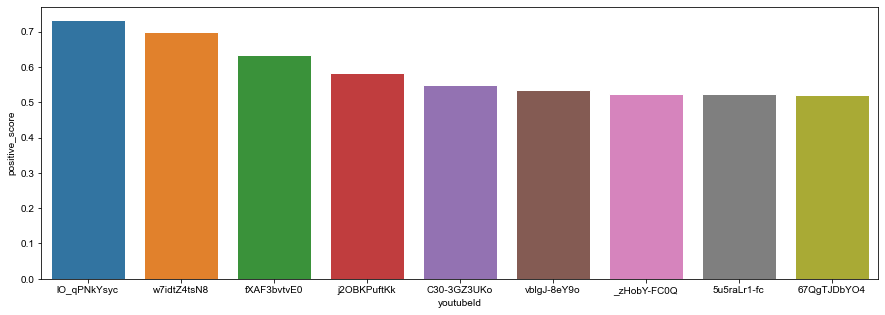

In [11]:
import seaborn as sns
import matplotlib.pyplot as plt
fig_dims = (15,5)
fig, ax = plt.subplots(figsize=fig_dims)
sns.set_style('ticks')
sns.barplot(x="youtubeId", y="positive_score", data=df1.sort_values(by=['positive_score'],ascending=False).head(10),ax=ax)

In [12]:
df1['negative_score']  = df1['polarity'].apply(lambda score_dict: score_dict['neg'] if score_dict else None)
df1

,youtubeId,movieid,comments,polarity,positive_score,negative_score
0,Rieq_TR7cV0,18,video disabled comments YouTubeException(statu...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0,0.0
1,DfqPjRMsRP0,19,video disabled comments YouTubeException(statu...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0,0.0
2,qPPUmzK5pPc,20,video disabled comments YouTubeException(statu...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0,0.0
3,yNLaTtpovys,21,video disabled comments YouTubeException(statu...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0,0.0
4,lsmXhM4yfU0,22,video disabled comments YouTubeException(statu...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0,0.0
...,...,...,...,...,...,...
171496,#NAME?,131252,video disabled comments YouTubeException(statu...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0,0.0
171497,DK7KQ-gEdl4,131256,video disabled comments YouTubeException(statu...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0,0.0
171498,v29P-wchMZQ,131258,video disabled comments YouTubeException(statu...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0,0.0
171499,dAz-nZ65jYU,131260,video disabled comments YouTubeException(statu...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0,0.0


In [13]:
df1.sort_values(by=['negative_score'],ascending=False).head(10)

,youtubeId,movieid,comments,polarity,positive_score,negative_score
147381,H3ZEYe-qYrI,1596,"['No surprise no one gave a shit about this, i...","{'neg': 0.382, 'neu': 0.526, 'pos': 0.092, 'co...",0.092,0.382
147274,YrMM2d20cAw,1473,['This is one of the worst moves I&#39;ve had ...,"{'neg': 0.333, 'neu': 0.667, 'pos': 0.0, 'comp...",0.000,0.333
145677,pg-GMqPHIPQ,36,"['1:48', 'Sean is an amaZing actor.', ""Brillia...","{'neg': 0.284, 'neu': 0.61, 'pos': 0.106, 'com...",0.106,0.284
145913,pg-GMqPHIPQ,36,"['<a href=""https://www.youtube.com/watch?v=pg-...","{'neg': 0.283, 'neu': 0.611, 'pos': 0.106, 'co...",0.106,0.283
145811,pg-GMqPHIPQ,36,"['<a href=""https://www.youtube.com/watch?v=pg-...","{'neg': 0.283, 'neu': 0.611, 'pos': 0.106, 'co...",0.106,0.283
145889,pg-GMqPHIPQ,36,"['<a href=""https://www.youtube.com/watch?v=pg-...","{'neg': 0.283, 'neu': 0.611, 'pos': 0.106, 'co...",0.106,0.283
145758,pg-GMqPHIPQ,36,"['<a href=""https://www.youtube.com/watch?v=pg-...","{'neg': 0.283, 'neu': 0.611, 'pos': 0.106, 'co...",0.106,0.283
145851,1AeAvE3FxQ8,76,"['not a bad idea, could use a bit better writt...","{'neg': 0.282, 'neu': 0.484, 'pos': 0.234, 'co...",0.234,0.282
145953,1AeAvE3FxQ8,76,"['not a bad idea, could use a bit better writt...","{'neg': 0.282, 'neu': 0.484, 'pos': 0.234, 'co...",0.234,0.282
146942,1cvCn5T4Zac,1115,"['reee', 'Killer Rock n Roll! Love the Vibe! T...","{'neg': 0.256, 'neu': 0.524, 'pos': 0.22, 'com...",0.220,0.256
